In [1]:
import drag_functions_turb as fn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from time_TvsR import *
from matplotlib.ticker import MultipleLocator
import scipy.optimize as opt
from matplotlib.colors import LogNorm
from cycler import cycler
from PebAcc_Turb import *
from matplotlib import cm

%matplotlib inline

colors = ['#4D4D4D','#5DA5DA', '#FAA43A', '#60BD68', '#F17CB0','#B2912F','#B276B2','#DECF3F','#F15854']
          # (black), (blue), (orange), (green), (pink), (brown), (purple), (yellow), (red)
mpl.rcParams['axes.prop_cycle'] = cycler(color=colors)

# Use my functions to reproduce Mickey's plots

In [2]:
#Disk surface density parameters
m_star = 0.1
sig_0 = 500.
r_crit = 30.

def disk_sigma(r=1., sigma0=500., rcrit=100.):
    r_c = rcrit
    gamma = 1.
    sigma = sigma0*((r/r_c)**(-gamma))*np.exp(-(r/r_c)**(2-gamma))
    return sigma

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in double_scalars
  if __name__ == '__main__':


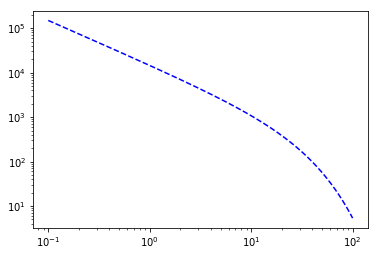

In [3]:
r_arr = np.linspace(0,100, 1000)
sig_arr = np.zeros(r_arr.shape)
for i in range(r_arr.shape[0]):
    sig_arr[i] = disk_sigma(r_arr[i], rcrit=r_crit)
plt.loglog(r_arr, sig_arr, 'b--')

In [4]:
#Read in parameters from Diana

gas_to_dust = np.loadtxt("star1_age1_sigma1_rcrit1_fd_parsed.txt").T
s_arr = np.loadtxt("star1_age1_sigma1_rcrit1_sizes.txt").T
a_au_arr = gas_to_dust[0]
alpha_arr = [1e-5,1e-4,1e-3,1e-2] 
t_grow_arr = np.zeros((len(alpha_arr),len(a_au_arr)))
t_grow_arr_2 = np.zeros((len(alpha_arr),len(a_au_arr)))
st_arr = np.zeros((len(alpha_arr),len(a_au_arr)))
st_arr_2 = np.zeros((len(alpha_arr),len(a_au_arr)))

In [5]:
print(s_arr.shape) # 10 to 100 (AU), 246 to 10.4
print(gas_to_dust.shape) # 10 to 100 (AU), 0.017 to 1.6, 3.7e-3 to 0.5, 1.17e-3 to 0.16, 3.7e-4 to 0.05

(2, 100)
(5, 100)


In [6]:
m_earths = 1e-2
T_0 = 14.9265380168

for i,alpha in enumerate(alpha_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[i+1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[1,j]*1e-1
        t_grow_arr[i,j],st_arr[i,j] = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')

In [7]:
t_disk = 1e6 * 3e7
for j,a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = fn.vkep(0.1*fn.m_sun, a_au*fn.au)
    v_0 = fn.eta(c_s, v_k) * v_k
    St = (a_au*fn.au)/(2 * v_0 * t_disk)
#    print(St, st_arr[1,j])

In [8]:
m_earths = 1e-2
T_0 = 14.9265380168

for i, alpha in enumerate(alpha_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[i+1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[1,j]*1e-1
        core = Core(a_core_au=a_au, m_core_earthmasses=m_earths, alpha=alpha, m_star_solarmasses=m_star, temp_in = temp,
                sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_2[i,j] = core.t_acc
        st_arr_2[i,j] = core.stl

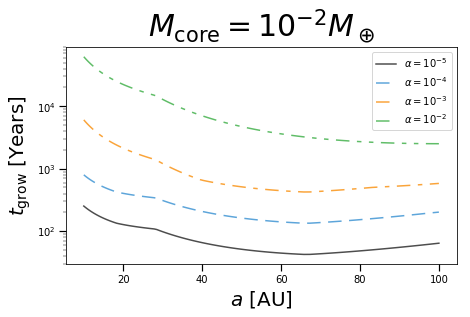

In [9]:
fig = plt.figure(1,figsize=(7,4))

style_arr = [None] * len(alpha_arr)
style_arr[0] = []

for i in range(len(alpha_arr)-1):
    style_add = [3,5] if i else [9,5]
    style_arr[i+1] = style_arr[i] + style_add

line_list = []

for i in range(len(alpha_arr)):
    line_list.append(plt.semilogy(a_au_arr,t_grow_arr[i],label=r'$\alpha = 10^{%.3g}$' %np.log10(alpha_arr[i])))
#     plt.loglog(r_arr,ke_arr[i],linestyle="dashed",color=line.get_color())

for i in range(len(alpha_arr)):
    line_list[i][0].set_dashes(style_arr[i])

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$a$ [AU]",fontsize=20)
plt.ylabel(r"$t_{\rm{grow}}$ [Years]",fontsize=20)

plt.title(r"$M_{\rm{core}} = 10^{%.3g} M_\oplus$" %np.log10(m_earths),y=1.02,fontsize=30)


# plt.axis([3e-2,1e3,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)


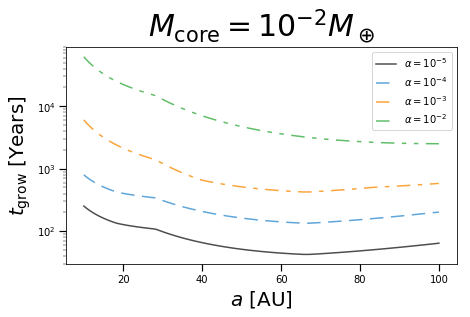

In [10]:
# Same thing, but now with my code
fig = plt.figure(1,figsize=(7,4))

style_arr = [None] * len(alpha_arr)
style_arr[0] = []

for i in range(len(alpha_arr)-1):
    style_add = [3,5] if i else [9,5]
    style_arr[i+1] = style_arr[i] + style_add

line_list = []

for i in range(len(alpha_arr)):
    line_list.append(plt.semilogy(a_au_arr,t_grow_arr_2[i],label=r'$\alpha = 10^{%.3g}$' %np.log10(alpha_arr[i])))
#     plt.loglog(r_arr,ke_arr[i],linestyle="dashed",color=line.get_color())

for i in range(len(alpha_arr)):
    line_list[i][0].set_dashes(style_arr[i])

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$a$ [AU]",fontsize=20)
plt.ylabel(r"$t_{\rm{grow}}$ [Years]",fontsize=20)

plt.title(r"$M_{\rm{core}} = 10^{%.3g} M_\oplus$" %np.log10(m_earths),y=1.02,fontsize=30)


# plt.axis([3e-2,1e3,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)


In [11]:
T_0 = 14.9265380168

m_arr = np.logspace(-26,2,num=len(a_au_arr))

a_guess = 20.
index = np.where(a_au_arr<a_guess)[0][-1]
a_au = a_au_arr[index]
#a_au = 1

alpha_arr = [1e-5,1e-4,1e-3,1e-2]
t_grow_arr = np.zeros((len(alpha_arr),len(m_arr)))
st_arr = np.zeros((len(alpha_arr),len(m_arr)))

for i,alpha in enumerate(alpha_arr):
    for j,m_earths in enumerate(m_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[i+1,index]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[1,index]*1e-1 # Sizes given in mm, convert to cm
        t_grow_arr[i,j],st_arr[i,j] = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')

In [12]:
T_0 = 14.9265380168

m_arr = np.logspace(-26,2,num=len(a_au_arr))

a_guess = 20.
index = np.where(a_au_arr<a_guess)[0][-1]
a_au = a_au_arr[index]
#a_au = 1

alpha_arr = [1e-5,1e-4,1e-3,1e-2]
t_stop_arr = np.zeros((len(alpha_arr),len(m_arr)))
t_grow_arr_2 = np.zeros((len(alpha_arr),len(m_arr)))
st_arr_2 = np.zeros((len(alpha_arr),len(m_arr)))
v_c_g_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_obj_core_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_obj_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_inf_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_cross_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_obj_phi_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_core_phi_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_phi_lam_arr = np.zeros((len(alpha_arr),len(m_arr)))
v_phi_lam_core_arr = np.zeros((len(alpha_arr),len(m_arr)))
w_enc_arr = np.zeros((len(alpha_arr),len(m_arr)))
m_obj_arr = np.zeros((len(alpha_arr),len(m_arr)))
for i,alpha in enumerate(alpha_arr):
    for j,m_earths in enumerate(m_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[i+1,index]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[1,index]*1e-1 # Sizes given in mm, convert to cm
        core = Core(a_core_au=a_au, m_core_earthmasses=m_earths, alpha=alpha, m_star_solarmasses=m_star, temp_in = temp,
                sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        eta = core.eta
        t_stop_arr[i,j] = core.t_s_core
        t_grow_arr_2[i,j] = core.t_acc
        v_c_g_arr[i,j] = core.v_core_gas
        st_arr_2[i,j] = core.stl
        #v_obj_arr[i,j] = core.v_obj
        v_obj_core_arr[i,j] = core.v_obj_core
        v_inf_arr[i,j] = core.v_inf
        v_cross_arr[i,j] = core.v_cross
        v_obj_phi_arr[i,j] = core.v_obj_phi
        v_core_phi_arr[i,j] = core.v_core_phi
        v_phi_lam_arr[i,j] = core.v_phi_lam
        v_phi_lam_core_arr[i,j] = core.v_phi_lam_core
        w_enc_arr[i,j] = core.work_enc
        m_obj_arr[i,j] = core.m_obj

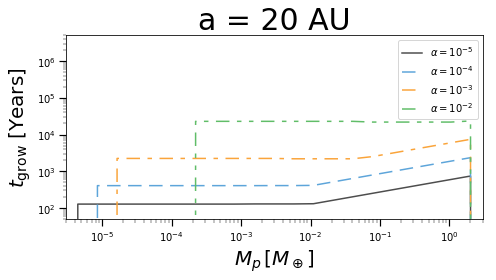

In [13]:
fig = plt.figure(1,figsize=(7,4))

style_arr = [None] * len(alpha_arr)
style_arr[0] = []

for i in range(len(alpha_arr)-1):
    style_add = [3,5] if i else [9,5]
    style_arr[i+1] = style_arr[i] + style_add

line_list = []

for i in range(len(alpha_arr)):
    line_list.append(plt.loglog(m_arr,t_grow_arr[i],label=r'$\alpha = 10^{%.3g}$' %np.log10(alpha_arr[i])))
#     plt.loglog(r_arr,ke_arr[i],linestyle="dashed",color=line.get_color())

for i in range(len(alpha_arr)):
    line_list[i][0].set_dashes(style_arr[i])

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$M_p \, [M_\oplus]$",fontsize=20)
plt.ylabel(r"$t_{\rm{grow}}$ [Years]",fontsize=20)

plt.title('a = 20 AU',fontsize=30)


plt.axis([3e-6,3e0,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)

plt.tight_layout()

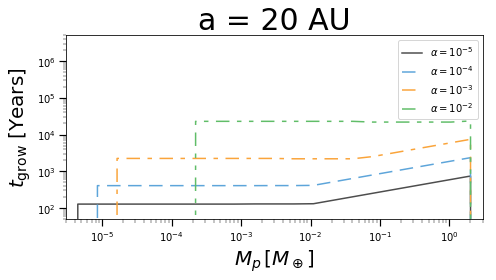

In [14]:
# Now for my code:
fig = plt.figure(1,figsize=(7,4))

style_arr = [None] * len(alpha_arr)
style_arr[0] = []

for i in range(len(alpha_arr)-1):
    style_add = [3,5] if i else [9,5]
    style_arr[i+1] = style_arr[i] + style_add

line_list = []

for i in range(len(alpha_arr)):
    line_list.append(plt.loglog(m_arr,t_grow_arr_2[i],label=r'$\alpha = 10^{%.3g}$' %np.log10(alpha_arr[i])))
#     plt.loglog(r_arr,ke_arr[i],linestyle="dashed",color=line.get_color())

for i in range(len(alpha_arr)):
    line_list[i][0].set_dashes(style_arr[i])

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$M_p \, [M_\oplus]$",fontsize=20)
plt.ylabel(r"$t_{\rm{grow}}$ [Years]",fontsize=20)

plt.title('a = 20 AU',fontsize=30)


plt.axis([3e-6,3e0,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)

plt.tight_layout()

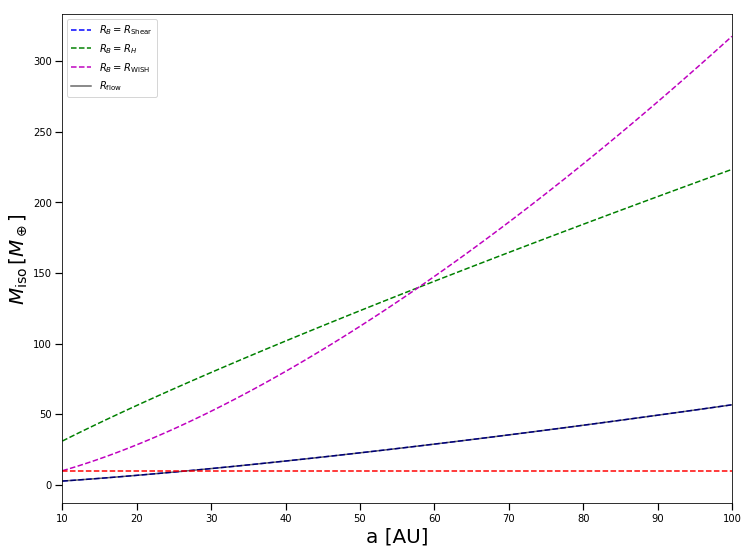

In [15]:
# Try to make flow iso as a fn of semi-major axis
gas_to_dust = np.loadtxt("star1_age1_sigma1_rcrit1_fd_parsed.txt").T
s_arr = np.loadtxt("star1_age1_sigma1_rcrit1_sizes.txt").T
a_au_arr = gas_to_dust[0]
T_0 = 14.9265380168
m_star = 0.1
sig_0 = 500.
r_crit = 30.
alpha_arr = [1e-5,1e-4,1e-3,1e-2]
alpha = 1e-6
t_disk = 1e6 * 3e7

m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    v_0 = fn.eta(c_s, v_k) * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    #print(c_s/v_g)
    St = (a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])
    #min1 = np.minimum(np.sqrt(3 * St), 1)
    #pre_fac = np.minimum((np.sqrt(3) * c_s * St)/v_g, min1)
    #m_flow_arr[i] = pre_fac * 160 * (a_au/30)**(3/4)

fig = plt.figure(1,figsize=(12,9))

plt.plot(a_au_arr, m_flow_arr[:,1], 'b--', label=r"$R_{B} = R_\mathrm{Shear}$")
plt.plot(a_au_arr, m_flow_arr[:,2], 'g--', label=r"$R_{B} = R_{H}$")
plt.plot(a_au_arr, m_flow_arr[:,3], 'm--', label=r"$R_{B} = R_\mathrm{WISH}$")
plt.plot(a_au_arr, m_flow_arr[:,0], 'k-', alpha=0.6, label=r"$R_\mathrm{flow}$")
plt.plot(a_au_arr, 10*np.ones(a_au_arr.shape), 'r--')
plt.ylabel(r"$M_\mathrm{iso} \, [M_\oplus]$", size=20)
plt.xlabel("a [AU]", size=20)
plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)
plt.xlim(10,100)
#plt.ylim(0,5)
plt.legend()

In [16]:
# Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
gas_to_dust = np.loadtxt("star1_age1_sigma1_rcrit1_fd_parsed.txt").T
s_arr = np.loadtxt("star1_age1_sigma1_rcrit1_sizes.txt").T
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-20, 2, 1000)
T_0 = 14.9265380168
m_star = 0.1
sig_0 = 500.
r_crit = 30.
alpha_arr = [1e-5,1e-4,1e-3,1e-2]
alpha = 1e-6
t_disk = 1e6 * 3e7

t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
st_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_b_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_ws_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_h_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_sh_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_acc_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
rate_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[1+1,j]*sig_gas
        #sig_gas = 10*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_earths, temp_in=temp, sig_in=sig_gas)
        #s = s_arr[1,j]*1e-1
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        st_arr_cb[i,j] = core.stl
        r_b_arr_cb[i,j] = core.r_bondi
        r_ws_arr_cb[i,j] = core.r_ws
        r_h_arr_cb[i,j] = core.r_hill
        r_sh_arr_cb[i,j] = core.r_sh
        r_acc_arr_cb[i,j] = core.r_acc
        #print((St - core.stl)/St)
        rate_arr_cb[i,j] = m_c/(t_grow_arr_cb[i,j]/fn.sec_to_years)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:47: RuntimeWarning: divide by zero encountered in double_scalars


30.538555088334157


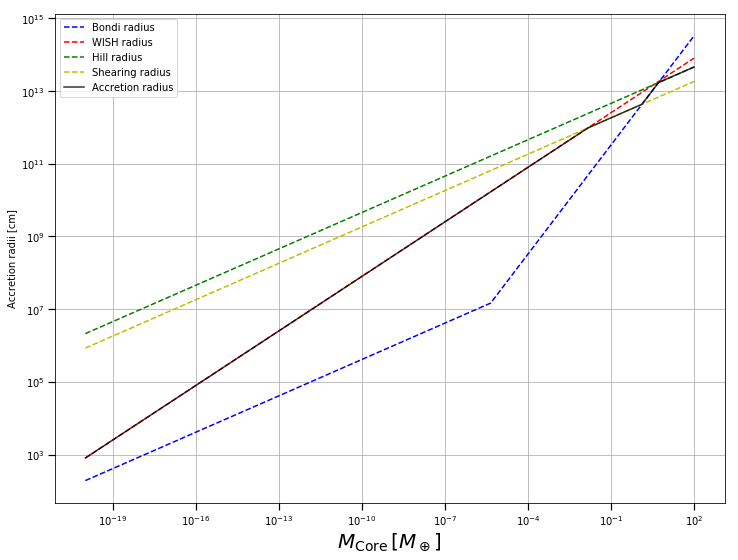

In [17]:
#print(m_core_arr[833])
print(a_au_arr[48])

fig = plt.figure(1,figsize=(12,9))
plt.loglog(m_core_arr, r_b_arr_cb[:,48], 'b--', label="Bondi radius")
plt.loglog(m_core_arr, r_ws_arr_cb[:,48], 'r--', label="WISH radius")
plt.loglog(m_core_arr, r_h_arr_cb[:,48], 'g--', label="Hill radius")
plt.loglog(m_core_arr, r_sh_arr_cb[:,48], 'y--', label="Shearing radius")
plt.loglog(m_core_arr, r_acc_arr_cb[:,48], 'k-', alpha=0.8, label="Accretion radius")
plt.xlabel(r"$M_\mathrm{Core} \, [M_\oplus]$", size=20)
plt.ylabel("Accretion radii [cm]")
#plt.xlabel("a [AU]", size=20)
plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)
#plt.xlim(0,20)
#plt.ylim(0,4e13)
plt.legend()
plt.grid()
plt.show()

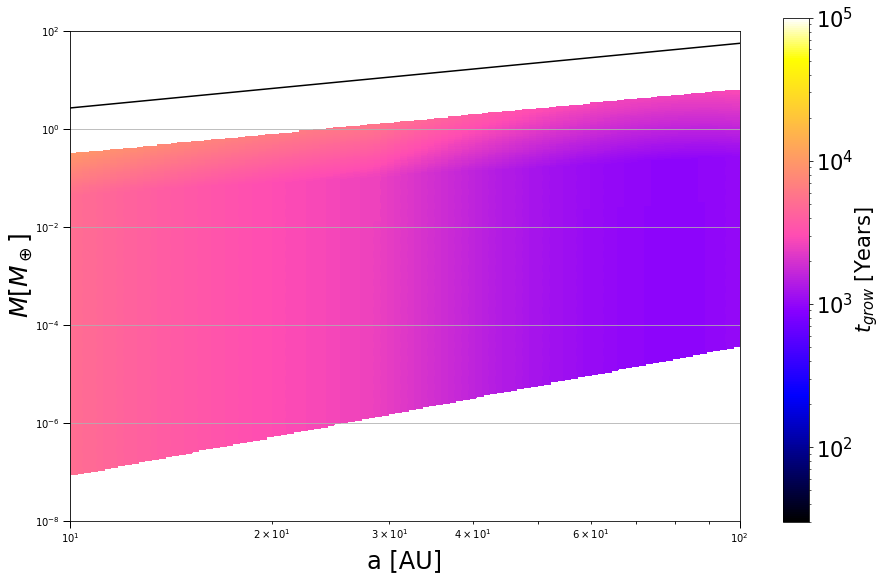

In [18]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=3e1,vmax=1e5)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

In [19]:
def rate_odeint_orig(m,t,p):
    alph,a_au,m_suns,temp,sig_gas,sig_p,st,verbose,verb_t = p
    
    cs = np.sqrt(fn.k*temp/fn.mu)
    vth = np.sqrt(8./np.pi)*cs
    om = np.sqrt(fn.G*m_suns*fn.m_sun/(a_au*fn.au)**3.)
    H_g = cs/om
    rho_g = sig_gas/2./H_g
    rho_s = 2.
    vk = a_au*fn.au*om
    v0 = cs**2./2./vk
    s = st_solver(st=st,alph=alph,a_au=a_au,sig_in = sig_gas,temp_in=temp,m_earths=m/fn.m_earth)
    
    rp = (3*m/4./np.pi/rho_s)**(1./3.)
    v_esc = np.sqrt(2*fn.G*m/rp)

    H_turb = np.sqrt(alph/(alph+st))*H_g
    H_KH = 2*v0/om
    H_p = max(H_turb,H_KH)
    rho_solid = sig_p/2./H_p
    v_turb = np.sqrt(alph)*cs/np.sqrt(1+st)
    v_lam = v0*np.sqrt(1+4.*st**2.)/(1+st**2.)
    v_inf = max(v_turb,v_lam)
    bGF = rp*(1+(v_esc/v_inf)**2.)**(0.5)
    H_acc = min(H_p,bGF)
    sig_acc = 4*bGF*H_acc
    rate_GF = rho_solid*sig_acc*v_inf
    
    m_earths = m/fn.m_earth
    rate_peb = TvsR_sng(alph=alph,a_au=a_au,m_suns=m_suns,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='rate')*fn.sec_to_years #ISNT THIS ALREADY IN YRS?
    
    tmp,r_ws,h_r,b_r,b_shear = TvsR_sng(alph=alph,a_au=a_au,m_suns=m_suns,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='len')
    
    r_tmp = min(r_ws,b_shear)
    r_stab = min(r_tmp,h_r)
    
#     if r_stab < b_r:
#         return 0
    if bGF > r_stab:
        rate = rate_GF
    else:
        rate = rate_peb
#     rate = rate_peb + rate_GF
    if verbose:
#         print alph,a_au,m_suns,s,m_earths,temp,sig_gas,sig_p
        print(rate_peb, rate_GF)
#     elif verb_t:
#         print m/rate_peb, m/rate_GF
#     if m > 100*5.976e27: #100 earth masses
#         return 0
#     else:
    return rate

In [20]:
def rate_odeint(m,t,p):
    alph,a_au,m_suns,temp,sig_gas,sig_p,st,verbose,verb_t = p
    cs = fn.sound_speed(temp)
    vth = fn.therm_vel(cs)
    om = fn.omega(m_suns*fn.m_sun, a_au*fn.au)
    H_g = cs/om
    rho_g = sig_gas/2./H_g
    rho_s = 2.
    vk = a_au*fn.au*om
    v0 = cs**2./2./vk
    m_earths = m/fn.m_earth
    st = (a_au*fn.au)/(2 * v_g * t)
    s = st_solver(st=st,alph=alph,a_au=a_au,sig_in=sig_gas,temp_in=temp,m_earths=m_earths)
    if np.isnan(s) or s < 0 or m < 0:
        print("Bad radius/mass")
        s = np.abs(s)
        m = np.abs(m)
    
    rp = (3*m/4./np.pi/rho_s)**(1./3.)
    v_esc = np.sqrt(2*fn.G*m/rp)

    H_turb = np.sqrt(alph/(alph+st))*H_g
    H_KH = 2*v0/om
    H_p = max(H_turb,H_KH)
    rho_solid = sig_p/2./H_p
    v_turb = np.sqrt(alph)*cs/np.sqrt(1 + st)
    v_lam = v0*np.sqrt(1 + 4.*st**2.)/(1 + st**2.)
    v_inf = max(v_turb,v_lam)
    bGF = rp*(1 + (v_esc/v_inf)**2.)**(0.5)
    H_acc = min(H_p,bGF)
    sig_acc = 4*bGF*H_acc
    rate_GF = rho_solid*sig_acc*v_inf

    core = Core(a_core_au=a_au, m_core_earthmasses=m_earths, alpha=alph, m_star_solarmasses=m_suns, temp_in=temp,
                sig_p_in=sig_p, sig_g_in=sig_gas)
    core.main(s)
    rate_peb = m/(core.t_acc/fn.sec_to_years)
    r_ws = core.r_ws
    h_r = core.r_hill
    b_r = core.r_bondi
    b_shear = core.r_sh
    r_tmp = min(r_ws,b_shear)
    r_stab = min(r_tmp,h_r)
    if bGF > r_stab:
        rate = rate_GF
        if np.isinf(rate_GF):
            print("Gravitational Focussing is broken")
    else:
        rate = rate_peb
        if np.isinf(rate_peb):
            print("Pebble accretion is off")
            rate = rate_GF
#     rate = rate_peb + rate_GF
    #print(rate_peb, rate_GF)
    return rate

In [21]:
a_au = a_au_arr[30]
M_dot = 1e-7 # Not sure how Mickey chose this
m_star = 1#0.1
L_star = 1#0.23 * (m_star**2.3)

sig_gas = disk_sigma(r=a_au, sigma0=500., rcrit = 30.)

T_visc = 233.*(M_dot/1e-8)**(1./4.)*m_star**(1./4.)*(a_au)**(-1.)*(sig_0/3000)**(1./4.) #From flow_iso_scratch notebook
T_irr = 150.*(L_star)**(2./7.)*m_star**(-1./7.)*a_au**(-3./7.)
T = max(T_visc,T_irr)

sig_p = 5.*a_au**(-1.)

a_cgs = a_au*fn.au
m_star_cgs = m_star*fn.m_sun

c_s = np.sqrt(fn.k*T/fn.mu)
om = np.sqrt(fn.G*m_star_cgs/a_cgs**3.)
vk = a_cgs*om
v_lam = c_s**2./2./vk
H = c_s/om

alpha = 1e-4 #(M_dot*fn.m_sun/3.154e7)/(3*np.pi*sig_gas*c_s*H)

v_turb = np.sqrt(alpha)*c_s

v_gas = np.sqrt(v_lam**2. + v_turb**2.)
aspect = H/a_cgs

rho_g = sig_gas/2./H

mfp = fn.mu/rho_g/fn.cross

In [22]:
print(a_au_arr[30])
v_0 = fn.eta(c_s, vk) * vk
St = (a_au*fn.au)/(2 * v_0 * t_disk)

print(m_core_arr[250], m_core_arr[333], m_core_arr[417], m_core_arr[500])
print(m_core_arr[583], m_core_arr[666], m_core_arr[750])
print(st_arr_cb[250,30], st_arr_cb[333,30], st_arr_cb[417,30], st_arr_cb[500,30])
print(st_arr_cb[583,30], st_arr_cb[660,30], st_arr_cb[750,30])

20.09233002565047
3.20262069365765e-15 2.154434690031878e-13 1.524695727017576e-11 1.0256779307444208e-09
6.899837121430025e-08 4.641588833612773e-06 0.00032848573660300537
0.018873757581378364 0.018873757581378364 0.018873757581378364 0.018873757581378364
0.018873757581378364 0.018873757581378364 0.018873757581378364


In [23]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(3,6.5,num=int(1e5))/fn.sec_to_years

c_s = fn.sound_speed(T)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
v_0 = fn.eta(c_s, v_k) * v_k
v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
st = (a_au*fn.au)/(2 * v_g * times)

m_arr = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    print()
    p = [alpha,a_au,m_star,T,sig_gas,sig_p,st,1,0]
    wsol = odeint(rate_odeint,m0,times,args=(p,))
    m_arr[i] = wsol.flatten()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in true_divide





Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accret

Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion is off
Pebble accretion

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/tight_layout.py:176: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  warnings.warn('Tight layout not applied. The left and right margins '


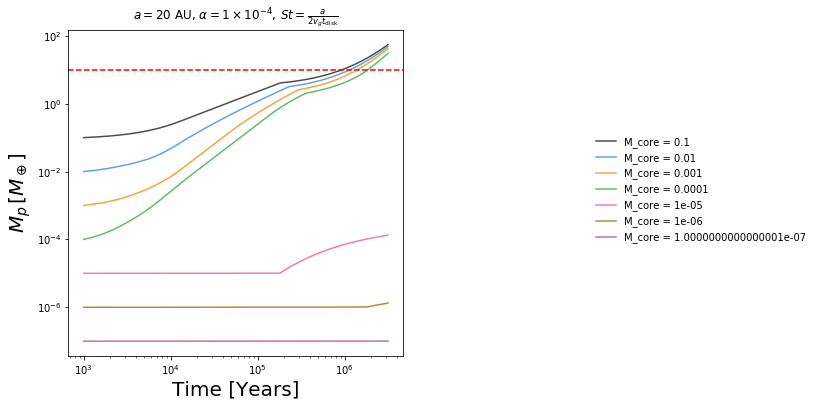

In [24]:
fig = plt.figure(figsize=(6,6))

# labels = [r'$M_0 = 10^{-7} M_\oplus$',r'$M_0 = 10^{-6} M_\oplus$',r'$M_0 = 10^{-5} M_\oplus$']

for i in range(len(m0_arr)):
    plt.loglog(times*fn.sec_to_years,m_arr[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    
# plt.ylim([1e-8,1e2])
plt.xlabel('Time [Years]',fontsize=20)
plt.ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)

plt.axhline(y=1e1,linestyle='dashed',color='r')

lgd = plt.gca().legend(bbox_to_anchor=[1.55,0.70],frameon=False)

plt.title(r'$a = 20$ AU, $\alpha = 1 \times 10^{-4}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
#plt.ylim(1e-6,1e2)
plt.tight_layout()

47.405717210858874 1.5801905736952957


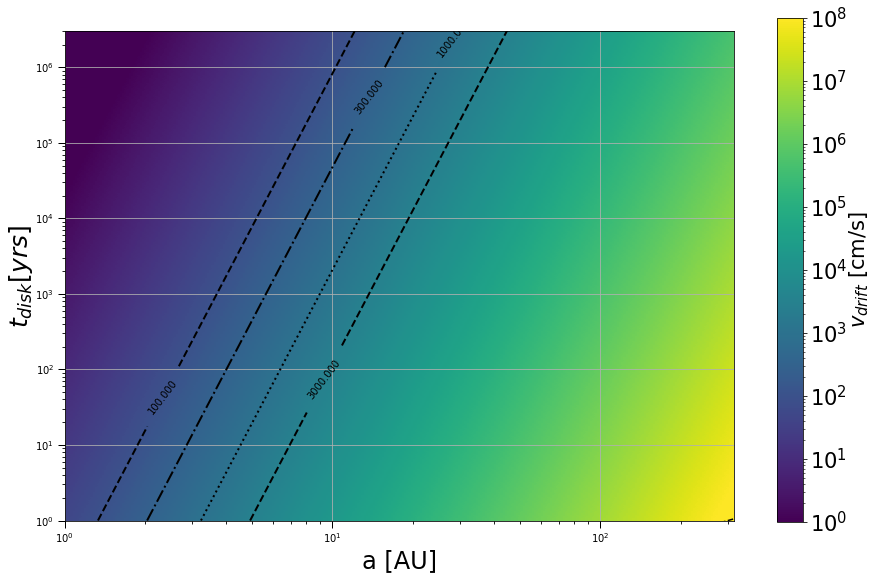

In [25]:
# When and where is a disk drift dominated?
v_frag = 3e2 #cm/s
a_arr_frag = np.logspace(0,2.5, 300)
tdisk_arr_frag = np.logspace(6.5, 0, 300)
#print(tdisk_arr_frag)
v_frag_arr = np.zeros([a_arr_frag.size, tdisk_arr_frag.size])

for i, a in enumerate(a_arr_frag):
    for j, t in enumerate(tdisk_arr_frag):
        v = (a * fn.au)/(t/fn.sec_to_years)
        #if v < v_frag:
        #    v = 0
        v_frag_arr[i,j] = v

print((1 * fn.au)/(1e4/fn.sec_to_years), (10 * fn.au)/(3e6/fn.sec_to_years))

fig = plt.figure(1,figsize=(12,9))
cmap = 'viridis' #'gnuplot2'
X, Y = np.meshgrid(a_arr_frag, tdisk_arr_frag)
im = plt.pcolormesh(X,Y,v_frag_arr, cmap=cmap,norm=LogNorm(),vmin=1,vmax=1e8)
cont = plt.contour(X, Y,v_frag_arr,levels = [1e2, 3e2, 1e3, 3e3], colors=('k',),linestyles=('--','-.',':',),linewidths=(2,))
plt.loglog(a_arr_frag, a_arr_frag/v_frag, 'k--')
plt.grid()

im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$t_{disk} [yrs]$',fontsize=25,labelpad=0.03)
ax.clabel(cont, inline=1, fontsize=10)
        
ax.set_ylim(1,3e6)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap)
cb.set_label(label=r'$v_{drift}$ [cm/s]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

## Now, making better fragmentation plot

In [26]:
def d_V_12(t_1=1.,t_2=1.,t_L=1,Re=1e8):
    """Function for reproducing Eqn. (16) in OC07. Might need to add more input parameters"""
    t_eta = Re**(-0.5)*t_L
    if (t_1 <= t_eta) and (t_2 <= t_eta):
        return np.sqrt(t_L / t_eta * (t_1 - t_2)**2)
    elif (t_1 > t_eta) and (t_1 < t_L):
        y_a = 1.6
        eps = t_1 / t_2
        #print("This is the intermediate regime. Don't use it!")
        return np.sqrt(2 * y_a - (1 + eps) + 2/(1 + eps) * (1/(1 + y_a) + eps**3/(y_a + eps))) * np.sqrt(t_1)
    elif (t_1 >= t_L):
        return np.sqrt(1/(1 + t_1) + 1/(1 + t_2))
    else:
        print("Something's broken. Probably an issue with St_core.", t_1, t_eta)#, t_eta, t_1, t_2)
        return np.sqrt(1/(1 + t_1) + 1/(1 + t_2))

In [27]:
# Collect all relevant time-scales: t_grow, t_drift, t_frag, t_PebFront (maybe)
from scipy.special import erf
#a = 30 #AU
m_star = 1 #Solar masses
alph = 1e-3 #Turbulence parameter
f_d = 0.01 #Dust to gas ratio
eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
rho_s = 5.51
v_frag = 1e3 # Choosing v_frag = 10 m/s
f_f = 0.5 # Order unity constant from Birnstiel et al. 2012 eqn 8

a_array = np.logspace(-1,2.5,300)
m_array = np.logspace(-32,0,300)
ratio_array = np.logspace(-20,1,300)
t_arr = np.zeros([a_array.size, m_array.size, ratio_array.size, 5])
s_DEG = np.zeros([a_array.size, m_array.size]) # Drift Equals Grow
s_frag = np.zeros(a_array.size)

for k, a in enumerate(a_array):
    om = fn.omega(m_star*fn.m_sun, a*fn.au)
    T = fn.temp(a*fn.au)
    c_s = fn.sound_speed(T)
    v_th = ((8./np.pi)**.5)*c_s
    H = fn.scale_height(c_s, om)
    Sig = fn.surf_dens(a*fn.au) #Gaseous surface density
    v_kep = fn.vkep(m_star*fn.m_sun, a*fn.au)
    rho_g = fn.gas_density(Sig, H)
    
    for j, M in enumerate(m_array):
        # Initializes the core objects
        core = Core(a_core_au=a, m_core_earthmasses=M, alpha=alph, m_star_solarmasses=1, gas_dep=1,
                    sol_gas_ratio=.01, rho_core=rho_s)
        m_core = M * fn.m_earth
        r_core = ((3 * m_core)/(4 * np.pi * rho_s))**(1/3)
        v_esc = np.sqrt(2*fn.G*m_core/r_core)
        r_hill = fn.hill_rad(m_core, a*fn.au, m_star*fn.m_sun)

        for i, r in enumerate(ratio_array):
            s = r * r_core
            m = 4/3 * np.pi * s**3 * rho_s

            core.main(s, rho_obj=5.51, disp=0)
            St_1 = core.tau_s_core
            St_2 = core.tau_s
            #St_1 = st_rad(rad=r_core,alph=alph,a_au=a,m_suns=m_star,m_earths=M,sig_in=Sig,temp_in=T)
            #St_2 = st_rad(rad=s,alph=alph,a_au=a,m_suns=m_star,m_earths=M,sig_in=Sig,temp_in=T)
            H_KH = core.H_KH #H_KH = (H**2/a*fn.au) * min(1, 1/np.sqrt(St_2))

            n = f_d * Sig /(H_KH * m)
            sigma = core.area_acc #sigma = 4 * r_hill * H_KH
            v_phi_rel = eta * v_kep * abs(1/(1 + St_1**2) - 1/(1 + St_2**2))
            v_r_rel = 2 * eta * v_kep *(St_1/(1.+(St_1)**2.) - St_2/(1.+(St_2)**2.))
            v_rel = core.v_obj_core_lam #v_rel = np.sqrt(v_phi_rel**2 + v_r_rel**2)

            t_L = om**(-1)
            Re = core.re_f #fn.rey(r_core,v_rel,v_th,mfp) # Re << 1, which breaks d_V_12
            t_eta = Re**(-1/2) * t_L  
            v_turb = core.v_obj_core_turb #np.sqrt(alph)*c_s * d_V_12(t_1=St_1,t_2=St_2,t_L=1,Re=Re)
            v = core.v_obj_core #np.sqrt(v_rel**2 + v_turb**2)

            rho_bulk = f_d * Sig /(2 * H_KH)
            m_dot = rho_bulk * sigma * v

            t_drift = (a*fn.au)/(2 * St_1 * c_s**2/(2*v_kep)) #(a*fn.au/H)**2 * 1/(om * St)
            t_grow = core.t_acc #m_core/m_dot #(M*fn.m_earth)/(rho_g * f_d * Sig) * 1/(alph * c_s**2 * t_L/t_eta * (St_1 - St_2)**2)
            t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a * fn.au)**(3/2)
            t_coll = 1/(n * sigma * v)
            t_frag = t_coll / erf(v_frag/v) # Fragmentation time could come from t_collision ~ 1/(n sigma v) / prob(collision > v_frag)
            t_arr[k,j,i,0] = t_grow
            t_arr[k,j,i,1] = t_drift
            t_arr[k,j,i,2] = t_coll
            t_arr[k,j,i,3] = t_frag
            t_arr[k,j,i,4] = t_PF
        #print(r_core * ratio_array[np.argmin(abs(t_arr[k,j,:,0] - t_arr[k,j,:,1]))])
        s_DEG[k,j] = r_core * ratio_array[np.argmin(abs(t_arr[k,j,:,0] - t_arr[k,j,:,1]))]

    s_frag[k] = f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_s * alph * c_s**2)
    

In [28]:
# Evaluating the analytic results at 1 AU, where R_acc = R_H
a = 1 * fn.au
Sig_p = 1e-2 * fn.surf_dens(a)
M_star = 1 * fn.m_sun
rho_int = 2
print(np.sqrt(3/8 * Sig_p * a/rho_int))

3744970.0140655334


In [29]:
# Collect all relevant time-scales: t_grow, t_drift, t_frag, t_PebFront (maybe)
from scipy.special import erf
#a = 30 #AU
m_star = 1 #Solar masses
alph = 1e-3 #Turbulence parameter
f_d = 0.01 #Dust to gas ratio
eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
rho_s = 5.51
v_frag = 1e3 # Choosing v_frag = 10 m/s
f_f = 0.5 # Order unity constant from Birnstiel et al. 2012 eqn 8

a_array = np.logspace(-1,2.5,100)
m_array = np.logspace(-32,-6,100)
ratio_array = np.logspace(-4,0,100)
t_arr = np.zeros([a_array.size, m_array.size, ratio_array.size, 5])
s_DEG = np.zeros([a_array.size,2]) # Drift Equals Grow
s_frag = np.zeros(a_array.size)

for k, a in enumerate(a_array):
    om = fn.omega(m_star*fn.m_sun, a*fn.au)
    T = fn.temp(a*fn.au)
    c_s = fn.sound_speed(T)
    v_th = ((8./np.pi)**.5)*c_s
    H = fn.scale_height(c_s, om)
    Sig = fn.surf_dens(a*fn.au) #Gaseous surface density
    v_kep = fn.vkep(m_star*fn.m_sun, a*fn.au)
    rho_g = fn.gas_density(Sig, H)
    
    #print(st_solver(st=1, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=temp, sig_in=sig_gas))
    t_min_arr = np.zeros([m_array.size,2])
    for j, M in enumerate(m_array):
        # Initializes the core objects
        core = Core(a_core_au=a, m_core_earthmasses=M, alpha=alph, m_star_solarmasses=1, gas_dep=1,
                    sol_gas_ratio=.01, rho_core=rho_s)
        m_core = M * fn.m_earth
        r_core = ((3 * m_core)/(4 * np.pi * rho_s))**(1/3)
        v_esc = np.sqrt(2*fn.G*m_core/r_core)
        r_hill = fn.hill_rad(m_core, a*fn.au, m_star*fn.m_sun)

        for i, r in enumerate(ratio_array):
            s = r * r_core
            m = 4/3 * np.pi * s**3 * rho_s

            core.main(s, rho_obj=5.51, disp=0)
            St_1 = core.tau_s_core
            St_2 = core.tau_s
            St_1 = st_rad(rad=r_core,alph=alph,a_au=a,m_suns=m_star,m_earths=M,sig_in=Sig,temp_in=T)
            St_2 = st_rad(rad=s,alph=alph,a_au=a,m_suns=m_star,m_earths=M,sig_in=Sig,temp_in=T)
            H_KH = core.H_KH #H_KH = (H**2/a*fn.au) * min(1, 1/np.sqrt(St_2))

            n = f_d * Sig /(H_KH * m)
            sigma = core.area_acc #sigma = 4 * r_hill * H_KH
            v_phi_rel = eta * v_kep * abs(1/(1 + St_1**2) - 1/(1 + St_2**2))
            v_r_rel = 2 * eta * v_kep *(St_1/(1.+(St_1)**2.) - St_2/(1.+(St_2)**2.))
            v_rel = core.v_obj_core_lam #v_rel = np.sqrt(v_phi_rel**2 + v_r_rel**2)

            t_L = om**(-1)
            Re = core.re_f #fn.rey(r_core,v_rel,v_th,mfp) # Re << 1, which breaks d_V_12
            t_eta = Re**(-1/2) * t_L  
            v_turb = core.v_obj_core_turb #np.sqrt(alph)*c_s * d_V_12(t_1=St_1,t_2=St_2,t_L=1,Re=Re)
            v = core.v_obj_core #np.sqrt(v_rel**2 + v_turb**2)

            rho_bulk = f_d * Sig /(2 * H_KH)
            m_dot = rho_bulk * sigma * v

            t_drift = (a*fn.au)/(2 * St_1 * c_s**2/(2*v_kep)) #(a*fn.au/H)**2 * 1/(om * St)
            t_grow = core.t_acc #m_core/m_dot #(M*fn.m_earth)/(rho_g * f_d * Sig) * 1/(alph * c_s**2 * t_L/t_eta * (St_1 - St_2)**2)
            t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a * fn.au)**(3/2)
            t_coll = 1/(n * sigma * v)
            t_frag = t_coll / erf(v_frag/v) # Fragmentation time could come from t_collision ~ 1/(n sigma v) / prob(collision > v_frag)
            t_arr[k,j,i,0] = t_grow
            t_arr[k,j,i,1] = t_drift
            t_arr[k,j,i,2] = t_coll
            t_arr[k,j,i,3] = t_frag
            t_arr[k,j,i,4] = t_PF
        # For core mass M, what is ratio where t_grow and t_drift are closest?
        t_min_ind = np.argmin(abs(t_arr[k,j,:,0] - t_arr[k,j,:,1]))
        t_min_arr[j,0] = t_arr[k,j,t_min_ind,0] - t_arr[k,j,t_min_ind,1] # Save minimum difference in times
        t_min_arr[j,1] = t_min_ind # Save index where difference is minimized
    # For distance a, what is M where t_grow and t_drift are closest?
    t_min_ind = np.argmin(abs(t_min_arr[:,0]))
    t_min = t_min_arr[t_min_ind,0] # Save minimum difference in times
    m_core = m_array[t_min_ind] * fn.m_earth # Pull core mass where t_grow and t_drift are closest
    r_core = ((3 * m_core)/(4 * np.pi * rho_s))**(1/3)
    r_part = ratio_array[int(t_min_arr[t_min_ind,1])] * r_core
    s_DEG[k,0] = r_core # Save large particle size where t_grow and t_drift are approx equal
    s_DEG[k,1] = r_part # Save smaller particle size as well
    
    #    if (abs(t_min/t_arr[k,j,t_min_ind,1]) < 0.001) and (s_DEG[k] == 0):
    #        print(t_min, t_arr[k,j,t_min_ind,:2], t_min/t_arr[k,j,t_min_ind,0])
    #        s_DEG[k] = r_core * ratio_array[np.argmin(abs(t_arr[k,j,:,0] - t_arr[k,j,:,1]))]
    #    elif (abs(t_min/t_arr[k,j,t_min_ind,1]) < 0.001):
    #        print('Updating!', t_min, t_arr[k,j,t_min_ind,:2], t_min/t_arr[k,j,t_min_ind,0])
    #        s_temp = r_core * ratio_array[np.argmin(abs(t_arr[k,j,:,0] - t_arr[k,j,:,1]))]
    #        s_DEG[k] = max(s_DEG[k], s_temp)

    #s_frag[k] = f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_s * alph * c_s**2)
    s_frag[k] = f_f * (2 * Sig)/(3 * np.pi * rho_s) * (v_frag**2)/(alph * c_s**2 + v**2)
    delta = 1
    while delta > 0.01:
        v_old = v
        core.main(s_frag[k], rho_obj=5.51, disp=0)
        v = core.v_obj_core
        s_frag[k] = f_f * (2 * Sig)/(3 * np.pi * rho_s) * (v_frag**2)/(alph * c_s**2 + v**2)
        delta = abs(v_old - v)/v

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:69: RuntimeWarning: divide by zero encountered in double_scalars
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:70: RuntimeWarning: divide by zero encountered in double_scalars


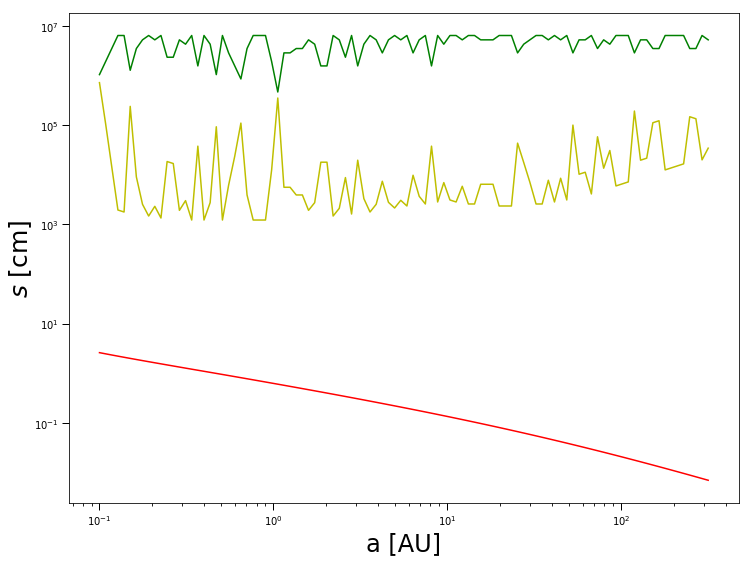

In [30]:
fig = plt.figure(1,figsize=(12,9))
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)     
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$s$ [cm]',fontsize=25,labelpad=0.03)
plt.loglog(a_array, s_DEG[:,0], 'g-', label='Drift limited size')
plt.loglog(a_array, s_DEG[:,1], 'y-', label='Smaller particle size')
plt.loglog(a_array, s_frag, 'r-', label='Fragmentation limited size')

In [31]:
# Let's try the 2D drift v frag plot
m_star = 1 #Solar masses
alph = 1e-4 #Turbulence parameter
f_d = 0.01 #Dust to gas ratio
eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
rho_s = 5.51
v_frag = 1e3 # Choosing v_frag = 10 m/s
f_f = 0.5 # Order unity constant from Birnstiel et al. 2012 eqn 8

a_array = np.logspace(-1,2.5,300)
m_array = np.logspace(-32,0,300)
t_arr = np.zeros([a_array.size, m_array.size, 5])
s_DEG = np.zeros([a_array.size]) # Drift Equals Grow
s_frag = np.zeros(a_array.size)

for k, a in enumerate(a_array):
    om = fn.omega(m_star*fn.m_sun, a*fn.au)
    T = fn.temp(a*fn.au)
    c_s = fn.sound_speed(T)
    v_th = ((8./np.pi)**.5)*c_s
    H = fn.scale_height(c_s, om)
    Sig = fn.surf_dens(a*fn.au) #Gaseous surface density
    v_kep = fn.vkep(m_star*fn.m_sun, a*fn.au)
    rho_g = fn.gas_density(Sig, H)
    
    for j, M in enumerate(m_array):
        # Initializes the core objects
        core = Core(a_core_au=a, m_core_earthmasses=M, alpha=alph, m_star_solarmasses=1, gas_dep=1,
                    sol_gas_ratio=.01, rho_core=rho_s)
        m_core = M * fn.m_earth
        r_core = ((3 * m_core)/(4 * np.pi * rho_s))**(1/3)
        v_esc = np.sqrt(2*fn.G*m_core/r_core)
        r_hill = fn.hill_rad(m_core, a*fn.au, m_star*fn.m_sun)
        St_1 = st_rad(rad=r_core,alph=alph,a_au=a,m_suns=m_star,m_earths=M,sig_in=Sig,temp_in=T)
        St_2 = 0.5 * St_1

        s = st_solver(st=St_2, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        m = 4/3 * np.pi * s**3 * rho_s

        core.main(s, rho_obj=5.51, disp=0)
        H_KH = core.H_KH

        n = f_d * Sig /(H_KH * m)
        sigma = core.area_acc #sigma = 4 * r_hill * H_KH
        v_phi_rel = eta * v_kep * abs(1/(1 + St_1**2) - 1/(1 + St_2**2))
        v_r_rel = 2 * eta * v_kep *(St_1/(1.+(St_1)**2.) - St_2/(1.+(St_2)**2.))
        v_rel = core.v_obj_core_lam #v_rel = np.sqrt(v_phi_rel**2 + v_r_rel**2)

        t_L = om**(-1)
        Re = core.re_f #fn.rey(r_core,v_rel,v_th,mfp) # Re << 1, which breaks d_V_12
        t_eta = Re**(-1/2) * t_L  
        v_turb = core.v_obj_core_turb #np.sqrt(alph)*c_s * d_V_12(t_1=St_1,t_2=St_2,t_L=1,Re=Re)
        v = core.v_obj_core #np.sqrt(v_rel**2 + v_turb**2)

        rho_bulk = f_d * Sig /(2 * H_KH)
        m_dot = rho_bulk * sigma * v

        t_drift = (a*fn.au)/(2 * St_1 * c_s**2/(2*v_kep)) #(a*fn.au/H)**2 * 1/(om * St)
        t_grow = core.t_acc #m_core/m_dot #(M*fn.m_earth)/(rho_g * f_d * Sig) * 1/(alph * c_s**2 * t_L/t_eta * (St_1 - St_2)**2)
        t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a * fn.au)**(3/2)
        t_coll = 1/(n * sigma * v)
        t_frag = t_coll / erf(v_frag/v) # Fragmentation time could come from t_collision ~ 1/(n sigma v) / prob(collision > v_frag)
        t_arr[k,j,0] = t_grow
        t_arr[k,j,1] = t_drift
        t_arr[k,j,2] = t_coll
        t_arr[k,j,3] = t_frag
        t_arr[k,j,4] = t_PF
    min_ind = np.argmin(abs(t_arr[k,:,0] - t_arr[k,:,1]))
    m_DEG = m_array[min_ind] * fn.m_earth
    #if abs((t_arr[k,min_ind,0] - t_arr[k,min_ind,1])/t_arr[k,min_ind,1]) < 0.05:
    #    print(k, "Actually equal!")
    s_DEG[k] = ((3 * m_DEG)/(4 * np.pi * rho_s))**(1/3)

    s_frag[k] = f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_s * alph * c_s**2)

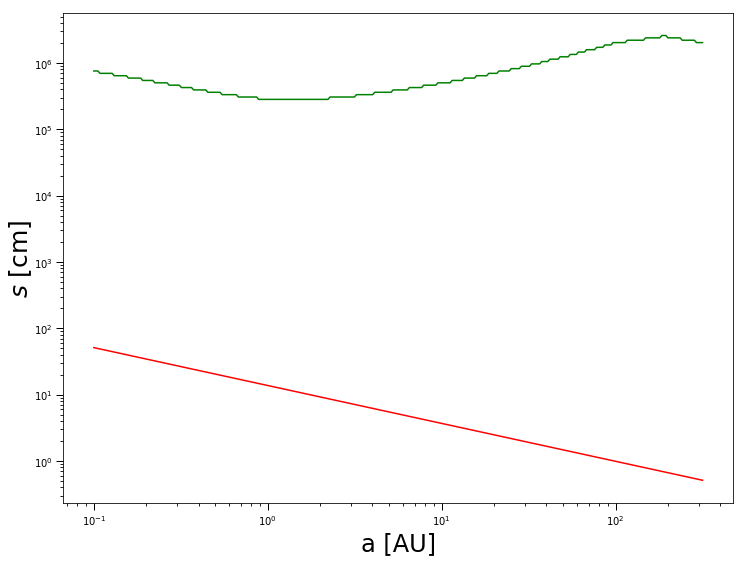

In [32]:
fig = plt.figure(1,figsize=(12,9))
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)     
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$s$ [cm]',fontsize=25,labelpad=0.03)
plt.loglog(a_array, s_DEG, 'g-', label='Drift limited size')
plt.loglog(a_array, s_frag, 'r-', label='Fragmentation limited size')

In [33]:
# TEMP: What is t_PF(20 AU), and t_PF(30 AU)?
print(a_array[133])
print(a_array[197])
print(a_array[212])
print(a_array[256])

print(t_arr[133, 0, 4]/3.15e7, " years at", a_array[133], " AU")
print(t_arr[197, 0, 4]/3.15e7, " years at 20 AU")
print(t_arr[212, 0, 4]/3.15e7, " years at 30 AU")
print(t_arr[256, 0, 4]/3.15e7, " years at 100 AU")

3.6045926041654357
20.2311265589745
30.311355015675762
99.23286228832545
5039.8275624079515  years at 3.6045926041654357  AU
67013.37589907667  years at 20 AU
122896.47409626134  years at 30 AU
727971.9976884401  years at 100 AU


In [34]:
s_DEG_norm = np.zeros(s_DEG.shape)
for k, a in enumerate(a_array):
    for j, M in enumerate(m_array):
        s_DEG_norm[k,j] = s_DEG[k,j]/s_frag[k]

IndexError: too many indices for array

ValueError: not enough values to unpack (expected 2, got 1)

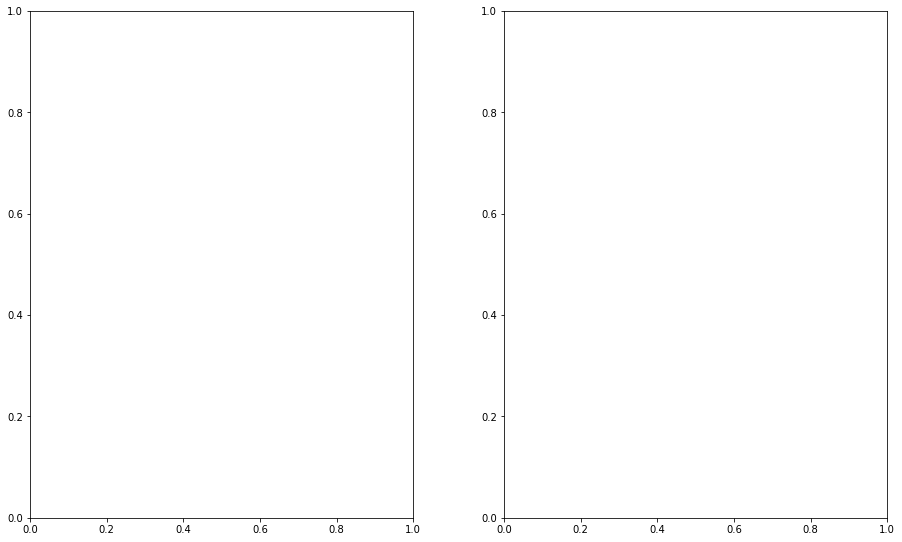

In [35]:
# Now, making the color bar plot!
# When and where is a disk drift dominated?
def convert_ax_r_to_St(ax):
    """
    Update second axis according with first axis.
    """
    y1, y2 = ax.get_ylim()
    r1 = (3 * y1*fn.m_earth/(4 * np.pi * 2))**(1/3)
    r2 = (3 * y2*fn.m_earth/(4 * np.pi * 2))**(1/3)
    ax_r.set_ylim(st_rad(r1), st_rad(r2))
    ax_r.figure.canvas.draw()

fig, axs = plt.subplots(1, 2, figsize=(14, 9))
fig.tight_layout(pad=6.0)
cmap = 'viridis' #'gnuplot2'
X, Y = np.meshgrid(a_array, m_array)
im1 = axs[0].pcolormesh(X,Y,s_DEG, cmap=cmap,norm=LogNorm(),vmin=1e-4,vmax=1e7)
plt.grid()

ax = axs[0]
im1.set_edgecolor('face')
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M_\mathrm{core} [M_{\oplus}]$',fontsize=25,labelpad=0.03)
ax.clabel(cont, inline=1, fontsize=10)
#ax.set_xscale('log')
#ax.set_yscale('log')

ax_r = ax.twinx()
ax.callbacks.connect("ylim_changed", convert_ax_r_to_St)
ax.set_ylim(1e-32,1e-20)
ax.set_xscale('log')
ax.set_yscale('log')
ax_r.set_yscale('log')
ax_r.set_ylabel(r'$St_{core}$',fontsize=25,labelpad=0.05)

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im1, ax=ax, cax=cax)
#cb = fig.colorbar(im, cax=cax,cmap=cmap)
cb.set_label(label=r'$s_\mathrm{Drift}$ [cm]',fontsize=21,labelpad=1)
cb.ax.tick_params(labelsize=21)

im2 = axs[1].pcolormesh(X,Y,s_DEG_norm, cmap=cmap,norm=LogNorm(),vmin=1e-8,vmax=1e0)
plt.grid()

ax = axs[1]
im1.set_edgecolor('face')
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.set_xlabel('a [AU]',fontsize=24)
#ax.set_ylabel(r'$M_\mathrm{core} [M_{\oplus}]$',fontsize=25,labelpad=0.03)
ax.clabel(cont, inline=1, fontsize=10)
ax.set_ylim(1e-32,1e-20)
ax.set_xscale('log')
ax.set_yscale('log')

cb = fig.colorbar(im2, ax=ax)
#cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
#cb = fig.colorbar(im, cax=cax,cmap=cmap)
cb.set_label(label=r'$\frac{s_\mathrm{Drift}}{s_\mathrm{Frag}}$',fontsize=21,labelpad=0.2)
cb.ax.tick_params(labelsize=21)
plt.savefig('s_DEG_10ms_frag.png')

In [36]:
# If s_DEG < a_frag (From those Til papers), then drift dominated
## Setup a loop over a (AU)
### Plot M_core v. a (AU) v. s_DEG, w/ a_frag marked

#s_DEG = np.zeros(m_array.size) # Drift Equals Grow
#for j, M in enumerate(m_array):
#    s_DEG[j] = ratio_array[np.argmin(abs(t_arr[j,:,0] - t_arr[j,:,1]))]
    
s_DEG_mod = np.zeros(s_DEG.shape)
for k, a in enumerate(a_array):
    for j, M in enumerate(m_array):
        if s_DEG[k,j] < s_frag[k]:
            s_DEG_mod[k,j] = s_DEG[k,j]
            
fig = plt.figure(1,figsize=(12,9))
cmap = 'viridis' #'gnuplot2'
X, Y = np.meshgrid(a_array, m_array)
im = plt.pcolormesh(X,Y,s_DEG_mod, cmap=cmap,norm=LogNorm(),vmin=1e-4,vmax=1e1)
plt.grid()

im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M_\mathrm{core} [M_{\oplus}]$',fontsize=25,labelpad=0.03)
ax.clabel(cont, inline=1, fontsize=10)        
ax.set_ylim(1e-32,1e-20)
ax.set_xscale('log')
ax.set_yscale('log')

ax_r = ax.twinx()
ax.callbacks.connect("ylim_changed", convert_ax_r_to_St)
ax.set_ylim(1e-32,3e-22)
ax.set_xscale('log')
ax.set_yscale('log')
ax_r.set_yscale('log')
ax_r.set_ylabel(r'$St_{core}$',fontsize=25,labelpad=0.05)

cax = fig.add_axes([1.0, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap)
cb.set_label(label=r'$s_\mathrm{Drift Equals Grow}$ [cm]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('s_DEG_10ms_driftonly.png')

IndexError: too many indices for array

In [37]:
m_array = np.logspace(-26,0,300)
ratio_array = np.logspace(-16,1,300)
#t_arr = np.zeros([m_array.size, ratio_array.size, 5])
n_arr = np.zeros([m_array.size, ratio_array.size])
sigma_arr = np.zeros([m_array.size, ratio_array.size])
v_arr = np.zeros([m_array.size, ratio_array.size])

a = 1
om = np.sqrt(fn.G*fn.m_sun/(a*fn.au)**3.)
ang = (1/1)**(1/3) * fn.r_sun/(a*fn.au) # a_core = 1 AU, 1/1 ratio is rho_star/rho_core

for j, M in enumerate(m_array):
    # Initializes the core objects
    core = Core(a_core_au=a, m_core_earthmasses=M, alpha=1e-100, m_star_solarmasses=1, gas_dep=1,
                sol_gas_ratio=.01, rho_core=5.51)
    m_core = M * fn.m_earth
    r_core = ((3 * m_core)/(4 * np.pi * 5.51))**(1/3)
    r_hill = fn.hill_rad(m_core, a*fn.au, fn.m_sun)
    
    for i, r in enumerate(ratio_array):
        s = r * r_core
        #print("s is ", s)
        core.main(s, rho_obj=5.51)
        
        t_arr[j, i, 0] = core.t_acc
        n_arr[j, i] = core.sig_solid/(2 * core.H_disk)
        sigma_arr[j, i] = core.area_acc
        v_arr[j, i] = core.v_obj_core

1e-08


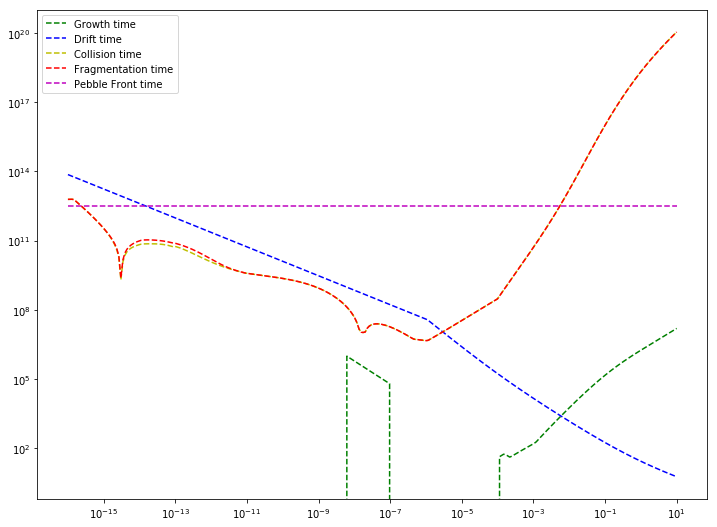

In [38]:
# Choose M_core ~ 1e-8 M_earth
j = 207 #700
print(m_array[j])

fig = plt.figure(1,figsize=(12,9))
plt.loglog(ratio_array, t_arr[j,:,0], 'g--', label='Growth time')
plt.loglog(ratio_array, t_arr[j,:,1], 'b--', label='Drift time')
plt.loglog(ratio_array, t_arr[j,:,2], 'y--', label='Collision time')
plt.loglog(ratio_array, t_arr[j,:,3], 'r--', label='Fragmentation time')
plt.loglog(ratio_array, t_arr[j,:,4], 'm--', label='Pebble Front time')
plt.legend()

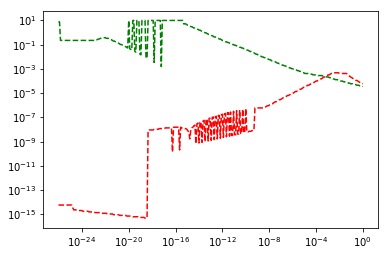

In [39]:
# Now, find ratio value such that t_grow = t_drift, and t_grow = t_frag
ratios_drift = np.zeros(ratio_array.shape)
ratios_frag = np.zeros(ratio_array.shape)
for j, M in enumerate(m_array):
    m_core = M*fn.m_earth
    r_core = ((3 * m_core)/(4 * np.pi * rho_s))**(1/3)
    r_hill = fn.hill_rad(m_core, a*fn.au, fn.m_sun)
    i_drift = np.argmin(abs(t_arr[j,:,0] - t_arr[j,:,1]))
    i_frag = np.argmin(abs(t_arr[j,:,0] - t_arr[j,:,3]))
    ratios_drift[j] = ratio_array[i_drift]
    ratios_frag[j] = ratio_array[i_frag]
    #for i, r in enumerate(ratio_array):

plt.loglog(m_array, ratios_drift, 'g--')
plt.loglog(m_array, ratios_frag, 'r--')

In [34]:
def y_str_eqn(y_str,st):
    """Equation 21d from OC07 with term on RHS subtracted over. Ignores V_0 term following text,
    which we may want to include later."""
    return 2./3. * y_str * (y_str - 1.)**2. - (1 + y_str)**(-1.) + (1 + st**(-1.))**(-1.)

def st_str(st):
    """Function to solve for t_* following OC07 21d. Ignores V_0 term. """
    if st>=1:
        return 1. #Don't allow t_* > t_L
    else:
        return opt.fsolve(y_str_eqn,st,args=(st))[0]*st
    
def d_V_12(t_1=1.,t_2=1.,t_L=1,Re=1e8):
    """Function for reproducing Eqn. (16) in OC07. Might need to add more input parameters"""
    
    t_eta = Re**(-0.5)*t_L
    
    t_1_str = st_str(t_1)
    t_2_str = st_str(t_2)
    t_12_str = max(t_1_str,t_2_str)
    t_12_str = max(t_12_str,t_eta)

    term_1 = (t_12_str + t_1**2./(t_1 + t_12_str) - (t_eta + t_1**2./(t_1 + t_eta))) +\
                ( (t_2 - t_1)/(t_1 + t_2) * (t_1**2./(t_1 + t_L) - t_1**2./(t_1 + t_12_str)) )

    term_2 = (t_12_str + t_2**2./(t_2 + t_12_str) - (t_eta + t_2**2./(t_2 + t_eta))) +\
                ( (t_1 - t_2)/(t_2 + t_1) * (t_2**2./(t_2 + t_L) - t_2**2./(t_2 + t_12_str)) )

    return np.sqrt(term_1 + term_2)

In [35]:
# Try making the surface density vs time plot
boltzmann = 1.380658e-16 #cgs
mH = 1.6733000e-24 #grams
G = 6.67259e-8 #cgs
SB = 5.6704e-5
Ldot = 3.839e33
rsun = 7e10

def tau_s(r,s, T, mstar, rhoGas):
    v_therm = np.sqrt((boltzmann*T)/(2.35*mH))
    rho_part = 2.
    lambda_mfp = 1./((rhoGas/(2.3*mH))*np.pi*10.**-15)
    regime = (9*lambda_mfp)/4.
    t_stop = []
    
    for i,ss in enumerate(s):
        #if ss<regime[i]:
        t_stop.append((rho_part*ss)/(rhoGas[i]*v_therm[i]))
        #if ss>regime[i]:
        #    t_stop.append((4*rho_part*ss**2)/(9*rhoGas[i]*v_therm[i]*lambda_mfp[i]))
        
    omega = np.sqrt((G*mstar)/(r*fn.au)**3)
    v_kep = omega*(r*fn.au)
    tau_stop = omega*t_stop
    
    return tau_stop

def d_V_12_approx(t_1=1.,t_2=1.,t_L=1,Re=1e8):
    """Function for reproducing Eqn. (16) in OC07. Might need to add more input parameters"""
    t_eta = Re**(-0.5)*t_L
    if (t_1 <= t_eta) and (t_2 <= t_eta):
        return [np.sqrt(t_L / t_eta * (t_1 - t_2)**2),0]
    elif (t_1 > t_eta) and (t_1 < t_L):
        y_a = 1.6
        eps = t_1 / t_2
        return [np.sqrt(2 * y_a - (1 + eps) + 2/(1 + eps) * (1/(1 + y_a) + eps**3/(y_a + eps))) * np.sqrt(t_1),1]
    elif (t_1 >= t_L):
        return [np.sqrt(1/(1 + t_1) + 1/(1 + t_2)),2]

def t_grow(s, a, f_d, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann * T)/(2.35*mH))
    Om = np.sqrt((fn.G * m_star * fn.m_sun)/(a * fn.au)**3.)
    v_kep = Om *(a * fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    H  = c_s/ Om
    r_c = 40
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma))*np.exp(-(a/r_c)**(2-gamma))
    
    M = 1e-5
    st = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=M,sig_in=sigma,temp_in=T)
    m = 4/3 * np.pi * rho_int * s**3
    rho = 1e-2 * sigma/H #f_d * sigma/H
    sig = np.pi * s**2
    v = eta*v_kep * d_V_12(t_1=st, t_2=0.5*st, t_L=1)#[0]
    
    return m/(rho * sig * v) # This is actually the last doubling time. Should I add some prefactor?

def dust_to_gas(disk_age, r, params):    
    T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
    
    T = T_0 * (r**(-3/7))
    mstar = m_star * fn.m_sun
    time_grow = disk_age
    r_c = 40
    gamma = 1
    sigma = sigma_0 * ((r/r_c)**(-gamma))*np.exp(-(r/r_c)**(2-gamma))
        
    cs = np.sqrt((boltzmann*T)/(2.35*mH))
    omega = np.sqrt((G*mstar)/(r*fn.au)**3.)
    H = cs/omega
    rhoGas = sigma/H
    v_kep = omega*(r*fn.au)
    eta = (cs)**2/(2*(v_kep)**2)
    v0 = eta*v_kep
    
    n_r = len(r)
    
    # Calculate the pressure power-law index
    P = sigma * omega * cs /np.sqrt(2*np.pi)
    
    # This section also does nothing
    #gamma = np.ones(n_r)
    #gamma[1:n_r - 1] = r[1:n_r - 1] / P[1:n_r - 1] * (P[2:n_r] - P[0:n_r - 2]) / (r[2:n_r] - r[0:n_r - 2])
    #gamma[0] = gamma[1]
    #gamma[-1] = gamma[-2]
    #gamma = abs(gamma)
    
    amax = sigma*(r*fn.au)/time_grow/v0/rho_int#/gamma # This is the max particle size from drift = grow
    #print(amax, sigma, v0)
    
    a_DL = (2/9 * sigma * 1e-15 * amax * np.sqrt(fn.G * mstar/(boltzmann * T * 2.35*mH)))**(2/3) # Location of drag law transition
    a_DL = a_DL[np.argmin(abs(a_DL - r))]
    #print(a_DL)
    
    tau_stop = tau_s(r,amax, T, mstar, rhoGas) # Calculates St_max for max particle size
    
    H_d = H * np.sqrt(alpha/(alpha + tau_stop))
    
    # This whole section does nothing
    vgas = np.sqrt(alpha*cs**2.)
    lambda_mfp = 1./((rhoGas/(2.3*mH))*10.**(-15.))
    nu = lambda_mfp*cs
    Re = (alpha*cs**2)/(nu*omega)
    deltaV = []
    regime = []
    for idx,t in enumerate(tau_stop):
        deltaV.append(vgas[idx] * d_V_12(t,0.5*t,1,Re[idx]))
        regime.append(d_V_12_approx(t, 0.5*t, 1, Re[idx])[1])
        
    
    # Where does this come from?
    sigma_dust = (amax*np.pi*rho_int*cs**2)/v_kep**2/2/0.55 #great!
    fd = sigma_dust/sigma
    s = amax
    f = 0.55
    f_d = (8 * rho_int * s * H_d)/(3 * sigma * time_grow * deltaV * f)
    
    t_g_arr = np.zeros(r.shape) # Growth times for largest particle
    F_d_arr = np.zeros(amax.shape) # Drag force for largest particle
    for i, a in enumerate(r):
        t_g_arr[i] = abs(t_grow(amax[i], a, f_d[i], params)) # The time required to grow a particle to the max particle size
        mfp = fn.mean_free_path(fn.mu, fn.gas_density(sigma[i], H[i]), fn.cross)
        if amax[i] > 9.*mfp/4.:
            F_d_arr[i] = 1 # 1 means Stokes, 0 means Epstein
    for i, t in enumerate(t_g_arr):
        if t > abs(time_grow):
            #print(t, time_grow)
            f_d[i] = 1e-2
    deltaV = [deltaV, regime]
    return (f_d, amax, F_d_arr, deltaV, tau_stop)

def sig_g(beta_0, r_c, a, t):
    beta = beta_0 * ((a/r_c)**(-1))*np.exp(-(a/r_c)) #beta_0 * exp(-t/3.154e7)
    return beta * a**(-1)
    
def sig_p(M_star, f_d, beta_0, r_c, a, t):
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    Sig_g = sig_g(beta_0, r_c, a,t)
    return 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g

In [36]:
t = 3.154e13
r = np.array([10])
params = 200, 1, 375, 40, 2, 1e-4
T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
dust_to_gas(t, r, params)[0]


array([1.59354279e-05])

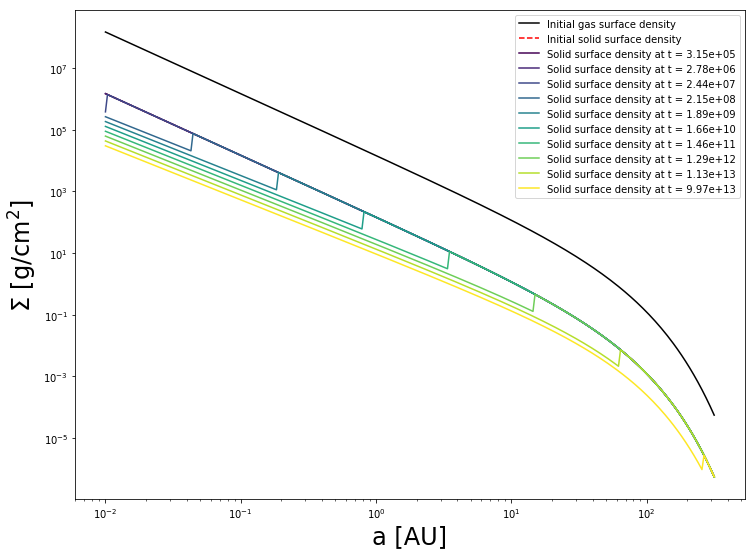

In [37]:
# Let's make the surface density vs time plot for LJ14
#a_au_arr = gas_to_dust[0]
#m_core_arr = np.logspace(-10, 2, 300)
t_array = np.logspace(-8,0.5,10) * 3.154e13
a_array = np.logspace(-2, 2.5, 300)
Sig_g_array = np.zeros([t_array.size, a_array.size])
Sig_p_array = np.zeros([t_array.size, a_array.size])

params = 200, 1, 375, 40, 2, 1e-4
T_0, m_star, sigma_0, r_crit, rho_int, alpha = params

eps_d = 0.05
eps_p = 0.5
f_d = 1e-2
for i,t in enumerate(t_array):
    Sig_g = sig_g(sigma_0, r_crit, a_array, t)
    Sig_p = sig_p(m_star, f_d, sigma_0, r_crit, a_array, t)
    Sig_g_array[i] = Sig_g
    Sig_p_array[i] = Sig_p

t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_array * fn.au)**(3/2)
a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_array**(2/3) / fn.au

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_g_array[0], 'k-', label='Initial gas surface density')
plt.loglog(a_array, 1e-2*Sig_g_array[0], 'r--', label='Initial solid surface density')

# Cut off Sig_p if exterior to pebble front
for i, t in enumerate(t_array):
    for j, a in enumerate(a_array):
        if a > a_PF[i]:
            Sig_p_array[i,j] = 1e-2 * Sig_g_array[0, j]

# Uses colorbar to set line color based on disk age
cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

for i,t in enumerate(t_array):
    plt.loglog(a_array, Sig_p_array[i], label='Solid surface density at t = {time}'.format(time=f"{t:.2e}"), color=line_colors[i])
    #plt.axvline(x=a_PF[i], color=line_colors[i])

plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()

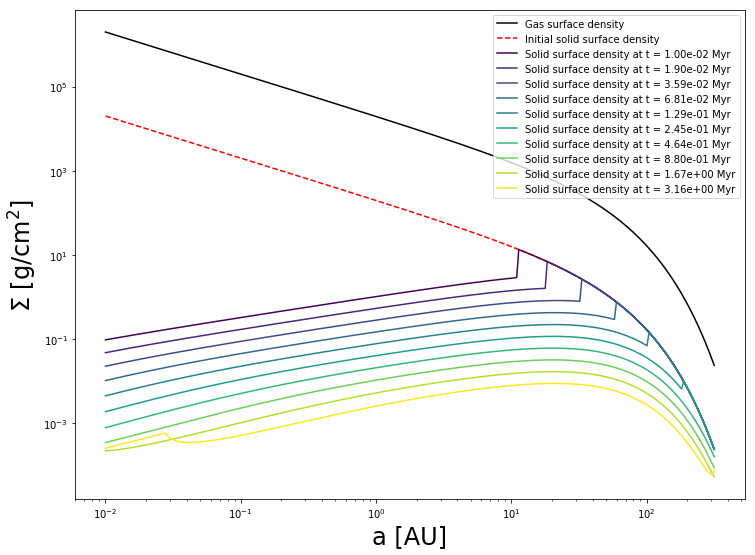

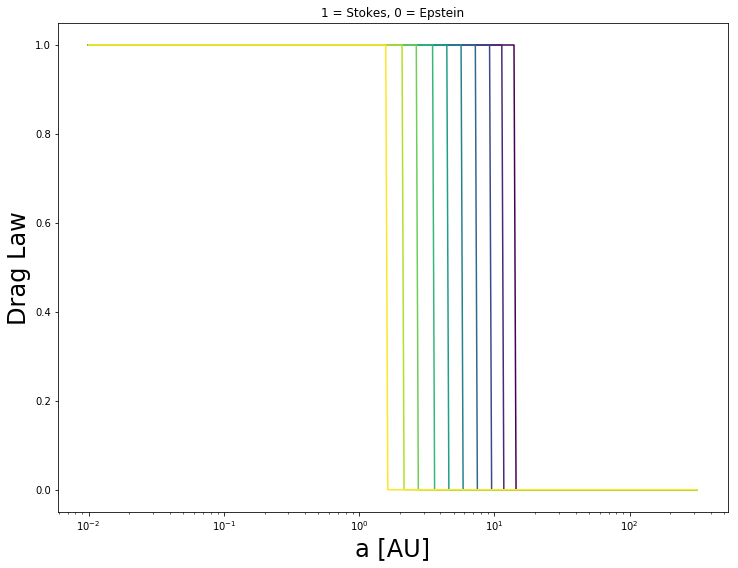

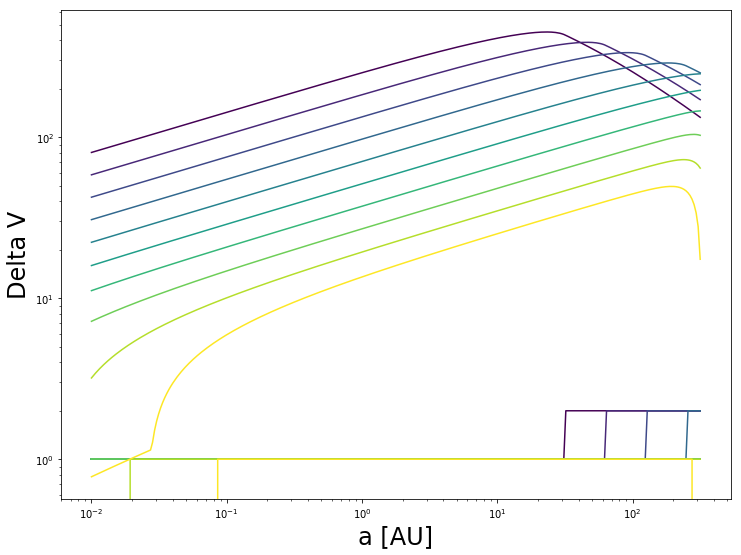

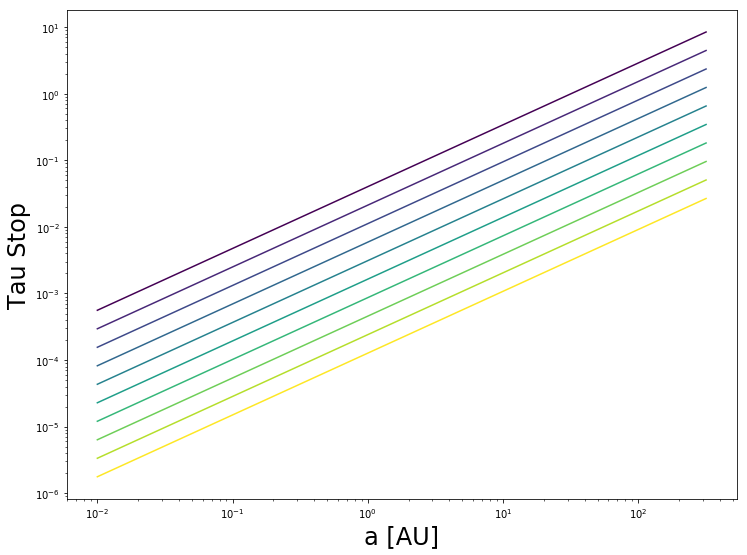

In [38]:
# Surface density vs time plot for Powell et al. 2019
#t_array = np.logspace(-8,0.5,20) * 3.154e13
t_array = np.logspace(-2,0.5, 10) * 3.154e13
a_array = np.logspace(-2, 2.5, 300)
f_d_array = np.zeros([t_array.size, a_array.size])
#a_DL_array = np.zeros([t_array.size, a_array.size])
amax_arr = np.zeros([t_array.size, a_array.size])
deltaV_arr = np.zeros([t_array.size, a_array.size])
regime_arr = np.zeros([t_array.size, a_array.size])
F_d_arr = np.zeros([t_array.size, a_array.size])
#H_D_arr = np.zeros([t_array.size, a_array.size])
tau_stop_arr = np.zeros([t_array.size, a_array.size])

params = 200, 1, 500, 40, 2, 1e-4
T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
r_c = r_crit
gamma = 1
Sig_gas = sigma_0 * ((a_array/r_c)**(-gamma))*np.exp(-(a_array/r_c)**(2-gamma))

for i,t in enumerate(t_array):
    d2g = dust_to_gas(t, a_array, params)
    f_d_array[i] = d2g[0]
    amax_arr[i] = d2g[1]
    F_d_arr[i] = d2g[2]
    deltaV_arr[i] = np.array(d2g[3][0])
    regime_arr[i] = np.array(d2g[3][1])
    tau_stop_arr[i] = d2g[4]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k-', label="Gas surface density")
plt.loglog(a_array, 1e-2*Sig_gas, 'r--', label="Initial solid surface density")
for i,t in enumerate(t_array):
    plt.loglog(a_array, f_d_array[i]*Sig_gas, label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
    #plt.axvline(x=a_DL_array[i], color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.semilogx(a_array, F_d_arr[i], color=line_colors[i])
plt.ylabel('Drag Law', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.title('1 = Stokes, 0 = Epstein')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, deltaV_arr[i], color=line_colors[i])
    plt.loglog(a_array, regime_arr[i], color=line_colors[i])
plt.ylabel('Delta V', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
#plt.title('1 = Stokes, 0 = Epstein')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, tau_stop_arr[i], color=line_colors[i])
plt.ylabel('Tau Stop', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
#plt.title('1 = Stokes, 0 = Epstein')
plt.show()

In [39]:
# Try making the surface density vs time plot
boltzmann = 1.380658e-16 #cgs
mH = 1.6733000e-24 #grams
G = 6.67259e-8 #cgs
SB = 5.6704e-5
Ldot = 3.839e33
rsun = 7e10

def t_grow(s, a, f_d, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann * T)/(2.35*mH))
    Om = np.sqrt((fn.G * m_star * fn.m_sun)/(a * fn.au)**3.)
    v_kep = Om *(a * fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    H  = c_s/ Om
    r_c = r_crit
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma))*np.exp(-(a/r_c)**(2-gamma))
    
    M = 1e-5
    st = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=M,sig_in=sigma,temp_in=T)
    m = 4/3 * np.pi * rho_int * s**3
    rho = 1e-2 * sigma/H #f_d * sigma/H
    sig = np.pi * s**2
    v = eta*v_kep * d_V_12(t_1=st, t_2=0.5*st, t_L=1)#[0]
    
    return m/(rho * sig * v) # This is actually the last doubling time. Should I add some prefactor?

def dust_to_gas(disk_age, r, params):    
    T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
    
    T = T_0 * (r**(-3/7))
    mstar = m_star * fn.m_sun
    time_grow = disk_age
    r_c = r_crit
    gamma = 1
    sigma = sigma_0 * ((r/r_c)**(-gamma))*np.exp(-(r/r_c)**(2-gamma))
        
    cs = np.sqrt((boltzmann*T)/(2.35*mH))
    omega = np.sqrt((G*mstar)/(r*fn.au)**3.)
    H = cs/omega
    rhoGas = sigma/H
    v_kep = omega*(r*fn.au)
    eta = (cs)**2/(2*(v_kep)**2)
    v0 = eta*v_kep
    
    n_r = len(r)
    
    # Calculate the pressure power-law index
    P = sigma * omega * cs /np.sqrt(2*np.pi)
    
    St_max = (r*fn.au)/(2 * v0 * time_grow)
    # Assumed that M_core = 1 earth mass
    a_max = np.zeros(St_max.shape)
    for i, St in enumerate(St_max):
        a_max[i] = st_solver(st=St, alph=alpha, a_au=r[i], m_suns=m_star, m_earths=1, temp_in=T[i], sig_in=sigma[i])
    
    a_DL = (2/9 * sigma * 1e-15 * a_max * np.sqrt(fn.G * mstar/(boltzmann * T * 2.35*mH)))**(2/3) # Location of drag law transition
    a_DL = a_DL[np.argmin(abs(a_DL - r))]
    #print(a_DL)
    
    H_d = H * np.sqrt(alpha/(alpha + St_max))
    
    vgas = np.sqrt(alpha*cs**2.)
    lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
    nu = lambda_mfp*cs
    Re = (alpha*cs**2)/(nu*omega) # Why is this v_turb**2/v_th**2?
    deltaV = []
    regime = []
    for idx,t in enumerate(St_max):
        #print(t)
        deltaV.append(vgas[idx] * d_V_12(t,0.5*t,1,Re[idx]))
        regime.append(d_V_12_approx(t, 0.5*t, 1, Re[idx])[1])
    
    # Where does this come from?
    sigma_dust = (a_max*np.pi*rho_int*cs**2)/v_kep**2/2/0.55 #great!
    fd = sigma_dust/sigma
    s = a_max #amax
    f = 0.55
    f_d = (8 * rho_int * s * H_d)/(3 * sigma * time_grow * deltaV * f)
    
    t_g_arr = np.zeros(r.shape) # Growth times for largest particle
    F_d_arr = np.zeros(a_max.shape) # Drag force for largest particle
    for i, a in enumerate(r):
        t_g_arr[i] = abs(t_grow(a_max[i], a, f_d[i], params)) # The time required to grow a particle to the max particle size
        mfp = fn.mean_free_path(fn.mu, fn.gas_density(sigma[i], H[i]), fn.cross)
        if a_max[i] > 9.*mfp/4.:
            F_d_arr[i] = 1 # 1 means Stokes, 0 means Epstein
    for i, t in enumerate(t_g_arr):
        if t > abs(time_grow):
            #print(t, time_grow)
            f_d[i] = 1e-2
    deltaV = [deltaV, regime]
    return (f_d, a_max, F_d_arr, deltaV, St_max)

def sig_g(beta_0, r_c, a, t):
    beta = beta_0 * ((r/r_c)**(-1))*np.exp(-(r/r_c)) #beta_0 * exp(-t/3.154e7)
    return beta * a**(-1)
    
def sig_p(M_star, f_d, beta_0, r_c, a, t):
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    Sig_g = sig_g(beta_0, r_c, a,t)
    return 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g

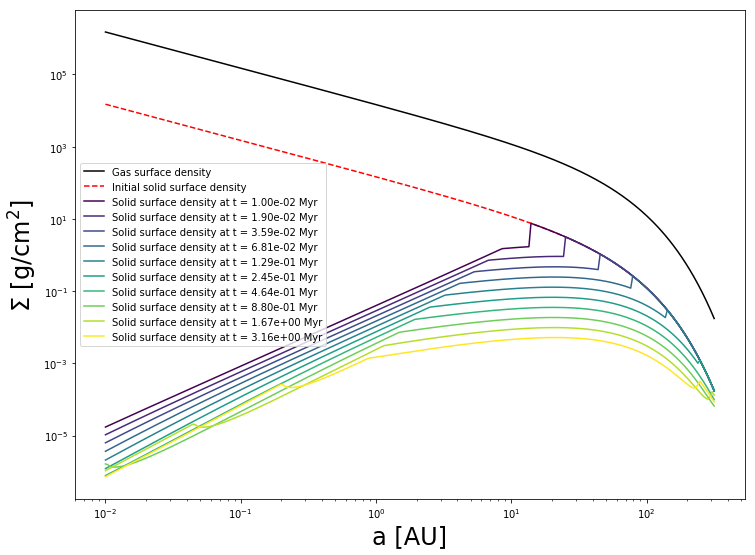

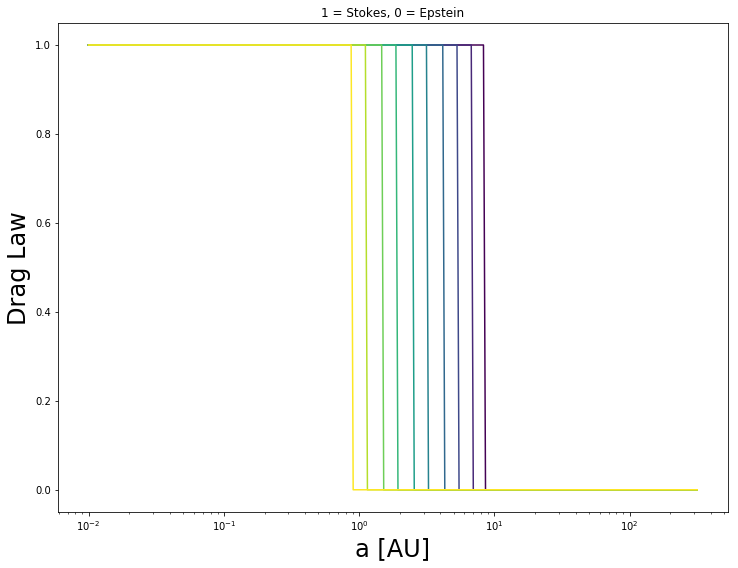

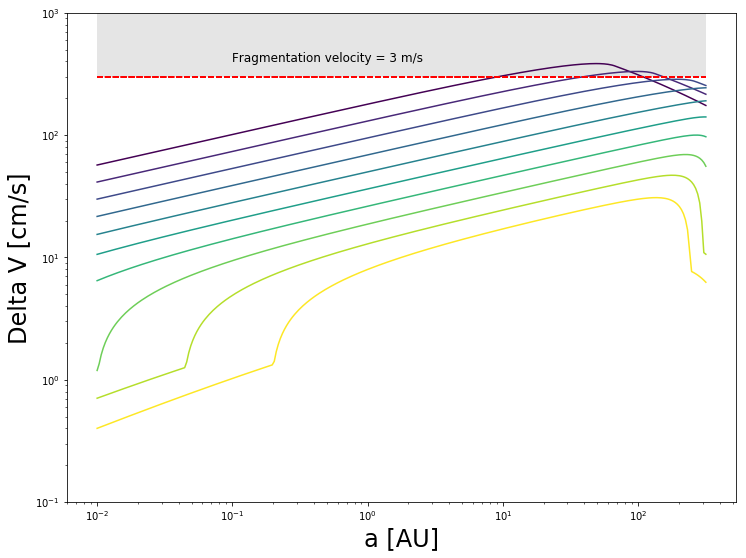

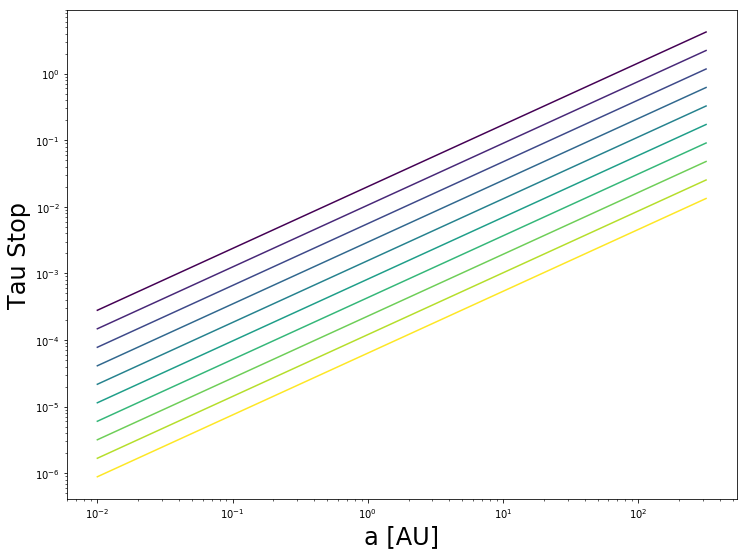

In [40]:
# Surface density vs time plot for Powell et al. 2019
#t_array = np.logspace(-8,0.5,20) * 3.154e13
t_array = np.logspace(-2,0.5, 10) * 3.154e13
a_array = np.logspace(-2, 2.5, 300)
f_d_array = np.zeros([t_array.size, a_array.size])
#a_DL_array = np.zeros([t_array.size, a_array.size])
amax_arr = np.zeros([t_array.size, a_array.size])
deltaV_arr = np.zeros([t_array.size, a_array.size])
regime_arr = np.zeros([t_array.size, a_array.size])
F_d_arr = np.zeros([t_array.size, a_array.size])
#H_D_arr = np.zeros([t_array.size, a_array.size])
tau_stop_arr = np.zeros([t_array.size, a_array.size])

params = 200, 1, 375, 40, 2, 1e-4
T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
r_c = r_crit
gamma = 1
Sig_gas = sigma_0 * ((a_array/r_c)**(-gamma))*np.exp(-(a_array/r_c)**(2-gamma))

for i,t in enumerate(t_array):
    d2g = dust_to_gas(t, a_array, params)
    f_d_array[i] = d2g[0]
    amax_arr[i] = d2g[1]
    F_d_arr[i] = d2g[2]
    deltaV_arr[i] = np.array(d2g[3][0])
    regime_arr[i] = np.array(d2g[3][1])
    tau_stop_arr[i] = d2g[4]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k-', label="Gas surface density")
plt.loglog(a_array, 1e-2*Sig_gas, 'r--', label="Initial solid surface density")
for i,t in enumerate(t_array):
    plt.loglog(a_array, f_d_array[i]*Sig_gas, label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
    #plt.axvline(x=a_DL_array[i], color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.semilogx(a_array, F_d_arr[i], color=line_colors[i])
plt.ylabel('Drag Law', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.title('1 = Stokes, 0 = Epstein')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, deltaV_arr[i], color=line_colors[i])
    #plt.loglog(a_array, regime_arr[i], color=line_colors[i])
    plt.loglog(a_array, 300*np.ones(a_array.size), 'r--')
plt.fill_between(a_array, 300, 10**3, facecolor='black', alpha=0.1)    
plt.text(10**-1, 4*10**2, 'Fragmentation velocity = 3 m/s', fontsize=12)
plt.ylim(10**-1,10**3)
plt.ylabel('Delta V [cm/s]', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
#plt.title('1 = Stokes, 0 = Epstein')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, tau_stop_arr[i], color=line_colors[i])
plt.ylabel('Tau Stop', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
#plt.title('1 = Stokes, 0 = Epstein')
plt.show()

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: divide by zero encountered in double_scalars


Equal at approx a = 1.6057784258372243 AU


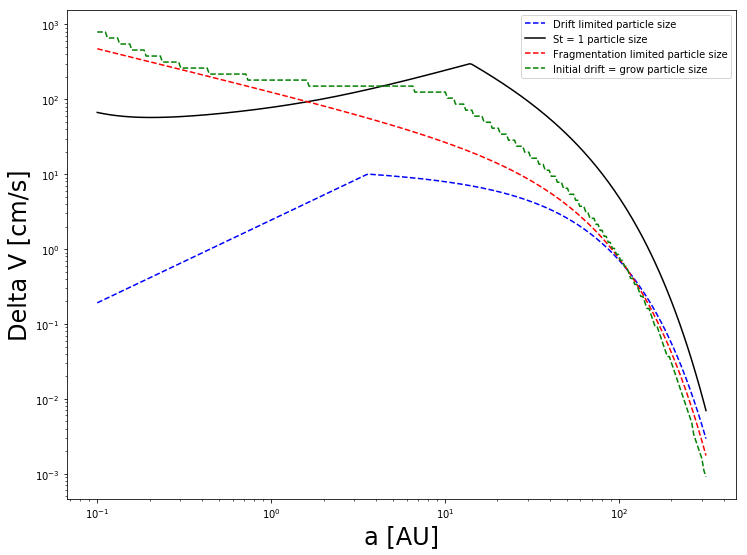

In [41]:
# Calculate s(St = 1), then compare this to s_frag
f_f = 0.5
rho_s = 1.6
a_array = np.logspace(-1, 2.5, 300)
s_St1 = np.zeros(a_array.shape)
s_frag = np.zeros(a_array.shape)

params = 200, 1, 375, 40, 2, 1e-4
T_0, m_star, sigma_0, r_crit, rho_int, alpha = params
v_frag = 3e2
time_grow = 0.1 * 3.154e13
f_d_array = dust_to_gas(time_grow, a_array, params)

s_max = np.zeros(a_array.shape)
St_max = np.zeros(a_array.shape)
t_g_arr = np.zeros(a_array.shape)
s_init_arr = np.zeros(a_array.shape)
s_array = np.logspace(-15,9,300)
t_drift = np.zeros(s_array.shape)
t_g_init = np.zeros(s_array.shape)
for i,a in enumerate(a_array):
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    r_c = 40
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma))*np.exp(-(a/r_c)**(2-gamma))
        
    cs = np.sqrt((boltzmann*T)/(2.35*mH))
    omega = np.sqrt((G*mstar)/(a*fn.au)**3.)
    H = cs/omega
    rhoGas = sigma/H
    v_kep = omega*(a*fn.au)
    eta = (cs)**2/(2*(v_kep)**2)
    v0 = eta*v_kep
    
    St_max[i] = (a*fn.au)/(2 * v0 * time_grow)
    # Assumed that M_core = 1 earth mass
    s_max[i] = st_solver(st=St_max[i], alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=sigma)

    for j, s in enumerate(s_array):
        st = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=sigma,temp_in=T)
        t_drift[j] = (a*fn.au)/(2 * st * cs**2/(2*v_kep))
        t_g_init[j] = abs(t_grow(s, a, 1e-2, params))
    s_init_arr[i] = s_array[np.argmin(abs(t_drift - t_g_init))]
    #t_g_arr[i] = abs(t_grow(s_max[i], a, f_d_array[i], params))
    
    s_St1[i] = st_solver(st=1, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=sigma)
    s_frag[i] = f_f * (2 * sigma * v_frag**2)/(3 * np.pi * rho_s * alpha * cs**2)

print("Equal at approx a =", a_array[np.argmin(abs(s_St1 - s_frag)/s_St1)], "AU")
fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, s_max, 'b--', label='Drift limited particle size')
plt.loglog(a_array, s_St1, 'k-', label='St = 1 particle size')
plt.loglog(a_array, s_frag, 'r--', label='Fragmentation limited particle size')
plt.loglog(a_array, s_init_arr, 'g--', label='Initial drift = grow particle size')
plt.ylabel('Delta V [cm/s]', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()

In [70]:
# Now, replace the functions above w/ purely functional versions (get rid of debugging stuff)
boltzmann = 1.380658e-16 #cgs
mH = 1.6733000e-24 #grams
G = 6.67259e-8 #cgs
SB = 5.6704e-5
Ldot = 3.839e33
rsun = 7e10

def y_str_eqn(y_str,st):
    """Equation 21d from OC07 with term on RHS subtracted over. Ignores V_0 term following text,
    which we may want to include later."""
    return 2./3. * y_str * (y_str - 1.)**2. - (1 + y_str)**(-1.) + (1 + st**(-1.))**(-1.)

def st_str(st):
    """Function to solve for t_* following OC07 21d. Ignores V_0 term. """
    if st>=1:
        return 1. #Don't allow t_* > t_L
    else:
        return opt.fsolve(y_str_eqn,st,args=(st)) [0]*st
    
def d_V_12(t_1=1.,t_2=1.,t_L=1,Re=1e8):
    """Function for reproducing Eqn. (16) in OC07. Might need to add more input parameters"""
    t_eta = Re**(-0.5)*t_L
    t_1_str = st_str(t_1)
    t_2_str = st_str(t_2)
    t_12_str = max(t_1_str,t_2_str)
    t_12_str = max(t_12_str,t_eta)

    term_1 = (t_12_str + t_1**2./(t_1 + t_12_str) - (t_eta + t_1**2./(t_1 + t_eta))) +\
                ( (t_2 - t_1)/(t_1 + t_2) * (t_1**2./(t_1 + t_L) - t_1**2./(t_1 + t_12_str)) )

    term_2 = (t_12_str + t_2**2./(t_2 + t_12_str) - (t_eta + t_2**2./(t_2 + t_eta))) +\
                ( (t_1 - t_2)/(t_2 + t_1) * (t_2**2./(t_2 + t_L) - t_2**2./(t_2 + t_12_str)) )

    return np.sqrt(term_1 + term_2)

def t_grow(s, a, f_d, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann * T)/(2.35*mH))
    Om = np.sqrt((fn.G * m_star * fn.m_sun)/(a * fn.au)**3.)
    v_kep = Om *(a * fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    H  = c_s/ Om
    r_c = r_crit
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma)) #*np.exp(-(a/r_c)**(2-gamma))
    
    M = 1 # Assumed that M_core = 1 earth mass
    st = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=M,sig_in=sigma,temp_in=T)
    m = 4/3 * np.pi * rho_int * s**3
    rho = 1e-2 * sigma/H #f_d * sigma/H
    sig = np.pi * s**2
    v0 = eta*v_kep
    vgas = np.sqrt(v0**2 + alpha*c_s**2.)
    lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
    nu = lambda_mfp*c_s
    Re = fn.rey(s, v0, fn.therm_vel(c_s), lambda_mfp) #(alpha*c_s**2)/(nu*Om)
    v = v0 * d_V_12(t_1=st, t_2=0.5*st, t_L=1)
    
    return m/(rho * sig * v) # This is actually the last doubling time. Should I add some prefactor?

def dust_to_gas(disk_age, a, params):    
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    time_grow = disk_age
    r_c = r_crit
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma)) #*np.exp(-(a/r_c)**(2-gamma))
        
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt((G*mstar)/(a*fn.au)**3.)
    H = c_s/Om
    rhoGas = fn.gas_density(sigma, H)
    v_kep = Om * (a*fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    v0 = eta*v_kep
    
    St_max = (a*fn.au)/(2 * v0 * time_grow)
    # Assumed that M_core = 1 earth mass
    s_max = np.zeros(St_max.shape)
    for i, St in enumerate(St_max):
        s_max[i] = st_solver(st=St, alph=alpha, a_au=a[i], m_suns=m_star, m_earths=1, temp_in=T[i], sig_in=sigma[i])
    
    H_d = H * np.sqrt(alpha/(alpha + St_max))
    
    vgas = np.sqrt(v0**2 + alpha*c_s**2.)
    lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
    nu = lambda_mfp*c_s
    Re = (alpha*c_s**2)/(nu*Om) # Why is this v_turb**2/v_th**2?
    deltaV = np.zeros(St_max.size)
    for idx,t in enumerate(St_max):
        deltaV[idx] = vgas[idx] * d_V_12(t,0.5*t,1,Re[idx])

    f = 0.55
    f_d = (8 * rho_int * s_max * H_d)/(3 * sigma * time_grow * deltaV * f)
    
    t_g_arr = np.zeros(a.shape) # Growth times for largest particle
    for i, a_au in enumerate(a):
        t_g_arr[i] = abs(t_grow(s_max[i], a_au, f_d[i], params)) # The time required to grow a particle to the max particle size
        if abs(t_g_arr[i]) > abs(time_grow):
            f_d[i] = 1e-2
    return f_d

def sig_g(beta_0, r_c, a, t):
    beta = beta_0 * ((a/r_c)**(-1)) #*np.exp(-(a/r_c)) #beta_0 * exp(-t/3.154e7)
    return beta * a**(-1)
    
def sig_p_OLD(Sig_g, M_star, f_d, a_PF, a, t):
    eps_p = 0.5
    eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    a_applicable = np.trim_zeros(np.where(a < a_PF, a, 0))
    Sig_p = 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    v_kep = om *(a * fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    i_PF = np.argmin(abs(a - a_PF))
    Sig_p0_PF = f_d*Sig_g[i_PF]
    
    for i, a_au in enumerate(a):
        s_old = np.sqrt(3)/8 * Sig_p[i]/(eta[i]*rho_int)
        St = st_rad(rad=s_old,alph=alpha,a_au=a_au,m_suns=M_star,m_earths=1,sig_in=Sig_g[i],temp_in=T[i]) #om[i]*fn.ts_eps(rho_int, Sig_g[i]/(2*c_s[i]/om[i]), s_old, np.sqrt(8/np.pi)*c_s[i]) #
        #Sig_p[i] = ((a_PF*fn.au)**2)/(3 * t * St * eta[i] * v_kep[i] * (a_au*fn.au)**3) * f_d * Sig_g[i]
        #Sig_p[i] = ((2/3)**(2/3) * np.pi * (fn.G*M_star*fn.m_sun)**(1/3) * (Sig_g[i] * fn.au) * eps_d**(2/3) * f_d**(5/3) * t**(-1/3))/(4 * np.pi * St * eta[i] * v_kep[i] * a_au*fn.au)
        Sig_p[i] = (3/16)**(2/3) * ((fn.G * M_star*fn.m_sun)**(2/3) * (eps_d * f_d)**(4/3) * (Sig_p0_PF) * t**(1/3))/(3 * St * eta[i] * v_kep[i] * a_au * fn.au)
    
        j = 0
        delta = 1
        while abs(delta) > 0.01:
            if j != 0: 
                s_old = s
            #s = 0.34*s_old + 0.66*np.sqrt(3)/8 * Sig_p[i]/(eta[i]*rho_int)
            Sig_old = Sig_p[i]
            St_1 = st_rad(rad=1.01*s_old,alph=alpha,a_au=a_au,m_suns=M_star,m_earths=1,sig_in=Sig_g[i],temp_in=T[i])
            Sig_1 = (3/16)**(2/3) * ((fn.G * M_star*fn.m_sun)**(2/3) * (eps_d * f_d)**(4/3) * (Sig_p0_PF) * t**(1/3))/(3 * St_1 *eta[i] * v_kep[i] * a_au * fn.au)
            Sig_0 = (3/16)**(2/3) * ((fn.G * M_star*fn.m_sun)**(2/3) * (eps_d * f_d)**(4/3) * (Sig_p0_PF) * t**(1/3))/(3 * St *eta[i] * v_kep[i] * a_au * fn.au)
            Sig_diff = Sig_0 - Sig_old
            Sig_der = (Sig_1 - Sig_0)/(0.01*s_old)

            s = s_old - Sig_diff/(Sig_der)
            
            St = st_rad(rad=s,alph=alpha,a_au=a_au,m_suns=M_star,m_earths=1,sig_in=Sig_g[i],temp_in=T[i]) #om[i]*fn.ts_eps(rho_int, Sig_g[i]/(2*c_s[i]/om[i]), s, np.sqrt(8/np.pi)*c_s[i]) #
            #Sig_p[i] = ((a_PF*fn.au)**2)/(3 * t * St * eta[i] * v_kep[i] * (a_au*fn.au)**3) * f_d * Sig_g[i]
            #Sig_p[i] = ((2/3)**(2/3) * np.pi * (fn.G*M_star*fn.m_sun)**(1/3) * (Sig_g[i] * fn.au) * eps_d**(2/3) * f_d**(5/3) * t**(-1/3))/(4 * np.pi * St * eta[i] * v_kep[i] * a_au*fn.au)
            Sig_p[i] = (3/16)**(2/3) * ((fn.G * M_star*fn.m_sun)**(2/3) * (eps_d * f_d)**(4/3) * (Sig_p0_PF) * t**(1/3))/(3 * St * eta[i] * v_kep[i] * a_au * fn.au)
            #delta = (s - s_old)/s
            delta = (Sig_p[i] - Sig_old)/Sig_old
            j = j + 1
            #print(delta, j, s, s_old, abs(delta) > 0.01)
    
    Sig_p[a_applicable.size:] = 1e-2 * Sig_g[a_applicable.size:]
    return Sig_p


def sig_p(f_d, a_PF, a, t, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    Sig_g = sig_g(sigma_0, r_crit, a, t)
    eps_p = 0.5
    eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
    delt = 1 # Constant on drift velocity
    Lamb = 1 # Constant on t_grow = Lamb * t_drift
    f_d = 1e-2 # Initial dust to gas ratio
    om = np.sqrt(fn.G * m_star * fn.m_sun/(a*fn.au)**3)
    #Sig_p = 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g
    Sig_p = f_d  * Sig_g
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    v_kep = om *(a * fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    i_PF = np.argmin(abs(a - a_PF))
    Sig_p0_PF = f_d*Sig_g[i_PF]
    M_dot = (4*np.pi)/(3) * (a_PF*fn.au)**2/t * Sig_p0_PF
    lambda_mfp = fn.mean_free_path(fn.mu, Sig_g/(2*c_s/om), fn.cross)
    Re = (eta**2 * v_kep**2 + alpha * c_s**2)/(lambda_mfp * np.sqrt(8/np.pi) * c_s * om)
    turbulent = False
    for i, a_au in enumerate(a):
        if turbulent or (alpha * c_s[i]**2) > (eta[i]**2 * v_kep[i]**2): #Re[i]**(1/4) > 4 * eta[i] * v_kep[i]/(np.sqrt(alpha) * c_s[i]):
            turbulent = True
    
    a_transition = (np.pi/8)**(3/4) * (alpha * np.sqrt(Sig_g) * M_dot)/(9 * np.pi**2 * eps_p**2 * v_kep * (lambda_mfp * rho_int * eta * alpha)**(3/2))
    for i, a_au in enumerate(a):
        lambda_mfp = fn.mean_free_path(fn.mu, Sig_g[i]*om[i]/(2*c_s[i]), fn.cross)
        if turbulent:
            # Assumes Turbulence dominated relative velocity
            #Sig_p_Ep = ((128 * np.sqrt(2))/(9 * np.pi**2) * (8/np.pi)**(1/4) * np.sqrt(fn.cross/fn.mu) * (Sig_g[i]**(3/2) * c_s[i]**4 * M_dot)/(eta[i]**2 * v_kep[i]**5 * a_au*fn.au * np.sqrt(alpha)))**(1/3)
            Sig_p_Ep = (M_dot * om[i])/(2*np.pi * delt * c_s[i]**2) * ((8 * delt * np.sqrt(2/np.pi) * v_kep[i]**2)/(3 * Lamb * eps_p  * f_d * c_s[i]**2))**(2/3)
            #Sig_p_St = 8 * np.sqrt(2) * (8/np.pi)**(1/4) * eta[i] * Re[i]**(-1/4) * np.sqrt(rho_int * Sig_g[i] * lambda_mfp)/eps_p
            Sig_p_St = 4/(8**(1/4) * np.pi**(5/4) * Lamb * eps_p * f_d) * M_dot * om[i]/(v_kep[i]**2) * np.sqrt((rho_int * lambda_mfp)/Sig_g[i])
        else:
            # Assumes Laminar dominated instead
            #Sig_p_Ep = ((64 * alpha * Sig_g[i]**2 * M_dot)/(9 * np.pi**2 * eps_p**2 * v_kep[i] * a_au*fn.au))**(1/3)
            Sig_p_Ep = (8/(3 * Lamb))**2 * delt/(np.pi**2) * (alpha * M_dot * om[i])/(eps_p**2 * f_d**2 * v_kep[i]**2)
            Sig_p_St = 4 * (8/np.pi)**(1/4) * np.sqrt(Sig_g[i] * lambda_mfp * rho_int * alpha * eta[i])/eps_p
        
        Sig_p_Ep = np.minimum(Sig_p_Ep, f_d*Sig_g[i])
        #Sig_p_St = 4 * (8/np.pi)**(1/4) * np.sqrt(Sig_g[i] * lambda_mfp * rho_int * alpha * eta[i])

        Passed = False
        if (a_au*fn.au > a_transition[i]) or (Passed):
            Sig_p[i] = Sig_p_Ep
            Passed = True
        else:
            Sig_p[i] = Sig_p_St
            
        #if a_au > a_PF:
        #    Sig_p[i] = f_d*Sig_g[i]
    
    #Sig_p[a_applicable.size:] = 1e-2 * Sig_g[a_applicable.size:]
    return Sig_p


def surface_density(a_arr, t_disk, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    gamma = 1
    sigma_g = sig_g(sigma_0, r_crit, a_arr, t_disk) #sigma_0 * ((a_arr/r_crit)**(-gamma)) #*np.exp(-(a_arr/r_crit)**(2-gamma))
    f_d = 1e-2
    
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_disk**(2/3) / fn.au
    t_edge = (16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2)
    
    T = T_0 * (a_arr**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_arr * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_arr * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    
    a_interior = np.zeros(t_disk.size)
    sigma_d = np.zeros([t_disk.size, a_arr.size])
    for i,t in enumerate(t_disk):
        if a_PF[i] > a_edge: #np.amax(a_arr):
            # If in Powell et al. 2017 regime, find drift time for maximally size particle
            if a_interior[i-1] != 0:
                a = a_interior[i-1]
            else: a = a_edge
                
            j = np.argmin(abs(a - a_arr))
            gamma = 1.0
            Sig = sigma_0 * ((a/r_crit)**(-gamma)) #*np.exp(-(a/r_crit)**(2-gamma))
            T = T_0 * (a**(-3/7))
            c_s = np.sqrt((boltzmann*T)/(2.35*mH))
            Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
            v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
            eta = (c_s)**2/(2*(v_kep)**2)
            v0 = eta * v_kep
            
            # Why not guess the laminar, Epstein first, then calculate. Need a first guess to get drag regime, but where does this come from?
            #s = np.sqrt(3)/8 * sig_p(sigma_g, m_star, f_d, a_PF[i], a_arr, t)/(eta*rho_int)
            # What happens if I just use Diana's size equation here? (Equation 1 from Powell et al. 2019)
            s = Sig * a_arr * fn.au / (2.5 * t * v0 * rho_int)
            St = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T) #np.sqrt(3)/8 * eps_p/eta * sig_p(sigma_g, m_star, f_d, a_PF[i], a_arr, t)/sigma_g # Max particle size for all a, at t=t_edge
            v_drift = - 2 * v0 * (St/(1 + St**2))
            if i != 0:
                t_old = max(t_edge, t_disk[i-1])
                t_diff = t - t_old
            else: 
                t_old = t_edge # Should check this later
                t_diff = 0
 
            j = np.argmin(abs(a_edge - a_arr))
            st_edge = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T) # The maximum St at the edge of the disk, when the pebble front hits the disk edge
            s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
            t_diff_arr = np.linspace(t_old, t, 1000)
            a_diff_arr = np.zeros(t_diff_arr.size)
            for k, t_d in enumerate(t_diff_arr):
                if k == 0:
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                elif a_drifted < a:
                    T = T_0 * (a_new**(-3/7))
                    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                    eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                    v0 = eta * v_kep
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                else:
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.0001,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
                if k == 0:
                    a_diff_arr[0] = v_drift * (t_diff_arr[1] - t_d) / fn.au
                    a_drifted = abs(a_diff_arr[0])
                    a_new = a - a_drifted
                elif a_drifted < a: 
                    a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                    a_drifted = a_drifted + abs(a_diff_arr[k])
                    a_new = a - a_drifted
                else:
                    a_new = 0.0001
            # Finds the locations to which maximally sized particles have drifted by new disk time
            a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au

            a_updated = np.trim_zeros(np.where(a_arr > a_interior[i], a_arr, 0))
            sigma_g_updated = np.trim_zeros(np.where(a_arr > a_interior[i], sigma_g, 0))
            a_old = np.trim_zeros(np.where(a_arr <= a_interior[i], a_arr, 0))
            if a_old.size == 0:
                sigma_d[i] = dust_to_gas(t, a_updated, params) * sigma_g_updated
            else:
                sigma_g_old = np.trim_zeros(np.where(a_arr <= a_interior[i], sigma_g, 0))
            
                sigma_d_updated = dust_to_gas(t, a_updated, params) * sigma_g_updated
                sigma_d_old = sig_p(f_d, a_PF[i], a_old, t, params) #sig_p(sigma_g_old, m_star, f_d, a_PF[i], a_old, t)
                sigma_d[i] = np.append(sigma_d_old, sigma_d_updated) #dust_to_gas(t, a_arr, params) * sigma_g
        else:
            sigma_d[i] = sig_p(f_d, a_PF[i], a_array, t, params) #sig_p(sigma_g, m_star, f_d, a_PF[i], a_arr, t)
    #print(a_interior)
    return [sigma_g, sigma_d]

params = [121, 1, 400, 20, 1.6, 1e-5, 100]
T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
gamma = 1
#sigma_g = sigma_0 * ((a_array/r_crit)**(-gamma))*np.exp(-(a_array/r_crit)**(2-gamma))
sigma_g = sigma_0 * (a_array/r_crit)**(-1)
f_d = 1e-2
t_array = np.logspace(-1,0.5, 8) * 3.154e13
a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_array**(2/3) / fn.au
t_edge = (16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2)
a_drifted = 0
a_interior = np.zeros(t_array.size)
sigma_d = np.zeros([t_array.size, a_array.size])
for i,t in enumerate(t_array):
    if a_PF[i] > a_edge: #np.amax(a_arr):
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge

        #St = np.sqrt(3)/8 * eps_p/eta * sig_p(sigma_g, m_star, f_d, a_PF[i], a_array, t)/sigma_g # Max particle size for all a, at t=t_edge
        St = np.sqrt(3)/8 * eps_p/eta * sig_p(f_d, a_PF[i], a_array, t, params)/sigma_g # Max particle size for all a, at t=t_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
        if i != 0:
            t_old = max(t_edge, t_array[i-1])
            t_diff = t - t_old
        else: t_diff = 0

        j = np.argmin(abs(a_edge - a_array))
        st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        t_diff_arr = np.linspace(t_old, t_diff, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            elif a_drifted < a:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.0001,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[0] = v_drift * (t_diff_arr[1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[0])
                a_new = a - a_drifted
            elif a_drifted < a:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_new = 0.0001
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au

print(a_interior)

[ 0.          0.          0.          0.          0.         99.99878346
 99.99668892 99.99264494]


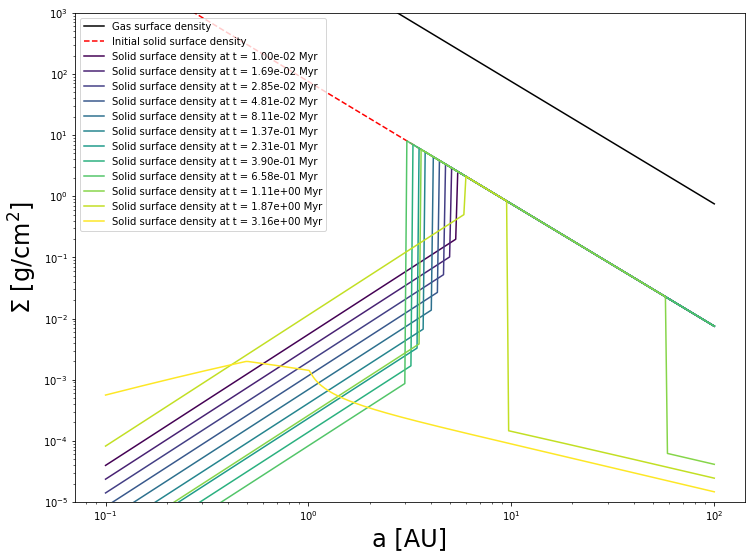

In [71]:
# Testing out the compressed function which handles both regimes
t_array = np.logspace(-2,0.5, 12) * 3.154e13
a_array = np.logspace(-1, 2, 300)

params = 200, 1, 375, 20, 1.6, 1e-4, 100
T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params

sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k-', label="Gas surface density")
plt.loglog(a_array, 1e-2*Sig_gas, 'r--', label="Initial solid surface density")
for i,t in enumerate(t_array):
    #plt.loglog(a_array, f_d_array[i]*Sig_gas, label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
    plt.loglog(a_array, sig_d_array[i], label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.ylim(1e-5,1e3)
plt.legend()
#plt.show()

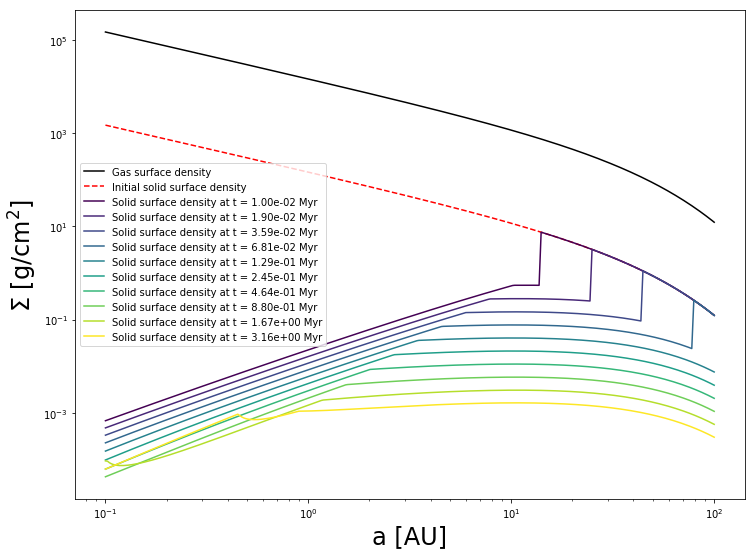

In [72]:
# Making sure it still works
t_array = np.logspace(-2,0.5, 10) * 3.154e13
a_array = np.logspace(-1, 2, 300)
f_d_array = np.zeros([t_array.size, a_array.size])

params = 200, 1, 375, 40, 2, 1e-4, 100
T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
r_c = r_crit
gamma = 1
Sig_gas = sigma_0 * ((a_array/r_c)**(-gamma))*np.exp(-(a_array/r_c)**(2-gamma))

for i,t in enumerate(t_array):
    f_d_array[i] = dust_to_gas(t, a_array, params)

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k-', label="Gas surface density")
plt.loglog(a_array, 1e-2*Sig_gas, 'r--', label="Initial solid surface density")
for i,t in enumerate(t_array):
    plt.loglog(a_array, f_d_array[i]*Sig_gas, label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()
plt.show()

## Can I create a time-series of the colorplots?

In [73]:
# Dr Tau time-series
params = np.loadtxt("drtau_params.txt")
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
print("Stellar mass: ", m_star, "Alpha: ", alpha, "Sigma_0: ", sig_0, "T_0: ", T_0)
m_star = 0.8 #1
r_crit = 20
sig_0 = 315 #500
T_0 = 121 #200 
a_edge = 100
 
t_array = np.logspace(-1,0.5, 12) * 3.154e13
a_array = np.logspace(-1, 2, 300)

params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]

sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

Stellar mass:  0.558 Alpha:  1e-06 Sigma_0:  375.0 T_0:  121.389793367


In [74]:
v_frag = np.array([1,3,10]) *1e2 #1, 3 and 10 m/s
f_f = 0.5 
f_d = 1e-2

rho_int = 1.6
params = [T_0, m_star, sig_0, r_crit, rho_int, 1e-5, a_edge]

s_array = np.logspace(-6,8,1000)
t_g_array = np.zeros(s_array.shape)
t_d_array = np.zeros(s_array.shape)
s_grow = np.zeros(a_array.shape)
s_frag = np.zeros([v_frag.size, a_array.size])
frag_loc = np.zeros(v_frag.size)
for k, a in enumerate(a_array):
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    gamma = 1.0
    Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    #v_kep = np.sqrt(fn.G * mstar/(a * fn.au))
    Om = np.sqrt((G*mstar)/(a*fn.au)**3.)
    v_kep = Om * (a*fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    
    for i, s in enumerate(s_array):
        St = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
        #St = (s * rho_int * np.pi)/(2 * Sig)
        t_g_array[i] = t_grow(s, a, f_d, params)
        t_d_array[i] = (a*fn.au)/(2 * St * c_s**2/(2*v_kep))
        
    s_grow[k] = s_array[np.argmin(abs(t_g_array - t_d_array))]
    st_frag = v_frag**2/(3 * alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        s_frag[j,k] = st_solver(st=st_frag[j], alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig) #f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_int * alpha * c_s**2)
    v_rel = np.sqrt(alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        delta = 1
        s_old = 0
        while delta > 0.01:
            st_frag = v_f**2/(3 * v_rel**2)
            s_frag[j,k] = st_solver(st=st_frag, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
            v_rel = np.sqrt(alpha * c_s**2 * (1 + d_V_12(t_1=st_frag,t_2=0.5*st_frag)))
            delta = (s_frag[j,k] - s_old)/s_frag[j,k]
            s_old = s_frag[j,k]

for j,v_f in enumerate(v_frag):
    frag_loc[j] = a_array[np.argmin(abs(s_frag[j] - s_grow)/s_grow)]

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in double_scalars


(0.1, 10000.0)

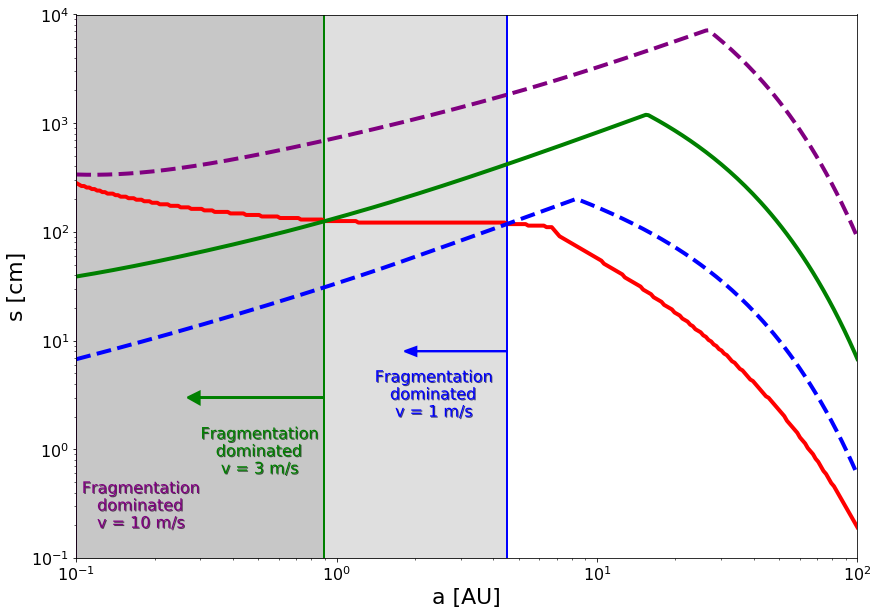

In [75]:
import matplotlib.patheffects as path_effects

axis_font = {'size':'22'} # Sets font size
tick_font = {'size':'16'}
fig = plt.figure(1,figsize=(14,10))
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[0], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[1], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[2], alpha=0.25, color='grey')
plt.text(1.4e0,2e0, 'Fragmentation\n   dominated\n    v = 1 m/s', color='blue', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.text(3e-1,6e-1, 'Fragmentation\n   dominated\n    v = 3 m/s', color='green', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.text(1.05e-1,1.9e-1, 'Fragmentation\n   dominated\n   v = 10 m/s', color='purple', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.axvline(x=frag_loc[0], color='blue', linestyle='-', linewidth=2)
plt.arrow(frag_loc[0], 8, -2.5, 0, linestyle='-', linewidth=2, width=0, head_width=1.5, head_length=.2, fc='blue', ec='blue')
plt.axvline(x=frag_loc[1], color='green', linestyle='-', linewidth=2)
plt.arrow(frag_loc[1], 3, -0.6, 0, linestyle='-', linewidth=2, width=0, head_width=0.8, head_length=.03, fc='green', ec='green')
plt.axvline(x=frag_loc[2], color='purple', linestyle='-', linewidth=2)
plt.arrow(frag_loc[2], 0.8, -.02, 0, linestyle='-', linewidth=2, width=0, head_width=0.2, head_length=.01, fc='purple', ec='purple')
plt.loglog(a_array, s_grow, 'r-', linewidth=4, label='Drift limited particle size')
plt.loglog(a_array, s_frag[1], 'g-', linewidth=4, label='Fragmentation limited particle size, v = 3 m/s')
plt.loglog(a_array, s_frag[0], 'b--', linewidth=4, label='Fragmentation limited particle size, v = 1 m/s')
plt.loglog(a_array, s_frag[2], '--', color='purple', linewidth=4, label='Fragmentation limited particle size, v = 10 m/s')
plt.ylabel('s [cm]', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1,1e2)
plt.ylim(1e-1,1e4)
#plt.legend()

In [76]:
print(frag_loc)

[4.52395623 0.89779516 0.1       ]


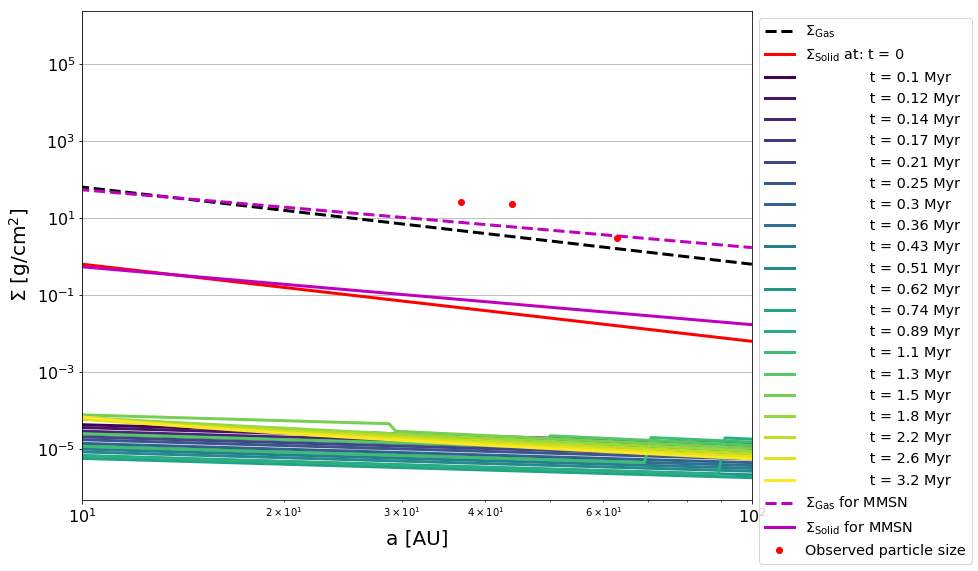

In [77]:
# Plotting surface densities for these times
t_array = np.logspace(-1,0.5, 20) * 3.154e13
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]
axis_font = {'size':'20'} # Sets font size
tick_font = {'size':'16'}

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k--', linewidth=3, label='$\Sigma_\mathrm{Gas}$')
plt.loglog(a_array, 1e-2*Sig_gas, 'r-', linewidth=3, label='$\Sigma_\mathrm{Solid}$ at: t = 0')
for i,t in enumerate(t_array):
    plt.loglog(a_array, sig_d_array[i], label='              t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])

plt.loglog(a_array, 1700*(a_array**(-3./2)), 'm--', label='$\Sigma_\mathrm{Gas}$ for MMSN', linewidth=3)
plt.loglog(a_array, 17*(a_array**(-3./2)), 'm-', label='$\Sigma_\mathrm{Solid}$ for MMSN', linewidth=3)

lambda_obs = np.array([[36.8, 43.9, 62.8], [0.705, 0.722, 0.13]])
T = T_0 * (lambda_obs[0]**(-3/7))
mstar = m_star * fn.m_sun
c_s = np.sqrt((boltzmann*T)/(2.35*mH))
Om = np.sqrt((fn.G*mstar)/(lambda_obs[0]*fn.au)**3.)
v_kep = Om * (lambda_obs[0]*fn.au)
eta = (c_s)**2/(2*(v_kep)**2)
v0 = eta * v_kep
t_disk = 3.154e13

Sig_obs = (2.5 * t_disk * v0 * rho_int * lambda_obs[1]/(2*np.pi))/(lambda_obs[0] * fn.au)
plt.loglog(lambda_obs[0], Sig_obs, 'ro', label='Observed particle size')

#plt.hlines(1000, 0.1, 100)
#plt.vlines(1, 10**-4, 10**4)
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.savefig('DRTau_SurfaceDensity.png')
plt.grid()
plt.show()

#T = T_0 * (a_array**(-3/7))
#c_s = np.sqrt((boltzmann*T)/(2.35*mH))
#v_kep = np.sqrt(fn.G * m_star * fn.m_sun/(a_array*fn.au))
#eta = (c_s)**2/(2*(v_kep)**2)
#v0 = eta*v_kep
#sigma = sigma_0 * ((a_array/r_crit)**(-gamma))*np.exp(-(a_array/r_crit)**(2-gamma))
#Om = np.sqrt((fn.G * m_star * fn.m_sun)/(a_array*fn.au)**3.)
#H = c_s/Om
#rhoGas = fn.gas_density(sigma, H)
#vgas = np.sqrt(v0**2 + alpha*c_s**2.)
#lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
#nu = lambda_mfp*c_s
#Re = (alpha*c_s**2)/(nu*Om)

#st_arr = (a_array*fn.au)/(2 * v0 * t_array[-2])
#v_arr = np.zeros([a_array.size,2])
#s_arr = np.zeros(a_array.size)
#for i, st in enumerate(st_arr):
#    s_arr[i] = st_solver(st=st, alph=alpha, a_au=a_array[i], m_suns=m_star, m_earths=1, temp_in=T[i], sig_in=sigma[i])
#    v_arr[i,0] = vgas[i] * d_V_12(t_1=st,t_2=0.5*st, Re=Re[i])
#    v_arr[i,1] = d_V_12_approx(t_1=st,t_2=0.5*st, Re=Re[i])[1]
    
#fig = plt.figure(1,figsize=(12,9))
#plt.loglog(a_array, v_arr[:,0], 'k-', label="Relative velocity for largest particles")
#plt.ylabel('$v_\mathrm{rel}$ [cm/s]', fontsize=24)
#plt.xlabel('a [AU]', fontsize=24)
#plt.legend()
#plt.show()

#fig = plt.figure(1,figsize=(12,9))
#plt.plot(a_array, v_arr[:,1], 'r-', label="Relative velocity regime")
#plt.show()

#fig = plt.figure(1,figsize=(12,9))
#plt.loglog(a_array, st_arr, 'k-', label="Max particle size")
#plt.ylabel('$St_\mathrm{max}$ [cm]', fontsize=24)
#plt.xlabel('a [AU]', fontsize=24)
#plt.legend()
#plt.show()

In [78]:
a_new = 0
a_interior = np.zeros(t_array.size)
t_drift_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    t_edge = np.array([(16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2), 3*3.154e13])
    
    sig_d = surface_density(a_array, t_edge, params)[1][0]
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    #St = (a_array*fn.au)/(2 * eta*v_kep * t_edge[0]) # Solve for max particle size at pebble front
    #St = np.sqrt(3)/8 * eps_p/eta * sig_d/Sig_gas # Max particle size for all a, at t=t_edge
    if a_PF > a_edge:
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        s = np.sqrt(3)/8 * sig_d/(eta*rho_int)
        St = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
        v_drift = - 2 * v0 * (St/(1 + St**2))
        if i != 0:
            t_old = max(t_edge[0], t_array[i-1])
            t_diff = t - t_old
            #print(t_diff, v_drift)
        else: t_diff = 0
            
        j = np.argmin(abs(a_edge - a_array))
        st_edge = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T) # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        #print("Particle size is ", s_edge, "cm")
        t_diff_arr = np.linspace(t_old, t, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            elif a_drifted < a:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.0001,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[k] = v_drift * (t_diff_arr[k+1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[k])
                a_new = a - a_drifted
            elif a_drifted < a:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_new = 0.0001
            #ind = np.argmin(abs(a_new - a_array))
            #if st_diff > St[ind]:
                #print(st_diff, St[ind])
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au
    
print(a_interior)

[ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 99.9059671  99.64604977 99.33874774 98.97637097 98.55034602 98.0512514
 97.46891164 96.79256491]


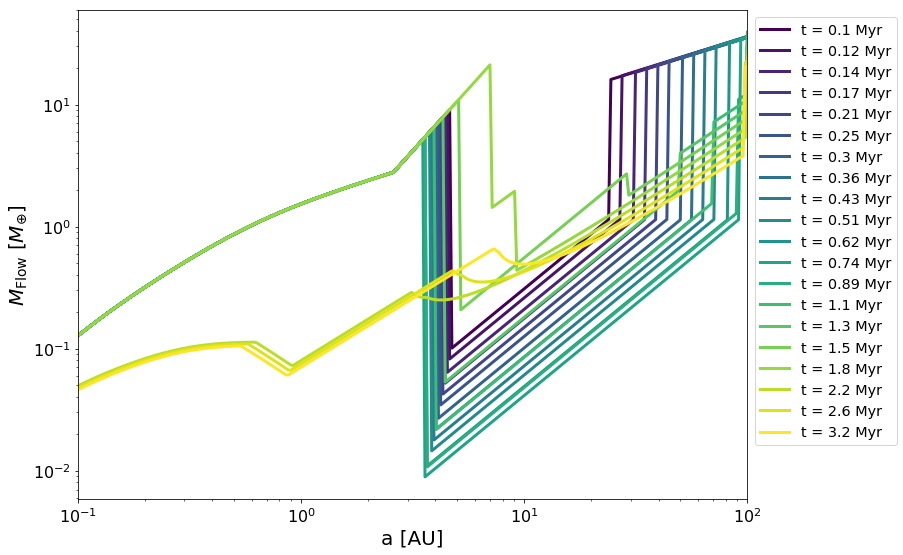

In [79]:
# Plotting flow isolation mass for these times
a_array = np.logspace(-1, 2, 300)
t_array = np.logspace(-1,0.5, 20) * 3.154e13
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]
m_flow_array = np.zeros([t_array.size, a_array.size])

temp = T_0 * (a_array**(-3/7))
cs = fn.sound_speed(temp)
vth = fn.therm_vel(cs)
om = fn.omega(m_star*fn.m_sun, a_array*fn.au)
H_g = cs/om
rho_g = Sig_gas/2./H_g
rho_s = 1.6
vk = a_array*fn.au*om
v0 = cs**2./2./vk
eta = (cs)**2/(2*(vk)**2)
v_g = np.sqrt(v0**2 + alpha*cs**2)
for i,t in enumerate(t_array):
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    s = np.sqrt(3)/8 * sig_d_array[i]/(eta*rho_int)
    st = np.zeros(s.shape)
    if a_PF > a_edge:
        st = (a_array*fn.au)/(2 * v_g * t)
        for j,a in enumerate(a_array):
            if a < a_interior[i]:
                s = np.sqrt(3)/8 * sig_d_array[i][j]/(eta[j]*rho_int)
                st[j] = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[j],temp_in=temp[j])
                #st[j] = np.sqrt(3)/8 * eps_p/eta[j] * sig_d_array[i][j]/Sig_gas[j]
    else:
        a_ind = np.argmin(abs(a_PF - a_array))
        s = np.sqrt(3)/8 * sig_d_array[i]/(eta*rho_int)
        for j,a in enumerate(a_array):
            st[j] = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[j],temp_in=temp[j])
        #st = np.sqrt(3)/8 * eps_p/eta * sig_d_array[i]/Sig_gas
        
        # Now, calculate max particle size exterior to pebble front
        s = (3**(3/2) * f_d * Sig_gas[a_ind:] * st[a_ind:] * cs[a_ind:] * t)/(4 * H_g[a_ind:] * rho_int) #(3 * f_d * Sig_gas[a_ind:] * dV * t)/(4 * H_d * rho_int)
        for j,a in enumerate(a_array[a_ind:]):
            #st[j] = np.sqrt(3)/8 * eps_p/eta[j] * sig_d_array[i][j]/Sig_gas[j]
            st[a_ind+j] = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[a_ind+j],temp_in=temp[a_ind+j])
    # Calculates flow isolation mass
    term1 = np.sqrt(st)
    term2 = 1
    term3 = (cs/v_g * st)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_array[i] = (H_g/(a_array*fn.au))**3 * pre_fac * fn.m_sun

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]
axis_font = {'size':'20'} # Sets font size
tick_font = {'size':'16'}

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, m_flow_array[i]/fn.m_earth, label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])
plt.ylabel('$M_\mathrm{Flow}$ $[M_{\oplus}]$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

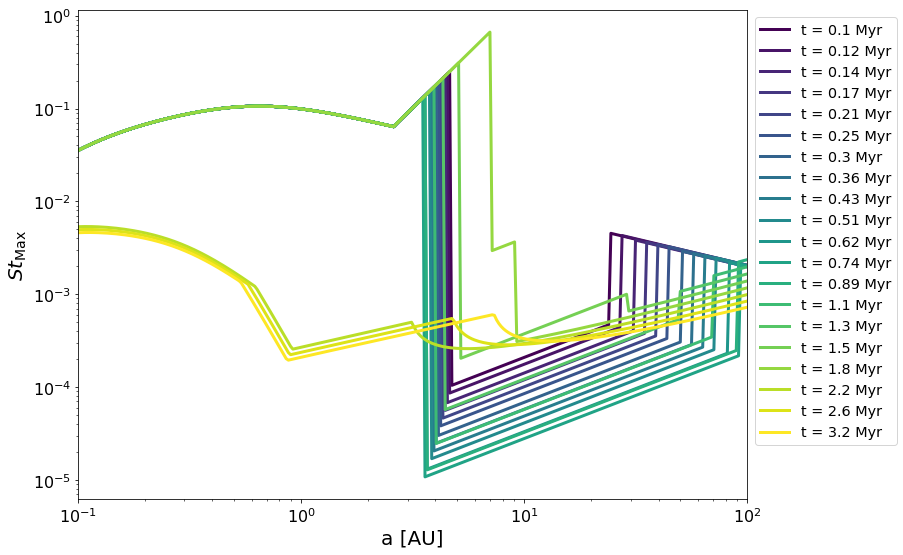

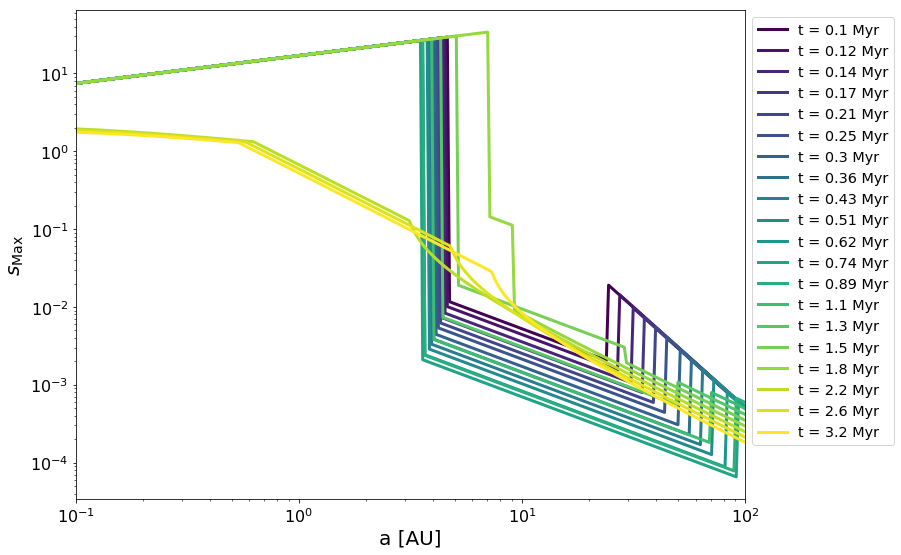

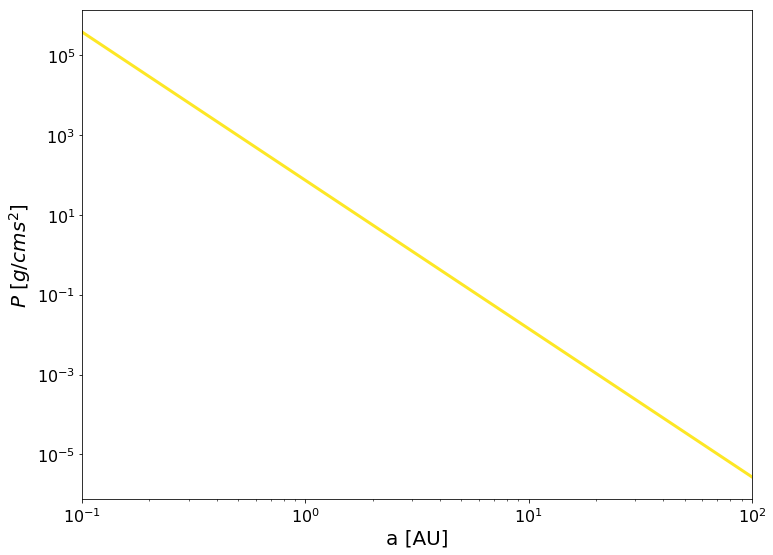

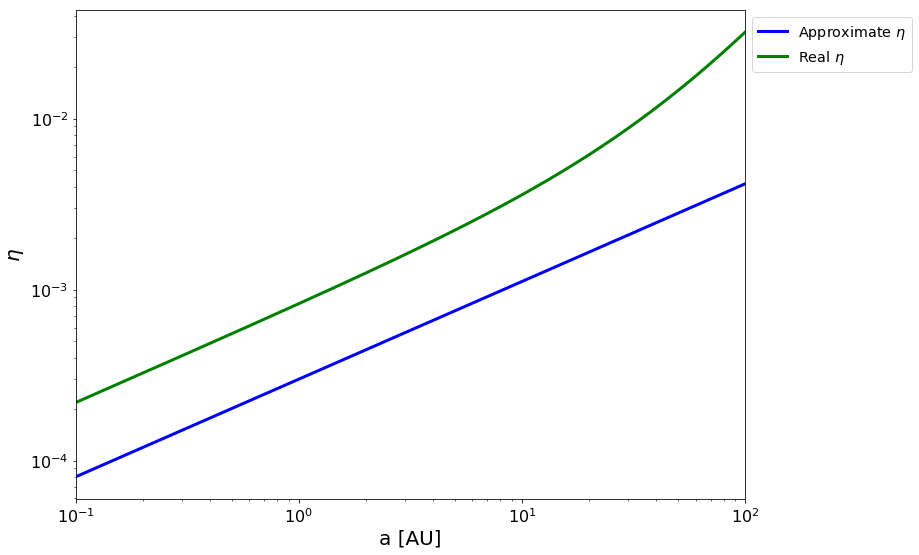

In [80]:
t_array = np.logspace(-1,0.5, 20) * 3.154e13
a_array = np.logspace(-1, 2, 300)
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]
St_arr = np.zeros([t_array.size, a_array.size])
s_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    H_g = c_s/Om
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    #St = (a_array*fn.au)/(2 * eta*v_kep * t_edge[0]) # Solve for max particle size at pebble front
    a_ind = np.argmin(abs(a_PF - a_array))
    
    s_arr[i] = np.sqrt(3)/8 * sig_d_array[i]/(eta*rho_int)
    #st = np.sqrt(3)/8 * eps_p/eta * sig_d_array[i]/Sig_gas
    for j,a in enumerate(a_array):
        #s_arr[i,j] = st_solver(st=st[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[j],temp_in=T[j])
        st[j] = st_rad(rad=s_arr[i,j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[j],temp_in=T[j])
    if a_PF < a_edge:
        # Now, calculate max particle size exterior to pebble front
        s = (3**(3/2) * f_d * Sig_gas[a_ind:] * st[a_ind:] * c_s[a_ind:] * t/10)/(4 * H_g[a_ind:] * rho_int) #(3 * f_d * Sig_gas[a_ind:] * dV * t)/(4 * H_d * rho_int)
        for j,a in enumerate(a_array[a_ind:]):
            st_drift = (a * fn.au * v_kep[a_ind+j])/(c_s[a_ind+j]**2 * t)
            s_drift = st_solver(st=st_drift, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T[a_ind+j], sig_in=Sig_gas[a_ind+j])
            #s_drift = (3**(3/2) * f_d * Sig_gas[a_ind+j])/(8 * rho_int * eta[a_ind+j])
            if s[j] < s_drift:
                st[a_ind+j] = st_rad(rad=s[j],alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[a_ind+j],temp_in=T[a_ind+j])
                s_arr[i,a_ind+j] = s[j]
            elif s_drift < s_arr[i,a_ind+j]:
                st[a_ind+j] = st_rad(rad=s_drift,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig_gas[a_ind+j],temp_in=T[a_ind+j])
                s_arr[i,a_ind+j] = s_drift
    St_arr[i] = st

P_arr = Sig_gas/(c_s/Om) * fn.k * T / fn.mu
    
fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, St_arr[i], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])
plt.ylabel('$St_\mathrm{Max}$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, s_arr[i], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])
#plt.loglog([36.8, 43.9, 62.8],[0.705, 0.722, 0.13], 'ro', label='Observed particle size')
plt.ylabel('$s_\mathrm{Max}$', **axis_font) 
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, P_arr, linewidth=3, color=line_colors[i])
plt.ylabel('$P$ $[g/cm s^2]$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
#plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, eta, linewidth=3, color='blue', label='Approximate $\eta$')
plt.loglog(a_array, eta * (19/7 + a_array/r_crit), linewidth=3, color='green', label='Real $\eta$')
plt.ylabel('$\eta$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

In [81]:
print(sig_0, sig_0 * ((1/r_crit)**(-gamma))*np.exp(-(1/r_crit)**(2-gamma)))

315 5992.745374354498


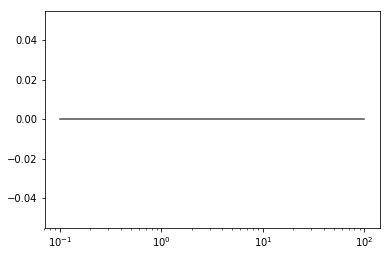

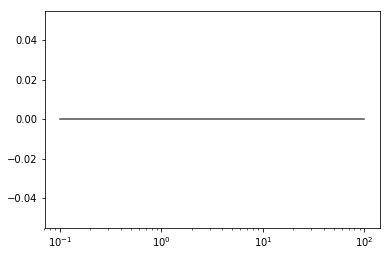

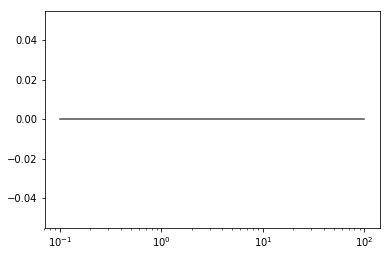

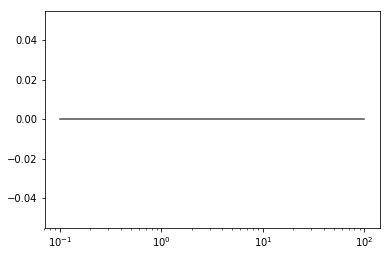

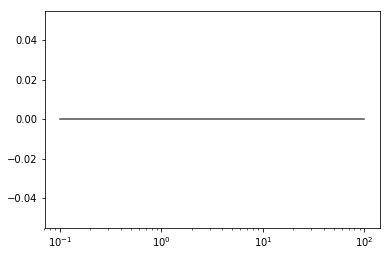

...

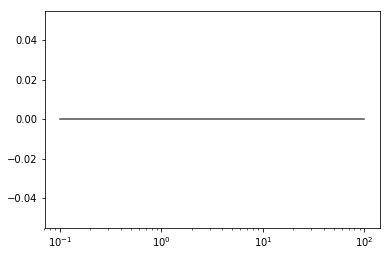

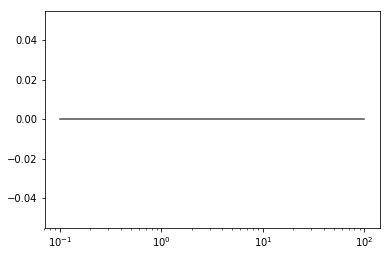

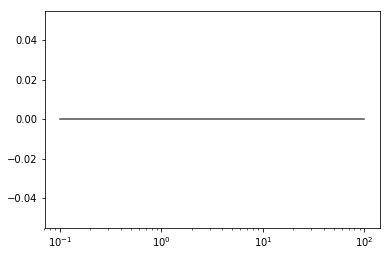

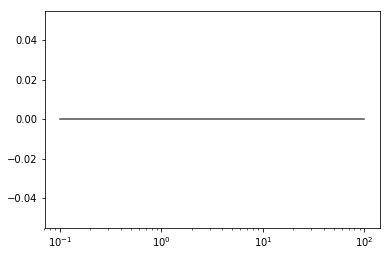

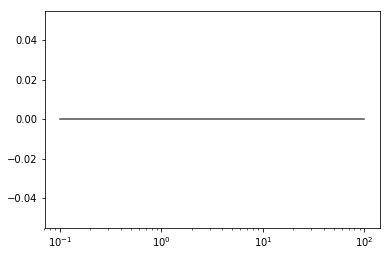

In [82]:
for i,t in enumerate(t_array):
    plt.semilogx(a_array, t_drift_arr[i]/t)
    #plt.ylim(0,-5)
    plt.show()

In [83]:
## Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
m_core_arr = np.logspace(-10, 2, 300)
t_array = np.linspace(0.1, 3, 6) * 3.154e13 #np.logspace(-1,0.5, 6) * 3.154e13
t_grow_DRTau_arr = np.zeros([len(t_array), len(m_core_arr), len(a_array)])

for k, t in enumerate(t_array):
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    for i, m_c in enumerate(m_core_arr):
        for j, a_au in enumerate(a_array):
            sig_gas = Sig_gas[j]
            sig_d = sig_d_array[k,j]
            temp = T_0*a_au**(-3./7.)
            c_s = fn.sound_speed(temp)
            v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
            eta = fn.eta(c_s, v_k)
            v_0 = eta * v_k
            v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
            if a_PF > a_edge and a_au > a_interior[k]:
                St = (a_au*fn.au)/(2 * v_g * t)
            else:
                St = np.sqrt(3)/8 * eps_p/eta * sig_d/sig_gas
            #St = (a_au*fn.au)/(2 * v_g * t)
            s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
            core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_d, sig_g_in=sig_gas)
            core.main(s)
            t_grow_DRTau_arr[k,i,j] = core.t_acc

In [84]:
print(t_array, "Myrs")

[3.15400e+12 2.14472e+13 3.97404e+13 5.80336e+13 7.63268e+13 9.46200e+13] Myrs


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


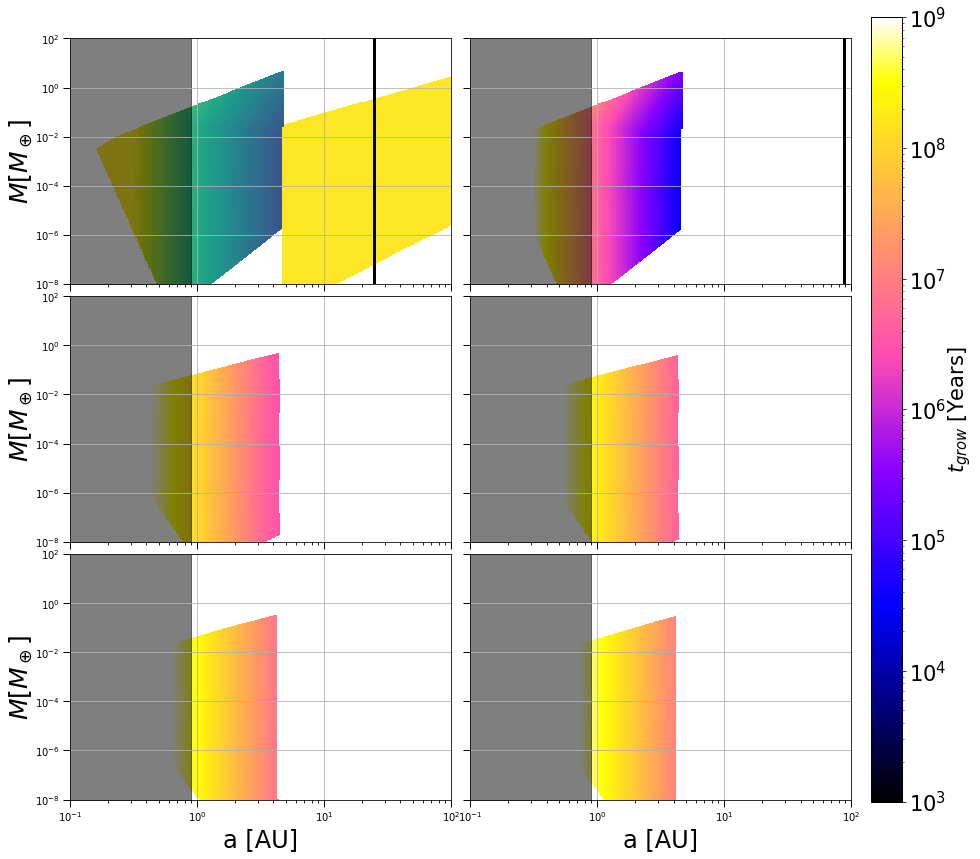

In [85]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(14,14))
gs = gridspec.GridSpec(3, 2)
gs.update(wspace=0.05, hspace=0.05)
axis_font = {'size':'36'} # Sets font size
tick_font = {'size':'32'}

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

X, Y = np.meshgrid(a_array, m_core_arr)
for i,t in enumerate(t_array):
    if i == 0:
        ax = ax0
    if i == 1:
        ax = ax1
    if i == 2:
        ax = ax2
    if i == 3:
        ax = ax3
    if i == 4:
        ax = ax4
    if i == 5:
        ax = ax5
    im = ax.pcolormesh(X,Y,t_grow_DRTau_arr[i], cmap=cmap,norm=LogNorm(),vmin=1e3,vmax=1e9)
    ax.grid()
    cmap = 'gnuplot2'
    im.set_edgecolor('face')
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)
    if i == 4 or i == 5:
        ax.set_xlabel('a [AU]',fontsize=24)
        #ax.fill_betweenx(m_core_arr, 1e-1, a_interior[i], alpha=0.5, color='black')
    else:
        ax.tick_params(labelbottom=False)
    ax.fill_betweenx(m_core_arr, 1e-1, frag_loc[1], alpha=0.5, color='black')
    if i == 0 or i == 2 or i == 4:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    ax.set_ylim(1e-8,1e2)
    ax.set_xlim(1e-1, 1e2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    
    ax.axvline(x=(3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au, linewidth=3, color='k')
    cax = fig.add_axes([0.92, 0.123, 0.03, 0.778])
    cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
    cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
    cb.ax.tick_params(labelsize=21)
    

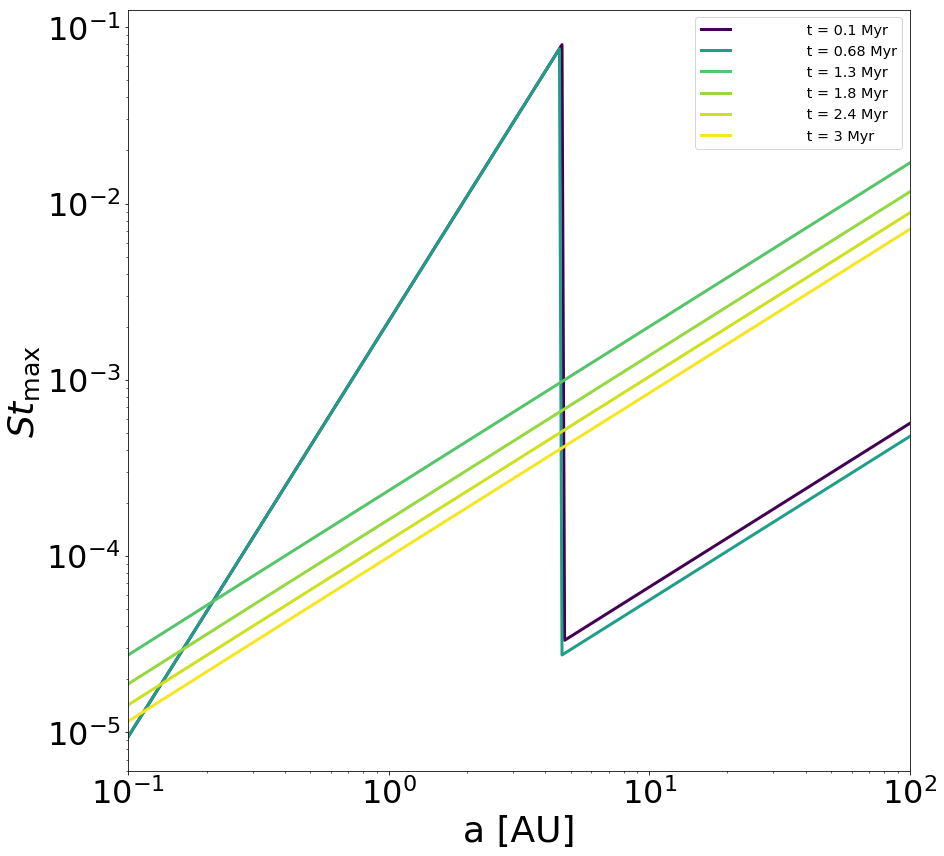

In [86]:
st_max_DRTau_arr = np.zeros([len(t_array), len(a_array)])

for k, t in enumerate(t_array):
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    for j, a_au in enumerate(a_array):
        sig_gas = Sig_gas[j]
        sig_d = sig_d_array[k,j]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        if a_PF > a_edge and a_au > a_interior[k]:
            St = (a_au*fn.au)/(2 * v_g * t)
        else:
            St = np.sqrt(3)/8 * eps_p/eta * sig_d/sig_gas
        st_max_DRTau_arr[k,j] = St
        
        
line_colors = [sm.to_rgba(t) for t in t_array]
fig = plt.figure(figsize=(14,14))
for i, t in enumerate(t_array):
    plt.loglog(a_array, st_max_DRTau_arr[i], 'r-', label='              t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])

plt.ylabel('$St_\mathrm{max}$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()

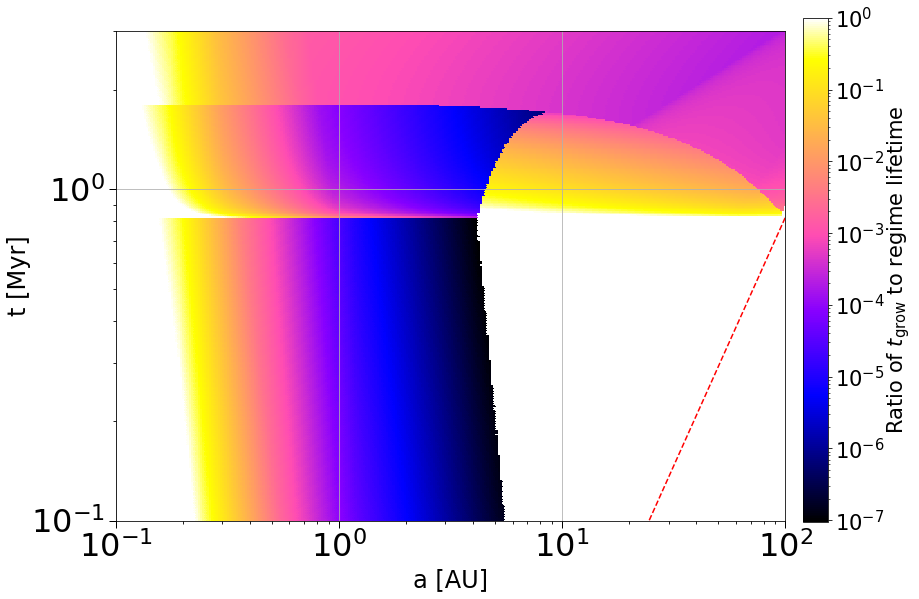

In [87]:
# t_disk gives a_PF
## a_PF plugged into M_flow_iso to get the M_c value
### Use this M_c and a_PF to get a t_grow time
#### Calculate ratio as t_grow/t_reg_lifetime
t_array = np.logspace(-1,0.5, 300) * 3.154e13
a_array = np.logspace(-1, 2, 300)
sig_d_array = np.zeros([t_array.size, a_array.size])

params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

M_c_arr = np.zeros([a_array.size, t_array.size])
t_grow_arr = np.zeros([t_array.size, a_array.size])
ratio_arr = np.zeros([t_array.size, a_array.size])
st_arr = np.zeros([a_array.size, t_array.size])
pf_arr = np.zeros([a_array.size, t_array.size])
eps_p = 0.5

a_interior = np.zeros(t_array.size)
t_drift_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    t_edge = np.array([(16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2), 3*3.154e13])
    
    sig_d = surface_density(a_array, t_edge, params)[1][0]
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    #St = (a_array*fn.au)/(2 * eta*v_kep * t_edge[0]) # Solve for max particle size at pebble front
    St = np.sqrt(3)/8 * eps_p/eta * sig_d/Sig_gas # Max particle size for all a, at t=t_edge
    if a_PF > a_edge:
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
        if i != 0:
            t_old = max(t_edge[0], t_array[i-1])
            t_diff = t - t_old
        else: t_diff = 0
            
        j = np.argmin(abs(a_edge - a_array))
        st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        #print("Particle size is ", s_edge, "cm")
        t_diff_arr = np.linspace(t_old, t, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[k] = v_drift * (t_diff_arr[k+1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new

for j,a_au in enumerate(a_array):
    for i,t in enumerate(t_array):
        # Uses the time-evolving surface densities created above
        sig_gas = Sig_gas
        sig_d = sig_d_array[i]

        # Sets the pebble front location (in AU)
        a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
        pf_arr[j,i] = a_PF
        #a_au = 10 # Chooses a semi-major axis
        a = a_au * fn.au # Converts to cm
        a_au_ind = np.argmin(abs(a_au - a_array))

        # Calculates disk properties
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a)
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)

        # Calculates max particle size
        tau_f = np.sqrt(3)/8 * (eps_p * sig_d[a_au_ind])/(eta * sig_gas[a_au_ind])
        if a_PF > a_edge and a > a_interior[i]: # If in 3rd regime (Diana's)
            St = (a)/(2 * v_g * t)
        else: # If in 2nd regime (LJ14's)
            St = tau_f
        st_arr[j,i] = St

        # Calculates flow isolation mass
        H = (c_s * a)/v_k
        term1 = np.sqrt(St)
        term2 = 1
        term3 = (c_s/v_0 * St)
        min1 = np.minimum(term1, term2)
        pre_fac = np.minimum(min1, term3)
        M_c_arr[j,i] = (H/a)**3 * 3e5 * pre_fac

        # Runs pebble accretion model
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=M_c_arr[j,i], temp_in=temp, sig_in=sig_gas[a_au_ind])
        core = Core(a_core_au=a_PF, m_core_earthmasses=M_c_arr[j,i], alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_d[a_au_ind], sig_g_in=sig_gas[a_au_ind])
        core.main(s)
        t_grow_arr[i,j] = core.t_acc

        # Measures time spent in disk regime
        t_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (np.amax(a_array) * fn.au)**(3/2)
        if a_PF > np.amax(a_array):
            t_dissipation = 3 * 3.154e13 # 3 Myr
            ratio_arr[i,j] = t_grow_arr[i,j]/(t - t_edge)
        else:
            t_start = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_au * fn.au)**(3/2)
            ratio_arr[i,j] = t_grow_arr[i,j]/(t - t_start)
            
t_PF_arr = (16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_array * fn.au)**(3/2)

fig = plt.figure(1,figsize=(12,9))
X, Y = np.meshgrid(a_array, t_array/3.154e13)
im = plt.pcolormesh(X,Y,ratio_arr, cmap=cmap,norm=LogNorm(),vmax=1)
plt.grid()

im.set_edgecolor('face')
ax = plt.gca()
plt.loglog(a_array, t_PF_arr/3.154e13, 'r--')
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r't [Myr]',fontsize=24,labelpad=0.03)
ax.set_ylim(1e-1,3e0)
ax.set_xlim(1e-1, 1e2)
ax.set_xscale('log')
ax.set_yscale('log')
plt.xticks(**tick_font)
plt.yticks(**tick_font)

#ax.axvline(x=(3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au, linewidth=3, color='k')
#ax.fill_betweenx(m_core_arr, 1e-1, frag_loc, alpha=0.5)
cax = fig.add_axes([0.92, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
cb.set_label(label=r'Ratio of $t_\mathrm{grow}$ to regime lifetime',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('DRTau_ratios.png')
plt.show()
            
#print("Pebble Front locations: ", pf_arr)
#print("times: ", t_array/3.154e13)

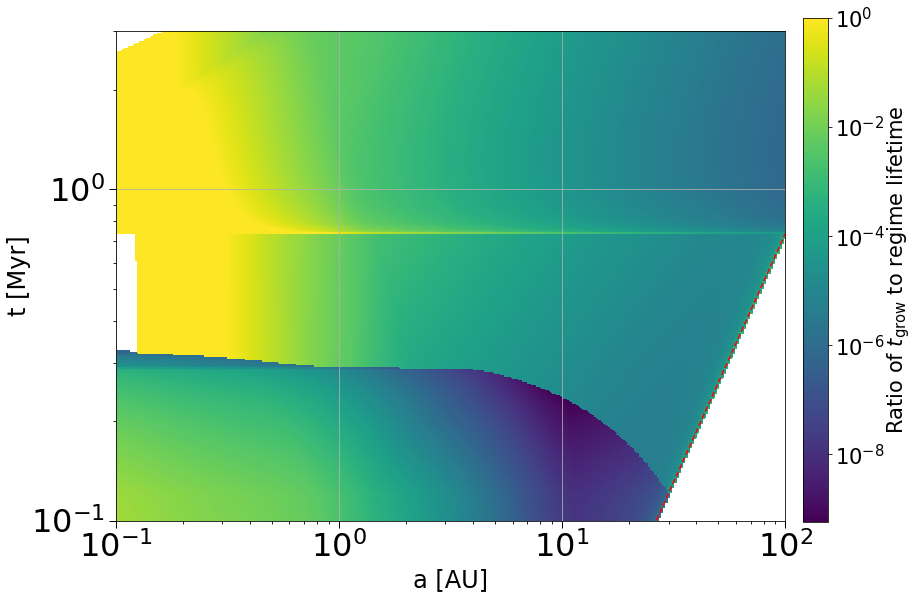

In [67]:
# Copying above to try to compare with different disk sizes and masses
t_array = np.logspace(-1,0.5, 300) * 3.154e13
a_array = np.logspace(-1, 2, 300)
sig_d_array = np.zeros([t_array.size, a_array.size])

params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, 30] #[T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

M_c_arr = np.zeros([a_array.size, t_array.size])
t_grow_arr = np.zeros([t_array.size, a_array.size])
ratio_arr = np.zeros([t_array.size, a_array.size])
st_arr = np.zeros([a_array.size, t_array.size])
pf_arr = np.zeros([a_array.size, t_array.size])
eps_p = 0.5

a_interior = np.zeros(t_array.size)
t_drift_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    t_edge = np.array([(16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2), 3*3.154e13])
    
    sig_d = surface_density(a_array, t_edge, params)[1][0]
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    #St = (a_array*fn.au)/(2 * eta*v_kep * t_edge[0]) # Solve for max particle size at pebble front
    St = np.sqrt(3)/8 * eps_p/eta * sig_d/Sig_gas # Max particle size for all a, at t=t_edge
    if a_PF > a_edge:
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
        if i != 0:
            t_old = max(t_edge[0], t_array[i-1])
            t_diff = t - t_old
        else: t_diff = 0
            
        j = np.argmin(abs(a_edge - a_array))
        st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        #print("Particle size is ", s_edge, "cm")
        t_diff_arr = np.linspace(t_old, t, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[k] = v_drift * (t_diff_arr[k+1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new

for j,a_au in enumerate(a_array):
    for i,t in enumerate(t_array):
        # Uses the time-evolving surface densities created above
        sig_gas = Sig_gas
        sig_d = sig_d_array[i]

        # Sets the pebble front location (in AU)
        a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
        pf_arr[j,i] = a_PF
        #a_au = 10 # Chooses a semi-major axis
        a = a_au * fn.au # Converts to cm
        a_au_ind = np.argmin(abs(a_au - a_array))

        # Calculates disk properties
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a)
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)

        # Calculates max particle size
        tau_f = np.sqrt(3)/8 * (eps_p * sig_d[a_au_ind])/(eta * sig_gas[a_au_ind])
        if a_PF > a_edge and a > a_interior[i]: # If in 3rd regime (Diana's)
            St = (a)/(2 * v_g * t)
        else: # If in 2nd regime (LJ14's)
            St = tau_f
        st_arr[j,i] = St

        # Calculates flow isolation mass
        H = (c_s * a)/v_k
        term1 = np.sqrt(St)
        term2 = 1
        term3 = (c_s/v_0 * St)
        min1 = np.minimum(term1, term2)
        pre_fac = np.minimum(min1, term3)
        M_c_arr[j,i] = (H/a)**3 * 3e5 * pre_fac

        # Runs pebble accretion model
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=M_c_arr[j,i], temp_in=temp, sig_in=sig_gas[a_au_ind])
        core = Core(a_core_au=a_PF, m_core_earthmasses=M_c_arr[j,i], alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_d[a_au_ind], sig_g_in=sig_gas[a_au_ind])
        core.main(s)
        t_grow_arr[i,j] = core.t_acc

        # Measures time spent in disk regime
        t_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (np.amax(a_array) * fn.au)**(3/2)
        if a_PF > np.amax(a_array):
            t_dissipation = 3 * 3.154e13 # 3 Myr
            ratio_arr[i,j] = t_grow_arr[i,j]/(t - t_edge)
        else:
            t_start = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_au * fn.au)**(3/2)
            ratio_arr[i,j] = t_grow_arr[i,j]/(t - t_start)
            
t_PF_arr = (16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_array * fn.au)**(3/2)

fig = plt.figure(1,figsize=(12,9))
X, Y = np.meshgrid(a_array, t_array/3.154e13)
im = plt.pcolormesh(X,Y,ratio_arr, cmap=cmap,norm=LogNorm(),vmax=1)
plt.grid()

im.set_edgecolor('face')
ax = plt.gca()
plt.loglog(a_array, t_PF_arr/3.154e13, 'r--')
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r't [Myr]',fontsize=24,labelpad=0.03)
ax.set_ylim(1e-1,3e0)
ax.set_xlim(1e-1, 1e2)
ax.set_xscale('log')
ax.set_yscale('log')
plt.xticks(**tick_font)
plt.yticks(**tick_font)

cax = fig.add_axes([0.92, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
cb.set_label(label=r'Ratio of $t_\mathrm{grow}$ to regime lifetime',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.show()

In [66]:
ind = 182
print(a_interior[ind], t_edge / 3.154e13)
ind = 192
print(a_interior[ind], t_array[ind] / 3.154e13)

0.0 0.8223094243953138
0.001265059160485471 0.9187782428863335


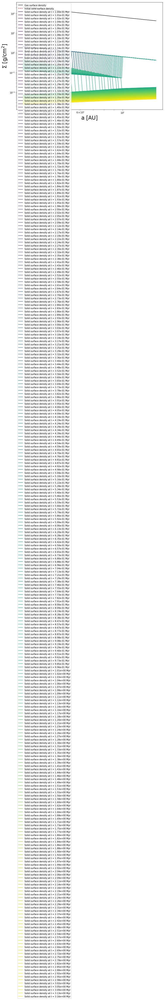

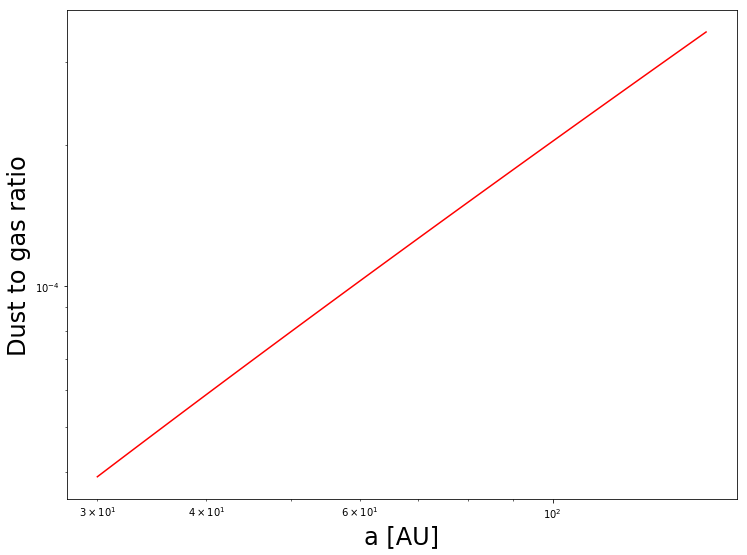

In [67]:
# Comparing to Diana's dust-to-gas ratio
age = 3.154e13
m_star = 0.8
alpha = 1e-3
T_0 = 121.389793367
r_c = 20
gamma = 1.0
sigma_0 = 315.
a_edge = 100
params = [T_0, m_star, sigma_0, r_c, rho_int, alpha, a_edge]
a_array = np.linspace(30,150,100)

sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

# Plotting surface densities for these times
cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k-', label="Gas surface density")
plt.loglog(a_array, 1e-2*Sig_gas, 'r--', label="Initial solid surface density")
for i,t in enumerate(t_array):
    plt.loglog(a_array, sig_d_array[i], label='Solid surface density at t = {time} Myr'.format(time=f"{t/3.154e13:.2e}"), color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.legend()
plt.show()

dtg_arr = dust_to_gas(age, a_array, params)
fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, dtg_arr, 'r-')
plt.ylabel('Dust to gas ratio', fontsize=24)
plt.xlabel('a [AU]', fontsize=24)
plt.show()

In [68]:
def rate_odeint(m,t,p):
    alph,a_au,m_suns,temp,sig_gas,sig_p,st,verbose = p
    cs = fn.sound_speed(temp)
    vth = fn.therm_vel(cs)
    om = fn.omega(m_suns*fn.m_sun, a_au*fn.au)
    H_g = cs/om
    rho_g = sig_gas/2./H_g
    rho_s = 1.6
    vk = a_au*fn.au*om
    v0 = cs**2./2./vk
    v_g = np.sqrt(v0**2 + alph*cs**2)
    m_earths = m/fn.m_earth
    st = (a_au*fn.au)/(2 * v_g * t)
    s = st_solver(st=st,alph=alph,a_au=a_au,sig_in=sig_gas,temp_in=temp,m_earths=m_earths)
    if np.isnan(s) or s < 0 or m < 0:
        print("Bad radius/mass")
        s = np.abs(s)
        m = np.abs(m)
        
    # Calculates flow isolation mass
    term1 = np.sqrt(st)
    term2 = 1
    term3 = (cs/v_g * st)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    M_flow = (H_g/(a_au*fn.au))**3 * pre_fac * fn.m_sun
    B = 2*np.sqrt(3)
    M_iso = (4 * np.pi * B * (a_au*fn.au)**2 * sig_p)**(3/2) / (3 * m_suns*fn.m_sun)**(1/2) # GF isolation mass
    M_peb_iso = 20 * fn.m_earth * (H_g/(a_au*fn.au)/0.05)**3
    m_iso = min(M_iso, M_peb_iso)
    
    rp = (3*m/(4. * np.pi * rho_s))**(1./3.) # Core radius
    v_esc = np.sqrt(2*fn.G*m/rp) 

    H_turb = np.sqrt(alph/(alph+st))*H_g
    H_KH = 2*v0/om
    H_p = max(H_turb,H_KH)
    rho_solid = sig_p/2./H_p
    v_turb = np.sqrt(alph)*cs/np.sqrt(1 + st)
    v_lam = v0*np.sqrt(1 + 4.*st**2.)/(1 + st**2.)
    v_inf = max(v_turb,v_lam)
    bGF = rp*(1 + (v_esc/v_inf)**2.)**(0.5)
    H_acc = min(H_p,bGF)
    sig_acc = 4*bGF*H_acc
    rate_GF = rho_solid*sig_acc*v_inf

    core = Core(a_core_au=a_au, m_core_earthmasses=m_earths, alpha=alph, m_star_solarmasses=m_suns, temp_in=temp,
                sig_p_in=sig_p, sig_g_in=sig_gas)
    core.main(s)
    
    # Trying out a loop to tests growth with particles smaller than maximally sized
    t_acc = core.t_acc
    count = 0
    while t_acc == 0:
        core.main(.9*s)
        t_acc = core.t_acc
        count = count + 1
        if count >= 10:
            break
    if t_acc == 0:
        rate_peb = rate_GF
    else:        
        rate_peb = m/(core.t_acc*3.154e7)
    r_ws = core.r_ws
    h_r = core.r_hill
    b_r = core.r_bondi
    b_shear = core.r_sh
    r_tmp = min(r_ws,b_shear)
    r_stab = min(r_tmp,h_r)
    if bGF > r_stab:
        if m > M_iso:
            if m > M_flow:
                return 0
            else:
                rate = rate_peb
                if np.isinf(rate_peb):
                    if verbose: print("Pebble accretion is off")
                    return 0
        else:
            rate = rate_GF
        if np.isinf(rate_GF):
            print("Gravitational Focusing is broken")
    else:
        if m > M_flow:
            return 0
        rate = rate_peb
        if np.isinf(rate_peb):
            if verbose: print("Pebble accretion is off")
            rate = rate_GF
    return rate

In [69]:
# Try integrating core masses as the disk evolves
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
t_array = np.logspace(-1,0.5, 100) * 3.154e13
a_array = np.array([1,3,5,10,30,100])
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

n_int = 1000 # Number of internal integrations between disk evolution time-steps
m_arr = np.zeros((len(a_array), len(m0_arr), n_int*len(t_array)))


for i,a_au in enumerate(a_array):
    sig_gas = Sig_gas[i]
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
    v_0 = fn.eta(c_s, v_k) * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    for j,m0 in enumerate(m0_arr):
        for k,t in enumerate(t_array):
            if k == 0:
                mass = m0
                m_final = m0
            else:
                mass = m_final
            st = (a_au*fn.au)/(2 * v_g * t)
            
            if k == 99:
                times = np.logspace(np.log10(t),np.log10(t + (t - t_array[k-1])),n_int) #np.linspace(t,t + (t - t_array[-2]),100)
            else:
                times = np.logspace(np.log10(t),np.log10(t_array[k+1]),n_int) #np.linspace(t,t_array[k+1],100)
            p = [alpha,a_au,m_star,temp,sig_gas,sig_d_array[k,i],st,0]
            wsol = odeint(rate_odeint,mass,times,args=(p,))
            m_arr[i,j,n_int*k:n_int*k+n_int] = wsol.flatten()
            m_final = max(m_final, wsol.flatten()[-1]) #m_arr[i,j,100*k+99]

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


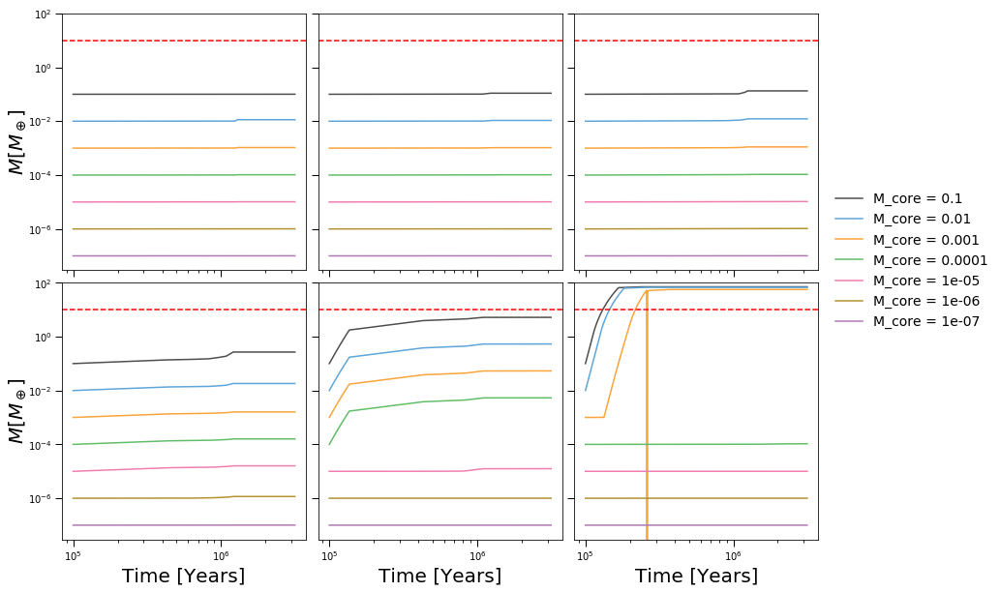

In [70]:
fig = plt.figure(figsize=(14,10))
plt.title(r'$\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.05, hspace=0.05)
axis_font = {'size':'36'} # Sets font size
tick_font = {'size':'32'}
t_array = np.logspace(-1,0.5, 100000) * 3.154e13

ax0 = plt.subplot(gs[0,0])
ax1 = plt.subplot(gs[0,1])
ax2 = plt.subplot(gs[0,2])
ax3 = plt.subplot(gs[1,0])
ax4 = plt.subplot(gs[1,1])
ax5 = plt.subplot(gs[1,2])

for i in range(len(m0_arr)):
    ax0.loglog(t_array*fn.sec_to_years,m_arr[0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax1.loglog(t_array*fn.sec_to_years,m_arr[1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax2.loglog(t_array*fn.sec_to_years,m_arr[2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax3.loglog(t_array*fn.sec_to_years,m_arr[3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax4.loglog(t_array*fn.sec_to_years,m_arr[4,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax5.loglog(t_array*fn.sec_to_years,m_arr[5,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))

for i in range(6):
    if i == 0:ax = ax0
    if i == 1: ax = ax1
    if i == 2: ax = ax2
    if i == 3: ax = ax3
    if i == 4: ax = ax4
    if i == 5: ax = ax5
    
    if i == 3 or i == 4 or i == 5:
        ax.set_xlabel('Time [Years]',fontsize=20)
    else:
        ax.tick_params(labelbottom=False) 
    if i == 0 or i == 3:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=20,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    
    ax.axhline(y=1e1,linestyle='dashed',color='r')
    ax.set_ylim(3e-8,1e2)
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)

lgd = plt.gca().legend(bbox_to_anchor=[1.02,1.4],frameon=False, fontsize=14)

plt.tight_layout()

In [71]:
t_array = np.logspace(-1,0.5, 100) * 3.154e13
print(t_array[20] / 3.154e13)
print(t_array[40] / 3.154e13)
print(t_array[66] / 3.154e13)
print(t_array[86] / 3.154e13)

0.20092330025650468
0.40370172585965547
1.0
2.009233002565047


In [72]:
# Inserting cores at a variety of times
# Try integrating core masses as the disk evolves
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
t_array = np.logspace(-1,0.5, 100) * 3.154e13
a_array = np.array([1,3,5,10])
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

n_int = 1000 # Number of internal integrations between disk evolution time-steps
t_start_arr = np.array([0, 40, 66, 86])
m_arr = np.zeros((len(t_start_arr), len(a_array), len(m0_arr), n_int*len(t_array)))

for l, t_start in enumerate(t_start_arr):
    for i,a_au in enumerate(a_array):
        sig_gas = Sig_gas[i]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        for j,m0 in enumerate(m0_arr):
            for k,t in enumerate(t_array):
                if k < t_start:
                    m_arr[l,i,j,n_int*k:n_int*k+n_int] = m0
                    m_final = m0
                    mass = m0
                else:
                    if k == 0:
                        m_final = m0
                        mass = m0
                    else:
                        mass = m_final
                    st = (a_au*fn.au)/(2 * v_g * t)

                    if k == 99:
                        times = np.logspace(np.log10(t),np.log10(t + (t - t_array[k-1])),n_int) #np.linspace(t,t + (t - t_array[-2]),100)
                    else:
                        times = np.logspace(np.log10(t),np.log10(t_array[k+1]),n_int) #np.linspace(t,t_array[k+1],100)
                    p = [alpha,a_au,m_star,temp,sig_gas,sig_d_array[k,i],st,0]
                    wsol = odeint(rate_odeint,mass,times,args=(p,))
                    m_arr[l,i,j,n_int*k:n_int*k+n_int] = wsol.flatten()
                    m_final = max(m_final, wsol.flatten()[-1]) #m_arr[i,j,100*k+99]

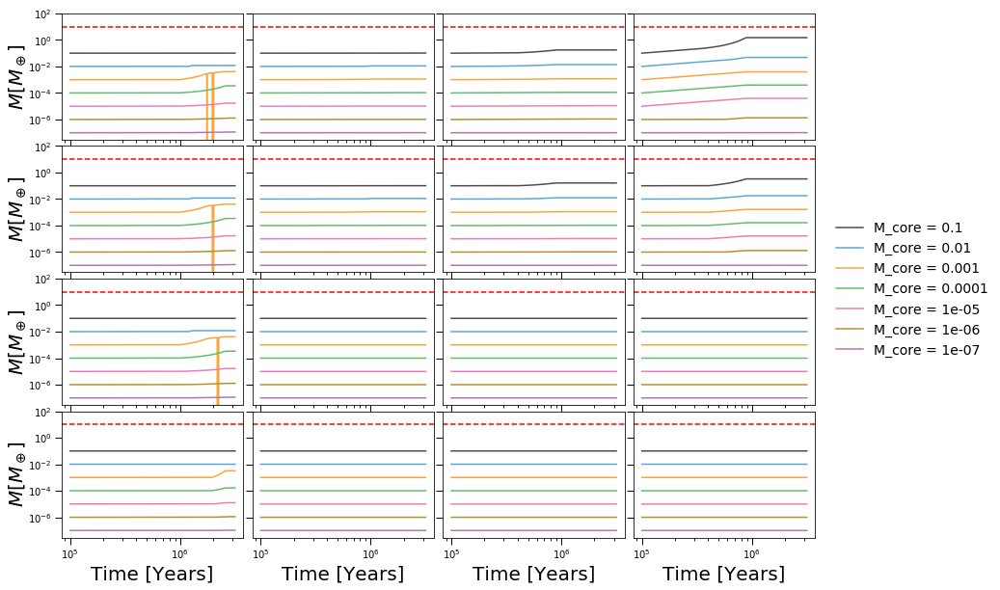

In [73]:
fig = plt.figure(figsize=(14,10))
plt.title(r'$\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
gs = gridspec.GridSpec(4, 4)
gs.update(wspace=0.05, hspace=0.05)
axis_font = {'size':'36'} # Sets font size
tick_font = {'size':'32'}
t_array = np.logspace(-1,0.5, 100000) * 3.154e13

ax0 = plt.subplot(gs[0,0])
ax1 = plt.subplot(gs[0,1])
ax2 = plt.subplot(gs[0,2])
ax3 = plt.subplot(gs[0,3])
ax4 = plt.subplot(gs[1,0])
ax5 = plt.subplot(gs[1,1])
ax6 = plt.subplot(gs[1,2])
ax7 = plt.subplot(gs[1,3])
ax8 = plt.subplot(gs[2,0])
ax9 = plt.subplot(gs[2,1])
ax10 = plt.subplot(gs[2,2])
ax11 = plt.subplot(gs[2,3])
ax12 = plt.subplot(gs[3,0])
ax13 = plt.subplot(gs[3,1])
ax14 = plt.subplot(gs[3,2])
ax15 = plt.subplot(gs[3,3])


for i in range(len(m0_arr)):
    ax0.loglog(t_array*fn.sec_to_years,m_arr[0,0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax1.loglog(t_array*fn.sec_to_years,m_arr[0,1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax2.loglog(t_array*fn.sec_to_years,m_arr[0,2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax3.loglog(t_array*fn.sec_to_years,m_arr[0,3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax4.loglog(t_array*fn.sec_to_years,m_arr[1,0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax5.loglog(t_array*fn.sec_to_years,m_arr[1,1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax6.loglog(t_array*fn.sec_to_years,m_arr[1,2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax7.loglog(t_array*fn.sec_to_years,m_arr[1,3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax8.loglog(t_array*fn.sec_to_years,m_arr[2,0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax9.loglog(t_array*fn.sec_to_years,m_arr[2,1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax10.loglog(t_array*fn.sec_to_years,m_arr[2,2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax11.loglog(t_array*fn.sec_to_years,m_arr[2,3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax12.loglog(t_array*fn.sec_to_years,m_arr[3,0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax13.loglog(t_array*fn.sec_to_years,m_arr[3,1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax14.loglog(t_array*fn.sec_to_years,m_arr[3,2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax15.loglog(t_array*fn.sec_to_years,m_arr[3,3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
                

for i in range(16):
    if i == 0: ax = ax0
    elif i == 1: ax = ax1
    elif i == 2: ax = ax2
    elif i == 3: ax = ax3
    elif i == 4: ax = ax4
    elif i == 5: ax = ax5
    elif i == 6: ax = ax6
    elif i == 7: ax = ax7
    elif i == 8: ax = ax8
    elif i == 9: ax = ax9
    elif i == 10: ax = ax10
    elif i == 11: ax = ax11
    elif i == 12: ax = ax12
    elif i == 13: ax = ax13
    elif i == 14: ax = ax14
    elif i == 15: ax = ax15
    
    if i == 12 or i == 13 or i == 14 or i == 15:
        ax.set_xlabel('Time [Years]',fontsize=20)
    else:
        ax.tick_params(labelbottom=False) 
    if i == 0 or i == 4 or i == 8 or i == 12:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=20,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    
    ax.axhline(y=1e1,linestyle='dashed',color='r')
    ax.set_ylim(3e-8,1e2)
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)

lgd = plt.gca().legend(bbox_to_anchor=[2.02,2.6],frameon=False, fontsize=14)

plt.tight_layout()

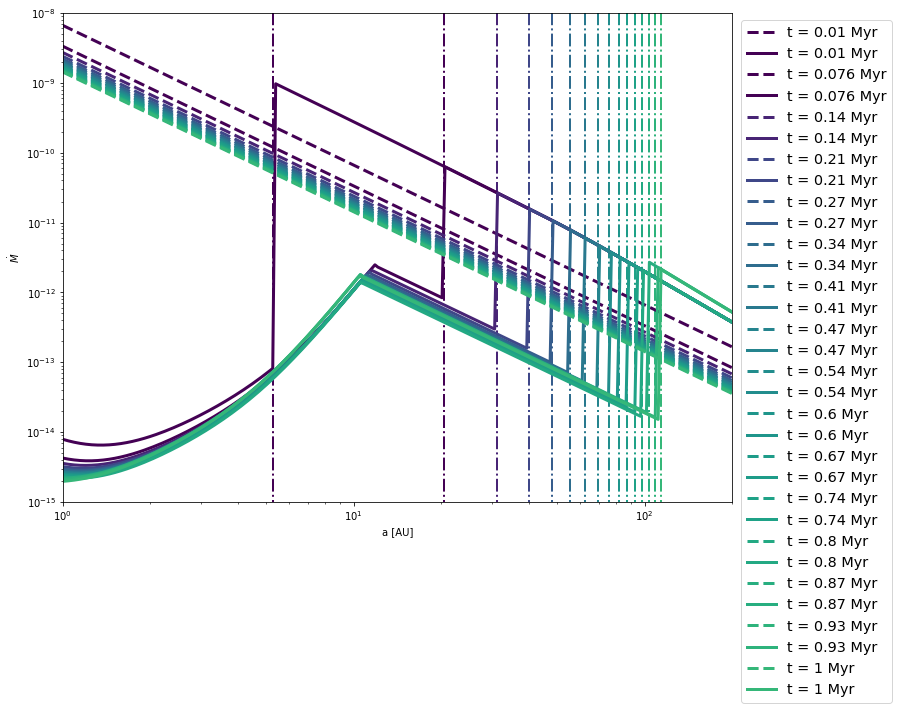

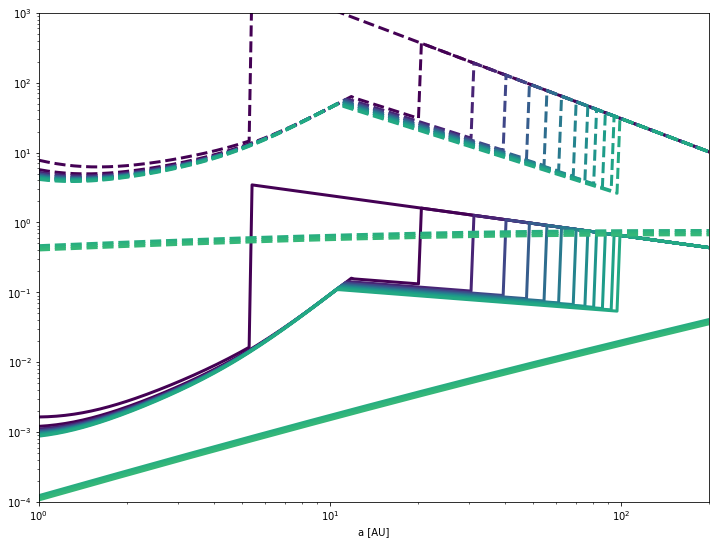

In [74]:
## Plotting m_dot comparison
#m_core_arr = np.logspace(-10, 2, 300)
t_array = np.linspace(0.01, 1, 16) * 3.154e13 #np.logspace(-1,0.5, 6) * 3.154e13
line_colors = [sm.to_rgba(t) for t in t_array]
a_array = np.logspace(0, 3, 300)
M_dot_arr = np.zeros([a_array.size, t_array.size, 2])
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, 30, rho_int, alpha, 300]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]
a_PF_arr = np.zeros(t_array.size)

drag_test = np.zeros(M_dot_arr.shape)

for k, t in enumerate(t_array):
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    a_PF_ind = np.argmin(abs(a_array - a_PF))
    a_PF_arr[k] = a_PF
    for j, a_au in enumerate(a_array):
        sig_gas = Sig_gas[j]
        sig_d = sig_d_array[k,j]
        sig_gas_PF = Sig_gas[a_PF_ind]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_th = np.sqrt(8/np.pi)*c_s
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        Om = v_k/(a_au*fn.au)
        rho_gas = sig_gas * Om/c_s
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        #if a_PF > a_edge and a_au > a_interior[k]:
        #    St = (a_au*fn.au)/(2 * v_g * t)
        #else:
        #    St = np.sqrt(3)/8 * eps_p/eta * sig_d/sig_gas
        #St = np.sqrt(3)/8 * eps_p/eta * sig_d/sig_gas
        #s = (v_th * St)/Om * rho_gas/rho_int # Epstein regime
        #s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=1, temp_in=temp, sig_in=sig_gas)
        if a_PF > a_edge:
            St = (a_au*fn.au)/(2 * v_g * t)
            s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=1, temp_in=temp, sig_in=sig_gas)
        else:
            s = np.sqrt(3)/8 * sig_d/(eta*rho_int)
            St = Om*fn.ts_eps(rho_int, sig_gas/(2*c_s/Om), s, np.sqrt(8/np.pi)*c_s) #st_rad(rad=s,alph=alpha,a_au=a_au,m_suns=m_star,m_earths=1,sig_in=sig_gas,temp_in=temp)
            
        drag_test[j,k,0] = s
        drag_test[j,k,1] = St
        
        m = 4/3 * np.pi * s**3 * rho_int
        
        #m_dot_global_check = 2 * np.pi * St * v_0 * np.pi*
        m_dot_global = 4 * np.pi/3 * (a_PF*fn.au)**2 / t * f_d * sig_gas_PF / (a_au*fn.au)**2
        #m_dot_global = 9.5e-5 * fn.m_earth/2.154e7 * (sig_0/500) * m_star**(1/3) * (t/3.154e13)**(-1/3) #sig_0 * t**(-1/3) * f_d**(5/3) * (fn.G * fn.m_sun * m_star)**(1/3)
        #m_dot_local = sig_d * (Om/c_s) * np.sqrt(St/alpha) * np.pi * s**2 * (np.sqrt(alpha) * c_s * d_V_12(t_1=St,t_2=0.5*St)) * sig_d/m
        m_dot_local = sig_d * (Om/c_s) * np.sqrt(St) * np.pi * s**2 * (c_s * d_V_12(t_1=St,t_2=0.5*St)) * sig_d/m
        M_dot_arr[j,k,0] = m_dot_global
        M_dot_arr[j,k,1] = m_dot_local

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    #plt.hlines(1000, 0.1, 100)
    plt.vlines(a_PF_arr[i], 10**-20, 1, color=line_colors[i], linewidth=2, linestyle='-.')

    plt.loglog(a_array, M_dot_arr[:,i,0], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='--')
    plt.loglog(a_array, M_dot_arr[:,i,1], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='-')
plt.ylabel('$\dot{M}$')#, **axis_font)
plt.xlabel('a [AU]')#, **axis_font)
#plt.xticks(**tick_font)
#plt.yticks(**tick_font)
plt.xlim(1e0, 2e2)
plt.ylim(1e-15, 1e-8)
plt.legend(loc=1, bbox_to_anchor=(1.25, 1., 0., 0.), fontsize='x-large')
plt.show()

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.loglog(a_array, drag_test[:,i,0], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='--')
    plt.loglog(a_array, drag_test[:,i,1], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='-')
#plt.ylabel('$\dot{M}$')#, **axis_font)
plt.xlabel('a [AU]')#, **axis_font)
#plt.xticks(**tick_font)
#plt.yticks(**tick_font)
plt.xlim(1e0, 2e2)
plt.ylim(1e-4, 1e3)
#plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.show()



#plt.loglog(a_array, M_dot_arr[:,0,0], 'g--', label='global m_dot')
#plt.loglog(a_array, M_dot_arr[:,0,1], 'r--', label='local m_dot')

In [75]:
# Now, replace the functions above w/ purely functional versions (get rid of debugging stuff)
boltzmann = 1.380658e-16 #cgs
mH = 1.6733000e-24 #grams
G = 6.67259e-8 #cgs
SB = 5.6704e-5
Ldot = 3.839e33
rsun = 7e10

def dust_to_gas(disk_age, a, params):    
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    time_grow = disk_age
    r_c = r_crit
    gamma = 1
    sigma = sigma_0 * ((a/r_c)**(-gamma)) #*np.exp(-(a/r_c)**(2-gamma))
        
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt((G*mstar)/(a*fn.au)**3.)
    H = c_s/Om
    rhoGas = fn.gas_density(sigma, H)
    v_kep = Om * (a*fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    v0 = eta*v_kep
    
    St_max = (a*fn.au)/(2 * v0 * time_grow)
    # Assumed that M_core = 1 earth mass
    s_max = np.zeros(St_max.shape)
    for i, St in enumerate(St_max):
        s_max[i] = st_solver(st=St, alph=alpha, a_au=a[i], m_suns=m_star, m_earths=1, temp_in=T[i], sig_in=sigma[i])
    
    H_d = H * np.sqrt(alpha/(alpha + St_max))
    
    vgas = np.sqrt(v0**2 + alpha*c_s**2.)
    lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
    nu = lambda_mfp*c_s
    Re = (alpha*c_s**2)/(nu*Om) # Why is this v_turb**2/v_th**2?
    deltaV = np.zeros(St_max.size)
    for idx,t in enumerate(St_max):
        deltaV[idx] = vgas[idx] * d_V_12(t,0.5*t,1,Re[idx])

    f = 0.55
    f_d = (8 * rho_int * s_max * H_d)/(3 * sigma * time_grow * deltaV * f)
    
    t_g_arr = np.zeros(a.shape) # Growth times for largest particle
    for i, a_au in enumerate(a):
        t_g_arr[i] = abs(t_grow(s_max[i], a_au, f_d[i], params)) # The time required to grow a particle to the max particle size
        if abs(t_g_arr[i]) > abs(time_grow):
            f_d[i] = 1e-2
    return f_d
    
def sig_p_simple(Sig_g, M_star, f_d, a_PF, a, t):
    eps_p = 0.5
    eps_d = 0.5/10 #Growth efficiency, eps_d = eps_g,d/xi from eqn ~9 of LJ14
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    a_applicable = np.trim_zeros(np.where(a < a_PF, a, 0))
    Sig_p = 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g
    
    T = T_0 * (a**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    v_kep = om *(a * fn.au) #np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)

    Sig_p[a_applicable.size:] = 1e-2 * Sig_g[a_applicable.size:]
    return Sig_p


def surface_density_simple(a_arr, t_disk, params):
    T_0, m_star, sigma_0, r_crit, rho_int, alpha, a_edge = params
    
    gamma = 1
    sigma_g = sigma_0 * ((a_arr/r_crit)**(-gamma)) #*np.exp(-(a_arr/r_crit)**(2-gamma))
    f_d = 1e-2
    
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_disk**(2/3) / fn.au
    t_edge = (16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2)
    
    T = T_0 * (a_arr**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_arr * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_arr * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    
    a_interior = np.zeros(t_disk.size)
    sigma_d = np.zeros([t_disk.size, a_arr.size])
    for i,t in enumerate(t_disk):
        if a_PF[i] > a_edge: #np.amax(a_arr):
            # If in Powell et al. 2017 regime, find drift time for maximally size particle
            if a_interior[i-1] != 0:
                a = a_interior[i-1]
            else: a = a_edge
                
            St = np.sqrt(3)/8 * eps_p/eta * sig_p(sigma_g, m_star, f_d, a_PF[i], a_arr, t)/sigma_g # Max particle size for all a, at t=t_edge
            j = np.argmin(abs(a - a_arr))
            gamma = 1.0
            Sig = sigma_0 * ((a/r_crit)**(-gamma)) #*np.exp(-(a/r_crit)**(2-gamma))
            T = T_0 * (a**(-3/7))
            c_s = np.sqrt((boltzmann*T)/(2.35*mH))
            Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
            v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
            eta = (c_s)**2/(2*(v_kep)**2)
            v0 = eta * v_kep
            v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
            if i != 0:
                t_old = max(t_edge, t_disk[i-1])
                t_diff = t - t_old
            else: t_diff = 0
 
            j = np.argmin(abs(a_edge - a_arr))
            st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
            s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
            t_diff_arr = np.linspace(t_old, t, 1000)
            a_diff_arr = np.zeros(t_diff_arr.size)
            for k, t_d in enumerate(t_diff_arr):
                if k == 0:
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                elif a_drifted < a:
                    T = T_0 * (a_new**(-3/7))
                    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                    eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                    v0 = eta * v_kep
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                else:
                    st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.0001,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
                v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
                if k == 0:
                    a_diff_arr[0] = v_drift * (t_diff_arr[1] - t_d) / fn.au
                    a_drifted = abs(a_diff_arr[0])
                    a_new = a - a_drifted
                elif a_drifted < a:
                    a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                    a_drifted = a_drifted + abs(a_diff_arr[k])
                    a_new = a - a_drifted
                else:
                    a_new = 0.0001
            # Finds the locations to which maximally sized particles have drifted by new disk time
            a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au

            a_updated = np.trim_zeros(np.where(a_arr > a_interior[i], a_arr, 0))
            sigma_g_updated = np.trim_zeros(np.where(a_arr > a_interior[i], sigma_g, 0))
            a_old = np.trim_zeros(np.where(a_arr <= a_interior[i], a_arr, 0))
            sigma_g_old = np.trim_zeros(np.where(a_arr <= a_interior[i], sigma_g, 0))
            
            sigma_d_updated = dust_to_gas(t, a_updated, params) * sigma_g_updated
            sigma_d_old = sig_p_simple(sigma_g_old, m_star, f_d, a_PF[i], a_old, t)
            sigma_d[i] = np.append(sigma_d_old, sigma_d_updated) #dust_to_gas(t, a_arr, params) * sigma_g
        else:
            sigma_d[i] = sig_p_simple(sigma_g, m_star, f_d, a_PF[i], a_arr, t)
    #print(a_interior)
    return [sigma_g, sigma_d]

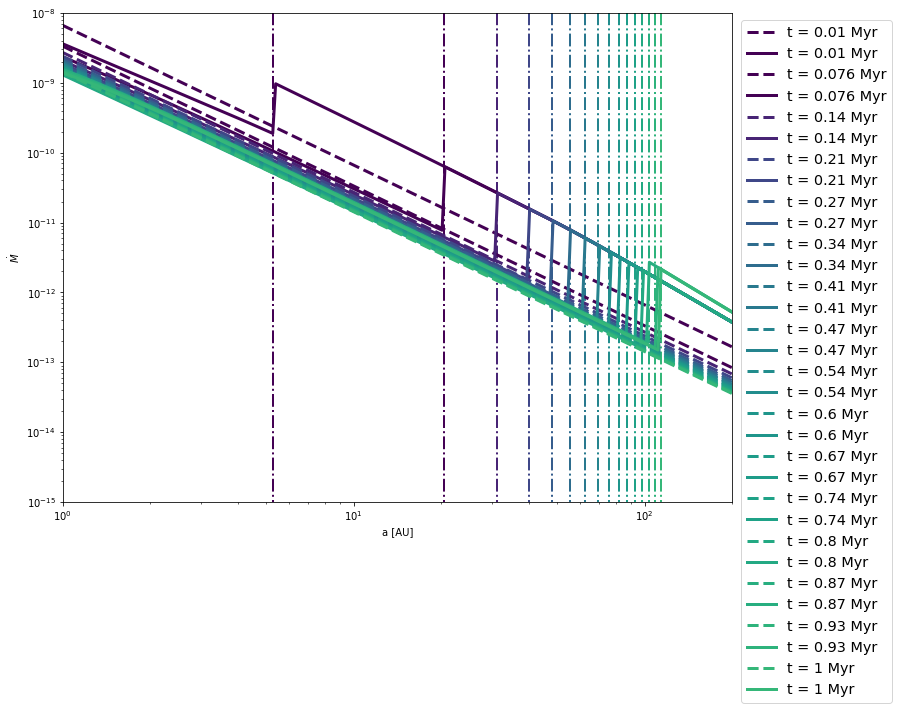

In [76]:
## Plotting m_dot comparison
#m_core_arr = np.logspace(-10, 2, 300)
t_array = np.linspace(0.01, 1, 16) * 3.154e13 #np.logspace(-1,0.5, 6) * 3.154e13
line_colors = [sm.to_rgba(t) for t in t_array]
a_array = np.logspace(0, 3, 300)
M_dot_arr = np.zeros([a_array.size, t_array.size, 2])
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, 30, rho_int, alpha, 300]
sd = surface_density_simple(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]
a_PF_arr = np.zeros(t_array.size)

drag_test = np.zeros(M_dot_arr.shape)

for k, t in enumerate(t_array):
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    a_PF_ind = np.argmin(abs(a_array - a_PF))
    a_PF_arr[k] = a_PF
    for j, a_au in enumerate(a_array):
        sig_gas = Sig_gas[j]
        sig_d = sig_d_array[k,j]
        sig_gas_PF = Sig_gas[a_PF_ind]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_th = np.sqrt(8/np.pi)*c_s
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        Om = v_k/(a_au*fn.au)
        rho_gas = sig_gas * Om/c_s
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)

        if a_PF > a_edge:
            St = (a_au*fn.au)/(2 * v_g * t)
            s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=1, temp_in=temp, sig_in=sig_gas)
        else:
            s = np.sqrt(3)/8 * sig_d/(eta*rho_int)
            St = Om*fn.ts_eps(rho_int, sig_gas/(2*c_s/Om), s, np.sqrt(8/np.pi)*c_s) #st_rad(rad=s,alph=alpha,a_au=a_au,m_suns=m_star,m_earths=1,sig_in=sig_gas,temp_in=temp)
            
        drag_test[j,k,0] = s
        drag_test[j,k,1] = St
        
        m = 4/3 * np.pi * s**3 * rho_int
        m_dot_global = 4 * np.pi/3 * (a_PF*fn.au)**2 / t * f_d * sig_gas_PF / (a_au*fn.au)**2
        m_dot_local = sig_d * (Om/c_s) * np.sqrt(St) * np.pi * s**2 * (c_s * d_V_12(t_1=St,t_2=0.5*St)) * sig_d/m
        M_dot_arr[j,k,0] = m_dot_global
        M_dot_arr[j,k,1] = m_dot_local

fig = plt.figure(1,figsize=(12,9))
for i,t in enumerate(t_array):
    plt.vlines(a_PF_arr[i], 10**-20, 1, color=line_colors[i], linewidth=2, linestyle='-.')
    plt.loglog(a_array, M_dot_arr[:,i,0], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='--')
    plt.loglog(a_array, M_dot_arr[:,i,1], label='t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i], linestyle='-')
plt.ylabel('$\dot{M}$')#, **axis_font)
plt.xlabel('a [AU]')#, **axis_font)
plt.xlim(1e0, 2e2)
plt.ylim(1e-15, 1e-8)
plt.legend(loc=1, bbox_to_anchor=(1.25, 1., 0., 0.), fontsize='x-large')
plt.show()

In [77]:
# Let's try numerically caluclating a_PF
t_array = np.linspace(0.1,3, 30) * 3.154e13 #np.logspace(-1,0.5, 6) * 3.154e13
line_colors = [sm.to_rgba(t) for t in t_array]
a_array = np.logspace(0, 3, 300)
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, 30, rho_int, alpha, 300]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]
a_PF_arr = np.zeros(t_array.size)

for k, t in enumerate(t_array):
    #a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    #a_PF_ind = np.argmin(abs(a_array - a_PF))
    #a_PF_arr[k] = a_PF
    a_temp_arr = np.zeros(a_array.size)
    for j, a_au in enumerate(a_array):
        sig_gas = Sig_gas[j]
        sig_d = sig_d_array[k,j]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_th = np.sqrt(8/np.pi)*c_s
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        Om = v_k/(a_au*fn.au)
        rho_gas = sig_gas * Om/c_s
        eta = fn.eta(c_s, v_k)
        v_0 = eta * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    
        s = np.sqrt(3)/8 * sig_d/(eta*rho_int)
        St = st_rad(rad=s,alph=alpha,a_au=a_au,m_suns=m_star,m_earths=1,sig_in=sig_gas,temp_in=temp)
        t_s = St/Om
        a_PF = np.sqrt((t_s * c_s**2 * t)/10)/fn.au
        a_temp_arr[j] = a_PF
        #print(a_PF, a_au)

    #plt.loglog(a_array, a_temp_arr)
    #plt.loglog(a_array, a_array)
    #plt.show()
    a_PF_arr[k] = a_array[np.argmax(abs(a_temp_arr[1:] - a_temp_arr[:-1]))]


print(a_PF_arr)
print((3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_array**(2/3) / fn.au)
#print(a_temp_arr)

[ 24.24462017  38.48436109  50.77917243  61.08761608  70.17038287
  80.60361409  88.40733402  96.96657893 103.92556829 111.38398265
 119.37766417 127.94502732 133.99552697 140.33215376 146.96843861
 153.9185523  161.19733574 164.96480741 172.76596647 176.80381785
 185.16484179 189.49247719 198.45354578 203.09176209 207.83838186
 212.69593867 217.66702532 222.7542952  227.96046373 233.28830979]
[ 24.54576026  38.96396567  51.05723885  61.85144009  71.77223841
  81.04831466  89.82044069  98.18304106 106.20333658 113.93132676
 121.40547663 128.65617996 135.70798114 142.58106205 149.29227207
 155.85586266 162.28402444 168.58728822 174.77483019 180.85470795
 186.83404567 192.71918132 198.51578505 204.22895541 209.86329823
 215.42299201 220.91184238 226.33332788 231.69063872 236.98670973]


In [78]:
# FT Tau time-series
params = np.loadtxt("fttau_params.txt")
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
print("Stellar mass: ", m_star, "Alpha: ", alpha, "Sigma_0: ", sig_0, "T_0: ", T_0)
m_star = 0.55
r_crit = 28
sig_0 = 183
T_0 = 89

t_array = np.logspace(-1,0.5, 12) * 3.154e13
a_array = np.logspace(-1, 2, 300)
sig_d_array = np.zeros([t_array.size, a_array.size])

params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]

sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

Stellar mass:  0.298 Alpha:  1e-06 Sigma_0:  125.0 T_0:  89.0565323094


In [79]:
# Make the same frag vs. drift limited particle size plot, but for FT Tau
v_frag = np.array([1,3,10]) *1e2 #1, 3 and 10 m/s
f_f = 0.5 
f_d = 1e-2

rho_int = 1.6
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]

s_array = np.logspace(-6,8,1000)
t_g_array = np.zeros(s_array.shape)
t_d_array = np.zeros(s_array.shape)
s_grow = np.zeros(a_array.shape)
s_frag = np.zeros([v_frag.size, a_array.size])
frag_loc = np.zeros(v_frag.size)
for k, a in enumerate(a_array):
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    gamma = 1.0
    Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    v_kep = np.sqrt(fn.G * mstar/(a * fn.au))
    Om = np.sqrt((G*mstar)/(a*fn.au)**3.)
    v_kep = Om * (a*fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    
    for i, s in enumerate(s_array):
        St = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
        #St = (s * rho_int * np.pi)/(2 * Sig)
        t_g_array[i] = t_grow(s, a, f_d, params)
        t_d_array[i] = (a*fn.au)/(2 * St * c_s**2/(2*v_kep))
        
    s_grow[k] = s_array[np.argmin(abs(t_g_array - t_d_array))]
    st_frag = v_frag**2/(3 * alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        s_frag[j,k] = st_solver(st=st_frag[j], alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig) #f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_int * alpha * c_s**2)
    v_rel = np.sqrt(alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        delta = 1
        s_old = 0
        while delta > 0.01:
            st_frag = v_f**2/(3 * v_rel**2)
            s_frag[j,k] = st_solver(st=st_frag, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
            #s_frag[k] = (2 * Sig * st_frag)/(rho_int * np.pi)
            v_rel = np.sqrt(alpha * c_s**2 * (1 + d_V_12(t_1=st_frag,t_2=0.5*st_frag)))
            delta = (s_frag[j,k] - s_old)/s_frag[j,k]
            s_old = s_frag[j,k]

for j,v_f in enumerate(v_frag):
    frag_loc[j] = a_array[np.argmin(abs(s_frag[j] - s_grow)/s_grow)]

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in double_scalars


(0.1, 10000.0)

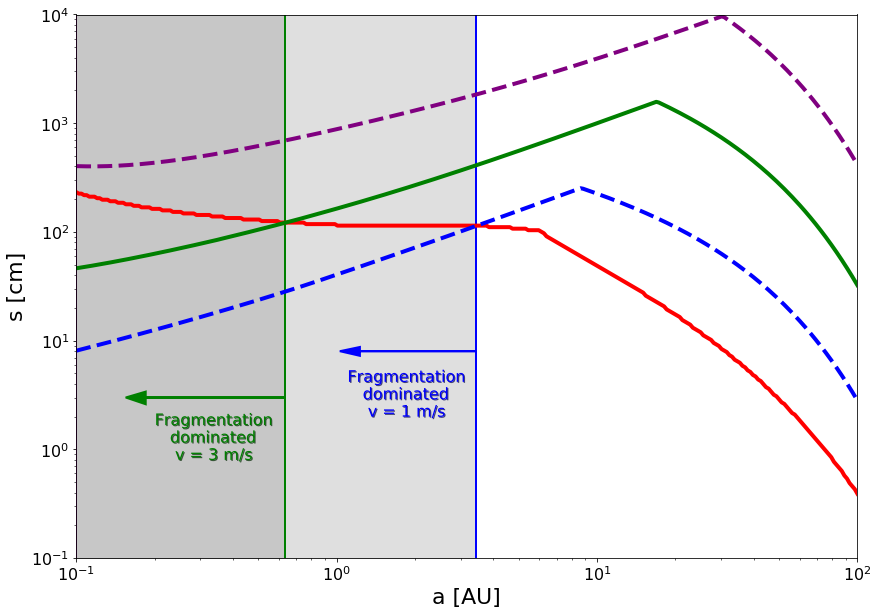

In [80]:
import matplotlib.patheffects as path_effects

axis_font = {'size':'22'} # Sets font size
tick_font = {'size':'16'}
fig = plt.figure(1,figsize=(14,10))
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[0], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[1], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[2], alpha=0.25, color='grey')
plt.text(1.1e0,2e0, 'Fragmentation\n   dominated\n    v = 1 m/s', color='blue', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.text(2e-1,8e-1, 'Fragmentation\n   dominated\n    v = 3 m/s', color='green', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
#plt.text(1.05e-1,1.9e-1, 'Fragmentation\n   dominated\n   v = 10 m/s', color='purple', **tick_font,
#                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.axvline(x=frag_loc[0], color='blue', linestyle='-', linewidth=2)
plt.arrow(frag_loc[0], 8, -2.2, 0, linestyle='-', linewidth=2, width=0, head_width=1.5, head_length=.2, fc='blue', ec='blue')
plt.axvline(x=frag_loc[1], color='green', linestyle='-', linewidth=2)
plt.arrow(frag_loc[1], 3, -0.45, 0, linestyle='-', linewidth=2, width=0, head_width=0.8, head_length=.03, fc='green', ec='green')
plt.axvline(x=frag_loc[2], color='purple', linestyle='-', linewidth=2)
plt.arrow(frag_loc[2], 0.8, -.02, 0, linestyle='-', linewidth=2, width=0, head_width=0.2, head_length=.01, fc='purple', ec='purple')
plt.loglog(a_array, s_grow, 'r-', linewidth=4, label='Drift limited particle size')
plt.loglog(a_array, s_frag[1], 'g-', linewidth=4, label='Fragmentation limited particle size, v = 3 m/s')
plt.loglog(a_array, s_frag[0], 'b--', linewidth=4, label='Fragmentation limited particle size, v = 1 m/s')
plt.loglog(a_array, s_frag[2], '--', color='purple', linewidth=4, label='Fragmentation limited particle size, v = 10 m/s')
plt.ylabel('s [cm]', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1,1e2)
plt.ylim(1e-1,1e4)
#plt.legend()

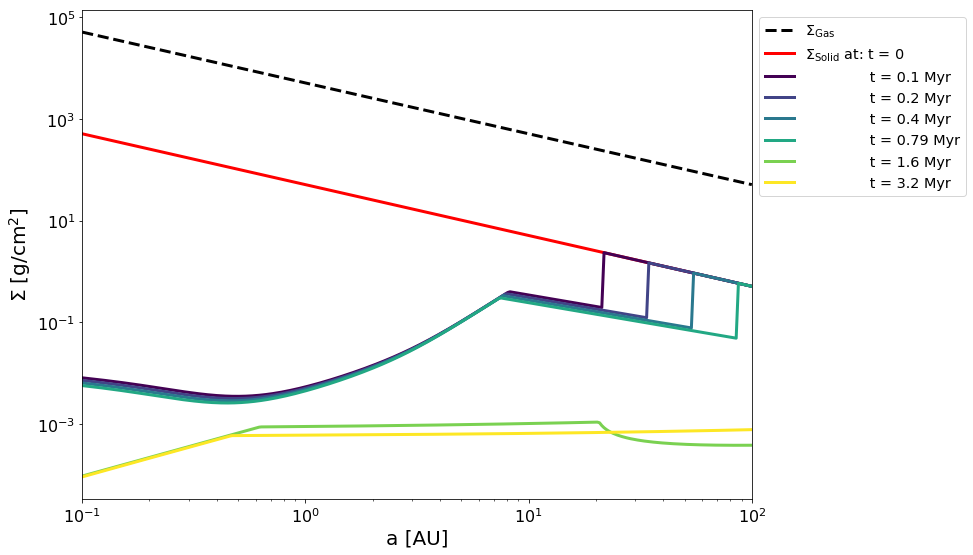

In [81]:
# Plotting surface densities for these times
t_array = np.logspace(-1,0.5, 6) * 3.154e13
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]
axis_font = {'size':'20'} # Sets font size
tick_font = {'size':'16'}

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k--', linewidth=3, label='$\Sigma_\mathrm{Gas}$')
plt.loglog(a_array, 1e-2*Sig_gas, 'r-', linewidth=3, label='$\Sigma_\mathrm{Solid}$ at: t = 0')
for i,t in enumerate(t_array):
    plt.loglog(a_array, sig_d_array[i], label='              t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 1e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.savefig('FTTau_SurfaceDensity.png')
plt.show()

T = T_0 * (a_array**(-3/7))
c_s = np.sqrt((boltzmann*T)/(2.35*mH))
v_kep = np.sqrt(fn.G * m_star * fn.m_sun/(a_array*fn.au))
eta = (c_s)**2/(2*(v_kep)**2)
v0 = eta*v_kep
sigma = sigma_0 * ((a_array/r_crit)**(-gamma))*np.exp(-(a_array/r_crit)**(2-gamma))
Om = np.sqrt((fn.G * m_star * fn.m_sun)/(a_array*fn.au)**3.)
H = c_s/Om
rhoGas = fn.gas_density(sigma, H)
vgas = np.sqrt(alpha*c_s**2.)
lambda_mfp = fn.mean_free_path(fn.mu,rhoGas,fn.cross) #1./((rhoGas/(2.3*mH))*10.**(-15.))
nu = lambda_mfp*c_s
Re = (alpha*c_s**2)/(nu*Om)

st_arr = (a_array*fn.au)/(2 * v0 * t_array[-1])
v_arr = np.zeros(a_array.size)
s_arr = np.zeros(a_array.size)
for i, st in enumerate(st_arr):
    s_arr[i] = st_solver(st=st, alph=alpha, a_au=a_array[i], m_suns=m_star, m_earths=1, temp_in=T[i], sig_in=sigma[i])
    v_arr[i] = vgas[i] * d_V_12(t_1=st,t_2=0.5*st, Re=Re[i])

In [82]:
a_interior = np.zeros(t_array.size)
t_drift_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    t_edge = np.array([(16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2), 3*3.154e13])
    
    sig_d = surface_density(a_array, t_edge, params)[1][0]
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    St = np.sqrt(3)/8 * eps_p/eta * sig_d/Sig_gas # Max particle size for all a, at t=t_edge
    if a_PF > a_edge:
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
        if i != 0:
            t_old = max(t_edge[0], t_array[i-1])
            t_diff = t - t_old
        else: t_diff = 0
            
        j = np.argmin(abs(a_edge - a_array))
        st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        t_diff_arr = np.linspace(t_old, t, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            elif a_drifted < a:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.01,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[k] = v_drift * (t_diff_arr[k+1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[k])
                a_new = a - a_drifted
            elif a_drifted < a:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_new = 0.0001
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au
        
print(a_interior)

[0.     0.     0.     0.     0.0001 0.0001]


In [83]:
# Calculates growth times for each snapshot of the disk
m_core_arr = np.logspace(-10, 2, 400)
t_grow_FTTau_arr = np.zeros([len(t_array), len(m_core_arr), len(a_array)])

for k, t in enumerate(t_array):
    for i, m_c in enumerate(m_core_arr):
        for j, a_au in enumerate(a_array):
            sig_gas = Sig_gas[j]
            sig_d = sig_d_array[k,j]
            temp = T_0*a_au**(-3./7.)
            c_s = fn.sound_speed(temp)
            v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
            v_0 = fn.eta(c_s, v_k) * v_k
            v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
            eta = (c_s)**2/(2*(v_k)**2)
            if a_PF > a_edge and a > a_interior[k]: # If in 3rd regime (Diana's)
                St = (a_au*fn.au)/(2 * v_g * t)
            else: # If in 2nd regime (LJ14's)
                St = np.sqrt(3)/8 * (eps_p * sig_d)/(eta * sig_gas)
            s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
            core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_d, sig_g_in=sig_gas)
            core.main(s)
            t_grow_FTTau_arr[k,i,j] = core.t_acc

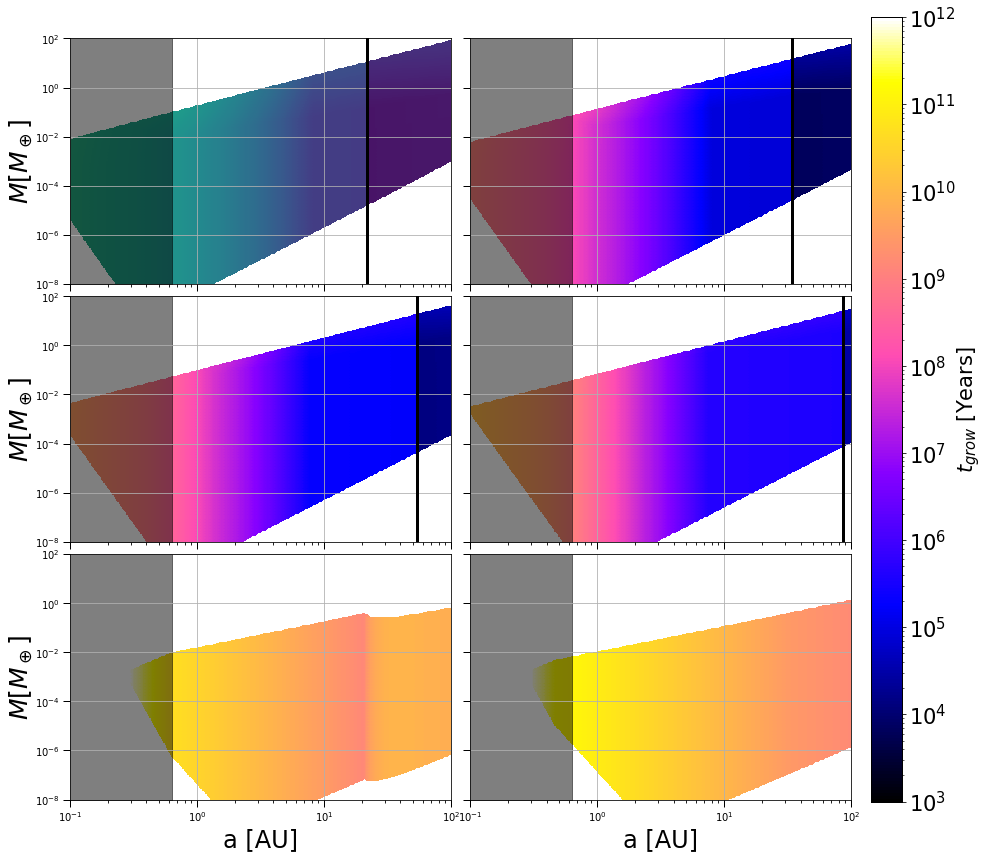

In [84]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(14,14))
gs = gridspec.GridSpec(3, 2)
gs.update(wspace=0.05, hspace=0.05)
axis_font = {'size':'36'} # Sets font size
tick_font = {'size':'32'}

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

X, Y = np.meshgrid(a_array, m_core_arr)
for i,t in enumerate(t_array):
    if i == 0:
        ax = ax0
    if i == 1:
        ax = ax1
    if i == 2:
        ax = ax2
    if i == 3:
        ax = ax3
    if i == 4:
        ax = ax4
    if i == 5:
        ax = ax5
    im = ax.pcolormesh(X,Y,t_grow_FTTau_arr[i], cmap=cmap,norm=LogNorm(),vmin=1e3,vmax=1e12)
    ax.grid()
    cmap = 'gnuplot2'
    im.set_edgecolor('face')
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)
    if i == 4 or i == 5:
        ax.set_xlabel('a [AU]',fontsize=24)
    else:
        ax.tick_params(labelbottom=False)
    ax.fill_betweenx(m_core_arr, 1e-1, frag_loc[1], alpha=0.5, color='black')
    if i == 0 or i == 2 or i == 4:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    ax.set_ylim(1e-8,1e2)
    ax.set_xlim(1e-1, 1e2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    
    ax.axvline(x=(3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au, linewidth=3, color='k')
    cax = fig.add_axes([0.92, 0.123, 0.03, 0.778])
    cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
    cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
    cb.ax.tick_params(labelsize=21)
    

In [ ]:
# Try integrating core masses as the disk evolves
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
t_array = np.logspace(-1,0.5, 100) * 3.154e13
a_array = np.array([1,3,5,10,30,100]) #np.logspace(0, 2, 6)
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

n_int = 1000 # Number of internal integrations between disk evolution time-steps
m_arr = np.zeros((len(a_array), len(m0_arr), n_int*len(t_array)))


for i,a_au in enumerate(a_array):
    sig_gas = Sig_gas[i]
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
    v_0 = fn.eta(c_s, v_k) * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    for j,m0 in enumerate(m0_arr):
        for k,t in enumerate(t_array):
            if k == 0:
                mass = m0
            else:
                mass = m_final
            st = (a_au*fn.au)/(2 * v_g * t)
            
            if k == 99:
                times = np.logspace(np.log10(t),np.log10(t + (t - t_array[k-1])),n_int) #np.linspace(t,t + (t - t_array[-2]),100)
            else:
                times = np.logspace(np.log10(t),np.log10(t_array[k+1]),n_int) #np.linspace(t,t_array[k+1],100)
            p = [alpha,a_au,m_star,temp,sig_gas,sig_d_array[k,i],st,0]
            wsol = odeint(rate_odeint,mass,times,args=(p,))
            m_arr[i,j,n_int*k:n_int*k+n_int] = wsol.flatten()
            m_final = max(wsol.flatten()) #m_arr[i,j,100*k+99]
            
#times = np.logspace(4,6.5,num=int(1e5))/fn.sec_to_years
#a_au, a_au2, a_au3 = 1, 5, 10
#sig_gas = Sig_gas[100]
#temp = T_0*a_au**(-3./7.)
#c_s = fn.sound_speed(temp)
#v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
#v_0 = fn.eta(c_s, v_k) * v_k
#v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
#st = (a_au*fn.au)/(2 * v_g * times)
#sig_gas2 = Sig_gas[170]
#temp2 = T_0*a_au2**(-3./7.)
#c_s2 = fn.sound_speed(temp2)
#v_k2 = fn.vkep(m_star*fn.m_sun, a_au2*fn.au)
#v_02 = fn.eta(c_s2, v_k2) * v_k2
#v_g2 = np.sqrt(v_02**2 + (np.sqrt(alpha) * c_s2)**2)
#st2 = (a_au2*fn.au)/(2 * v_g2 * times)
#sig_gas3 = Sig_gas[200]
#temp3 = T_0*a_au3**(-3./7.)
#c_s3 = fn.sound_speed(temp3)
#v_k3 = fn.vkep(m_star*fn.m_sun, a_au3*fn.au)
#v_03 = fn.eta(c_s3, v_k3) * v_k3
#v_g3 = np.sqrt(v_03**2 + (np.sqrt(alpha) * c_s3)**2)
#st3 = (a_au3*fn.au)/(2 * v_g3 * times)

#for i,m0 in enumerate(m0_arr):
#    p = [alpha,a_au,m_star,temp,sig_gas,sig_p,st,1,0]
#    wsol = odeint(rate_odeint,m0,t_array,args=(p,))
#    m_arr[i] = wsol.flatten()
#    
#    q = [alpha,a_au2,m_star,temp2,sig_gas2,sig_p2,st2,1,0]
#    wsol2 = odeint(rate_odeint,m0,t_array,args=(q,))
#    m_arr2[i] = wsol2.flatten()
#    
#    r = [alpha,a_au3,m_star,temp3,sig_gas3,sig_p3,st3,1,0]
#    wsol3 = odeint(rate_odeint,m0,t_array,args=(r,))
#    m_arr3[i] = wsol3.flatten()

In [ ]:
fig = plt.figure(figsize=(14,10))
gs = gridspec.GridSpec(2, 3)
gs.update(wspace=0.05, hspace=0.05)
t_array = np.logspace(-1,0.5, 100000) * 3.154e13

ax0 = plt.subplot(gs[0,0])
ax1 = plt.subplot(gs[0,1])
ax2 = plt.subplot(gs[0,2])
ax3 = plt.subplot(gs[1,0])
ax4 = plt.subplot(gs[1,1])
ax5 = plt.subplot(gs[1,2])

for i in range(len(m0_arr)):
    ax0.loglog(t_array*fn.sec_to_years,m_arr[0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax1.loglog(t_array*fn.sec_to_years,m_arr[1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax2.loglog(t_array*fn.sec_to_years,m_arr[2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax3.loglog(t_array*fn.sec_to_years,m_arr[3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax4.loglog(t_array*fn.sec_to_years,m_arr[4,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax5.loglog(t_array*fn.sec_to_years,m_arr[5,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
        
for i in range(6):
    if i == 0:ax = ax0
    if i == 1: ax = ax1
    if i == 2: ax = ax2
    if i == 3: ax = ax3
    if i == 4: ax = ax4
    if i == 5: ax = ax5
    
    if i == 3 or i == 4 or i == 5:
        ax.set_xlabel('Time [Years]',fontsize=20)
    else:
        ax.tick_params(labelbottom=False) 
    if i == 0 or i == 3:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=20,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    
    ax.axhline(y=1e1,linestyle='dashed',color='r')
    ax.set_ylim(3e-8,1e2)
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)

lgd = plt.gca().legend(bbox_to_anchor=[1.02,1.4],frameon=False, fontsize=14)
plt.tight_layout()

In [ ]:
# HD 163296 time-series
params = 2.3, 284, 29, 119, 1e-5, 5 * 3.154e13
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
print("Stellar mass: ", m_star, "Alpha: ", alpha, "Sigma_0: ", sig_0, "T_0: ", T_0)

t_array = np.logspace(-1,0.5, 12) * 3.154e13
a_array = np.logspace(-1, 2.5, 300)
sig_d_array = np.zeros([t_array.size, a_array.size])

a_edge = 250
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]

sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

In [ ]:
# Make the same frag vs. drift limited particle size plot, but for HD 163296
v_frag = np.array([1,3,10]) *1e2 #1, 3 and 10 m/s
f_f = 0.5 
f_d = 1e-2

rho_int = 1.6
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]

s_array = np.logspace(-6,8,1000)
t_g_array = np.zeros(s_array.shape)
t_d_array = np.zeros(s_array.shape)
s_grow = np.zeros(a_array.shape)
s_frag = np.zeros([v_frag.size, a_array.size])
frag_loc = np.zeros(v_frag.size)
for k, a in enumerate(a_array):
    T = T_0 * (a**(-3/7))
    mstar = m_star * fn.m_sun
    gamma = 1.0
    Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    v_kep = np.sqrt(fn.G * mstar/(a * fn.au))
    Om = np.sqrt((G*mstar)/(a*fn.au)**3.)
    v_kep = Om * (a*fn.au)
    eta = (c_s)**2/(2*(v_kep)**2)
    
    for i, s in enumerate(s_array):
        St = st_rad(rad=s,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
        #St = (s * rho_int * np.pi)/(2 * Sig)
        t_g_array[i] = t_grow(s, a, f_d, params)
        t_d_array[i] = (a*fn.au)/(2 * St * c_s**2/(2*v_kep))
        
    s_grow[k] = s_array[np.argmin(abs(t_g_array - t_d_array))]
    st_frag = v_frag**2/(3 * alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        s_frag[j,k] = st_solver(st=st_frag[j], alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig) #f_f * (2 * Sig * v_frag**2)/(3 * np.pi * rho_int * alpha * c_s**2)
    v_rel = np.sqrt(alpha * c_s**2)
    for j,v_f in enumerate(v_frag):
        delta = 1
        s_old = 0
        while delta > 0.01:
            st_frag = v_f**2/(3 * v_rel**2)
            s_frag[j,k] = st_solver(st=st_frag, alph=alpha, a_au=a, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
            #s_frag[k] = (2 * Sig * st_frag)/(rho_int * np.pi)
            v_rel = np.sqrt(alpha * c_s**2 * (1 + d_V_12(t_1=st_frag,t_2=0.5*st_frag)))
            delta = (s_frag[j,k] - s_old)/s_frag[j,k]
            s_old = s_frag[j,k]

for j,v_f in enumerate(v_frag):
    frag_loc[j] = a_array[np.argmin(abs(s_frag[j] - s_grow)/s_grow)]

(0.1, 10000.0)

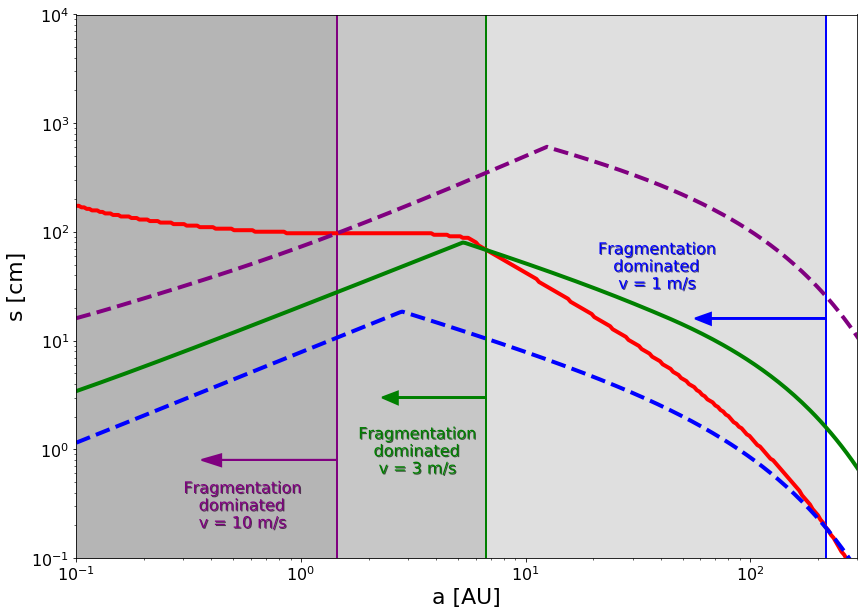

In [135]:
axis_font = {'size':'22'} # Sets font size
tick_font = {'size':'16'}
fig = plt.figure(1,figsize=(14,10))
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[0], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[1], alpha=0.25, color='grey')
plt.fill_betweenx(np.logspace(-1,4,100), 1e-1, frag_loc[2], alpha=0.25, color='grey')
plt.text(2.1e1,3e1, 'Fragmentation\n   dominated\n    v = 1 m/s', color='blue', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.text(1.8e0,6e-1, 'Fragmentation\n   dominated\n    v = 3 m/s', color='green', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.text(3e-1,1.9e-1, 'Fragmentation\n   dominated\n   v = 10 m/s', color='purple', **tick_font,
                path_effects=[path_effects.withSimplePatchShadow(offset=(1, -1), alpha=0.7)])
plt.axvline(x=frag_loc[0], color='blue', linestyle='-', linewidth=2)
plt.arrow(frag_loc[0], 16, -150, 0, linestyle='-', linewidth=2, width=0, head_width=4, head_length=10, fc='blue', ec='blue')
plt.axvline(x=frag_loc[1], color='green', linestyle='-', linewidth=2)
plt.arrow(frag_loc[1], 3, -4, 0, linestyle='-', linewidth=2, width=0, head_width=.8, head_length=.4, fc='green', ec='green')
plt.axvline(x=frag_loc[2], color='purple', linestyle='-', linewidth=2)
plt.arrow(frag_loc[2], 0.8, -1, 0, linestyle='-', linewidth=2, width=0, head_width=0.2, head_length=.08, fc='purple', ec='purple')
plt.loglog(a_array, s_grow, 'r-', linewidth=4, label='Drift limited particle size')
plt.loglog(a_array, s_frag[1], 'g-', linewidth=4, label='Fragmentation limited particle size, v = 3 m/s')
plt.loglog(a_array, s_frag[0], 'b--', linewidth=4, label='Fragmentation limited particle size, v = 1 m/s')
plt.loglog(a_array, s_frag[2], '--', color='purple', linewidth=4, label='Fragmentation limited particle size, v = 10 m/s')
plt.ylabel('s [cm]', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1,3e2)
plt.ylim(1e-1,1e4)

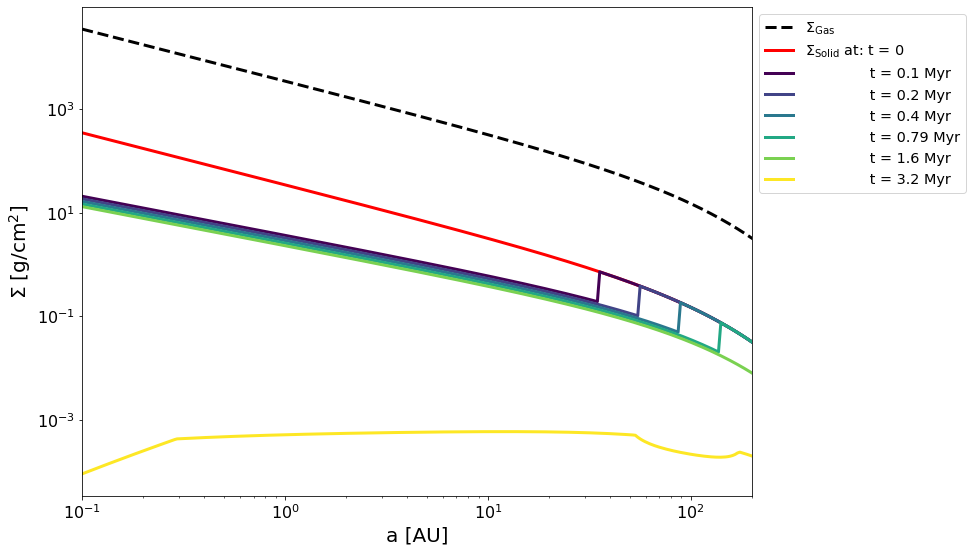

In [136]:
# Plotting surface densities for these times
t_array = np.logspace(-1,0.5, 6) * 3.154e13
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

cmap = cm.viridis
vmax = max(t_array)
vmin = min(t_array)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=LogNorm(vmin=vmin,vmax=vmax))
sm.set_array([])
line_colors = [sm.to_rgba(t) for t in t_array]
axis_font = {'size':'20'} # Sets font size
tick_font = {'size':'16'}

fig = plt.figure(1,figsize=(12,9))
plt.loglog(a_array, Sig_gas, 'k--', linewidth=3, label='$\Sigma_\mathrm{Gas}$')
plt.loglog(a_array, 1e-2*Sig_gas, 'r-', linewidth=3, label='$\Sigma_\mathrm{Solid}$ at: t = 0')
for i,t in enumerate(t_array):
    plt.loglog(a_array, sig_d_array[i], label='              t = {time} Myr'.format(time=f"{t/3.154e13:.2n}"), linewidth=3, color=line_colors[i])
plt.ylabel('$\Sigma$ $[\mathrm{g}/\mathrm{cm}^{2}]$', **axis_font)
plt.xlabel('a [AU]', **axis_font)
plt.xticks(**tick_font)
plt.yticks(**tick_font)
plt.xlim(1e-1, 2e2)
#plt.ylim(1e-1, 1e4)
plt.legend(loc=0, bbox_to_anchor=(1., 1., 0., 0.), fontsize='x-large')
plt.savefig('FTTau_SurfaceDensity.png')
plt.show()

In [137]:
a_interior = np.zeros(t_array.size)
t_drift_arr = np.zeros([t_array.size, a_array.size])
for i, t in enumerate(t_array):
    # Find pebble front location
    a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au
    t_edge = np.array([(16/3)**(1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (a_edge * fn.au)**(3/2), 3*3.154e13])
    
    sig_d = surface_density(a_array, t_edge, params)[1][0]
    T = T_0 * (a_array**(-3/7))
    c_s = np.sqrt((boltzmann*T)/(2.35*mH))
    Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au)**3)
    v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_array * fn.au))
    eta = (c_s)**2/(2*(v_kep)**2)
    St = np.sqrt(3)/8 * eps_p/eta * sig_d/Sig_gas # Max particle size for all a, at t=t_edge
    if a_PF > a_edge:
        # If in Powell et al. 2017 regime, find drift time for maximally size particle
        if a_interior[i-1] != 0:
            a = a_interior[i-1]
        else: a = a_edge
        j = np.argmin(abs(a - a_array))
        gamma = 1.0
        Sig = sig_0 * ((a/r_crit)**(-gamma))*np.exp(-(a/r_crit)**(2-gamma))
        T = T_0 * (a**(-3/7))
        c_s = np.sqrt((boltzmann*T)/(2.35*mH))
        Om = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au)**3)
        v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a * fn.au))
        eta = (c_s)**2/(2*(v_kep)**2)
        v0 = eta * v_kep
        v_drift = - 2 * v0 * (St[j]/(1 + St[j]**2))
        if i != 0:
            t_old = max(t_edge[0], t_array[i-1])
            t_diff = t - t_old
        else: t_diff = 0
            
        j = np.argmin(abs(a_edge - a_array))
        st_edge = St[j] # The maximum St at the edge of the disk, when the pebble front hits the disk edge
        s_edge = st_solver(st=st_edge, alph=alpha, a_au=a_edge, m_suns=m_star, m_earths=1, temp_in=T, sig_in=Sig)
        t_diff_arr = np.linspace(t_old, t, 1000)
        a_diff_arr = np.zeros(t_diff_arr.size)
        for k, t_d in enumerate(t_diff_arr):
            if k == 0:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            elif a_drifted < a:
                T = T_0 * (a_new**(-3/7))
                c_s = np.sqrt((boltzmann*T)/(2.35*mH))
                Om = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au)**3)
                v_kep = np.sqrt(fn.G * m_star*fn.m_sun/(a_new * fn.au))
                eta = (c_s)**2/(2*(v_kep)**2) #0.0015 * a_new**(1/2)t
                v0 = eta * v_kep
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=a_new,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            else:
                st_diff = st_rad(rad=s_edge,alph=alpha,a_au=0.01,m_suns=m_star,m_earths=1,sig_in=Sig,temp_in=T)
            v_drift = - 2 * v0 * (st_diff/(1 + st_diff**2))
            if k == 0:
                a_diff_arr[k] = v_drift * (t_diff_arr[k+1] - t_d) / fn.au
                a_drifted = abs(a_diff_arr[k])
                a_new = a - a_drifted
            elif a_drifted < a:
                a_diff_arr[k] = v_drift * (t_d - t_diff_arr[k-1]) / fn.au
                a_drifted = a_drifted + abs(a_diff_arr[k])
                a_new = a - a_drifted
            else:
                a_new = 0.0001
        # Finds the locations to which maximally sized particles have drifted by new disk time
        a_interior[i] = a_new #a - abs(v_drift * t_diff)/fn.au
        
print(a_interior)

[0.     0.     0.     0.     0.     0.0001]


In [138]:
# Calculates growth times for each snapshot of the disk
m_core_arr = np.logspace(-10, 2, 300)
t_grow_HD163_arr = np.zeros([len(t_array), len(m_core_arr), len(a_array)])

for k, t in enumerate(t_array):
    for i, m_c in enumerate(m_core_arr):
        for j, a_au in enumerate(a_array):
            sig_gas = Sig_gas[j]
            sig_d = sig_d_array[k,j]
            temp = T_0*a_au**(-3./7.)
            c_s = fn.sound_speed(temp)
            v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
            v_0 = fn.eta(c_s, v_k) * v_k
            v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
            if a_PF > a_edge and a > a_interior[k]: # If in 3rd regime (Diana's)
                St = (a_au*fn.au)/(2 * v_g * t)
            else: # If in 2nd regime (LJ14's)
                St = np.sqrt(3)/8 * (eps_p * sig_d)/(eta * sig_gas)
            s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
            core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_d, sig_g_in=sig_gas)
            core.main(s)
            t_grow_HD163_arr[k,i,j] = core.t_acc

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


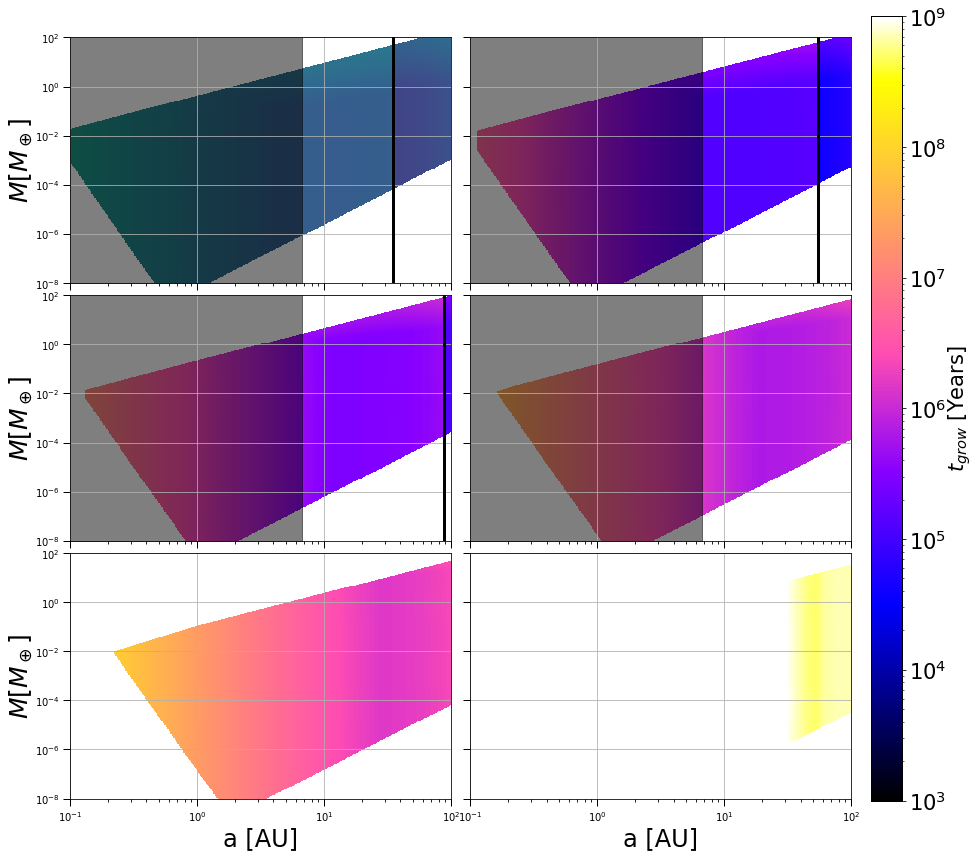

In [139]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(14,14))
gs = gridspec.GridSpec(3, 2)
gs.update(wspace=0.05, hspace=0.05)
axis_font = {'size':'36'} # Sets font size
tick_font = {'size':'32'}

ax0 = plt.subplot(gs[0, 0])
ax1 = plt.subplot(gs[0, 1])
ax2 = plt.subplot(gs[1, 0])
ax3 = plt.subplot(gs[1, 1])
ax4 = plt.subplot(gs[2, 0])
ax5 = plt.subplot(gs[2, 1])

X, Y = np.meshgrid(a_array, m_core_arr)
for i,t in enumerate(t_array):
    if i == 0:
        ax = ax0
    if i == 1:
        ax = ax1
    if i == 2:
        ax = ax2
    if i == 3:
        ax = ax3
    if i == 4:
        ax = ax4
    if i == 5:
        ax = ax5
    im = ax.pcolormesh(X,Y,t_grow_HD163_arr[i], cmap=cmap,norm=LogNorm(),vmin=1e3,vmax=1e9)
    ax.grid()
    cmap = 'gnuplot2'
    im.set_edgecolor('face')
    ax.tick_params(which='major', length=7,width=1.0)
    ax.tick_params(which='minor', length=3.0,width=0.85)
    if i == 4 or i == 5:
        ax.set_xlabel('a [AU]',fontsize=24)
        #ax.fill_betweenx(m_core_arr, 1e-1, a_interior[i], alpha=0.5, color='black')
    else:
        ax.tick_params(labelbottom=False)
        ax.fill_betweenx(m_core_arr, 1e-1, frag_loc[1], alpha=0.5, color='black')        
    if i == 0 or i == 2 or i == 4:
        ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
    else:
        ax.tick_params(labelleft=False) 
    ax.set_ylim(1e-8,1e2)
    ax.set_xlim(1e-1, 1e2)
    ax.set_xscale('log')
    ax.set_yscale('log')
    
    ax.axvline(x=(3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t**(2/3) / fn.au, linewidth=3, color='k')
    #ax.fill_betweenx(m_core_arr, 1e-1, frag_loc[1], alpha=0.5)
    cax = fig.add_axes([0.92, 0.123, 0.03, 0.778])
    cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
    cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
    cb.ax.tick_params(labelsize=21)
    

In [140]:
# Try integrating core masses as the disk evolves
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
t_array = np.logspace(-1,0.5, 100) * 3.154e13
a_array = np.array([1,3,5,10,30,100]) #np.logspace(0, 2, 6)
sig_d_array = np.zeros([t_array.size, a_array.size])
params = [T_0, m_star, sig_0, r_crit, rho_int, alpha, a_edge]
sd = surface_density(a_array, t_array, params)
Sig_gas = sd[0]
sig_d_array = sd[1]

m_arr = np.zeros((len(a_array), len(m0_arr), 100*len(t_array)))

for i,a_au in enumerate(a_array):
    sig_gas = Sig_gas[i]
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
    v_0 = fn.eta(c_s, v_k) * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    for j,m0 in enumerate(m0_arr):
        for k,t in enumerate(t_array):
            if k == 0:
                mass = m0
            else:
                mass = m_final
            st = (a_au*fn.au)/(2 * v_g * t)
            
            if k == 99:
                times = np.logspace(np.log10(t),np.log10(t + (t - t_array[k-1])),100) #np.linspace(t,t + (t - t_array[-2]),100)
            else:
                times = np.logspace(np.log10(t),np.log10(t_array[k+1]),100) #np.linspace(t,t_array[k+1],100)
            p = [alpha,a_au,m_star,temp,sig_gas,sig_d_array[k,i],st,0]
            wsol = odeint(rate_odeint,mass,times,args=(p,))
            m_arr[i,j,100*k:100*k+100] = wsol.flatten()
            m_final = wsol.flatten()[-1] #m_arr[i,j,100*k+99]

/miniconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)
/miniconda3/lib/python3.7/site-packages/scipy/integrate/odepack.py:248: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


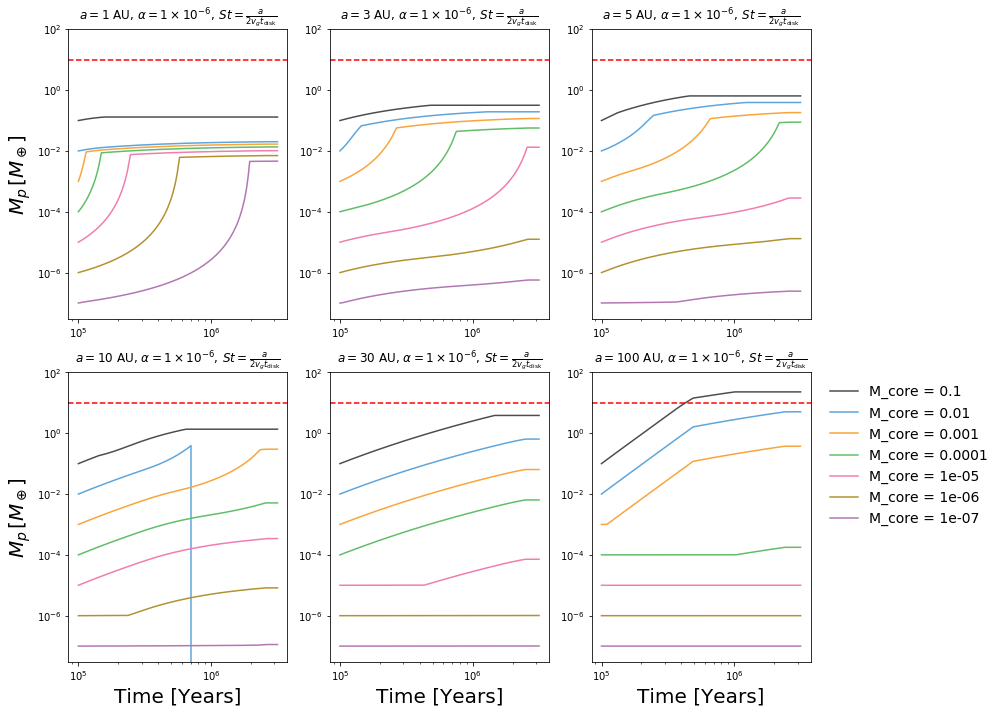

In [141]:
fig = plt.figure(figsize=(14,10))
gs = gridspec.GridSpec(2, 3)
t_array = np.logspace(-1,0.5, 10000) * 3.154e13

ax0 = plt.subplot(gs[0,0])
plt.title(r'$a = 1$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax1 = plt.subplot(gs[0,1])
plt.title(r'$a = 3$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax2 = plt.subplot(gs[0,2])
plt.title(r'$a = 5$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax3 = plt.subplot(gs[1,0])
plt.title(r'$a = 10$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax4 = plt.subplot(gs[1,1])
plt.title(r'$a = 30$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax5 = plt.subplot(gs[1,2])
plt.title(r'$a = 100$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)

for i in range(len(m0_arr)):
    ax0.loglog(t_array*fn.sec_to_years,m_arr[0,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax1.loglog(t_array*fn.sec_to_years,m_arr[1,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax2.loglog(t_array*fn.sec_to_years,m_arr[2,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax3.loglog(t_array*fn.sec_to_years,m_arr[3,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax4.loglog(t_array*fn.sec_to_years,m_arr[4,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
    ax5.loglog(t_array*fn.sec_to_years,m_arr[5,i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=f"{m0_arr[i]/fn.m_earth:.2n}"))
        
ax0.set_ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)
ax3.set_ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)
ax3.set_xlabel('Time [Years]',fontsize=20)
ax4.set_xlabel('Time [Years]',fontsize=20)
ax5.set_xlabel('Time [Years]',fontsize=20)

ax0.axhline(y=1e1,linestyle='dashed',color='r')
ax1.axhline(y=1e1,linestyle='dashed',color='r')
ax2.axhline(y=1e1,linestyle='dashed',color='r')
ax3.axhline(y=1e1,linestyle='dashed',color='r')
ax4.axhline(y=1e1,linestyle='dashed',color='r')
ax5.axhline(y=1e1,linestyle='dashed',color='r')

lgd = plt.gca().legend(bbox_to_anchor=[1.03,1.0],frameon=False, fontsize=14)

ax0.set_ylim(3e-8,1e2)
ax1.set_ylim(3e-8,1e2)
ax2.set_ylim(3e-8,1e2)
ax3.set_ylim(3e-8,1e2)
ax4.set_ylim(3e-8,1e2)
ax5.set_ylim(3e-8,1e2)

plt.tight_layout()

In [62]:
# Fixed semi-major axis, as a function of time
## What is the t_grow to M_flow(t) as a function of time
### What is the ratio of t_grow/t_regime_lifetime

# Also, M_flow(t) at that semi-major axis
## Plot on top: growth time from minimum mass for pebble accretion OR minimum mass for pebble accretion
### Intersection of these two lines should give a useful t, M_c at which to measure the ratio

## Now using outputs from my runs of Diana's code

In [147]:
# First, for DR Tau:
#gas_to_dust = np.loadtxt("drtau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("drtau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("drtau_params.txt")
a_au_arr = sigma[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
#t_disk = 0.1 * 3.154e13 # 10^5 years
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_disk = t_PF_edge # Should be first time when 3rd regime applies

params = [m_star, T_0, sig_0, r_crit, alpha, t_disk]
gas_to_dust = dust_to_gas(t_disk, a_au_arr, params)
print(gas_to_dust.shape, sigma.shape)

(300,) (3, 300)


In [148]:
print(t_disk / 3.154e13, "Myr")

0.9846075501865582 Myr


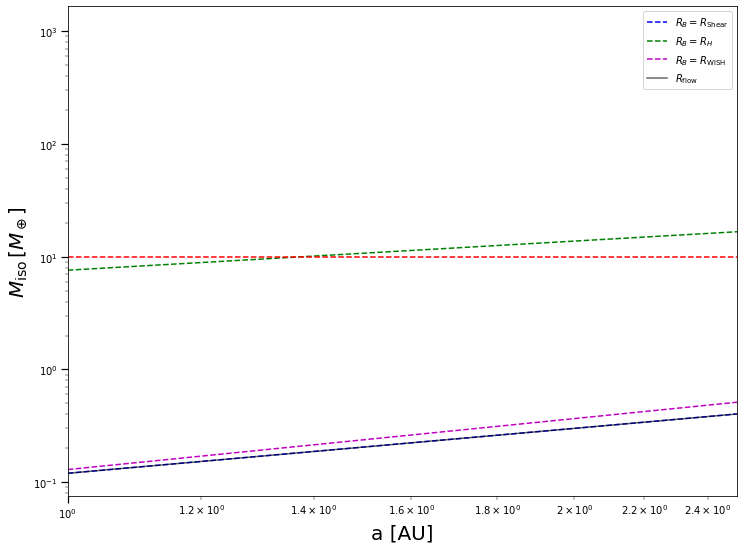

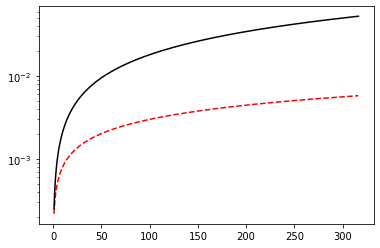

In [149]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])
limit_st = np.zeros([len(a_au_arr),2])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    v_0 = fn.eta(c_s, v_k) * v_k # v_0 = eta * v_kep
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    St = (a)/(2 * v_g * t_disk) #1e-3
    H = (c_s * a)/v_k
    limit_st[i,0] = (v_g/c_s)**2
    limit_st[i,1] = St
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

fig = plt.figure(1,figsize=(12,9))

plt.loglog(a_au_arr, m_flow_arr[:,1], 'b--', label=r"$R_{B} = R_\mathrm{Shear}$")
plt.loglog(a_au_arr, m_flow_arr[:,2], 'g--', label=r"$R_{B} = R_{H}$")
plt.loglog(a_au_arr, m_flow_arr[:,3], 'm--', label=r"$R_{B} = R_\mathrm{WISH}$")
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-', alpha=0.6, label=r"$R_\mathrm{flow}$")
plt.loglog(a_au_arr, 10*np.ones(a_au_arr.shape), 'r--')
plt.ylabel(r"$M_\mathrm{iso} \, [M_\oplus]$", size=20)
plt.xlabel("a [AU]", size=20)
plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)
plt.xlim(1,2.5)
#plt.ylim(0,60)
plt.legend()
plt.show()

plt.semilogy(a_au_arr, limit_st[:,0], 'r--')
plt.semilogy(a_au_arr, limit_st[:,1], 'k-')
#plt.plot(a_au_arr, limit_st[:,1]/limit_st[:,0])

In [150]:
i = 120
print(gas_to_dust[0,i], gas_to_dust[1,i])

IndexError: too many indices for array

In [151]:
# Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
st_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_b_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_ws_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_h_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_sh_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_acc_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
rate_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
t_s_c_arr = np.zeros((len(m_core_arr), len(a_au_arr)))
t_eddy_arr = np.zeros((len(m_core_arr), len(a_au_arr)))


for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[j]*sig_gas #sigma[2,j]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        st_arr_cb[i,j] = core.stl_core
        t_s_c_arr[i,j] = core.t_s_core
        t_eddy_arr[i,j] = core.t_eddy_core
        r_b_arr_cb[i,j] = core.r_bondi
        r_ws_arr_cb[i,j] = core.r_ws
        r_h_arr_cb[i,j] = core.r_hill
        r_sh_arr_cb[i,j] = core.r_sh
        r_acc_arr_cb[i,j] = core.r_acc
        #print((St - core.stl)/St)
        rate_arr_cb[i,j] = m_c/(t_grow_arr_cb[i,j]/fn.sec_to_years)

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in double_scalars


18826.314966359365
3.7937567267173033e+09


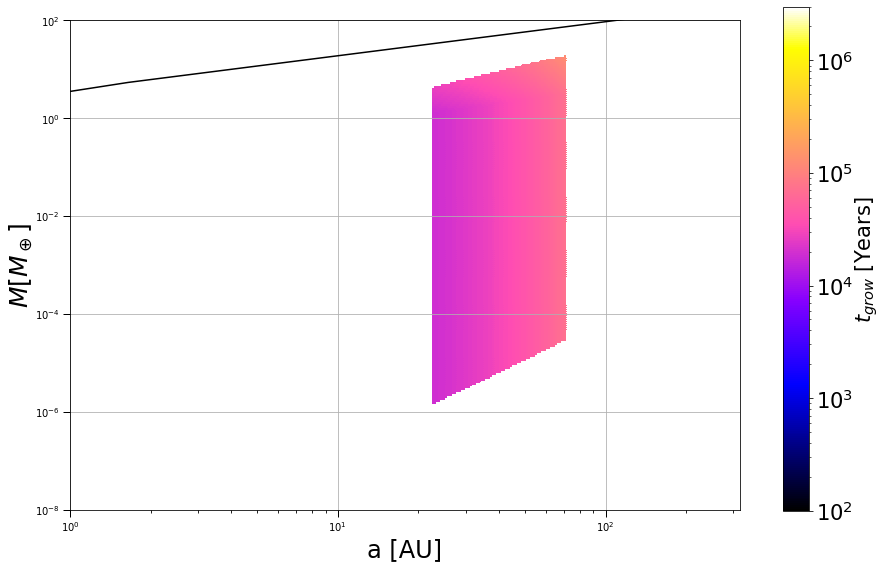

In [198]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax, cmap=cmap, norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('DRTau_3rd_reg.png')

t_min = np.min(t_grow_arr_cb[np.nonzero(t_grow_arr_cb)])
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)

print(t_min)
print(np.format_float_scientific((3e6 * 3.154e7 - t_PF_edge)/t_min))

In [154]:
j = 177 #j = 590 # Choosing a = 30 AU
print(a_au_arr[j])
a_au = a_au_arr[j]
sig_gas = sigma[1,j]
sig_p = sigma[2,j]

j = 120 #j = 400 # Choosing a = 10 AU
print(a_au_arr[j])
a_au2 = a_au_arr[j]
sig_gas2 = sigma[1,j]
sig_p2 = sigma[2,j]

30.194866260649214
10.077306820944612


In [155]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(4,6.5,num=int(1e5))/fn.sec_to_years

temp = T_0*a_au**(-3./7.)
c_s = fn.sound_speed(temp)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
v_0 = fn.eta(c_s, v_k) * v_k
v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
st = (a_au*fn.au)/(2 * v_g * times)

temp2 = T_0*a_au2**(-3./7.)
c_s2 = fn.sound_speed(temp2)
v_k2 = fn.vkep(m_star*fn.m_sun, a_au2*fn.au)
v_02 = fn.eta(c_s2, v_k2) * v_k2
v_g2 = np.sqrt(v_02**2 + (np.sqrt(alpha) * c_s2)**2)
st2 = (a_au2*fn.au)/(2 * v_g2 * times)

m_arr = np.zeros((len(m0_arr),len(times)))
m_arr2 = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    p = [alpha,a_au,m_star,temp,sig_gas,sig_p,st,1,0]
    wsol = odeint(rate_odeint,m0,times,args=(p,))
    m_arr[i] = wsol.flatten()
    
    q = [alpha,a_au2,m_star,temp2,sig_gas2,sig_p2,st2,1,0]
    wsol2 = odeint(rate_odeint,m0,times,args=(q,))
    m_arr2[i] = wsol2.flatten()

ValueError: too many values to unpack (expected 4)

In [57]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(4,6.5,num=10000)/fn.sec_to_years

temp = T_0*a_au**(-3./7.)
c_s = fn.sound_speed(temp)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
v_0 = fn.eta(c_s, v_k) * v_k
v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
st = (a_au*fn.au)/(2 * v_g * times)

temp2 = T_0*a_au2**(-3./7.)
c_s2 = fn.sound_speed(temp2)
v_k2 = fn.vkep(m_star*fn.m_sun, a_au2*fn.au)
v_02 = fn.eta(c_s2, v_k2) * v_k2
v_g2 = np.sqrt(v_02**2 + (np.sqrt(alpha) * c_s2)**2)
st2 = (a_au2*fn.au)/(2 * v_g2 * times)

m_arr = np.zeros((len(m0_arr),len(times)))
m_arr2 = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    for j, t in enumerate(times):
        p = [alpha,a_au,m_star,temp,sig_gas,sig_p,st[j],1,0]
        #print(rate, t)
        if j == 0: m_arr[i,j] = m0 #m_arr[i] = wsol.flatten()
        else:
            rate = rate_odeint(m_arr[i,j-1], t, p)
            m_arr[i,j] = m_arr[i,j-1] + rate * (t - times[j-1])
        
        q = [alpha,a_au2,m_star,temp2,sig_gas2,sig_p2,st2[j],1,0]
        if j == 0: m_arr2[i,j] = m0 #m_arr2[i] = wsol2.flatten()
        else:
            rate = rate_odeint(m_arr2[i,j-1], t, q)
            m_arr[i,j] = m_arr2[i,j-1] + rate * (t - times[j-1])

ValueError: too many values to unpack (expected 4)

In [156]:
print(m_arr2[0]/fn.m_earth)

[0. 0. 0. ... 0. 0. 0.]


/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  app.launch_new_instance()
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  app.launch_new_instance()
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  app.launch_new_instance()
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
/miniconda3/lib/python3.7/site-packages/ipykernel_la

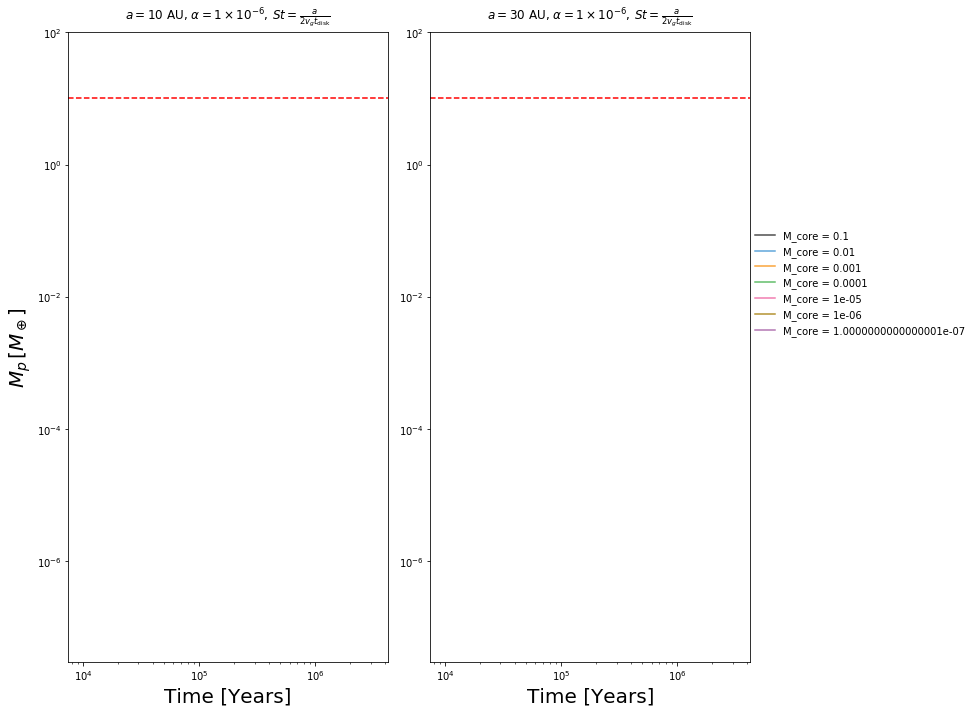

In [157]:
from matplotlib import gridspec

fig = plt.figure(figsize=(14,10))
gs = gridspec.GridSpec(2, 2)

ax0 = plt.subplot(gs[:,0])
plt.title(r'$a = 10$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax1 = plt.subplot(gs[:,1])
plt.title(r'$a = 30$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)

#fig = plt.figure(figsize=(14,10))

# labels = [r'$M_0 = 10^{-7} M_\oplus$',r'$M_0 = 10^{-6} M_\oplus$',r'$M_0 = 10^{-5} M_\oplus$']

for i in range(len(m0_arr)):
    ax1.loglog(times*fn.sec_to_years,m_arr[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    ax0.loglog(times*fn.sec_to_years,m_arr2[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    
ax0.set_xlabel('Time [Years]',fontsize=20)
ax0.set_ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)
ax1.set_xlabel('Time [Years]',fontsize=20)

ax0.axhline(y=1e1,linestyle='dashed',color='r')
ax1.axhline(y=1e1,linestyle='dashed',color='r')

lgd = plt.gca().legend(bbox_to_anchor=[1.7,0.70],frameon=False)

ax0.set_ylim(3e-8,1e2)
ax1.set_ylim(3e-8,1e2)
plt.tight_layout()

In [162]:
# Now, for FT Tau:
#gas_to_dust_ft = np.loadtxt("fttau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma_ft = np.loadtxt("fttau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params_ft = np.loadtxt("fttau_params.txt")

a_au_arr_ft = sigma_ft[0]
m_core_arr_ft = np.logspace(-10, 2, 1000)
m_star_ft, T_0_ft, sig_0_ft, r_crit_ft, alpha_ft, t_disk_ft = params_ft

t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star_ft * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_disk_ft = t_PF_edge # Should be first time when 3rd regime applies
params_ft = [m_star_ft, T_0_ft, sig_0_ft, r_crit_ft, alpha_ft, t_disk_ft]

gas_to_dust_ft = dust_to_gas(t_disk_ft, a_au_arr_ft, params_ft)

/miniconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


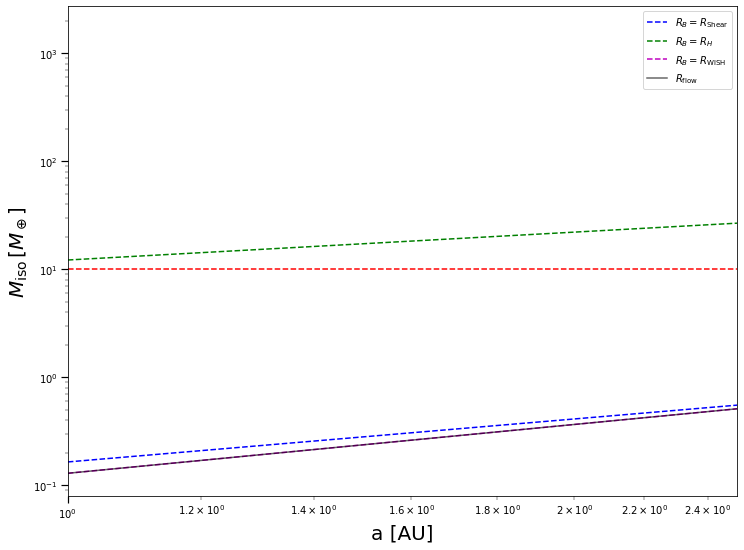

In [163]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr_ft = np.zeros([len(a_au_arr_ft),4])

for i, a_au_ft in enumerate(a_au_arr_ft):
    temp_ft = T_0_ft*a_au_ft**(-3./7.)
    c_s_ft = fn.sound_speed(temp_ft)
    a_ft = a_au_ft * fn.au
    v_k_ft = fn.vkep(m_star_ft*fn.m_sun, a_ft)
    v_0_ft = fn.eta(c_s_ft, v_k_ft) * v_k_ft
    v_g_ft = np.sqrt(v_0_ft**2 + (np.sqrt(alpha_ft) * c_s_ft)**2)
    St_ft = (a_ft)/(2 * v_g_ft * t_disk_ft)
    H_ft = (c_s_ft * a_ft)/v_k_ft
    term1 = np.sqrt(St_ft)
    term2 = 1
    term3 = (c_s_ft/v_0_ft * St_ft)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr_ft[i] = (H_ft/a_ft)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

fig = plt.figure(1,figsize=(12,9))

plt.loglog(a_au_arr_ft, m_flow_arr_ft[:,1], 'b--', label=r"$R_{B} = R_\mathrm{Shear}$")
plt.loglog(a_au_arr_ft, m_flow_arr_ft[:,2], 'g--', label=r"$R_{B} = R_{H}$")
plt.loglog(a_au_arr_ft, m_flow_arr_ft[:,3], 'm--', label=r"$R_{B} = R_\mathrm{WISH}$")
plt.loglog(a_au_arr_ft, m_flow_arr_ft[:,0], 'k-', alpha=0.6, label=r"$R_\mathrm{flow}$")
plt.loglog(a_au_arr_ft, 10*np.ones(a_au_arr_ft.shape), 'r--')
plt.ylabel(r"$M_\mathrm{iso} \, [M_\oplus]$", size=20)
plt.xlabel("a [AU]", size=20)
plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)
plt.xlim(1,2.5)
#plt.ylim(0,60)
plt.legend()

In [164]:
# Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
t_grow_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
st_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
r_b_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
r_ws_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
r_h_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
r_sh_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
r_acc_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))
rate_arr_ft = np.zeros((len(m_core_arr), len(a_au_arr_ft)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au_ft in enumerate(a_au_arr_ft):
        sig_gas_ft = sigma_ft[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p_ft = gas_to_dust_ft[j]*sig_gas_ft
        temp_ft = T_0_ft*a_au_ft**(-3./7.)
        c_s_ft = fn.sound_speed(temp_ft)
        v_k_ft = fn.vkep(m_star_ft*fn.m_sun, a_au_ft*fn.au)
        v_0_ft = fn.eta(c_s_ft, v_k_ft) * v_k_ft
        v_g_ft = np.sqrt(v_0_ft**2 + (np.sqrt(alpha_ft) * c_s_ft)**2)
        St_ft = (a_au_ft*fn.au)/(2 * v_g_ft * t_disk_ft)
        s_ft = st_solver(st=St_ft, alph=alpha_ft, a_au=a_au_ft, m_suns=m_star_ft, m_earths=m_c, temp_in=temp_ft, sig_in=sig_gas_ft)
        core = Core(a_core_au=a_au_ft, m_core_earthmasses=m_c, alpha=alpha_ft, m_star_solarmasses=m_star_ft,
                    temp_in=temp_ft, sig_p_in=sig_p_ft, sig_g_in=sig_gas_ft)
        core.main(s_ft)
        t_grow_arr_ft[i,j] = core.t_acc
        st_arr_ft[i,j] = core.stl
        r_b_arr_ft[i,j] = core.r_bondi
        r_ws_arr_ft[i,j] = core.r_ws
        r_h_arr_ft[i,j] = core.r_hill
        r_sh_arr_ft[i,j] = core.r_sh
        r_acc_arr_ft[i,j] = core.r_acc
        rate_arr_ft[i,j] = m_c/(t_grow_arr_ft[i,j]/fn.sec_to_years)

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: divide by zero encountered in double_scalars


81086.68983813285
5.235398383568049e+08


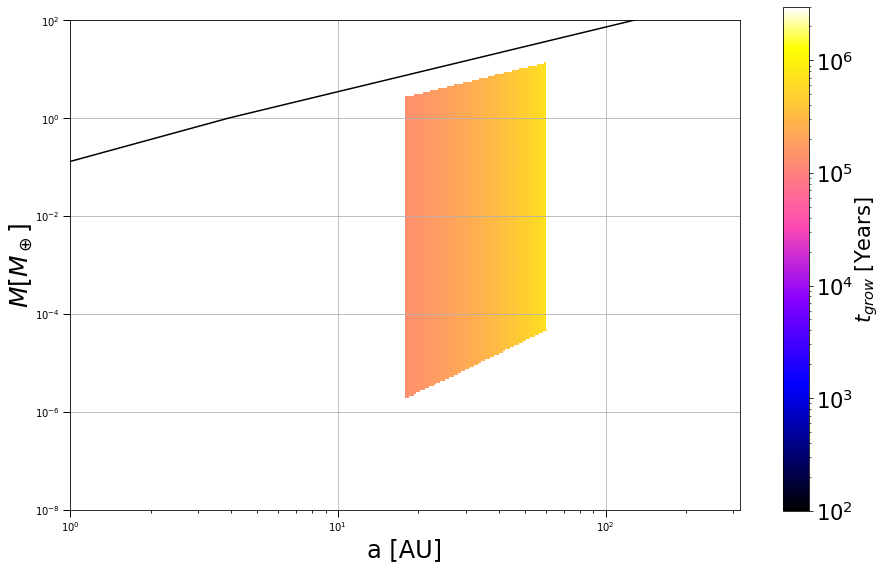

In [169]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr_ft, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_ft, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr_ft, m_flow_arr_ft[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('FTTau_3rd_reg.png')

t_min = np.min(t_grow_arr_cb[np.nonzero(t_grow_arr_cb)])
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star_ft * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star_ft * fn.m_sun)**(-1/2) * (1 * fn.au)**(3/2)
print(t_min)
print(np.format_float_scientific((t_PF_edge - t_PF)/t_min))

In [170]:
j = 120 # Choosing a = 10 AU
print(a_au_arr_ft[j])
a_au_ft = a_au_arr_ft[j]
sig_gas_ft = sigma_ft[1,j]
sig_p_ft = sigma_ft[2,j]

j = 177 # Choosing a = 30 AU
print(a_au_arr_ft[j])
a_au2_ft = a_au_arr_ft[j]
sig_gas2_ft = sigma_ft[1,j]
sig_p2_ft = sigma_ft[2,j]

10.077306820944612
30.194866260649214


In [171]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(4,6.5,num=int(1e5))/fn.sec_to_years

temp_ft = T_0_ft*a_au_ft**(-3./7.)
c_s_ft = fn.sound_speed(temp_ft)
v_k_ft = fn.vkep(m_star_ft*fn.m_sun, a_au_ft*fn.au)
v_0_ft = fn.eta(c_s_ft, v_k_ft) * v_k_ft
v_g_ft = np.sqrt(v_0_ft**2 + (np.sqrt(alpha_ft) * c_s_ft)**2)
st_ft = (a_au_ft*fn.au)/(2 * v_g_ft * times)

temp2_ft = T_0_ft*a_au2_ft**(-3./7.)
c_s2_ft = fn.sound_speed(temp2_ft)
v_k2_ft = fn.vkep(m_star_ft*fn.m_sun, a_au2_ft*fn.au)
v_02_ft = fn.eta(c_s2_ft, v_k2_ft) * v_k2_ft
v_g2_ft = np.sqrt(v_02_ft**2 + (np.sqrt(alpha_ft) * c_s2_ft)**2)
st2_ft = (a_au2_ft*fn.au)/(2 * v_g2_ft * times)

m_arr_ft = np.zeros((len(m0_arr),len(times)))
m_arr2_ft = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    p_ft = [alpha_ft,a_au_ft,m_star_ft,temp_ft,sig_gas_ft,sig_p_ft,st_ft,1,0]
    wsol_ft = odeint(rate_odeint,m0,times,args=(p_ft,))
    m_arr_ft[i] = wsol.flatten()
    
    q_ft = [alpha_ft,a_au2_ft,m_star_ft,temp2_ft,sig_gas2_ft,sig_p2_ft,st2_ft,1,0]
    wsol2_ft = odeint(rate_odeint,m0,times,args=(q_ft,))
    m_arr2_ft[i] = wsol2_ft.flatten()

ValueError: too many values to unpack (expected 4)

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  if sys.path[0] == '':
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  del sys.path[0]
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  if sys.path[0] == '':
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  if sys.path[0] == '':
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  del sys.path[0]
/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  del sys.path[0]
/miniconda

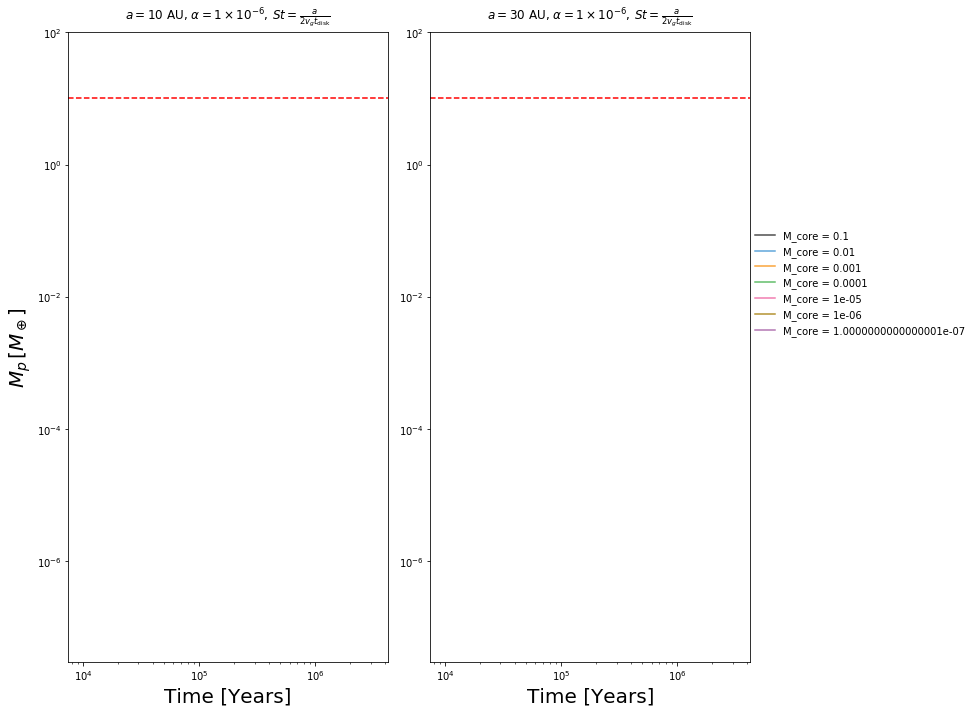

In [172]:
fig = plt.figure(figsize=(14,10))
gs = gridspec.GridSpec(2, 2)

ax0 = plt.subplot(gs[:,0])
plt.title(r'$a = 10$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax1 = plt.subplot(gs[:,1])
plt.title(r'$a = 30$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)

# labels = [r'$M_0 = 10^{-7} M_\oplus$',r'$M_0 = 10^{-6} M_\oplus$',r'$M_0 = 10^{-5} M_\oplus$']

for i in range(len(m0_arr)):
    ax1.loglog(times*fn.sec_to_years,m_arr_ft[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    ax0.loglog(times*fn.sec_to_years,m_arr2_ft[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    
ax0.set_xlabel('Time [Years]',fontsize=20)
ax0.set_ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)
ax1.set_xlabel('Time [Years]',fontsize=20)

ax0.axhline(y=1e1,linestyle='dashed',color='r')
ax1.axhline(y=1e1,linestyle='dashed',color='r')

lgd = plt.gca().legend(bbox_to_anchor=[1.7,0.70],frameon=False)

ax0.set_ylim(3e-8,1e2)
ax1.set_ylim(3e-8,1e2)
plt.tight_layout()

## Default Parameters

In [173]:
gas_to_dust = np.loadtxt("def_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("def_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("def_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

gas_to_dust = dust_to_gas(t_disk, a_au_arr, params)

print(params)

[1.00000000e+00 1.21389793e+02 3.75000000e+02 4.00000000e+01
 1.00000000e-06 3.15400000e+13]


/miniconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


In [174]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])
limit_st = np.zeros([len(a_au_arr),2])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    v_0 = fn.eta(c_s, v_k) * v_k # v_0 = eta * v_kep
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    St = (a)/(2 * v_g * t_disk) #1e-3
    H = (c_s * a)/v_k
    limit_st[i,0] = (v_g/c_s)**2
    limit_st[i,1] = St
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

In [175]:
# Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
st_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_b_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_ws_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_h_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_sh_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_acc_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
rate_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
t_s_c_arr = np.zeros((len(m_core_arr), len(a_au_arr)))
t_eddy_arr = np.zeros((len(m_core_arr), len(a_au_arr)))


for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        st_arr_cb[i,j] = core.stl_core
        t_s_c_arr[i,j] = core.t_s_core
        t_eddy_arr[i,j] = core.t_eddy_core
        r_b_arr_cb[i,j] = core.r_bondi
        r_ws_arr_cb[i,j] = core.r_ws
        r_h_arr_cb[i,j] = core.r_hill
        r_sh_arr_cb[i,j] = core.r_sh
        r_acc_arr_cb[i,j] = core.r_acc
        rate_arr_cb[i,j] = m_c/(t_grow_arr_cb[i,j]/fn.sec_to_years)

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in double_scalars


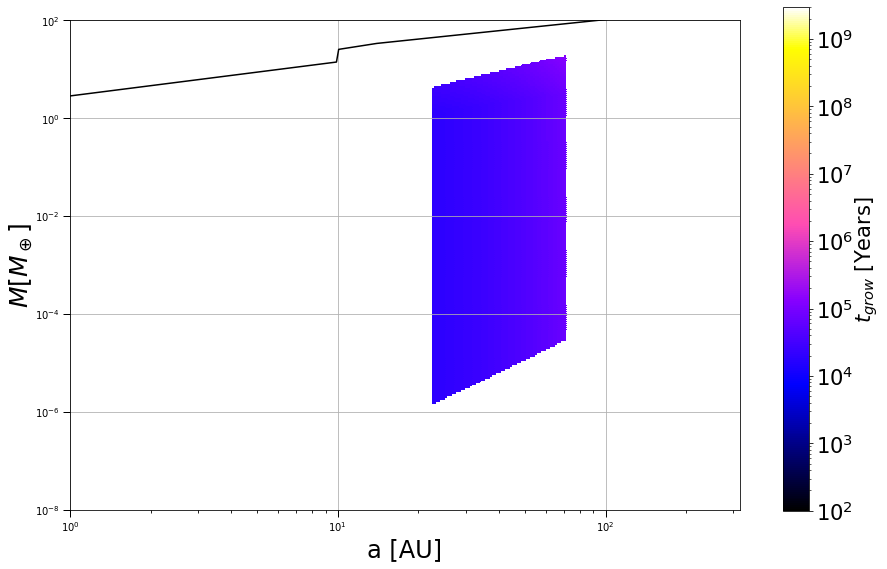

In [232]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

In [177]:
j = 177 #j = 590 # Choosing a = 30 AU
print(a_au_arr[j])
a_au = a_au_arr[j]
sig_gas = sigma[1,j]
sig_p = sigma[2,j]

j = 120 #j = 400 # Choosing a = 10 AU
print(a_au_arr[j])
a_au2 = a_au_arr[j]
sig_gas2 = sigma[1,j]
sig_p2 = sigma[2,j]

30.194866260649214
10.077306820944612


In [74]:
# Try the same as above, but adjusting overall surface density (total disk mass)
t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = 3*sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = 3*sigma[2,j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

KeyboardInterrupt: 

In [ ]:
# Try the same as above, but adjusting overall surface density (total disk mass)
t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j]/3 #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = sigma[2,j]/3 #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

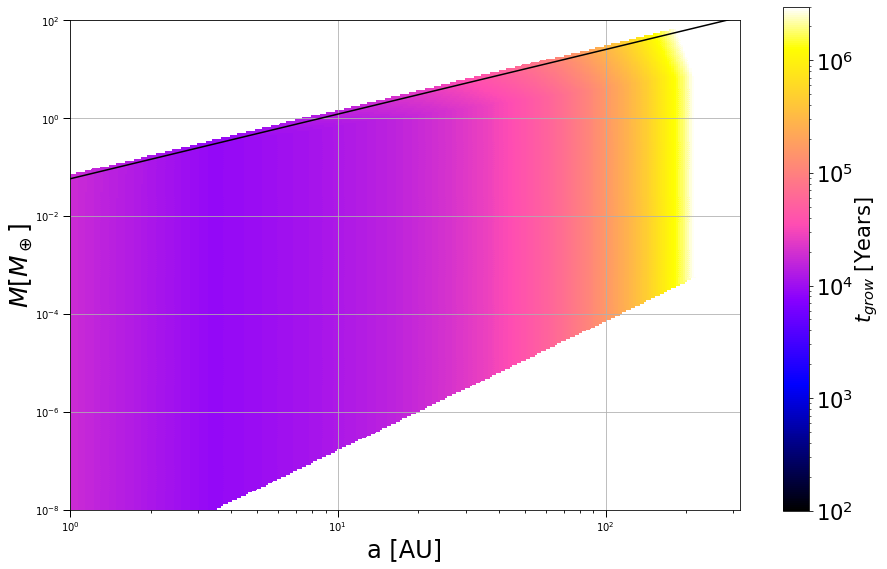

In [58]:
# Now, let's change the initial dust to gas ratio. First 3x
gas_to_dust = np.loadtxt("def_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("def_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("def_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = sigma[2,j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

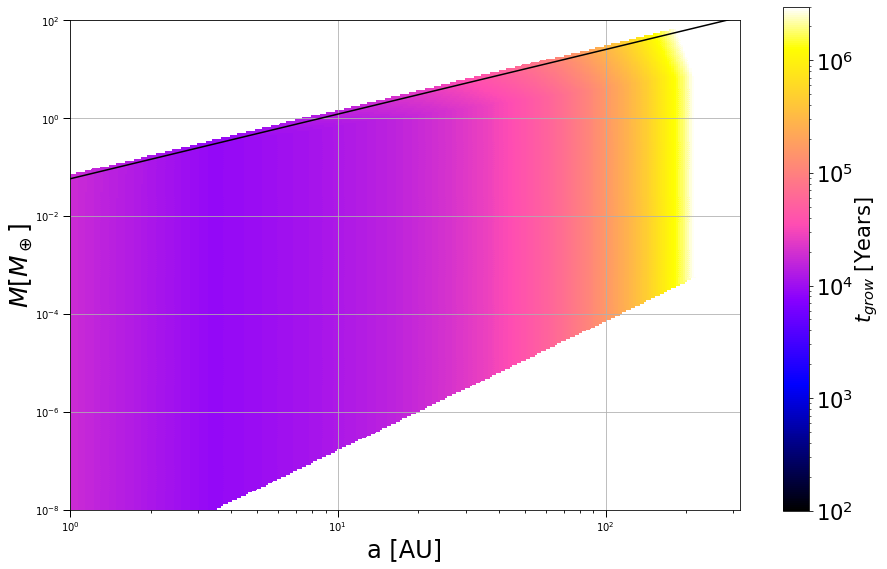

In [59]:
# Now, let's change the initial dust to gas ratio. Then 1/3
gas_to_dust = np.loadtxt("def_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("def_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("def_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = sigma[2,j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

In [ ]:
a_au = 1
m_star = 1
mu = 2.35 * 1.67e-24
kB = 1.38e-26
temp = T_0*a_au**(-3./7.)
c_s = fn.sound_speed(temp)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)

for i,M in enumerate(m_core_arr):
    R_bondi = (fn.G * M * fn.m_earth * mu)/(kB * temp)
    R_hill = a_au * fn.au * (M * fn.m_earth/(3 * m_star * fn.m_sun))**(1/3)
    delta_a = v_th * v_rel/s
    R_WS = fn.wish_radius(delta_a, M*fn.m_earth, m_obj)

## Using Lambrechts & Johansen 2014 maximum particle size

In [178]:
gas_to_dust = np.loadtxt("def_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("def_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("def_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

In [179]:
def sig_g(beta_0, r_c, a, t):
    beta = beta_0 * ((r/r_c)**(-1))*np.exp(-(r/r_c)) #beta_0 * exp(-t/3.154e7)
    return beta * a**(-1)
    
def sig_p(M_star, f_d, beta_0, r_c, a, t):
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    Sig_g = sig_g(beta_0, r_c, a,t)
    return 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g

In [180]:
eps_p = 0.5 # Pebble coagulation efficiency
f_d = 1e-2

Sig_g = sigma[1,:] #sig_g(a_au_arr, t_disk)
Sig_p = sigma[2,:] #sig_p(m_star, f_d, a_au_arr, t_disk)
print(sig_0, Sig_g[0], Sig_p[0])

# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

375.0 14629.648680424989 146.2964868042499


In [181]:
t_grow_arr_LJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = Sig_g[j] #sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_part = Sig_p[j] #sigma[2,j] #gas_to_dust[1,j]*sig_gas        
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)  
        St = tau_f #(a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_LJ14[i,j] = core.t_acc

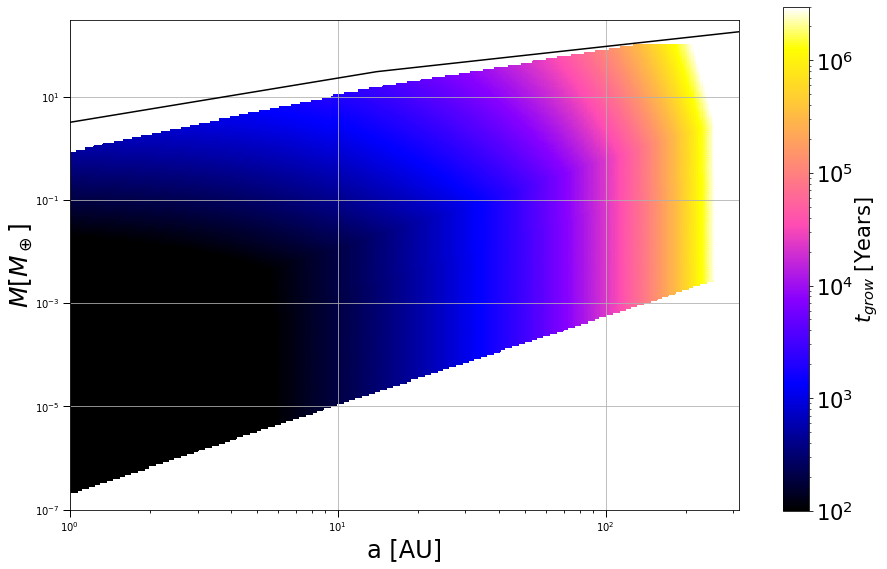

In [182]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_LJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-7,3e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

In [183]:
# Now, for DR Tau, using L&J '14
gas_to_dust = np.loadtxt("drtau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("drtau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("drtau_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 3, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

In [184]:
eps_p = 0.5 # Pebble coagulation efficiency
Sig_g = sigma[1,:] #sig_g(sig_0, a_au_arr, t_disk)
Sig_p = sigma[2,:] #sig_p(m_star, f_d, sig_0, a_au_arr, t_disk)

# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

In [185]:
t_grow_DRTau_LJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = Sig_g[j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_part = Sig_p[j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)  
        St = tau_f #(a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_DRTau_LJ14[i,j] = core.t_acc

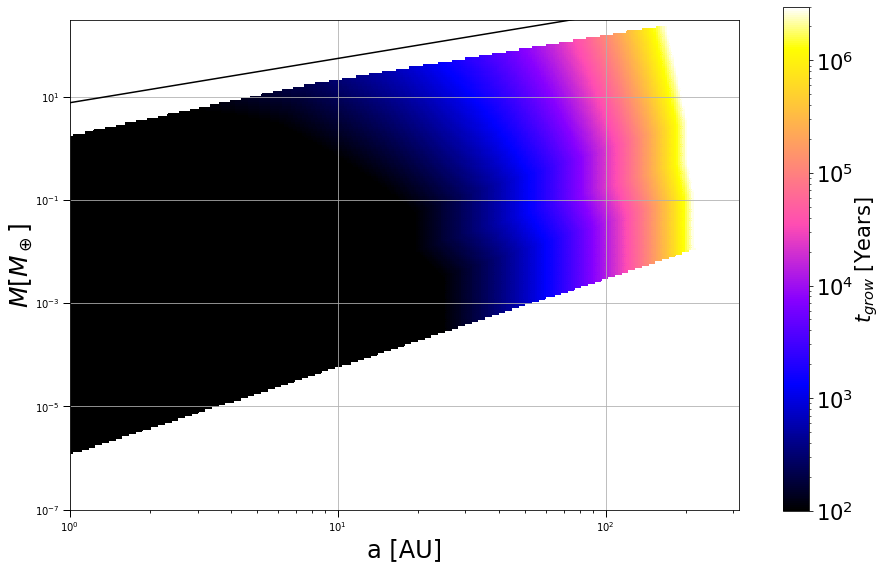

In [186]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_DRTau_LJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-7,3e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('DRTau_2nd_reg.png')

In [187]:
# Next, for FT Tau, using L&J '14
gas_to_dust_ft = np.loadtxt("fttau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma_ft = np.loadtxt("fttau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params_ft = np.loadtxt("fttau_params.txt")
a_au_arr_ft = gas_to_dust_ft[0]
m_core_arr_ft = np.logspace(-10, 3, 1000)
m_star_ft, T_0_ft, sig_0_ft, r_crit_ft, alpha_ft, t_disk_ft = params_ft

In [188]:
eps_p = 0.5 # Pebble coagulation efficiency
Sig_g = sigma[1,:]
Sig_p = sigma[2,:]

# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

In [189]:
t_grow_FTTau_LJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = Sig_g[j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_part = Sig_p[j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)  
        St = tau_f #(a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_FTTau_LJ14[i,j] = core.t_acc

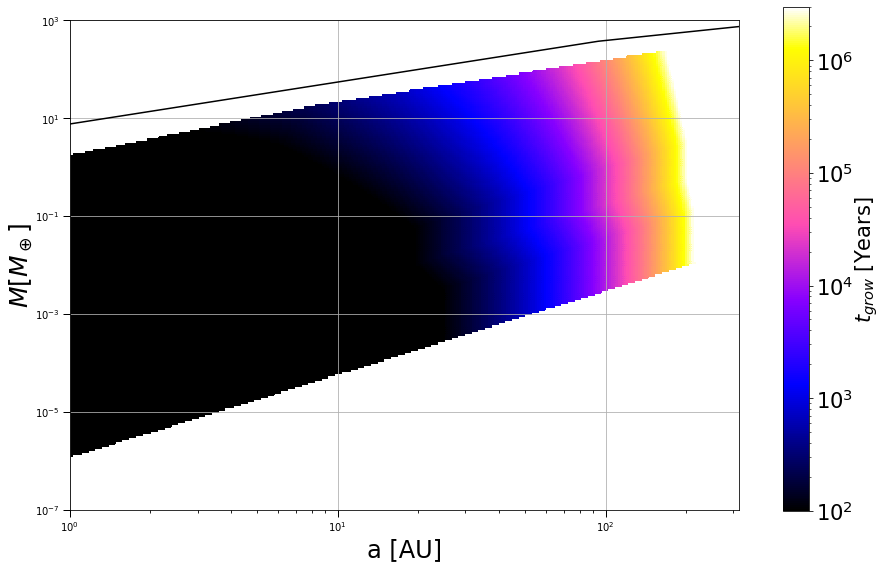

In [190]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_FTTau_LJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-7,1e3)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('FTTau_2nd_reg.png')

In [228]:
## Using L&J '14 for both maximum particle size and surface densities
def sig_g(beta_0, r_c, a, t):
    beta = beta_0 * ((r/r_c)**(-1))*np.exp(-(r/r_c)) #beta_0 * exp(-t/3.154e7)
    return beta * a**(-1)
    
def sig_p(M_star, f_d, beta_0, r_c, a, t):
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a*fn.au)**3)
    Sig_g = sig_g(beta_0, r_c, a,t)
    return 2**(5/6) * 3**(-7/12) * eps_d**(1/3)/eps_p**(1/2) * f_d**(5/6) * om**(-1/6) * t**(-1/6) * Sig_g

gas_to_dust = np.loadtxt("def_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("def_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("def_params.txt")
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)

t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (10 * fn.au)**(3/2)

t_disk = t_PF # Should set the disk age to the minimum for 2nd regime to start
sigma[1] = sig_g(sig_0, r_crit, a_au_arr, t_disk)
sigma[2] = sig_p(m_star, 1e-2, sig_0, r_crit, a_au_arr, t_disk)

eps_d = 0.05
eps_p = 0.5
f_d = 1e-2
r_crit = 40
Sig_g = sig_g(sig_0, r_crit, a_au_arr, t_disk)
Sig_p = sig_p(m_star, f_d, sig_0, r_crit, a_au_arr, t_disk)

a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_disk**(2/3) / fn.au

# Cut off Sig_p if exterior to pebble front
for i, a in enumerate(a_au_arr):
    if a > a_PF:
        Sig_p[i] = 1e-2 * Sig_g[i]

#M_dot = (2/3)**(2/3) * np.pi * (fn.G *  m_star * fn.m_sun)**(1/3) * beta * eps_d**(2/3) * f_d**(5/3) * t_disk**(-1/3)
#M_dot = 1e-7 * fn.m_sun/3.15e7
#Sig_p = np.sqrt((2 * M_dot * Sig_g)/(np.sqrt(3) * np.pi * eps_p * a_au_arr * v_kep_arr))

In [229]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0) * St
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = m_star*fn.m_sun/fn.m_earth * (H/a)**3 * np.array([pre_fac, term1, term2, term3])

In [230]:
t_grow_def_allLJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = Sig_g[j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_part = Sig_p[j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)
        St = tau_f
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_def_allLJ14[i,j] = core.t_acc

18826.314966359365
1.1932218462201579e+09


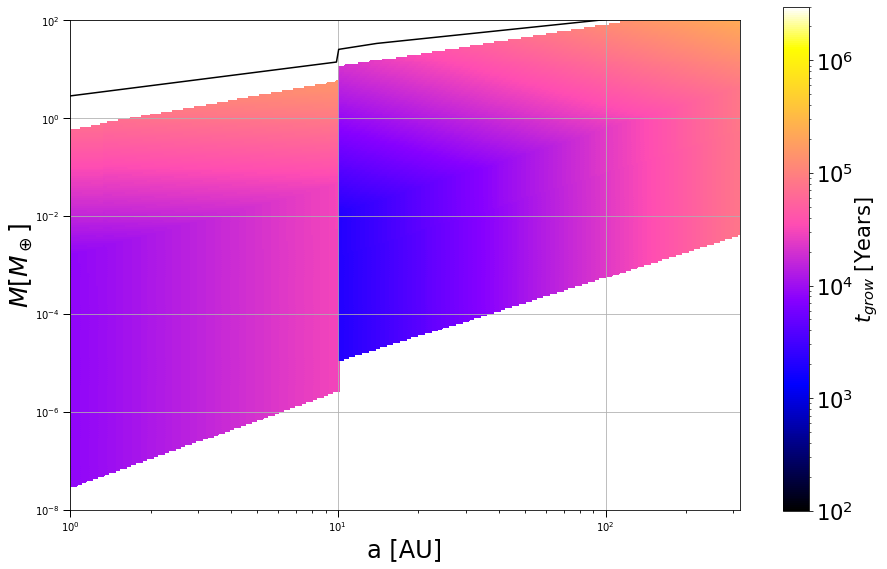

In [231]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_def_allLJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

t_min = np.min(t_grow_arr_cb[np.nonzero(t_grow_arr_cb)])
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (10 * fn.au)**(3/2)
print(t_min)
print(np.format_float_scientific((t_PF_edge - t_PF)/t_min))

In [219]:
# Now, for DR Tau, using L&J '14 for max particle size and surface densities
gas_to_dust = np.loadtxt("drtau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("drtau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("drtau_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 3, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params

t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (1 * fn.au)**(3/2)

t_disk = t_PF # Should set the disk age to the minimum for 2nd regime to start
sigma[1] = sig_g(sig_0, r_crit, a_au_arr, t_disk)
sigma[2] = sig_p(m_star, 1e-2, sig_0, r_crit, a_au_arr, t_disk)

eps_d = 0.05
eps_p = 0.5 # Pebble coagulation efficiency
f_d = 1e-2
Sig_g = sig_g(sig_0, r_crit, a_au_arr, t_disk)
Sig_p = sig_p(m_star, f_d, sig_0, r_crit, a_au_arr, t_disk)

a_PF = (3/16)**(1/3) * (fn.G * m_star * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_disk**(2/3) / fn.au

# Cut off Sig_p if exterior to pebble front
for i, a in enumerate(a_au_arr):
    if a > a_PF:
        Sig_p[i] = 1e-2 * Sig_g[i]

In [220]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = m_star*fn.m_sun/fn.m_earth * (H/a)**3 * np.array([pre_fac, term1, term2, term3])

In [221]:
t_grow_DRTau_allLJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = Sig_g[j]
        sig_part = Sig_p[j]
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)  
        St = tau_f #(a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_DRTau_allLJ14[i,j] = core.t_acc

420.86698463078517
7.371323658938747e+10


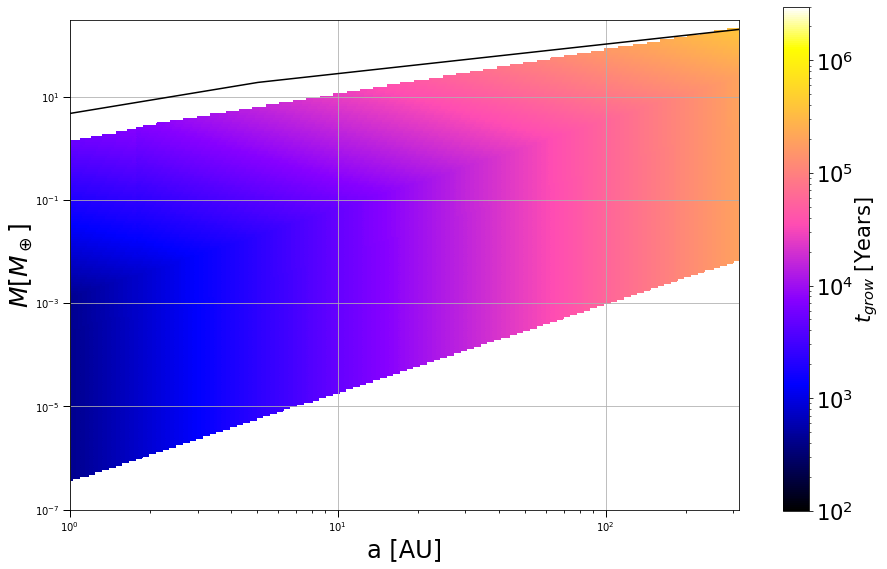

In [222]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_DRTau_allLJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-7,3e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('DRTau_2nd_reg.png')

t_min = np.min(t_grow_DRTau_allLJ14[np.nonzero(t_grow_DRTau_allLJ14)])
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (1 * fn.au)**(3/2)
print(t_min)
print(np.format_float_scientific((t_PF_edge - t_PF)/t_min))

In [211]:
# Next, for FT Tau, using L&J '14
gas_to_dust_ft = np.loadtxt("fttau_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma_ft = np.loadtxt("fttau_sd.txt") # Three columns: a (AU), surface density, dust surface density
params_ft = np.loadtxt("fttau_params.txt")
a_au_arr_ft = gas_to_dust_ft[0]
m_core_arr_ft = np.logspace(-10, 3, 1000)
m_star_ft, T_0_ft, sig_0_ft, r_crit_ft, alpha_ft, t_disk_ft = params_ft

t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star * fn.m_sun)**(-1/2) * (1 * fn.au)**(3/2)

t_disk_ft = t_PF # Should set the disk age to the minimum for 2nd regime to start
sigma_ft[1] = sig_g(sig_0, r_crit, a_au_arr, t_disk)
sigma_ft[2] = sig_p(m_star, 1e-2, sig_0, r_crit, a_au_arr, t_disk)

eps_d = 0.05
eps_p = 0.5 # Pebble coagulation efficiency
f_d = 1e-2

Sig_g = sig_g(sig_0_ft, r_crit_ft, a_au_arr_ft, t_disk_ft)
Sig_p = sig_p(m_star_ft, f_d, sig_0_ft, r_crit_ft, a_au_arr_ft, t_disk_ft)

a_PF = (3/16)**(1/3) * (fn.G * m_star_ft * fn.m_sun)**(1/3) * (eps_d * f_d)**(2/3) * t_disk_ft**(2/3) / fn.au

# Cut off Sig_p if exterior to pebble front
for i, a in enumerate(a_au_arr):
    if a > a_PF:
        Sig_p[i] = 1e-2 * Sig_g[i]

In [212]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr_ft),4])

for i, a_au in enumerate(a_au_arr_ft):
    temp = T_0_ft*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star_ft*fn.m_sun, a)
    eta = fn.eta(c_s, v_k)
    v_0 = eta * v_k
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha_ft) * c_s)**2)
    tau_f = np.sqrt(3)/8 * (eps_p * Sig_p[i])/(eta * Sig_g[i])
    St = tau_f #(a)/(2 * v_g * t_disk)
    H = (c_s * a)/v_k
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = m_star_ft * fn.m_sun/fn.m_earth * (H/a)**3 * np.array([pre_fac, term1, term2, term3])

In [213]:
t_grow_FTTau_allLJ14 = np.zeros((len(m_core_arr), len(a_au_arr)))

for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr_ft):
        sig_gas = Sig_g[j]
        sig_part = Sig_p[j]
        temp = T_0_ft*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star_ft*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha_ft) * c_s)**2)
        tau_f = np.sqrt(3)/8 * (eps_p * sig_part)/(eta * sig_gas)  
        St = tau_f
        s = st_solver(st=St, alph=alpha_ft, a_au=a_au, m_suns=m_star_ft, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha_ft, m_star_solarmasses=m_star_ft,
                    temp_in=temp, sig_p_in=sig_part, sig_g_in=sig_gas)
        core.main(s)
        t_grow_FTTau_allLJ14[i,j] = core.t_acc

1713.8916740629493
2.476942570711457e+10


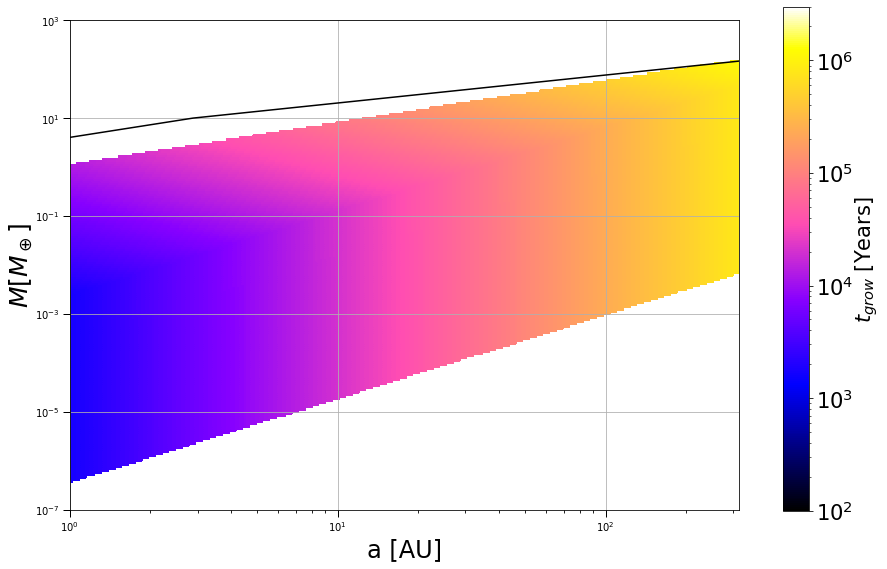

In [214]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_FTTau_allLJ14, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-7,1e3)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)
plt.savefig('FTTau_2nd_reg.png')
t_min = np.min(t_grow_FTTau_allLJ14[np.nonzero(t_grow_FTTau_allLJ14)])
t_PF_edge = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star_ft * fn.m_sun)**(-1/2) * (100 * fn.au)**(3/2)
t_PF = (3/16)**(-1/2) * (eps_d * f_d)**(-1) * (fn.G * m_star_ft * fn.m_sun)**(-1/2) * (1 * fn.au)**(3/2)
print(t_min)
print(np.format_float_scientific((t_PF_edge - t_PF)/t_min))

## Flow isolation plots

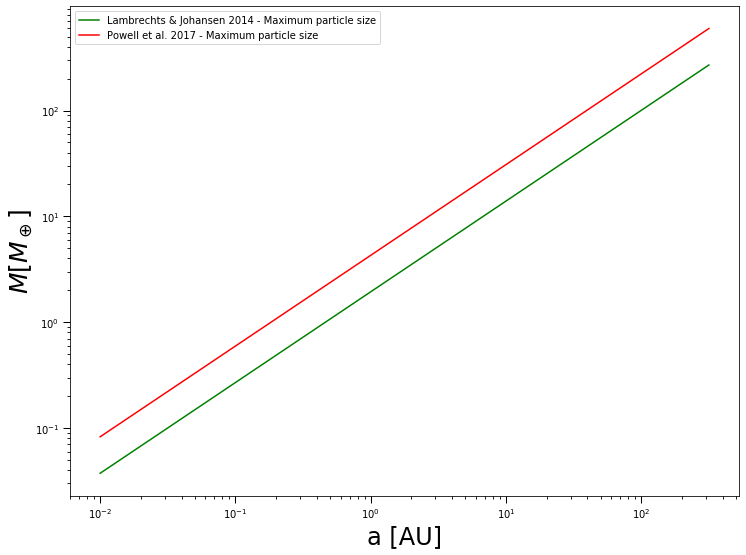

In [135]:
def flow_iso_LJ14(M_star, T_0, f_d, a, t_disk):
    eps_p = 0.5
    temp = T_0*a**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = np.sqrt(fn.G * M_star * fn.m_sun/(a * fn.au))
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a * fn.au)**3)
    v_0 = fn.eta(c_s, v_k) * v_k
    H = c_s/om
    St = np.sqrt(3)/8 * eps_p/eta * f_d

    term1 = np.sqrt(St)
    term2 = 1/np.sqrt(3)
    term3 = (c_s/v_0) * St
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    return M_star * fn.m_sun * (H/(a*fn.au))**3 * pre_fac

def flow_iso_Pow(M_star, T_0, f_d, a, t_disk):
    temp = T_0*a**(-3./7.)
    c_s = fn.sound_speed(temp)
    v_k = np.sqrt(fn.G * M_star * fn.m_sun/(a * fn.au))
    om = np.sqrt(fn.G * M_star * fn.m_sun/(a * fn.au)**3)
    v_0 = fn.eta(c_s, v_k) * v_k
    H = c_s/om
    St = (a * fn.au)/(2 * t_disk * v_0)

    term1 = np.sqrt(St)
    term2 = 1/np.sqrt(3)
    term3 = (c_s/v_0) * St
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    return M_star * fn.m_sun * (H/(a*fn.au))**3 * pre_fac

M_star = 1
T_0 = 200
f_d = 1e-2
t_disk = 3.154e7

a_arr = np.logspace(-2, 2.5, 300)
flow_iso_LJ14_arr = flow_iso_LJ14(M_star, T_0, f_d, a_arr, t_disk)
flow_iso_Pow_arr = flow_iso_Pow(M_star, T_0, f_d, a_arr, t_disk)

fig = plt.figure(1,figsize=(12,9))
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)     
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
plt.loglog(a_arr, flow_iso_LJ14_arr/fn.m_earth, 'g-', label='Lambrechts & Johansen 2014 - Maximum particle size')
plt.loglog(a_arr, flow_iso_Pow_arr/fn.m_earth, 'r-', label='Powell et al. 2017 - Maximum particle size')
plt.legend()

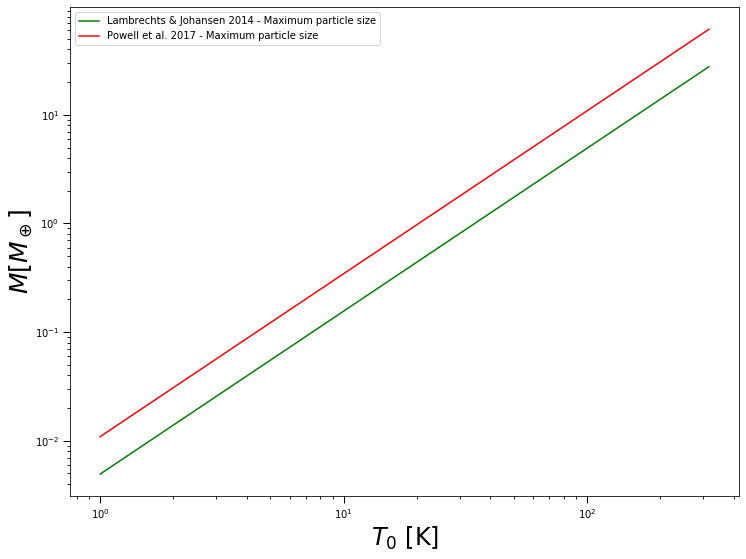

In [136]:
T_0_arr = np.logspace(0, 2.5, 300)
flow_iso_LJ14_arr = flow_iso_LJ14(M_star, T_0_arr, f_d, 10, t_disk)
flow_iso_Pow_arr = flow_iso_Pow(M_star, T_0_arr, f_d, 10, t_disk)

fig = plt.figure(1,figsize=(12,9))
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)     
ax.set_xlabel(r'$T_{0}$ [K]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
plt.loglog(T_0_arr, flow_iso_LJ14_arr/ fn.m_earth, 'g-', label='Lambrechts & Johansen 2014 - Maximum particle size')
plt.loglog(T_0_arr, flow_iso_Pow_arr/fn.m_earth, 'r-', label='Powell et al. 2017 - Maximum particle size')
plt.legend()

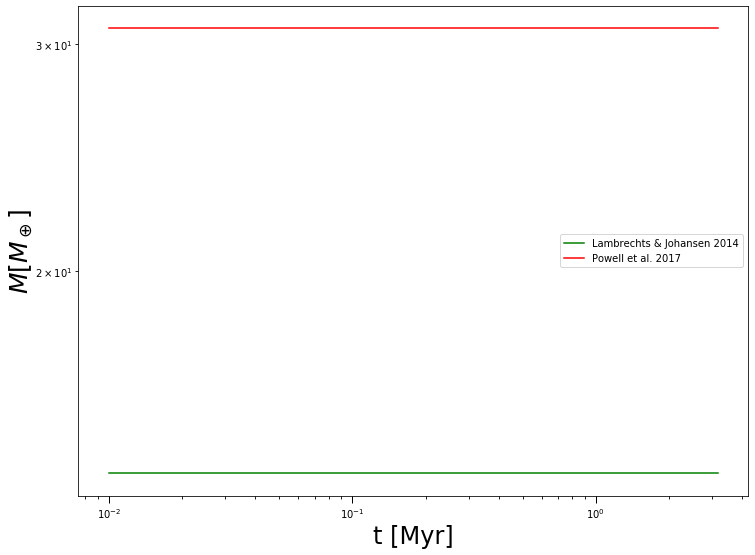

In [137]:
t_arr = np.logspace(-2, 0.5, 300)
flow_iso_LJ14_arr = flow_iso_LJ14(M_star, T_0, f_d, 10, 3.154e7*t_arr)
flow_iso_LJ14_arr = np.ones(t_arr.size) * flow_iso_LJ14_arr
flow_iso_Pow_arr = flow_iso_Pow(M_star, T_0, f_d, 10, 3.154e7*t_arr)

fig = plt.figure(1,figsize=(12,9))
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)     
ax.set_xlabel('t [Myr]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
plt.loglog(t_arr, flow_iso_LJ14_arr/fn.m_earth, 'g-', label='Lambrechts & Johansen 2014')
plt.loglog(t_arr, flow_iso_Pow_arr/fn.m_earth, 'r-', label='Powell et al. 2017')
plt.legend()

## MMSN

In [44]:
# Now, for the solar system (Desch 2007 for params):
gas_to_dust = np.loadtxt("mmsn_fd.txt") # Two columns: a (AU), gas-to-dust ratio
sigma = np.loadtxt("mmsn_sd.txt") # Three columns: a (AU), surface density, dust surface density
params = np.loadtxt("mmsn_params.txt")
a_au_arr = gas_to_dust[0]
m_core_arr = np.logspace(-10, 2, 300)
m_star, T_0, sig_0, r_crit, alpha, t_disk = params
print(gas_to_dust.shape, sigma.shape)

(2, 300) (3, 300)


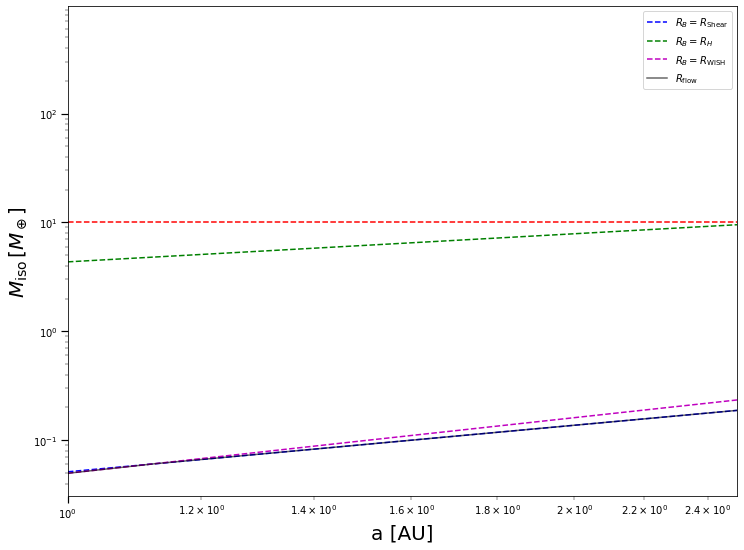

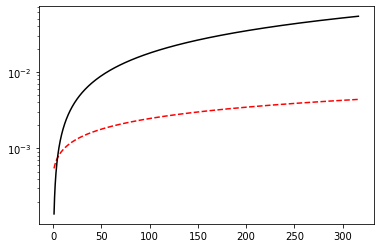

In [45]:
# Try to make flow iso as a fn of semi-major axis
m_flow_arr = np.zeros([len(a_au_arr),4])
limit_st = np.zeros([len(a_au_arr),2])

for i, a_au in enumerate(a_au_arr):
    temp = T_0*a_au**(-3./7.)
    c_s = fn.sound_speed(temp)
    a = a_au * fn.au
    v_k = fn.vkep(m_star*fn.m_sun, a)
    v_0 = fn.eta(c_s, v_k) * v_k # v_0 = eta * v_kep
    v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
    St = (a)/(2 * v_g * t_disk) #1e-3
    H = (c_s * a)/v_k
    limit_st[i,0] = (v_g/c_s)**2
    limit_st[i,1] = St
    term1 = np.sqrt(St)
    term2 = 1
    term3 = (c_s/v_0 * St)
    min1 = np.minimum(term1, term2)
    pre_fac = np.minimum(min1, term3)
    m_flow_arr[i] = (H/a)**3 * 3e5 * np.array([pre_fac, term1, term2, term3])

fig = plt.figure(1,figsize=(12,9))

plt.loglog(a_au_arr, m_flow_arr[:,1], 'b--', label=r"$R_{B} = R_\mathrm{Shear}$")
plt.loglog(a_au_arr, m_flow_arr[:,2], 'g--', label=r"$R_{B} = R_{H}$")
plt.loglog(a_au_arr, m_flow_arr[:,3], 'm--', label=r"$R_{B} = R_\mathrm{WISH}$")
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-', alpha=0.6, label=r"$R_\mathrm{flow}$")
plt.loglog(a_au_arr, 10*np.ones(a_au_arr.shape), 'r--')
plt.ylabel(r"$M_\mathrm{iso} \, [M_\oplus]$", size=20)
plt.xlabel("a [AU]", size=20)
plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)
plt.xlim(1,2.5)
#plt.ylim(0,60)
plt.legend()
plt.show()

plt.semilogy(a_au_arr, limit_st[:,0], 'r--')
plt.semilogy(a_au_arr, limit_st[:,1], 'k-')
#plt.plot(a_au_arr, limit_st[:,1]/limit_st[:,0])

In [49]:
# Try to make color map, with x-axis showing a (AU), y-axis showing M_core (M_earth), and color showing t_acc
t_grow_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
st_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_b_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_ws_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_h_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_sh_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
r_acc_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
rate_arr_cb = np.zeros((len(m_core_arr), len(a_au_arr)))
t_s_c_arr = np.zeros((len(m_core_arr), len(a_au_arr)))
t_eddy_arr = np.zeros((len(m_core_arr), len(a_au_arr)))


for i, m_c in enumerate(m_core_arr):
    for j, a_au in enumerate(a_au_arr):
        sig_gas = sigma[1,j] #disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = sigma[2,j] #gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        c_s = fn.sound_speed(temp)
        v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
        v_0 = fn.eta(c_s, v_k) * v_k
        v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
        St = (a_au*fn.au)/(2 * v_g * t_disk)
        s = st_solver(st=St, alph=alpha, a_au=a_au, m_suns=m_star, m_earths=m_c, temp_in=temp, sig_in=sig_gas)
        core = Core(a_core_au=a_au, m_core_earthmasses=m_c, alpha=alpha, m_star_solarmasses=m_star,
                    temp_in=temp, sig_p_in=sig_p, sig_g_in=sig_gas)
        core.main(s)
        t_grow_arr_cb[i,j] = core.t_acc
        st_arr_cb[i,j] = core.stl_core
        t_s_c_arr[i,j] = core.t_s_core
        t_eddy_arr[i,j] = core.t_eddy_core
        r_b_arr_cb[i,j] = core.r_bondi
        r_ws_arr_cb[i,j] = core.r_ws
        r_h_arr_cb[i,j] = core.r_hill
        r_sh_arr_cb[i,j] = core.r_sh
        r_acc_arr_cb[i,j] = core.r_acc
        #print((St - core.stl)/St)
        rate_arr_cb[i,j] = m_c/(t_grow_arr_cb[i,j]/fn.sec_to_years)
        print(core.t_acc)

Radius:  414728.6085360904 1e-10
257026469.84121296
Radius:  414728.6085360904 1e-10
267581853.2040301
Radius:  414728.6085360904 1e-10
278567356.50948405
Radius:  414728.6085360904 1e-10
290000351.3031395
Radius:  414728.6085360904 1e-10
301898903.70420694
Radius:  414728.6085360904 1e-10
314281801.8707355
Radius:  414728.6085360904 1e-10
327168584.5380968
Radius:  414728.6085360904 1e-10
340579570.6722039
Radius:  414728.6085360904 1e-10
354535890.28049195
Radius:  414728.6085360904 1e-10
369059516.4253235
Radius:  414728.6085360904 1e-10
384173298.4861905
Radius:  414728.6085360904 1e-10
399900996.7188457
Radius:  414728.6085360904 1e-10
416267318.1613406
Radius:  414728.6085360904 1e-10
433297953.93884134
Radius:  414728.6085360904 1e-10
451019618.0210616
Radius:  414728.6085360904 1e-10
469460087.48824805
Radius:  414728.6085360904 1e-10
488648244.36369437
Radius:  414728.6085360904 1e-10
508614119.0730601
Radius:  414728.6085360904 1e-10
529388935.59299487
Radius:  414728.6085360

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: divide by zero encountered in double_scalars



Radius:  427702.6302322768 1.0968160052731403e-10
324113841.1376986
Radius:  427702.6302322768 1.0968160052731403e-10
337403761.3279934
Radius:  427702.6302322768 1.0968160052731403e-10
351234283.6841878
Radius:  427702.6302322768 1.0968160052731403e-10
365627199.2263547
Radius:  427702.6302322768 1.0968160052731403e-10
380605168.403081
Radius:  427702.6302322768 1.0968160052731403e-10
396191755.3942264
Radius:  427702.6302322768 1.0968160052731403e-10
412411463.75118303
Radius:  427702.6302322768 1.0968160052731403e-10
429289773.426175
Radius:  427702.6302322768 1.0968160052731403e-10
446853179.2440929
Radius:  427702.6302322768 1.0968160052731403e-10
465129230.8723873
Radius:  427702.6302322768 1.0968160052731403e-10
484146574.3467032
Radius:  427702.6302322768 1.0968160052731403e-10
503934995.2120507
Radius:  427702.6302322768 1.0968160052731403e-10
524525463.34166765
Radius:  427702.6302322768 1.0968160052731403e-10
545950179.4980353
Radius:  427702.6302322768 1.0968160052731403e-

839617352.6867009
Radius:  441082.52033374883 1.2030053494233242e-10
873784931.4417199
Radius:  441082.52033374883 1.2030053494233242e-10
909330620.7399011
Radius:  441082.52033374883 1.2030053494233242e-10
946309455.8265356
Radius:  441082.52033374883 1.2030053494233242e-10
984778646.1282628
Radius:  441082.52033374883 1.2030053494233242e-10
1024797660.1694313
Radius:  441082.52033374883 1.2030053494233242e-10
1066428313.7669603
Radius:  441082.52033374883 1.2030053494233242e-10
1109734861.628878
Radius:  441082.52033374883 1.2030053494233242e-10
1154784092.4884396
Radius:  441082.52033374883 1.2030053494233242e-10
1201645427.8967316
Radius:  441082.52033374883 1.2030053494233242e-10
1250391024.8436203
Radius:  441082.52033374883 1.2030053494233242e-10
1301095882.3122363
Radius:  441082.52033374883 1.2030053494233242e-10
1353837951.9477983
Radius:  441082.52033374883 1.2030053494233242e-10
1408698252.9851065
Radius:  441082.52033374883 1.2030053494233242e-10
1465760991.5990138
Radius:

0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3194755216767086e-10
0
Radius:  454880.975687042 1.3

Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469111.0903361796 1.4472218707411344e-10
0
Radius:  469

912566735.2014792
Radius:  498920.73462780844 1.7410156523040153e-10
949715691.1774243
Radius:  498920.73462780844 1.7410156523040153e-10
988363581.2190781
Radius:  498920.73462780844 1.7410156523040153e-10
1028570290.4409537
Radius:  498920.73462780844 1.7410156523040153e-10
1070398070.7558515
Radius:  498920.73462780844 1.7410156523040153e-10
1113911633.3541348
Radius:  498920.73462780844 1.7410156523040153e-10
1159178244.7549489
Radius:  498920.73462780844 1.7410156523040153e-10
1206267826.5658329
Radius:  498920.73462780844 1.7410156523040153e-10
1255253059.0923338
Radius:  498920.73462780844 1.7410156523040153e-10
1306209488.9468095
Radius:  498920.73462780844 1.7410156523040153e-10
1359215640.7954495
Radius:  498920.73462780844 1.7410156523040153e-10
1414353133.4356463
Radius:  498920.73462780844 1.7410156523040153e-10
1471706800.3226948
Radius:  498920.73462780844 1.7410156523040153e-10
1531364814.750342
Radius:  498920.73462780844 1.7410156523040153e-10
0
Radius:  498920.734627

0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9095738328781005e-10
0
Radius:  514528.552131855 1.9

0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0944511431514686e-10
0
Radius:  530624.631498622 2.0

Radius:  564343.1511482323 2.519635929317014e-10
1117966694.777145
Radius:  564343.1511482323 2.519635929317014e-10
1163445613.7435386
Radius:  564343.1511482323 2.519635929317014e-10
1210758171.332269
Radius:  564343.1511482323 2.519635929317014e-10
1259977564.1867898
Radius:  564343.1511482323 2.519635929317014e-10
1311179879.3546395
Radius:  564343.1511482323 2.519635929317014e-10
1364444207.128274
Radius:  564343.1511482323 2.519635929317014e-10
1419852758.2407403
Radius:  564343.1511482323 2.519635929317014e-10
1477490985.5849416
Radius:  564343.1511482323 2.519635929317014e-10
1537447710.6137638
Radius:  564343.1511482323 2.519635929317014e-10
1599815254.6383708
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1511482323 2.519635929317014e-10
0
Radius:  564343.1

0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.763577014736163e-10
0
Radius:  581997.5886198499 2.

0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.031135501567576e-10
0
Radius:  600204.3126954683 3.

Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.324597932270945e-10
0
Radius:  618980.6006456593 3.32

Radius:  658313.6965983533 3.9995090972036696e-10
1304124233.4978192
Radius:  658313.6965983533 3.9995090972036696e-10
1357175976.4525568
Radius:  658313.6965983533 3.9995090972036696e-10
1412366682.8093894
Radius:  658313.6965983533 3.9995090972036696e-10
1469781737.4278667
Radius:  658313.6965983533 3.9995090972036696e-10
1529509896.8625686
Radius:  658313.6965983533 3.9995090972036696e-10
1591643420.9933522
Radius:  658313.6965983533 3.9995090972036696e-10
1656278209.7355914
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10
0
Radius:  658313.6965983533 3.9995090972036696e-10

0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.386725591048494e-10
0
Radius:  678907.8297417391 4.

Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.811430839003264e-10
0
Radius:  700146.2124611546 4.81

Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0
Radius:  744636.9737659905 5.78817703770128e-10
0


0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.348565216305211e-10
0
Radius:  767931.5718587608 6.

0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10
0
Radius:  791954.8986064623 6.96320793976389e-10


Radius:  842279.6389692483 8.376776400682924e-10
1366688156.4193852
Radius:  842279.6389692483 8.376776400682924e-10
1422380434.5082455
Radius:  842279.6389692483 8.376776400682924e-10
1480322420.9654164
Radius:  842279.6389692483 8.376776400682924e-10
1540604106.8881674
Radius:  842279.6389692483 8.376776400682924e-10
1603319044.6447291
Radius:  842279.6389692483 8.376776400682924e-10
1668564487.2070377
Radius:  842279.6389692483 8.376776400682924e-10
1736441532.871775
Radius:  842279.6389692483 8.376776400682924e-10
1807055275.5757666
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10
0
Radius:  842279.6389692483 8.376776400682924e-10


0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.187782428863321e-10
0
Radius:  868628.8082460325 9.

Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.0077306820944618e-09
0
Radius:  895802.262818882 1.007

0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.212305401337653e-09
0
Radius:  952725.9795255805 1.

Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982530.2594196432 1.3296759674662099e-09
0
Radius:  982

Radius:  1044965.1029831854 1.5996073018614912e-09
1388346308.4215653
Radius:  1044965.1029831854 1.5996073018614912e-09
1445016300.6144814
Radius:  1044965.1029831854 1.5996073018614912e-09
1503979797.6861968
Radius:  1044965.1029831854 1.5996073018614912e-09
1565328730.5511358
Radius:  1044965.1029831854 1.5996073018614912e-09
1629158676.0300844
Radius:  1044965.1029831854 1.5996073018614912e-09
1695568999.8068812
Radius:  1044965.1029831854 1.5996073018614912e-09
1764663004.9251726
Radius:  1044965.1029831854 1.5996073018614912e-09
1836548086.0375106
Radius:  1044965.1029831854 1.5996073018614912e-09
1911335889.6270938
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0
Radius:  1044965.1029831854 1.5996073018614912e-09
0

0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.7544748908334596e-09
0
Radius:  1077654.9141966337 1.75447489083345

0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1111367.3660266157 1.924336141115976e-09
0
Radius:  1

0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.3149866718511656e-09
0
Radius:  1181989.1580521187 2.31498667185116

Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  1218965.5147962428 2.539114433680347e-09
0
Radius:  121

1200930636.399799
Radius:  1296424.6266108837 3.0545682465154318e-09
1250094658.2092445
Radius:  1296424.6266108837 3.0545682465154318e-09
1301254987.4654906
Radius:  1296424.6266108837 3.0545682465154318e-09
1354491933.5164278
Radius:  1296424.6266108837 3.0545682465154318e-09
1409889003.088929
Radius:  1296424.6266108837 3.0545682465154318e-09
1467533026.1593094
Radius:  1296424.6266108837 3.0545682465154318e-09
1527514286.720708
Radius:  1296424.6266108837 3.0545682465154318e-09
1589926658.6356835
Radius:  1296424.6266108837 3.0545682465154318e-09
1654867746.7694507
Radius:  1296424.6266108837 3.0545682465154318e-09
1722439033.606654
Radius:  1296424.6266108837 3.0545682465154318e-09
1792746031.5622365
Radius:  1296424.6266108837 3.0545682465154318e-09
1865898441.2050188
Radius:  1296424.6266108837 3.0545682465154318e-09
1942010315.6208389
Radius:  1296424.6266108837 3.0545682465154318e-09
2021200231.1507785
Radius:  1296424.6266108837 3.0545682465154318e-09
0
Radius:  1296424.62661

0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.3502993419772366e-09
0
Radius:  1336980.8865045302 3.35029934197723

0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1378805.8743926904 3.674661940736688e-09
0
Radius:  1

Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.42063797202853e-09
0
Radius:  1466422.0350624362 4.4

Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  1512296.3511985277 4.848626481239088e-09
0
Radius:  151

0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.832923594286212e-09
0
Radius:  1608395.158541688 5.

Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  1658710.8427107106 6.397643955748424e-09
0
Radius:  165

0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1710600.5605119257 7.017038286703837e-09
0
Radius:  1

0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.441534596012994e-09
0
Radius:  1819300.600405203 8.

Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  1876214.0733986797 9.258810253973945e-09
0
Radius:  187

1912144870.3115046
Radius:  1995438.0169274549 1.1138398264826182e-08
1886217620.836393
Radius:  1995438.0169274549 1.1138398264826182e-08
1860729954.155629
Radius:  1995438.0169274549 1.1138398264826182e-08
1835671307.4358027
Radius:  1995438.0169274549 1.1138398264826182e-08
1811031486.8929367
Radius:  1995438.0169274549 1.1138398264826182e-08
1786800651.8677022
Radius:  1995438.0169274549 1.1138398264826182e-08
1762969299.612308
Radius:  1995438.0169274549 1.1138398264826182e-08
1739528250.7588873
Radius:  1995438.0169274549 1.1138398264826182e-08
1689800456.3461928
Radius:  1995438.0169274549 1.1138398264826182e-08
1668512067.4851959
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.1138398264826182e-08
0
Radius:  1995438.0169274549 1.113839

Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  2057861.6250223834 1.221677348996793e-08
0
Radius:  205

Radius:  2188628.3544965247 1.4696843861124474e-08
2167220386.934213
Radius:  2188628.3544965247 1.4696843861124474e-08
2136791743.682801
Radius:  2188628.3544965247 1.4696843861124474e-08
2106917377.0403988
Radius:  2188628.3544965247 1.4696843861124474e-08
2077582553.437572
Radius:  2188628.3544965247 1.4696843861124474e-08
2048773088.8064787
Radius:  2188628.3544965247 1.4696843861124474e-08
2020475324.836912
Radius:  2188628.3544965247 1.4696843861124474e-08
1992676106.2356017
Radius:  2188628.3544965247 1.4696843861124474e-08
1965362758.953781
Radius:  2188628.3544965247 1.4696843861124474e-08
1938523069.3482525
Radius:  2188628.3544965247 1.4696843861124474e-08
1912145264.2427428
Radius:  2188628.3544965247 1.4696843861124474e-08
1886217991.8551476
Radius:  2188628.3544965247 1.4696843861124474e-08
1860730303.5591319
Radius:  2188628.3544965247 1.4696843861124474e-08
1835671636.447683
Radius:  2188628.3544965247 1.4696843861124474e-08
1811031796.6676533
Radius:  2188628.354496524

Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  2257095.566961937 1.6119733573881553e-08
0
Radius:  225

0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2327704.650235685 1.7680381784572085e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2400522.6088063996 1.939212572065831e-08
0
Radius:  2

Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918e-08
0
Radius:  2475618.5432749023 2.1269593866686918

Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  2553063.715927211 2.3328830978641584e-08
0
Radius:  255

1786801529.4093857
Radius:  2715298.0412148833 2.806470846309839e-08
1762970125.8168297
Radius:  2715298.0412148833 2.806470846309839e-08
1739529028.5320776
Radius:  2715298.0412148833 2.806470846309839e-08
1689801177.070264
Radius:  2715298.0412148833 2.806470846309839e-08
1668512746.2053597
Radius:  2715298.0412148833 2.806470846309839e-08
1647515467.2187145
Radius:  2715298.0412148833 2.806470846309839e-08
1626805165.4310703
Radius:  2715298.0412148833 2.806470846309839e-08
1606377726.8782701
Radius:  2715298.0412148833 2.806470846309839e-08
1586229097.4313185
Radius:  2715298.0412148833 2.806470846309839e-08
1566355281.929149
Radius:  2715298.0412148833 2.806470846309839e-08
1546752343.3238854
Radius:  2715298.0412148833 2.806470846309839e-08
1527416401.838467
Radius:  2715298.0412148833 2.806470846309839e-08
1508343635.3047087
Radius:  2715298.0412148833 2.806470846309839e-08
1489530273.5489547
Radius:  2715298.0412148833 2.806470846309839e-08
1470972604.9769351
Radius:  2715298.0

0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08
0
Radius:  2800241.146111077 3.07818214256508e-08


0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3.37619944111134e-08
0
Radius:  2887841.5398057327 3

Radius:  3071349.307679025 4.0615859883769794e-08
2229804583.778931
Radius:  3071349.307679025 4.0615859883769794e-08
2198220734.3575335
Radius:  3071349.307679025 4.0615859883769794e-08
2167222384.825021
Radius:  3071349.307679025 4.0615859883769794e-08
2136793626.7450936
Radius:  3071349.307679025 4.0615859883769794e-08
2106919151.8507433
Radius:  3071349.307679025 4.0615859883769794e-08
2077584226.1849098
Radius:  3071349.307679025 4.0615859883769794e-08
2048774665.3160682
Radius:  3071349.307679025 4.0615859883769794e-08
2020476810.59276
Radius:  3071349.307679025 4.0615859883769794e-08
1992677506.4014904
Radius:  3071349.307679025 4.0615859883769794e-08
1965364078.3929636
Radius:  3071349.307679025 4.0615859883769794e-08
1938524312.641913
Radius:  3071349.307679025 4.0615859883769794e-08
1912146435.7072775
Radius:  3071349.307679025 4.0615859883769794e-08
1886219095.5583594
Radius:  3071349.307679025 4.0615859883769794e-08
1860731343.3353872
Radius:  3071349.307679025 4.0615859883

Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.454812518844989e-08
0
Radius:  3167430.821551551 4.45

0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3266518.0688601783 4.886109671160326e-08
0
Radius:  3

1762970628.31016
Radius:  3474088.820673186 5.878016072274912e-08
1739529501.8376772
Radius:  3474088.820673186 5.878016072274912e-08
1689801615.9172595
Radius:  3474088.820673186 5.878016072274912e-08
1668513159.727832
Radius:  3474088.820673186 5.878016072274912e-08
1647515856.8208883
Radius:  3474088.820673186 5.878016072274912e-08
1626805532.440923
Radius:  3474088.820673186 5.878016072274912e-08
1606378073.7930198
Radius:  3474088.820673186 5.878016072274912e-08
1586229424.067847
Radius:  3474088.820673186 5.878016072274912e-08
1566355589.4249594
Radius:  3474088.820673186 5.878016072274912e-08
1546752632.7544956
Radius:  3474088.820673186 5.878016072274912e-08
1527416674.2208924
Radius:  3474088.820673186 5.878016072274912e-08
1508343890.4324365
Radius:  3474088.820673186 5.878016072274912e-08
1489530513.6228063
Radius:  3474088.820673186 5.878016072274912e-08
1470972830.8444412
Radius:  3474088.820673186 5.878016072274912e-08
1452667183.1735642
Radius:  3474088.820673186 5.87801

0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08
0
Radius:  3582769.299439746 6.44710210732387e-08


0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08
0
Radius:  3694849.64708549 7.071284778942996e-08


1489530613.909919
Radius:  3929638.710826744 8.50679341636417e-08
1470972925.2398412
Radius:  3929638.710826744 8.50679341636417e-08
1452667272.0076613
Radius:  3929638.710826744 8.50679341636417e-08
1432012377.2394218
Radius:  3929638.710826744 8.50679341636417e-08
1399298849.8219151
Radius:  3929638.710826744 8.50679341636417e-08
1367362255.2654653
Radius:  3929638.710826744 8.50679341636417e-08
1336183562.6131105
Radius:  3929638.710826744 8.50679341636417e-08
1305744217.5556507
Radius:  3929638.710826744 8.50679341636417e-08
1276026130.3174613
Radius:  3929638.710826744 8.50679341636417e-08
1247011663.8529532
Radius:  3929638.710826744 8.50679341636417e-08
1218683622.3456907
Radius:  3929638.710826744 8.50679341636417e-08
1191025240.0023515
Radius:  3929638.710826744 8.50679341636417e-08
1164020170.1339312
Radius:  3929638.710826744 8.50679341636417e-08
1137652474.5168016
Radius:  3929638.710826744 8.50679341636417e-08
1111906613.026397
Radius:  3929638.710826744 8.50679341636417e-

0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08
0
Radius:  4052570.230001171 9.33038717262036e-08


0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4179347.4356416133 1.0233717986325213e-07
0
Radius:  4310090.6329756705 1.1224505680853059e-07
0
Radius:  4310090.6329756705 1.12245056808530

Radius:  4444923.89075873 1.231121748203892e-07
969667403.9510726
Radius:  4444923.89075873 1.231121748203892e-07
947870639.3273447
Radius:  4444923.89075873 1.231121748203892e-07
926584560.119698
Radius:  4444923.89075873 1.231121748203892e-07
905796784.2505728
Radius:  4444923.89075873 1.231121748203892e-07
885495237.6144252
Radius:  4444923.89075873 1.231121748203892e-07
865668146.2844238
Radius:  4444923.89075873 1.231121748203892e-07
846304028.9184805
Radius:  4444923.89075873 1.231121748203892e-07
827391689.3595002
Radius:  4444923.89075873 1.231121748203892e-07
808920209.4248409
Radius:  4444923.89075873 1.231121748203892e-07
790878941.8801109
Radius:  4444923.89075873 1.231121748203892e-07
773257503.5925786
Radius:  4444923.89075873 1.231121748203892e-07
756045768.8595477
Radius:  4444923.89075873 1.231121748203892e-07
739233862.9072188
Radius:  4444923.89075873 1.231121748203892e-07
722812155.5556296
Radius:  4444923.89075873 1.231121748203892e-07
706771255.0454297
Radius:  44

0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4583975.159008964 1.3503140378698722e-07
0
Radius:  4

Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.481046048880677e-07
0
Radius:  4727376.390425548 1.48

2328240378.4043903
Radius:  5027777.322175513 1.7817063195457326e-07
2294798016.962808
Radius:  5027777.322175513 1.7817063195457326e-07
2261992765.8443074
Radius:  5027777.322175513 1.7817063195457326e-07
2229806749.137341
Radius:  5027777.322175513 1.7817063195457326e-07
2198222775.5233583
Radius:  5027777.322175513 1.7817063195457326e-07
2167224308.971824
Radius:  5027777.322175513 1.7817063195457326e-07
2136795440.6198475
Radius:  5027777.322175513 1.7817063195457326e-07
2106920861.7999878
Radius:  5027777.322175513 1.7817063195457326e-07
2077585838.1792796
Radius:  5027777.322175513 1.7817063195457326e-07
2048776184.9732902
Radius:  5027777.322175513 1.7817063195457326e-07
2020478243.1992378
Radius:  5027777.322175513 1.7817063195457326e-07
1992678856.9325433
Radius:  5027777.322175513 1.7817063195457326e-07
1965365351.5318263
Radius:  5027777.322175513 1.7817063195457326e-07
1938525512.797552
Radius:  5027777.322175513 1.7817063195457326e-07
1912147567.0311189
Radius:  5027777.32

Radius:  5185062.087969093 1.9542040079740514e-07
1668513650.7531552
Radius:  5185062.087969093 1.9542040079740514e-07
1647516319.6770964
Radius:  5185062.087969093 1.9542040079740514e-07
1626805968.6914415
Radius:  5185062.087969093 1.9542040079740514e-07
1606378483.6739006
Radius:  5185062.087969093 1.9542040079740514e-07
1586229810.346335
Radius:  5185062.087969093 1.9542040079740514e-07
1566355953.406984
Radius:  5185062.087969093 1.9542040079740514e-07
1546752975.6752112
Radius:  5185062.087969093 1.9542040079740514e-07
1527416997.2486427
Radius:  5185062.087969093 1.9542040079740514e-07
1508344194.672483
Radius:  5185062.087969093 1.9542040079740514e-07
1489530800.1208313
Radius:  5185062.087969093 1.9542040079740514e-07
1470973100.5898452
Radius:  5185062.087969093 1.9542040079740514e-07
1452667437.1025615
Radius:  5185062.087969093 1.9542040079740514e-07
1432012532.371028
Radius:  5185062.087969093 1.9542040079740514e-07
1399298994.288841
Radius:  5185062.087969093 1.9542040079

Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.143402233514859e-07
0
Radius:  5347267.218362288 2.14

0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.3509178754572845e-07
0
Radius:  5514546.6379114175 2.35091787545728

Radius:  5864968.269572124 2.8281667802300293e-07
2432580493.4451485
Radius:  5864968.269572124 2.8281667802300293e-07
2397112194.335866
Radius:  5864968.269572124 2.8281667802300293e-07
2362339054.768898
Radius:  5864968.269572124 2.8281667802300293e-07
2328240956.6822095
Radius:  5864968.269572124 2.8281667802300293e-07
2294798562.008207
Radius:  5864968.269572124 2.8281667802300293e-07
2261993279.592416
Radius:  5864968.269572124 2.8281667802300293e-07
2229807233.4076533
Radius:  5864968.269572124 2.8281667802300293e-07
2198223232.0268254
Radius:  5864968.269572124 2.8281667802300293e-07
2167224739.317488
Radius:  5864968.269572124 2.8281667802300293e-07
2136795846.3210692
Radius:  5864968.269572124 2.8281667802300293e-07
2106921244.2802787
Radius:  5864968.269572124 2.8281667802300293e-07
2077586198.7777615
Radius:  5864968.269572124 2.8281667802300293e-07
2048776524.9498281
Radius:  5864968.269572124 2.8281667802300293e-07
2020478563.7392488
Radius:  5864968.269572124 2.8281667802

Radius:  6048443.014286418 3.1019785901381e-07
618025424.0019517
Radius:  6048443.014286418 3.1019785901381e-07
604406003.357266
Radius:  6048443.014286418 3.1019785901381e-07
591100148.0859458
Radius:  6048443.014286418 3.1019785901381e-07
578100359.1372635
Radius:  6048443.014286418 3.1019785901381e-07
565399322.1844388
Radius:  6048443.014286418 3.1019785901381e-07
552989902.9790198
Radius:  6048443.014286418 3.1019785901381e-07
540865142.8236556
Radius:  6048443.014286418 3.1019785901381e-07
529018254.16021144
Radius:  6048443.014286418 3.1019785901381e-07
517442616.2702816
Radius:  6048443.014286418 3.1019785901381e-07
506131771.08519083
Radius:  6048443.014286418 3.1019785901381e-07
495079419.1026948
Radius:  6048443.014286418 3.1019785901381e-07
484279415.40762603
Radius:  6048443.014286418 3.1019785901381e-07
473725765.7938222
Radius:  6048443.014286418 3.1019785901381e-07
463412622.9847374
Radius:  6048443.014286418 3.1019785901381e-07
453334282.9502006
Radius:  6048443.014286

Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  6237657.428918893 3.4022997656780715e-07
0
Radius:  623

2661223180.340184
Radius:  6634029.105051846 4.092984818452442e-07
2621113213.6063395
Radius:  6634029.105051846 4.092984818452442e-07
2581837521.962762
Radius:  6634029.105051846 4.092984818452442e-07
2543370535.416605
Radius:  6634029.105051846 4.092984818452442e-07
2505687691.694712
Radius:  6634029.105051846 4.092984818452442e-07
2468765394.6344085
Radius:  6634029.105051846 4.092984818452442e-07
2432580974.082085
Radius:  6634029.105051846 4.092984818452442e-07
2397112647.2678533
Radius:  6634029.105051846 4.092984818452442e-07
2362339481.618
Radius:  6634029.105051846 4.092984818452442e-07
2328241358.973097
Radius:  6634029.105051846 4.092984818452442e-07
2294798941.174169
Radius:  6634029.105051846 4.092984818452442e-07
2261993636.9809937
Radius:  6634029.105051846 4.092984818452442e-07
2229807570.2859063
Radius:  6634029.105051846 4.092984818452442e-07
2198223549.5862637
Radius:  6634029.105051846 4.092984818452442e-07
2167225038.6786904
Radius:  6634029.105051846 4.09298481845

1137652608.089542
Radius:  6841562.503449134 4.4892512582186075e-07
1111906737.24305
Radius:  6841562.503449134 4.4892512582186075e-07
1086767549.0337355
Radius:  6841562.503449134 4.4892512582186075e-07
1062220269.4502225
Radius:  6841562.503449134 4.4892512582186075e-07
1038250493.0503496
Radius:  6841562.503449134 4.4892512582186075e-07
1014844173.6167655
Radius:  6841562.503449134 4.4892512582186075e-07
991987615.0518084
Radius:  6841562.503449134 4.4892512582186075e-07
969667462.5055275
Radius:  6841562.503449134 4.4892512582186075e-07
947870693.7308114
Radius:  6841562.503449134 4.4892512582186075e-07
926584610.6597925
Radius:  6841562.503449134 4.4892512582186075e-07
905796831.1958276
Radius:  6841562.503449134 4.4892512582186075e-07
885495281.2154987
Radius:  6841562.503449134 4.4892512582186075e-07
865668186.7752321
Radius:  6841562.503449134 4.4892512582186075e-07
846304066.5172606
Radius:  6841562.503449134 4.4892512582186075e-07
827391724.269809
Radius:  6841562.503449134 4

Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.923882631706742e-07
0
Radius:  7055588.202493328 4.92

2661223787.630155
Radius:  7503935.254859568 5.923457145875806e-07
2621113785.6500745
Radius:  7503935.254859568 5.923457145875806e-07
2581838060.8452034
Radius:  7503935.254859568 5.923457145875806e-07
2543371043.0959415
Radius:  7503935.254859568 5.923457145875806e-07
2505688170.010357
Radius:  7503935.254859568 5.923457145875806e-07
2468765845.314456
Radius:  7503935.254859568 5.923457145875806e-07
2432581398.7502694
Radius:  7503935.254859568 5.923457145875806e-07
2397113047.450061
Radius:  7503935.254859568 5.923457145875806e-07
2362339858.7483487
Radius:  7503935.254859568 5.923457145875806e-07
2328241714.3996253
Radius:  7503935.254859568 5.923457145875806e-07
2294799276.164154
Radius:  7503935.254859568 5.923457145875806e-07
2261993952.7259283
Radius:  7503935.254859568 5.923457145875806e-07
2229807867.906153
Radius:  7503935.254859568 5.923457145875806e-07
2198223830.135412
Radius:  7503935.254859568 5.923457145875806e-07
2167225303.1476393
Radius:  7503935.254859568 5.9234571

Radius:  7738682.067111011 6.496942604146125e-07
326855733.19672984
Radius:  7738682.067111011 6.496942604146125e-07
319862466.10267746
Radius:  7738682.067111011 6.496942604146125e-07
313025799.817956
Radius:  7738682.067111011 6.496942604146125e-07
306342074.9670802
Radius:  7738682.067111011 6.496942604146125e-07
299807720.7758929
Radius:  7738682.067111011 6.496942604146125e-07
293419252.8687825
Radius:  7738682.067111011 6.496942604146125e-07
287173271.121643
Radius:  7738682.067111011 6.496942604146125e-07
281066457.56915
Radius:  7738682.067111011 6.496942604146125e-07
275095574.36497074
Radius:  7738682.067111011 6.496942604146125e-07
269257461.79354584
Radius:  7738682.067111011 6.496942604146125e-07
263549036.33213037
Radius:  7738682.067111011 6.496942604146125e-07
257967288.76180732
Radius:  7738682.067111011 6.496942604146125e-07
252509282.32622123
Radius:  7738682.067111011 6.496942604146125e-07
0
Radius:  7738682.067111011 6.496942604146125e-07
0
Radius:  7738682.0671110

Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.125950633568411e-07
0
Radius:  7980772.501607399 7.12

1965366165.563565
Radius:  8487910.350927569 8.572556731909324e-07
1938526280.290157
Radius:  8487910.350927569 8.572556731909324e-07
1912148290.6528978
Radius:  8487910.350927569 8.572556731909324e-07
1886220844.2222638
Radius:  8487910.350927569 8.572556731909324e-07
1860732991.7638924
Radius:  8487910.350927569 8.572556731909324e-07
1835674169.79967
Radius:  8487910.350927569 8.572556731909324e-07
1811034183.9399686
Radius:  8487910.350927569 8.572556731909324e-07
1786803192.9564018
Radius:  8487910.350927569 8.572556731909324e-07
1762971693.5664153
Radius:  8487910.350927569 8.572556731909324e-07
1739530505.8995113
Radius:  8487910.350927569 8.572556731909324e-07
1689802547.557551
Radius:  8487910.350927569 8.572556731909324e-07
1668514038.2883081
Radius:  8487910.350927569 8.572556731909324e-07
1647516685.2437687
Radius:  8487910.350927569 8.572556731909324e-07
1626806313.5053878
Radius:  8487910.350927569 8.572556731909324e-07
1606378808.8833735
Radius:  8487910.350927569 8.57255

Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.402517429670132e-07
0
Radius:  8753439.014206735 9.40

0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9027274.253322335 1.0312831606721847e-06
0
Radius:  9

885495305.0699954
Radius:  9600912.011964267 1.2406391590588318e-06
865668208.9436078
Radius:  9600912.011964267 1.2406391590588318e-06
846304087.1156896
Radius:  9600912.011964267 1.2406391590588318e-06
827391743.406797
Radius:  9600912.011964267 1.2406391590588318e-06
808920259.6133587
Radius:  9600912.011964267 1.2406391590588318e-06
790878988.4813898
Radius:  9600912.011964267 1.2406391590588318e-06
773257546.8598151
Radius:  9600912.011964267 1.2406391590588318e-06
756045809.0287718
Radius:  9600912.011964267 1.2406391590588318e-06
739233900.198393
Radius:  9600912.011964267 1.2406391590588318e-06
722812190.1736872
Radius:  9600912.011964267 1.2406391590588318e-06
706771287.1812446
Radius:  9600912.011964267 1.2406391590588318e-06
691102031.8535959
Radius:  9600912.011964267 1.2406391590588318e-06
675795491.3671842
Radius:  9600912.011964267 1.2406391590588318e-06
660842953.7299861
Radius:  9600912.011964267 1.2406391590588318e-06
646235922.2149422
Radius:  9600912.011964267 1.240

0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9901258.885034053 1.3607528864243332e-06
0
Radius:  9

Radius:  10530433.959941532 1.6369930016117019e-06
1811034344.4940763
Radius:  10530433.959941532 1.6369930016117019e-06
1786803344.3678482
Radius:  10530433.959941532 1.6369930016117019e-06
1762971836.3554232
Radius:  10530433.959941532 1.6369930016117019e-06
1739530640.556103
Radius:  10530433.959941532 1.6369930016117019e-06
1689802672.572686
Radius:  10530433.959941532 1.6369930016117019e-06
1668514156.2537181
Radius:  10530433.959941532 1.6369930016117019e-06
1647516796.5516794
Radius:  10530433.959941532 1.6369930016117019e-06
1626806418.5260115
Radius:  10530433.959941532 1.6369930016117019e-06
1606378907.966155
Radius:  10530433.959941532 1.6369930016117019e-06
1586230210.5107384
Radius:  10530433.959941532 1.6369930016117019e-06
1566356330.7795174
Radius:  10530433.959941532 1.6369930016117019e-06
1546753331.5178556
Radius:  10530433.959941532 1.6369930016117019e-06
1527417332.753607
Radius:  10530433.959941532 1.6369930016117019e-06
1508344510.9661872
Radius:  10530433.959941

183693166.98924792
Radius:  10859859.217458215 1.7954801246878305e-06
179868289.71018088
Radius:  10859859.217458215 1.7954801246878305e-06
176126739.29515684
Radius:  10859859.217458215 1.7954801246878305e-06
172466616.1566587
Radius:  10859859.217458215 1.7954801246878305e-06
168886065.80296186
Radius:  10859859.217458215 1.7954801246878305e-06
165383277.73245403
Radius:  10859859.217458215 1.7954801246878305e-06
161956484.35569173
Radius:  10859859.217458215 1.7954801246878305e-06
158603959.94448498
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  10859859.217458215 1.7954801246878305e-06
0
Radius:  108598

Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11199589.938235266 1.9693113379074216e-06
0
Radius:  11549948.509735664 2.159972194782717e-06
2875261209.263069
Radius:  11549948.509735664 2.159972194782717e-06
2830557761.6397214
Radius:  11549948.509735664 2.159972194782717e-06
2786833131.3720436
Radius:  11549948.509735664 2.159972194782717e-06
2744056030.0250936
Radius:  11549948.509735664 2.159972194782717e-06
2702196408.7216845
Radius:  11549948.509735664 2.159972194782717e-06
2661225408.5120416
Radius:  11549948.509735664 2.159972194782717e-06
2621115312.407139
Radius:  11549948.509735664 2.159972194782717e-06
2581839499.046838
Radius:  11549948.509735664 2.159972194782717e-06
2543372397.972995
Radius:  11549948.509735664 2.159972194782717e-06
2505689446.4764

Radius:  11911267.404721184 2.369092074182632e-06
1606378955.679041
Radius:  11911267.404721184 2.369092074182632e-06
1586230255.5278609
Radius:  11911267.404721184 2.369092074182632e-06
1566356373.2509086
Radius:  11911267.404721184 2.369092074182632e-06
1546753371.5851226
Radius:  11911267.404721184 2.369092074182632e-06
1527417370.5504143
Radius:  11911267.404721184 2.369092074182632e-06
1508344546.618707
Radius:  11911267.404721184 2.369092074182632e-06
1489531131.8950071
Radius:  11911267.404721184 2.369092074182632e-06
1470973413.3103192
Radius:  11911267.404721184 2.369092074182632e-06
1452667731.826239
Radius:  11911267.404721184 2.369092074182632e-06
1432012809.5939872
Radius:  11911267.404721184 2.369092074182632e-06
1399299252.7292387
Radius:  11911267.404721184 2.369092074182632e-06
1367362630.6759436
Radius:  11911267.404721184 2.369092074182632e-06
1336183912.3505657
Radius:  11911267.404721184 2.369092074182632e-06
1305744543.325588
Radius:  11911267.404721184 2.36909207

0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  12283889.496752433 2.598458104929247e-06
0
Radius:  1

1938526668.9022038
Radius:  13064468.732586436 3.125959000482284e-06
1912148657.1146276
Radius:  13064468.732586436 3.125959000482284e-06
1886221189.8028362
Radius:  13064468.732586436 3.125959000482284e-06
1860733317.6583922
Radius:  13064468.732586436 3.125959000482284e-06
1835674477.1334977
Radius:  13064468.732586436 3.125959000482284e-06
1811034473.772962
Radius:  13064468.732586436 3.125959000482284e-06
1786803466.2867172
Radius:  13064468.732586436 3.125959000482284e-06
1762971951.3341694
Radius:  13064468.732586436 3.125959000482284e-06
1739530748.9902172
Radius:  13064468.732586436 3.125959000482284e-06
1689802773.2477279
Radius:  13064468.732586436 3.125959000482284e-06
1668514251.2574391
Radius:  13064468.732586436 3.125959000482284e-06
1647516886.200568
Radius:  13064468.732586436 3.125959000482284e-06
1626806503.118745
Radius:  13064468.732586436 3.125959000482284e-06
1606378987.784604
Radius:  13064468.732586436 3.125959000482284e-06
1586230285.8209183
Radius:  13064468.7

313025800.8536157
Radius:  13473166.607044673 3.42860186355659e-06
306342075.9362187
Radius:  13473166.607044673 3.42860186355659e-06
299807721.6832998
Radius:  13473166.607044673 3.42860186355659e-06
293419253.7188863
Radius:  13473166.607044673 3.42860186355659e-06
287173271.9185381
Radius:  13473166.607044673 3.42860186355659e-06
281066458.3166216
Radius:  13473166.607044673 3.42860186355659e-06
275095575.0665186
Radius:  13473166.607044673 3.42860186355659e-06
269257462.4524056
Radius:  13473166.607044673 3.42860186355659e-06
263549036.951294
Radius:  13473166.607044673 3.42860186355659e-06
257967289.34404126
Radius:  13473166.607044673 3.42860186355659e-06
252509282.87408367
Radius:  13473166.607044673 3.42860186355659e-06
247172151.45266774
Radius:  13473166.607044673 3.42860186355659e-06
241953097.90939942
Radius:  13473166.607044673 3.42860186355659e-06
236849392.28694275
Radius:  13473166.607044673 3.42860186355659e-06
231858370.17875057
Radius:  13473166.607044673 3.428601863

0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  13894649.842775963 3.760545399658176e-06
0
Radius:  1

1811034535.997939
Radius:  14777584.776318176 4.523956232538058e-06
1786803524.9687848
Radius:  14777584.776318176 4.523956232538058e-06
1762972006.6758096
Radius:  14777584.776318176 4.523956232538058e-06
1739530801.1821404
Radius:  14777584.776318176 4.523956232538058e-06
1689802821.7057133
Radius:  14777584.776318176 4.523956232538058e-06
1668514296.986672
Radius:  14777584.776318176 4.523956232538058e-06
1647516929.3536582
Radius:  14777584.776318176 4.523956232538058e-06
1626806543.8397062
Radius:  14777584.776318176 4.523956232538058e-06
1606379026.2093353
Radius:  14777584.776318176 4.523956232538058e-06
1586230322.0776608
Radius:  14777584.776318176 4.523956232538058e-06
1566356436.0422583
Radius:  14777584.776318176 4.523956232538058e-06
1546753430.827566
Radius:  14777584.776318176 4.523956232538058e-06
1527417426.4417038
Radius:  14777584.776318176 4.523956232538058e-06
1508344599.3454769
Radius:  14777584.776318176 4.523956232538058e-06
1489531181.633406
Radius:  14777584.7

Radius:  15239874.335222567 4.961947603002908e-06
128811803.29103301
Radius:  15239874.335222567 4.961947603002908e-06
126173335.65333617
Radius:  15239874.335222567 4.961947603002908e-06
123591344.9168265
Radius:  15239874.335222567 4.961947603002908e-06
121064565.03710352
Radius:  15239874.335222567 4.961947603002908e-06
118591759.60148187
Radius:  15239874.335222567 4.961947603002908e-06
116171721.11010014
Radius:  15239874.335222567 4.961947603002908e-06
113803270.2749428
Radius:  15239874.335222567 4.961947603002908e-06
111485255.33631282
Radius:  15239874.335222567 4.961947603002908e-06
109216551.3963188
Radius:  15239874.335222567 4.961947603002908e-06
106996059.76894327
Radius:  15239874.335222567 4.961947603002908e-06
104822707.34627295
Radius:  15239874.335222567 4.961947603002908e-06
102695445.98047978
Radius:  15239874.335222567 4.961947603002908e-06
100613251.88115758
Radius:  15239874.335222567 4.961947603002908e-06
0
Radius:  15239874.335222567 4.961947603002908e-06
0
Ra

2702197325.020851
Radius:  16208291.501946438 5.96924950997074e-06
2661226271.5014105
Radius:  16208291.501946438 5.96924950997074e-06
2621116125.2475233
Radius:  16208291.501946438 5.96924950997074e-06
2581840264.7064543
Radius:  16208291.501946438 5.96924950997074e-06
2543373119.2396417
Radius:  16208291.501946438 5.96924950997074e-06
2505690125.9688873
Radius:  16208291.501946438 5.96924950997074e-06
2468767688.1644692
Radius:  16208291.501946438 5.96924950997074e-06
2432583136.6064806
Radius:  16208291.501946438 5.96924950997074e-06
2397114684.9414515
Radius:  16208291.501946438 5.96924950997074e-06
2362341401.76457
Radius:  16208291.501946438 5.96924950997074e-06
2328243168.476291
Radius:  16208291.501946438 5.96924950997074e-06
2294800646.504814
Radius:  16208291.501946438 5.96924950997074e-06
2261995244.222611
Radius:  16208291.501946438 5.96924950997074e-06
2229809085.158583
Radius:  16208291.501946438 5.96924950997074e-06
2198224977.4689846
Radius:  16208291.501946438 5.969249

364305652.90273505
Radius:  16715338.089223435 6.547168402004743e-06
356471228.4085159
Radius:  16715338.089223435 6.547168402004743e-06
348813111.81889594
Radius:  16715338.089223435 6.547168402004743e-06
341327165.6534491
Radius:  16715338.089223435 6.547168402004743e-06
334009352.93584186
Radius:  16715338.089223435 6.547168402004743e-06
326855734.6895716
Radius:  16715338.089223435 6.547168402004743e-06
319862467.4971738
Radius:  16715338.089223435 6.547168402004743e-06
313025801.12125605
Radius:  16715338.089223435 6.547168402004743e-06
306342076.1857955
Radius:  16715338.089223435 6.547168402004743e-06
299807721.9161374
Radius:  16715338.089223435 6.547168402004743e-06
293419253.9362098
Radius:  16715338.089223435 6.547168402004743e-06
287173272.12148046
Radius:  16715338.089223435 6.547168402004743e-06
281066458.5062309
Radius:  16715338.089223435 6.547168402004743e-06
275095575.24376357
Radius:  16715338.089223435 6.547168402004743e-06
269257462.6181823
Radius:  16715338.089223

0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  17238246.696358502 7.181039092537356e-06
0
Radius:  1

1739530878.3156748
Radius:  18333650.349811975 8.638828442740453e-06
1689802893.3206959
Radius:  18333650.349811975 8.638828442740453e-06
1668514364.5690708
Radius:  18333650.349811975 8.638828442740453e-06
1647516993.1294115
Radius:  18333650.349811975 8.638828442740453e-06
1626806604.022019
Radius:  18333650.349811975 8.638828442740453e-06
1606379082.999396
Radius:  18333650.349811975 8.638828442740453e-06
1586230375.6653154
Radius:  18333650.349811975 8.638828442740453e-06
1566356486.6066456
Radius:  18333650.349811975 8.638828442740453e-06
1546753478.537723
Radius:  18333650.349811975 8.638828442740453e-06
1527417471.4571345
Radius:  18333650.349811975 8.638828442740453e-06
1508344641.816693
Radius:  18333650.349811975 8.638828442740453e-06
1489531221.7024336
Radius:  18333650.349811975 8.638828442740453e-06
1470973498.0274727
Radius:  18333650.349811975 8.638828442740453e-06
1452667811.7365375
Radius:  18333650.349811975 8.638828442740453e-06
1432012884.8284686
Radius:  18333650.3

0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06
0
Radius:  18907184.8794128 9.475205302806548e-06


2198225168.533133
Radius:  20108641.13875524 1.1398722666160525e-05
2167226564.7313685
Radius:  20108641.13875524 1.1398722666160525e-05
2136797567.0906136
Radius:  20108641.13875524 1.1398722666160525e-05
2106922866.4711955
Radius:  20108641.13875524 1.1398722666160525e-05
2077587728.0965977
Radius:  20108641.13875524 1.1398722666160525e-05
2048777966.7657351
Radius:  20108641.13875524 1.1398722666160525e-05
2020479923.104378
Radius:  20108641.13875524 1.1398722666160525e-05
1992680440.8201392
Radius:  20108641.13875524 1.1398722666160525e-05
1965366844.926
Radius:  20108641.13875524 1.1398722666160525e-05
1938526920.8975952
Radius:  20108641.13875524 1.1398722666160525e-05
1912148894.7310166
Radius:  20108641.13875524 1.1398722666160525e-05
1886221413.8667371
Radius:  20108641.13875524 1.1398722666160525e-05
1860733528.9480932
Radius:  20108641.13875524 1.1398722666160525e-05
1835674676.3819137
Radius:  20108641.13875524 1.1398722666160525e-05
1811034661.670318
Radius:  20108641.1387

372320626.2423775
Radius:  20737702.990398224 1.250230145991456e-05
364305653.2621825
Radius:  20737702.990398224 1.250230145991456e-05
356471228.7425108
Radius:  20737702.990398224 1.250230145991456e-05
348813112.12931347
Radius:  20737702.990398224 1.250230145991456e-05
341327165.9420271
Radius:  20737702.990398224 1.250230145991456e-05
334009353.2041909
Radius:  20737702.990398224 1.250230145991456e-05
326855734.939184
Radius:  20737702.990398224 1.250230145991456e-05
319862467.7294314
Radius:  20737702.990398224 1.250230145991456e-05
313025801.337439
Radius:  20737702.990398224 1.250230145991456e-05
306342076.38708866
Radius:  20737702.990398224 1.250230145991456e-05
299807722.1036376
Radius:  20737702.990398224 1.250230145991456e-05
293419254.1109323
Radius:  20737702.990398224 1.250230145991456e-05
287173272.2843645
Radius:  20737702.990398224 1.250230145991456e-05
281066458.65814525
Radius:  20737702.990398224 1.250230145991456e-05
275095575.38551253
Radius:  20737702.990398224 

0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.3712724343984009e-05
0
Radius:  21386443.885018896 1.37127243439840

1336183995.4631793
Radius:  22745444.552469388 1.6496480740980206e-05
1305744620.8716576
Radius:  22745444.552469388 1.6496480740980206e-05
1276026506.061067
Radius:  22745444.552469388 1.6496480740980206e-05
1247012013.8582304
Radius:  22745444.552469388 1.6496480740980206e-05
1218683948.3274465
Radius:  22745444.552469388 1.6496480740980206e-05
1191025543.5638819
Radius:  22745444.552469388 1.6496480740980206e-05
1164020452.7742622
Radius:  22745444.552469388 1.6496480740980206e-05
1137652737.6374395
Radius:  22745444.552469388 1.6496480740980206e-05
1111906857.937633
Radius:  22745444.552469388 1.6496480740980206e-05
1086767661.4633007
Radius:  22745444.552469388 1.6496480740980206e-05
1062220374.1648129
Radius:  22745444.552469388 1.6496480740980206e-05
1038250590.5642505
Radius:  22745444.552469388 1.6496480740980206e-05
1014844264.410833
Radius:  22745444.552469388 1.6496480740980206e-05
991987699.575643
Radius:  22745444.552469388 1.6496480740980206e-05
969667541.179495
Radius: 

176126739.46521258
Radius:  23456993.948964555 1.8093604107387166e-05
172466616.31778118
Radius:  23456993.948964555 1.8093604107387166e-05
168886065.95571035
Radius:  23456993.948964555 1.8093604107387166e-05
165383277.87734738
Radius:  23456993.948964555 1.8093604107387166e-05
161956484.49321142
Radius:  23456993.948964555 1.8093604107387166e-05
158603960.07507816
Radius:  23456993.948964555 1.8093604107387166e-05
155324019.73140997
Radius:  23456993.948964555 1.8093604107387166e-05
152115018.4084569
Radius:  23456993.948964555 1.8093604107387166e-05
148975349.91637692
Radius:  23456993.948964555 1.8093604107387166e-05
145903445.97974086
Radius:  23456993.948964555 1.8093604107387166e-05
142897775.3117995
Radius:  23456993.948964555 1.8093604107387166e-05
139956842.71191138
Radius:  23456993.948964555 1.8093604107387166e-05
137079188.18553966
Radius:  23456993.948964555 1.8093604107387166e-05
134263386.08624837
Radius:  23456993.948964555 1.8093604107387166e-05
131508044.27913642
Rad

Radius:  24190802.859556478 1.9845354578058034e-05
0
Radius:  24947567.63220113 2.1766702531534592e-05
2875263386.2617736
Radius:  24947567.63220113 2.1766702531534592e-05
2830559811.3060064
Radius:  24947567.63220113 2.1766702531534592e-05
2786835061.312814
Radius:  24947567.63220113 2.1766702531534592e-05
2744057848.8933153
Radius:  24947567.63220113 2.1766702531534592e-05
2702198121.5431604
Radius:  24947567.63220113 2.1766702531534592e-05
2661227021.59374
Radius:  24947567.63220113 2.1766702531534592e-05
2621116831.6699986
Radius:  24947567.63220113 2.1766702531534592e-05
2581840930.0503254
Radius:  24947567.63220113 2.1766702531534592e-05
2543373745.9380245
Radius:  24947567.63220113 2.1766702531534592e-05
2505690716.306803
Radius:  24947567.63220113 2.1766702531534592e-05
2468768244.288197
Radius:  24947567.63220113 2.1766702531534592e-05
2432583659.067053
Radius:  24947567.63220113 2.1766702531534592e-05
2397115177.253261
Radius:  24947567.63220113 2.1766702531534592e-05
2362341

484279425.3140226
Radius:  25728006.398819473 2.387406771860647e-05
473725774.9966201
Radius:  25728006.398819473 2.387406771860647e-05
463412631.5353009
Radius:  25728006.398819473 2.387406771860647e-05
453334290.89620453
Radius:  25728006.398819473 2.387406771860647e-05
443485188.7025428
Radius:  25728006.398819473 2.387406771860647e-05
433859896.7363022
Radius:  25728006.398819473 2.387406771860647e-05
424453119.5288893
Radius:  25728006.398819473 2.387406771860647e-05
415259691.03842777
Radius:  25728006.398819473 2.387406771860647e-05
406274571.4114944
Radius:  25728006.398819473 2.387406771860647e-05
397492843.8271189
Radius:  25728006.398819473 2.387406771860647e-05
388909711.420948
Radius:  25728006.398819473 2.387406771860647e-05
380520494.28751224
Radius:  25728006.398819473 2.387406771860647e-05
372320626.55859524
Radius:  25728006.398819473 2.387406771860647e-05
364305653.55575484
Radius:  25728006.398819473 2.387406771860647e-05
356471229.0150986
Radius:  25728006.39881947

0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.6185459584742327e-05
0
Radius:  26532859.756768737 2.61854595847423

1367362738.7251563
Radius:  28218889.201994907 3.1501247957553275e-05
1336184013.17689
Radius:  28218889.201994907 3.1501247957553275e-05
1305744637.405198
Radius:  28218889.201994907 3.1501247957553275e-05
1276026521.4924014
Radius:  28218889.201994907 3.1501247957553275e-05
1247012028.260145
Radius:  28218889.201994907 3.1501247957553275e-05
1218683961.767898
Radius:  28218889.201994907 3.1501247957553275e-05
1191025556.1063192
Radius:  28218889.201994907 3.1501247957553275e-05
1164020464.477932
Radius:  28218889.201994907 3.1501247957553275e-05
1137652748.557666
Radius:  28218889.201994907 3.1501247957553275e-05
1111906868.126083
Radius:  28218889.201994907 3.1501247957553275e-05
1086767670.9682276
Radius:  28218889.201994907 3.1501247957553275e-05
1062220383.031287
Radius:  28218889.201994907 3.1501247957553275e-05
1038250598.8343722
Radius:  28218889.201994907 3.1501247957553275e-05
1014844272.1239319
Radius:  28218889.201994907 3.1501247957553275e-05
991987706.7684633
Radius:  28

0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.455107294592218e-05
0
Radius:  29101665.24689149 3.

Radius:  30950929.327777345 4.156512558225988e-05
2106923099.2533588
Radius:  30950929.327777345 4.156512558225988e-05
2077587947.535844
Radius:  30950929.327777345 4.156512558225988e-05
2048778173.6343582
Radius:  30950929.327777345 4.156512558225988e-05
2020480118.1292834
Radius:  30950929.327777345 4.156512558225988e-05
1992680624.6855748
Radius:  30950929.327777345 4.156512558225988e-05
1965367018.276113
Radius:  30950929.327777345 4.156512558225988e-05
1938527084.3388288
Radius:  30950929.327777345 4.156512558225988e-05
1912149048.8343604
Radius:  30950929.327777345 4.156512558225988e-05
1886221559.1698394
Radius:  30950929.327777345 4.156512558225988e-05
1860733665.9572434
Radius:  30950929.327777345 4.156512558225988e-05
1835674805.5738986
Radius:  30950929.327777345 4.156512558225988e-05
1811034783.494172
Radius:  30950929.327777345 4.156512558225988e-05
1786803758.3617086
Radius:  30950929.327777345 4.156512558225988e-05
1762972226.7735329
Radius:  30950929.327777345 4.1565125

165383277.90578192
Radius:  31919172.222891636 4.55892949998106e-05
161956484.52002922
Radius:  31919172.222891636 4.55892949998106e-05
158603960.10038677
Radius:  31919172.222891636 4.55892949998106e-05
155324019.7553089
Radius:  31919172.222891636 4.55892949998106e-05
152115018.4310382
Radius:  31919172.222891636 4.55892949998106e-05
148975349.93772605
Radius:  31919172.222891636 4.55892949998106e-05
145903445.99993685
Radius:  31919172.222891636 4.55892949998106e-05
142897775.33091572
Radius:  31919172.222891636 4.55892949998106e-05
139956842.7300157
Radius:  31919172.222891636 4.55892949998106e-05
137079188.2026951
Radius:  31919172.222891636 4.55892949998106e-05
134263386.10251346
Radius:  31919172.222891636 4.55892949998106e-05
131508044.29456541
Radius:  31919172.222891636 4.55892949998106e-05
128811803.33981009
Radius:  31919172.222891636 4.55892949998106e-05
126173335.69976237
Radius:  31919172.222891636 4.55892949998106e-05
123591344.9610336
Radius:  31919172.222891636 4.5589

0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  32917704.81606349 5.00030684249109e-05
0
Radius:  33947474.664783955 5.484416576121015e-05
2875263884.465179
Radius:  33947474.664783955 5.484416576121015e-05
2830560280.29752
Radius:  33947474.664783955 5.484416576121015e-05
2786835502.8435974
Radius:  33947474.664783955 5.484416576121015e-05
2744058263.0917983
Radius:  33947474.664783955 5.484416576121015e-05
2702198511.625241
Radius:  33947474.664783955 5.484416576121015e-05
2661227388.9889603
Radius:  33947474.664783955 5.48441657

885495349.330566
Radius:  35009458.96913731 6.015395880274833e-05
865668250.1429509
Radius:  35009458.96913731 6.015395880274833e-05
846304125.4593879
Radius:  35009458.96913731 6.015395880274833e-05
827391779.0870396
Radius:  35009458.96913731 6.015395880274833e-05
808920292.8098078
Radius:  35009458.96913731 6.015395880274833e-05
790879019.3619833
Radius:  35009458.96913731 6.015395880274833e-05
773257575.581522
Radius:  35009458.96913731 6.015395880274833e-05
756045835.7382945
Radius:  35009458.96913731 6.015395880274833e-05
739233925.0328246
Radius:  35009458.96913731 6.015395880274833e-05
722812213.2611259
Radius:  35009458.96913731 6.015395880274833e-05
706771308.6413677
Radius:  35009458.96913731 6.015395880274833e-05
691102051.7981976
Radius:  35009458.96913731 6.015395880274833e-05
675795509.9006773
Radius:  35009458.96913731 6.015395880274833e-05
660842970.9498732
Radius:  35009458.96913731 6.015395880274833e-05
646235938.2122554
Radius:  35009458.96913731 6.015395880274833e-

96580088.62312636
Radius:  36104665.49911512 6.597782479539547e-05
94627188.4254316
Radius:  36104665.49911512 6.597782479539547e-05
92715492.36945792
Radius:  36104665.49911512 6.597782479539547e-05
90844089.92266263
Radius:  36104665.49911512 6.597782479539547e-05
89012091.595285
Radius:  36104665.49911512 6.597782479539547e-05
87218628.43481825
Radius:  36104665.49911512 6.597782479539547e-05
85462851.53298767
Radius:  36104665.49911512 6.597782479539547e-05
83743931.5449258
Radius:  36104665.49911512 6.597782479539547e-05
82061058.22023101
Radius:  36104665.49911512 6.597782479539547e-05
80413439.94561389
Radius:  36104665.49911512 6.597782479539547e-05
78800303.29883692
Radius:  36104665.49911512 6.597782479539547e-05
77220892.61366312
Radius:  36104665.49911512 6.597782479539547e-05
75674469.55553675
Radius:  36104665.49911512 6.597782479539547e-05
74160312.70772506
Radius:  36104665.49911512 6.597782479539547e-05
72677717.16765735
Radius:  36104665.49911512 6.597782479539547e-05

Radius:  38398934.93330304 7.937167617217559e-05
1546753581.8982682
Radius:  38398934.93330304 7.937167617217559e-05
1527417568.9847085
Radius:  38398934.93330304 7.937167617217559e-05
1508344733.838679
Radius:  38398934.93330304 7.937167617217559e-05
1489531308.5277314
Radius:  38398934.93330304 7.937167617217559e-05
1470973579.947538
Radius:  38398934.93330304 7.937167617217559e-05
1452667889.0263648
Radius:  38398934.93330304 7.937167617217559e-05
1432012957.6154852
Radius:  38398934.93330304 7.937167617217559e-05
1399299390.8788369
Radius:  38398934.93330304 7.937167617217559e-05
1367362759.6052299
Radius:  38398934.93330304 7.937167617217559e-05
1336184032.6679664
Radius:  38398934.93330304 7.937167617217559e-05
1305744655.5992658
Radius:  38398934.93330304 7.937167617217559e-05
1276026538.475322
Radius:  38398934.93330304 7.937167617217559e-05
1247012044.1120672
Radius:  38398934.93330304 7.937167617217559e-05
1218683976.5636353
Radius:  38398934.93330304 7.937167617217559e-05
11

109216551.43427427
Radius:  39600174.98446233 8.705612479099874e-05
106996059.80515099
Radius:  39600174.98446233 8.705612479099874e-05
104822707.38082269
Radius:  39600174.98446233 8.705612479099874e-05
102695446.0134557
Radius:  39600174.98446233 8.705612479099874e-05
100613251.91263856
Radius:  39600174.98446233 8.705612479099874e-05
98575125.05768196
Radius:  39600174.98446233 8.705612479099874e-05
96580088.62450583
Radius:  39600174.98446233 8.705612479099874e-05
94627188.42674468
Radius:  39600174.98446233 8.705612479099874e-05
92715492.37070811
Radius:  39600174.98446233 8.705612479099874e-05
90844089.92385319
Radius:  39600174.98446233 8.705612479099874e-05
89012091.596419
Radius:  39600174.98446233 8.705612479099874e-05
87218628.43589854
Radius:  39600174.98446233 8.705612479099874e-05
85462851.53401701
Radius:  39600174.98446233 8.705612479099874e-05
83743931.54590668
Radius:  39600174.98446233 8.705612479099874e-05
82061058.22116584
Radius:  39600174.98446233 8.7056124790998

2744058485.7910175
Radius:  42116566.420288585 0.00010472898382363595
2702198721.350711
Radius:  42116566.420288585 0.00010472898382363595
2661227586.5102186
Radius:  42116566.420288585 0.00010472898382363595
2621117363.7606306
Radius:  42116566.420288585 0.00010472898382363595
2581841431.2549324
Radius:  42116566.420288585 0.00010472898382363595
2543374218.0789013
Radius:  42116566.420288585 0.00010472898382363595
2505691161.096085
Radius:  42116566.420288585 0.00010472898382363595
2468768663.3347507
Radius:  42116566.420288585 0.00010472898382363595
2432584053.8829036
Radius:  42116566.420288585 0.00010472898382363595
2397115549.259625
Radius:  42116566.420288585 0.00010472898382363595
2362342216.2244377
Radius:  42116566.420288585 0.00010472898382363595
2328243935.9925275
Radius:  42116566.420288585 0.00010472898382363595
2294801369.818231
Radius:  42116566.420288585 0.00010472898382363595
2261995925.9108334
Radius:  42116566.420288585 0.00010472898382363595
2229809727.6460447
Radiu

433859897.6645975
Radius:  43434105.73457522 0.00011486842567375548
424453120.3903497
Radius:  43434105.73457522 0.00011486842567375548
415259691.83781815
Radius:  43434105.73457522 0.00011486842567375548
406274572.1532524
Radius:  43434105.73457522 0.00011486842567375548
397492844.5153768
Radius:  43434105.73457522 0.00011486842567375548
388909712.0595517
Radius:  43434105.73457522 0.00011486842567375548
380520494.8800415
Radius:  43434105.73457522 0.00011486842567375548
372320627.10837907
Radius:  43434105.73457522 0.00011486842567375548
364305654.06589043
Radius:  43434105.73457522 0.00011486842567375548
356471229.4884647
Radius:  43434105.73457522 0.00011486842567375548
348813112.82173055
Radius:  43434105.73457522 0.00011486842567375548
341327166.5848236
Radius:  43434105.73457522 0.00011486842567375548
334009353.80100274
Radius:  43434105.73457522 0.00011486842567375548
326855735.4933854
Radius:  43434105.73457522 0.00011486842567375548
319862468.244153
Radius:  43434105.73457522

Radius:  44792861.8429226 0.00012598952777950284
30363235.46450524
Radius:  44792861.8429226 0.00012598952777950284
29776496.54195175
Radius:  44792861.8429226 0.00012598952777950284
29201469.44415441
Radius:  44792861.8429226 0.00012598952777950284
28637910.4346593
Radius:  44792861.8429226 0.00012598952777950284
28085581.08620696
Radius:  44792861.8429226 0.00012598952777950284
27544248.159505155
Radius:  44792861.8429226 0.00012598952777950284
27013683.484887846
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.8429226 0.00012598952777950284
0
Radius:  44792861.84

Radius:  47639222.344407886 0.00015156607589006044
2432584120.3661003
Radius:  47639222.344407886 0.00015156607589006044
2397115611.8994384
Radius:  47639222.344407886 0.00015156607589006044
2362342275.24612
Radius:  47639222.344407886 0.00015156607589006044
2328243991.6078467
Radius:  47639222.344407886 0.00015156607589006044
2294801422.226302
Radius:  47639222.344407886 0.00015156607589006044
2261995975.298898
Radius:  47639222.344407886 0.00015156607589006044
2229809774.190202
Radius:  47639222.344407886 0.00015156607589006044
2198225626.9021716
Radius:  47639222.344407886 0.00015156607589006044
2167226996.7663426
Radius:  47639222.344407886 0.00015156607589006044
2136797974.320818
Radius:  47639222.344407886 0.00015156607589006044
2106923250.3356116
Radius:  47639222.344407886 0.00015156607589006044
2077588089.9493685
Radius:  47639222.344407886 0.00015156607589006044
2048778307.881281
Radius:  47639222.344407886 0.00015156607589006044
2020480244.682206
Radius:  47639222.344407886 

Radius:  49129527.79130593 0.00016624009789266135
424453120.53924704
Radius:  49129527.79130593 0.00016624009789266135
415259691.9760326
Radius:  49129527.79130593 0.00016624009789266135
406274572.2815357
Radius:  49129527.79130593 0.00016624009789266135
397492844.6344309
Radius:  49129527.79130593 0.00016624009789266135
388909712.1700308
Radius:  49129527.79130593 0.00016624009789266135
380520494.98255444
Radius:  49129527.79130593 0.00016624009789266135
372320627.2034941
Radius:  49129527.79130593 0.00016624009789266135
364305654.15413636
Radius:  49129527.79130593 0.00016624009789266135
356471229.5703341
Radius:  49129527.79130593 0.00016624009789266135
348813112.89768183
Radius:  49129527.79130593 0.00016624009789266135
341327166.6552835
Radius:  49129527.79130593 0.00016624009789266135
334009353.86636794
Radius:  49129527.79130593 0.00016624009789266135
326855735.5540255
Radius:  49129527.79130593 0.00016624009789266135
319862468.30041105
Radius:  49129527.79130593 0.0001662400978

34819986.61002413
Radius:  50666454.70294992 0.00018233480008684422
34143967.46107736
Radius:  50666454.70294992 0.00018233480008684422
33481525.77327697
Radius:  50666454.70294992 0.00018233480008684422
32832376.993206505
Radius:  50666454.70294992 0.00018233480008684422
32196242.812416308
Radius:  50666454.70294992 0.00018233480008684422
31572851.023842644
Radius:  50666454.70294992 0.00018233480008684422
30961935.38166465
Radius:  50666454.70294992 0.00018233480008684422
30363235.464513868
Radius:  50666454.70294992 0.00018233480008684422
29776496.541954223
Radius:  50666454.70294992 0.00018233480008684422
29201469.444150887
Radius:  50666454.70294992 0.00018233480008684422
28637910.434649903
Radius:  50666454.70294992 0.00018233480008684422
28085581.086191833
Radius:  50666454.70294992 0.00018233480008684422
27544248.159484394
Radius:  50666454.70294992 0.00018233480008684422
27013683.484861556
Radius:  50666454.70294992 0.00018233480008684422
26493663.84675771
Radius:  50666454.70

2786835953.9852767
Radius:  53886052.41301578 0.00021934973989050602
2744058687.9158726
Radius:  53886052.41301578 0.00021934973989050602
2702198911.695787
Radius:  53886052.41301578 0.00021934973989050602
2661227765.7745395
Radius:  53886052.41301578 0.00021934973989050602
2621117532.6006217
Radius:  53886052.41301578 0.00021934973989050602
2581841590.287104
Radius:  53886052.41301578 0.00021934973989050602
2543374367.8823714
Radius:  53886052.41301578 0.00021934973989050602
2505691302.2149234
Radius:  53886052.41301578 0.00021934973989050602
2468768796.2801723
Radius:  53886052.41301578 0.00021934973989050602
2432584179.1353235
Radius:  53886052.41301578 0.00021934973989050602
2397115667.270577
Radius:  53886052.41301578 0.00021934973989050602
2362342327.4183626
Radius:  53886052.41301578 0.00021934973989050602
2328244040.768453
Radius:  53886052.41301578 0.00021934973989050602
2294801468.551342
Radius:  53886052.41301578 0.00021934973989050602
2261996018.953941
Radius:  53886052.413

Radius:  55571778.44864192 0.0002405863054644067
1432012978.1007023
Radius:  55571778.44864192 0.0002405863054644067
1399299410.0019822
Radius:  55571778.44864192 0.0002405863054644067
1367362777.456763
Radius:  55571778.44864192 0.0002405863054644067
1336184049.3323216
Radius:  55571778.44864192 0.0002405863054644067
1305744671.15525
Radius:  55571778.44864192 0.0002405863054644067
1276026552.99649
Radius:  55571778.44864192 0.0002405863054644067
1247012057.667072
Radius:  55571778.44864192 0.0002405863054644067
1218683989.216554
Radius:  55571778.44864192 0.0002405863054644067
1191025581.7263505
Radius:  55571778.44864192 0.0002405863054644067
1164020488.3903558
Radius:  55571778.44864192 0.0002405863054644067
1137652770.8754497
Radius:  55571778.44864192 0.0002405863054644067
1111906888.9546814
Radius:  55571778.44864192 0.0002405863054644067
1086767690.406089
Radius:  55571778.44864192 0.0002405863054644067
1062220401.170321
Radius:  55571778.44864192 0.0002405863054644067
10382506

92715492.37435989
Radius:  57310239.32268984 0.00026387891048289345
90844089.92732506
Radius:  57310239.32268984 0.00026387891048289345
89012091.59972063
Radius:  57310239.32268984 0.00026387891048289345
87218628.43903896
Radius:  57310239.32268984 0.00026387891048289345
85462851.53700472
Radius:  57310239.32268984 0.00026387891048289345
83743931.54874963
Radius:  57310239.32268984 0.00026387891048289345
82061058.2238714
Radius:  57310239.32268984 0.00026387891048289345
80413439.94908005
Radius:  57310239.32268984 0.00026387891048289345
78800303.3021374
Radius:  57310239.32268984 0.00026387891048289345
77220892.61680605
Radius:  57310239.32268984 0.00026387891048289345
75674469.55852975
Radius:  57310239.32268984 0.00026387891048289345
74160312.71057516
Radius:  57310239.32268984 0.00026387891048289345
72677717.17037134
Radius:  57310239.32268984 0.00026387891048289345
71225994.15578961
Radius:  57310239.32268984 0.00026387891048289345
69804470.62111516
Radius:  57310239.32268984 0.000

0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  59103084.747582905 0.0002894266124716752
0
Radius:  60952016.0439633 0.00031744774091091937
2875264493.7948675
Radius:  60952016.0439633 0.00031744774091091937
2830560853.991705
Radius:  60952016.0439633 0.00031744774091091937
2786836043.0280247
Radius:  60952016.0439633 0.00031744774091091937
2744058771.7617345
Radius:  60952016.0439633 0.00031744774091091937
27

1137652773.5390716
Radius:  62858787.75516018 0.0003481817630688966
1111906891.4409478
Radius:  62858787.75516018 0.0003481817630688966
1086767692.7267632
Radius:  62858787.75516018 0.0003481817630688966
1062220403.3363848
Radius:  62858787.75516018 0.0003481817630688966
1038250617.7820908
Radius:  62858787.75516018 0.0003481817630688966
1014844289.8039575
Radius:  62858787.75516018 0.0003481817630688966
991987723.2645364
Radius:  62858787.75516018 0.0003481817630688966
969667563.2766864
Radius:  62858787.75516018 0.0003481817630688966
947870787.5585275
Radius:  62858787.75516018 0.0003481817630688966
926584698.0096856
Radius:  62858787.75516018 0.0003481817630688966
905796912.5031188
Radius:  62858787.75516018 0.0003481817630688966
885495356.886979
Radius:  62858787.75516018 0.0003481817630688966
865668257.1911018
Radius:  62858787.75516018 0.0003481817630688966
846304132.0328435
Radius:  62858787.75516018 0.0003481817630688966
827391785.2171555
Radius:  62858787.75516018 0.0003481817

116171721.16199341
Radius:  64825209.312163614 0.00038189133047818543
113803270.32434419
Radius:  64825209.312163614 0.00038189133047818543
111485255.38335922
Radius:  64825209.312163614 0.00038189133047818543
109216551.44113784
Radius:  64825209.312163614 0.00038189133047818543
106996059.81165433
Radius:  64825209.312163614 0.00038189133047818543
104822707.38698745
Radius:  64825209.312163614 0.00038189133047818543
102695446.01930197
Radius:  64825209.312163614 0.00038189133047818543
100613251.91818511
Radius:  64825209.312163614 0.00038189133047818543
98575125.0629461
Radius:  64825209.312163614 0.00038189133047818543
96580088.62950379
Radius:  64825209.312163614 0.00038189133047818543
94627188.43149148
Radius:  64825209.312163614 0.00038189133047818543
92715492.37521781
Radius:  64825209.312163614 0.00038189133047818543
90844089.9281389
Radius:  64825209.312163614 0.00038189133047818543
89012091.6004929
Radius:  64825209.312163614 0.00038189133047818543
87218628.43977204
Radius:  64

2621117664.5480347
Radius:  68944524.48192683 0.00045941731346364767
2581841714.567126
Radius:  68944524.48192683 0.00045941731346364767
2543374484.9478903
Radius:  68944524.48192683 0.00045941731346364767
2505691412.4914045
Radius:  68944524.48192683 0.00045941731346364767
2468768900.1673794
Radius:  68944524.48192683 0.00045941731346364767
2432584277.0089235
Radius:  68944524.48192683 0.00045941731346364767
2397115759.4836392
Radius:  68944524.48192683 0.00045941731346364767
2362342414.3027663
Radius:  68944524.48192683 0.00045941731346364767
2328244122.6362
Radius:  68944524.48192683 0.00045941731346364767
2294801545.6957808
Radius:  68944524.48192683 0.00045941731346364767
2261996091.650918
Radius:  68944524.48192683 0.00045941731346364767
2229809883.839897
Radius:  68944524.48192683 0.00045941731346364767
2198225730.240006
Radius:  68944524.48192683 0.00045941731346364767
2167227094.159616
Radius:  68944524.48192683 0.00045941731346364767
2136798066.1150796
Radius:  68944524.48192

506131785.04089195
Radius:  71101327.11876231 0.000503896262506515
495079432.06449676
Radius:  71101327.11876231 0.000503896262506515
484279427.4472435
Radius:  71101327.11876231 0.000503896262506515
473725776.9779139
Radius:  71101327.11876231 0.000503896262506515
463412633.3752469
Radius:  71101327.11876231 0.000503896262506515
453334292.60467523
Radius:  71101327.11876231 0.000503896262506515
443485190.2887488
Radius:  71101327.11876231 0.000503896262506515
433859898.208835
Radius:  71101327.11876231 0.000503896262506515
424453120.89576036
Radius:  71101327.11876231 0.000503896262506515
415259692.3071067
Radius:  71101327.11876231 0.000503896262506515
406274572.58894306
Radius:  71101327.11876231 0.000503896262506515
397492844.91982466
Radius:  71101327.11876231 0.000503896262506515
388909712.4349539
Radius:  71101327.11876231 0.000503896262506515
380520495.2284465
Radius:  71101327.11876231 0.000503896262506515
372320627.4316971
Radius:  71101327.11876231 0.000503896262506515
36430

Radius:  73325601.35902412 0.0005526814857144603
58266005.712692164
Radius:  73325601.35902412 0.0005526814857144603
57112665.11212461
Radius:  73325601.35902412 0.0005526814857144603
55983058.257746145
Radius:  73325601.35902412 0.0005526814857144603
54876674.19897329
Radius:  73325601.35902412 0.0005526814857144603
53793013.50818217
Radius:  73325601.35902412 0.0005526814857144603
52731588.009368084
Radius:  73325601.35902412 0.0005526814857144603
51691920.51342205
Radius:  73325601.35902412 0.0005526814857144603
50673544.55986139
Radius:  73325601.35902412 0.0005526814857144603
49676004.16485104
Radius:  73325601.35902412 0.0005526814857144603
48698853.57535958
Radius:  73325601.35902412 0.0005526814857144603
47741657.029295504
Radius:  73325601.35902412 0.0005526814857144603
46803988.521475784
Radius:  73325601.35902412 0.0005526814857144603
45885431.57527966
Radius:  73325601.35902412 0.0005526814857144603
44985579.019847006
Radius:  73325601.35902412 0.0005526814857144603
4410403

Radius:  77985073.58001952 0.0006648787838417263
1606379262.8812017
Radius:  77985073.58001952 0.0006648787838417263
1586230545.3987558
Radius:  77985073.58001952 0.0006648787838417263
1566356646.762424
Radius:  77985073.58001952 0.0006648787838417263
1546753629.6543767
Radius:  77985073.58001952 0.0006648787838417263
1527417614.0428326
Radius:  77985073.58001952 0.0006648787838417263
1508344776.350939
Radius:  77985073.58001952 0.0006648787838417263
1489531348.6376762
Radius:  77985073.58001952 0.0006648787838417263
1470973617.7906194
Radius:  77985073.58001952 0.0006648787838417263
1452667924.7303956
Radius:  77985073.58001952 0.0006648787838417263
1432012991.240069
Radius:  77985073.58001952 0.0006648787838417263
1399299422.2672276
Radius:  77985073.58001952 0.0006648787838417263
1367362788.906031
Radius:  77985073.58001952 0.0006648787838417263
1336184060.0198827
Radius:  77985073.58001952 0.0006648787838417263
1305744681.1317573
Radius:  77985073.58001952 0.0006648787838417263
127

Radius:  80424693.16685541 0.0007292496916841444
165383277.94963387
Radius:  80424693.16685541 0.0007292496916841444
161956484.561145
Radius:  80424693.16685541 0.0007292496916841444
158603960.13895935
Radius:  80424693.16685541 0.0007292496916841444
155324019.79151696
Radius:  80424693.16685541 0.0007292496916841444
152115018.4650468
Radius:  80424693.16685541 0.0007292496916841444
148975349.96968767
Radius:  80424693.16685541 0.0007292496916841444
145903446.0299926
Radius:  80424693.16685541 0.0007292496916841444
142897775.35919604
Radius:  80424693.16685541 0.0007292496916841444
139956842.75664133
Radius:  80424693.16685541 0.0007292496916841444
137079188.22777763
Radius:  80424693.16685541 0.0007292496916841444
134263386.1261561
Radius:  80424693.16685541 0.0007292496916841444
131508044.31686386
Radius:  80424693.16685541 0.0007292496916841444
128811803.36085285
Radius:  80424693.16685541 0.0007292496916841444
126173335.71963136
Radius:  80424693.16685541 0.0007292496916841444
1235

0
Radius:  82940631.76520532 0.0007998527336796708
0
Radius:  82940631.76520532 0.0007998527336796708
0
Radius:  82940631.76520532 0.0007998527336796708
0
Radius:  82940631.76520532 0.0007998527336796708
0
Radius:  82940631.76520532 0.0007998527336796708
0
Radius:  85535276.87496874 0.0008772912801613356
2875264713.9494233
Radius:  85535276.87496874 0.0008772912801613356
2830561061.261997
Radius:  85535276.87496874 0.0008772912801613356
2786836238.1832557
Radius:  85535276.87496874 0.0008772912801613356
2744058955.5238357
Radius:  85535276.87496874 0.0008772912801613356
2702199163.7004356
Radius:  85535276.87496874 0.0008772912801613356
2661228003.10225
Radius:  85535276.87496874 0.0008772912801613356
2621117756.121272
Radius:  85535276.87496874 0.0008772912801613356
2581841800.817649
Radius:  85535276.87496874 0.0008772912801613356
2543374566.1901765
Radius:  85535276.87496874 0.0008772912801613356
2505691489.0208845
Radius:  85535276.87496874 0.0008772912801613356
2468768972.261629
R

226977431.52612862
Radius:  88211090.6845882 0.0009622271173675135
222204037.34225467
Radius:  88211090.6845882 0.0009622271173675135
217535710.75948903
Radius:  88211090.6845882 0.0009622271173675135
212970033.7742658
Radius:  88211090.6845882 0.0009622271173675135
208504646.2303926
Radius:  88211090.6845882 0.0009622271173675135
204137244.39283276
Radius:  88211090.6845882 0.0009622271173675135
199865579.5573922
Radius:  88211090.6845882 0.0009622271173675135
195687456.69539374
Radius:  88211090.6845882 0.0009622271173675135
191600733.13245115
Radius:  88211090.6845882 0.0009622271173675135
187603317.26046526
Radius:  88211090.6845882 0.0009622271173675135
183693167.28200555
Radius:  88211090.6845882 0.0009622271173675135
179868289.9862432
Radius:  88211090.6845882 0.0009622271173675135
176126739.55563703
Radius:  88211090.6845882 0.0009622271173675135
172466616.4025879
Radius:  88211090.6845882 0.0009622271173675135
168886066.03529495
Radius:  88211090.6845882 0.0009622271173675135


0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  90970612.40754282 0.001055386103036523
0
Radius:  93816460.69193509 0.001157564369553306
2875264762.1310515
Radius:  93816460.69193509 0.001157564369553306
2830561106.623178
Radius:  938164

Radius:  96751336.1054566 0.0012696351276599753
372320627.5702618
Radius:  96751336.1054566 0.0012696351276599753
364305654.4945525
Radius:  96751336.1054566 0.0012696351276599753
356471229.88625807
Radius:  96751336.1054566 0.0012696351276599753
348813113.1908467
Radius:  96751336.1054566 0.0012696351276599753
341327166.92730474
Radius:  96751336.1054566 0.0012696351276599753
334009354.11875093
Radius:  96751336.1054566 0.0012696351276599753
326855735.78817207
Radius:  96751336.1054566 0.0012696351276599753
319862468.5176275
Radius:  96751336.1054566 0.0012696351276599753
313025802.06928194
Radius:  96751336.1054566 0.0012696351276599753
306342077.0666997
Radius:  96751336.1054566 0.0012696351276599753
299807722.7348418
Radius:  96751336.1054566 0.0012696351276599753
293419254.69727886
Radius:  96751336.1054566 0.0012696351276599753
287173272.8291462
Radius:  96751336.1054566 0.0012696351276599753
281066459.1644156
Radius:  96751336.1054566 0.0012696351276599753
275095575.8561026
Radi

Radius:  99778023.69809215 0.0013925561288744648
34143967.461225964
Radius:  99778023.69809215 0.0013925561288744648
33481525.773403484
Radius:  99778023.69809215 0.0013925561288744648
32832376.99331165
Radius:  99778023.69809215 0.0013925561288744648
32196242.81250073
Radius:  99778023.69809215 0.0013925561288744648
31572851.02390696
Radius:  99778023.69809215 0.0013925561288744648
30961935.38170945
Radius:  99778023.69809215 0.0013925561288744648
30363235.464539725
Radius:  99778023.69809215 0.0013925561288744648
29776496.541961644
Radius:  99778023.69809215 0.0013925561288744648
29201469.44414037
Radius:  99778023.69809215 0.0013925561288744648
28637910.4346219
Radius:  99778023.69809215 0.0013925561288744648
28085581.086146798
Radius:  99778023.69809215 0.0013925561288744648
27544248.159422733
Radius:  99778023.69809215 0.0013925561288744648
27013683.484783642
Radius:  99778023.69809215 0.0013925561288744648
26493663.846663885
Radius:  99778023.69809215 0.0013925561288744648
259839

2261996182.745008
Radius:  106118413.97202563 0.0016752524724082173
2229809969.6839943
Radius:  106118413.97202563 0.0016752524724082173
2198225811.140073
Radius:  106118413.97202563 0.0016752524724082173
2167227170.4034543
Radius:  106118413.97202563 0.0016752524724082173
2136798137.9734442
Radius:  106118413.97202563 0.0016752524724082173
2106923404.5836134
Radius:  106118413.97202563 0.0016752524724082173
2077588235.338375
Radius:  106118413.97202563 0.0016752524724082173
2048778444.9247687
Radius:  106118413.97202563 0.0016752524724082173
2020480373.8634343
Radius:  106118413.97202563 0.0016752524724082173
1992680865.7631817
Radius:  106118413.97202563 0.0016752524724082173
1965367245.5441206
Radius:  106118413.97202563 0.0016752524724082173
1938527298.5945737
Radius:  106118413.97202563 0.0016752524724082173
1912149250.8285427
Radius:  106118413.97202563 0.0016752524724082173
1886221749.6093042
Radius:  106118413.97202563 0.0016752524724082173
1860733845.5075934
Radius:  106118413

217535710.77216968
Radius:  109438133.36658993 0.0018374437246107286
212970033.7860329
Radius:  109438133.36658993 0.0018374437246107286
208504646.24131367
Radius:  109438133.36658993 0.0018374437246107286
204137244.4029704
Radius:  109438133.36658993 0.0018374437246107286
199865579.56680447
Radius:  109438133.36658993 0.0018374437246107286
195687456.70413446
Radius:  109438133.36658993 0.0018374437246107286
191600733.14057007
Radius:  109438133.36658993 0.0018374437246107286
187603317.26800865
Radius:  109438133.36658993 0.0018374437246107286
183693167.28901598
Radius:  109438133.36658993 0.0018374437246107286
179868289.9927602
Radius:  109438133.36658993 0.0018374437246107286
176126739.56169748
Radius:  109438133.36658993 0.0018374437246107286
172466616.40822545
Radius:  109438133.36658993 0.0018374437246107286
168886066.04054084
Radius:  109438133.36658993 0.0018374437246107286
165383277.95695907
Radius:  109438133.36658993 0.0018374437246107286
161956484.56796926
Radius:  109438133

Radius:  112861704.07636094 0.002015337685941735
14036104.79438307
Radius:  112861704.07636094 0.002015337685941735
13770756.984445907
Radius:  112861704.07636094 0.002015337685941735
13510538.121338414
Radius:  112861704.07636094 0.002015337685941735
13401817.86431995
Radius:  112861704.07636094 0.002015337685941735
13344284.39805404
Radius:  112861704.07636094 0.002015337685941735
13287062.540759653
Radius:  112861704.07636094 0.002015337685941735
13230149.037639571
Radius:  112861704.07636094 0.002015337685941735
13173540.650307978
Radius:  112861704.07636094 0.002015337685941735
13117234.156052876
Radius:  112861704.07636094 0.002015337685941735
13061226.347091908
Radius:  112861704.07636094 0.002015337685941735
13005514.029821837
Radius:  112861704.07636094 0.002015337685941735
12950094.024060884
Radius:  112861704.07636094 0.002015337685941735
12894963.162284173
Radius:  112861704.07636094 0.002015337685941735
12840118.288851557
Radius:  112861704.07636094 0.002015337685941735
12

1886221758.6826282
Radius:  120033496.26369207 0.002424462017082331
1860733854.0614038
Radius:  120033496.26369207 0.002424462017082331
1835674982.9261737
Radius:  120033496.26369207 0.002424462017082331
1811034950.713075
Radius:  120033496.26369207 0.002424462017082331
1786803916.0297863
Radius:  120033496.26369207 0.002424462017082331
1762972375.439497
Radius:  120033496.26369207 0.002424462017082331
1739531148.9265537
Radius:  120033496.26369207 0.002424462017082331
1689803144.54573
Radius:  120033496.26369207 0.002424462017082331
1668514601.6262083
Radius:  120033496.26369207 0.002424462017082331
1647517216.815786
Radius:  120033496.26369207 0.002424462017082331
1626806815.0899148
Radius:  120033496.26369207 0.002424462017082331
1606379282.1587546
Radius:  120033496.26369207 0.002424462017082331
1586230563.586101
Radius:  120033496.26369207 0.002424462017082331
1566356663.92108
Radius:  120033496.26369207 0.002424462017082331
1546753645.8423998
Radius:  120033496.26369207 0.0024244

Radius:  123788523.41335323 0.0026591887445126965
388909712.6944544
Radius:  123788523.41335323 0.0026591887445126965
380520495.46951056
Radius:  123788523.41335323 0.0026591887445126965
372320627.6555988
Radius:  123788523.41335323 0.0026591887445126965
364305654.5738305
Radius:  123788523.41335323 0.0026591887445126965
356471229.95989513
Radius:  123788523.41335323 0.0026591887445126965
348813113.25923306
Radius:  123788523.41335323 0.0026591887445126965
341327166.9908048
Radius:  123788523.41335323 0.0026591887445126965
334009354.1777049
Radius:  123788523.41335323 0.0026591887445126965
326855735.8428975
Radius:  123788523.41335323 0.0026591887445126965
319862468.5684205
Radius:  123788523.41335323 0.0026591887445126965
313025802.1164192
Radius:  123788523.41335323 0.0026591887445126965
306342077.1104385
Radius:  123788523.41335323 0.0026591887445126965
299807722.77542293
Radius:  123788523.41335323 0.0026591887445126965
293419254.73492616
Radius:  123788523.41335323 0.0026591887445

34143967.461250804
Radius:  127661019.68066567 0.002916640776023707
33481525.773424596
Radius:  127661019.68066567 0.002916640776023707
32832376.993329145
Radius:  127661019.68066567 0.002916640776023707
32196242.81251475
Radius:  127661019.68066567 0.002916640776023707
31572851.02391763
Radius:  127661019.68066567 0.002916640776023707
30961935.381716855
Radius:  127661019.68066567 0.002916640776023707
30363235.464544
Radius:  127661019.68066567 0.002916640776023707
29776496.541962873
Radius:  127661019.68066567 0.002916640776023707
29201469.44413864
Radius:  127661019.68066567 0.002916640776023707
28637910.434617322
Radius:  127661019.68066567 0.002916640776023707
28085581.086139426
Radius:  127661019.68066567 0.002916640776023707
27544248.15941267
Radius:  127661019.68066567 0.002916640776023707
27013683.484770946
Radius:  127661019.68066567 0.002916640776023707
26493663.846648637
Radius:  127661019.68066567 0.002916640776023707
25983970.870800857
Radius:  127661019.68066567 0.002916

1566356667.6069114
Radius:  135773233.7488944 0.003508734455902715
1546753649.3196104
Radius:  135773233.7488944 0.003508734455902715
1527417632.5953832
Radius:  135773233.7488944 0.003508734455902715
1508344793.8536286
Radius:  135773233.7488944 0.003508734455902715
1489531365.149788
Radius:  135773233.7488944 0.003508734455902715
1470973633.3681014
Radius:  135773233.7488944 0.003508734455902715
1452667939.4260426
Radius:  135773233.7488944 0.003508734455902715
1432013005.0785956
Radius:  135773233.7488944 0.003508734455902715
1399299435.1843195
Radius:  135773233.7488944 0.003508734455902715
1367362800.963041
Radius:  135773233.7488944 0.003508734455902715
1336184071.274078
Radius:  135773233.7488944 0.003508734455902715
1305744691.6365924
Radius:  135773233.7488944 0.003508734455902715
1276026572.1145914
Radius:  135773233.7488944 0.003508734455902715
1247012075.5126286
Radius:  135773233.7488944 0.003508734455902715
1218684005.8742187
Radius:  135773233.7488944 0.00350873445590271

71225994.15775114
Radius:  140020649.63524318 0.0038484361094874332
69804470.62297566
Radius:  140020649.63524318 0.0038484361094874332
68412488.8842287
Radius:  140020649.63524318 0.0038484361094874332
67049406.2540844
Radius:  140020649.63524318 0.0038484361094874332
65714594.68517942
Radius:  140020649.63524318 0.0038484361094874332
64407440.42256909
Radius:  140020649.63524318 0.0038484361094874332
63127343.66461659
Radius:  140020649.63524318 0.0038484361094874332
61873718.23219818
Radius:  140020649.63524318 0.0038484361094874332
60645991.24601835
Radius:  140020649.63524318 0.0038484361094874332
59443602.81183011
Radius:  140020649.63524318 0.0038484361094874332
58266005.713361695
Radius:  140020649.63524318 0.0038484361094874332
57112665.11275776
Radius:  140020649.63524318 0.0038484361094874332
55983058.25834462
Radius:  140020649.63524318 0.0038484361094874332
54876674.19953868
Radius:  140020649.63524318 0.0038484361094874332
53793013.50871598
Radius:  140020649.63524318 0.0

Radius:  148918255.86347836 0.0046296892266272675
1432013006.7248278
Radius:  148918255.86347836 0.0046296892266272675
1399299436.720863
Radius:  148918255.86347836 0.0046296892266272675
1367362802.397204
Radius:  148918255.86347836 0.0046296892266272675
1336184072.6126812
Radius:  148918255.86347836 0.0046296892266272675
1305744692.8860023
Radius:  148918255.86347836 0.0046296892266272675
1276026573.2807498
Radius:  148918255.86347836 0.0046296892266272675
1247012076.6010835
Radius:  148918255.86347836 0.0046296892266272675
1218684006.8901463
Radius:  148918255.86347836 0.0046296892266272675
1191025598.2233665
Radius:  148918255.86347836 0.0046296892266272675
1164020503.7890482
Radius:  148918255.86347836 0.0046296892266272675
1137652785.248855
Radius:  148918255.86347836 0.0046296892266272675
1111906902.370965
Radius:  148918255.86347836 0.0046296892266272675
1086767702.9288712
Radius:  148918255.86347836 0.0046296892266272675
1062220412.8589792
Radius:  148918255.86347836 0.00462968

Radius:  153576889.58867708 0.005077917243205403
94627188.43499206
Radius:  153576889.58867708 0.005077917243205403
92715492.37852372
Radius:  153576889.58867708 0.005077917243205403
90844089.93126224
Radius:  153576889.58867708 0.005077917243205403
89012091.60344498
Radius:  153576889.58867708 0.005077917243205403
87218628.44256324
Radius:  153576889.58867708 0.005077917243205403
85462851.54034077
Radius:  153576889.58867708 0.005077917243205403
83743931.5519085
Radius:  153576889.58867708 0.005077917243205403
82061058.22686334
Radius:  153576889.58867708 0.005077917243205403
80413439.95191462
Radius:  153576889.58867708 0.005077917243205403
78800303.30482347
Radius:  153576889.58867708 0.005077917243205403
77220892.61935191
Radius:  153576889.58867708 0.005077917243205403
75674469.56094308
Radius:  153576889.58867708 0.005077917243205403
74160312.71286322
Radius:  153576889.58867708 0.005077917243205403
72677717.17254084
Radius:  153576889.58867708 0.005077917243205403
71225994.15784

Radius:  163335926.5084234 0.006108761607505039
2468769114.9263005
Radius:  163335926.5084234 0.006108761607505039
2432584479.3298345
Radius:  163335926.5084234 0.006108761607505039
2397115950.0971174
Radius:  163335926.5084234 0.006108761607505039
2362342593.8955164
Radius:  163335926.5084234 0.006108761607505039
2328244291.8537664
Radius:  163335926.5084234 0.006108761607505039
2294801705.145104
Radius:  163335926.5084234 0.006108761607505039
2261996241.9027095
Radius:  163335926.5084234 0.006108761607505039
2229810025.4308662
Radius:  163335926.5084234 0.006108761607505039
2198225863.6749473
Radius:  163335926.5084234 0.006108761607505039
2167227219.9133625
Radius:  163335926.5084234 0.006108761607505039
2136798184.6343303
Radius:  163335926.5084234 0.006108761607505039
2106923448.561015
Radius:  163335926.5084234 0.006108761607505039
2077588276.7880533
Radius:  163335926.5084234 0.006108761607505039
2048778483.9932988
Radius:  163335926.5084234 0.006108761607505039
2020480410.68876

Radius:  168445590.54092655 0.006700187503509591
281066459.2281766
Radius:  168445590.54092655 0.006700187503509591
275095575.9152467
Radius:  168445590.54092655 0.006700187503509591
269257463.24290043
Radius:  168445590.54092655 0.006700187503509591
263549037.68781045
Radius:  168445590.54092655 0.006700187503509591
257967290.03052032
Radius:  168445590.54092655 0.006700187503509591
252509283.51417473
Radius:  168445590.54092655 0.006700187503509591
247172152.04974955
Radius:  168445590.54092655 0.006700187503509591
241953098.46659985
Radius:  168445590.54092655 0.006700187503509591
236849392.8071572
Radius:  168445590.54092655 0.006700187503509591
231858370.66465834
Radius:  168445590.54092655 0.006700187503509591
226977431.56280294
Radius:  168445590.54092655 0.006700187503509591
222204037.37626716
Radius:  168445590.54092655 0.006700187503509591
217535710.7910349
Radius:  168445590.54092655 0.006700187503509591
212970033.80352646
Radius:  168445590.54092655 0.006700187503509591
208

13005514.029673375
Radius:  173715101.0143394 0.007348872892180388
12950094.023906317
Radius:  173715101.0143394 0.007348872892180388
12894963.162123237
Radius:  173715101.0143394 0.007348872892180388
12840118.288683992
Radius:  173715101.0143394 0.007348872892180388
12785556.259053415
Radius:  173715101.0143394 0.007348872892180388
12731273.939013708
Radius:  173715101.0143394 0.007348872892180388
12677268.203868315
Radius:  173715101.0143394 0.007348872892180388
12623535.937637495
Radius:  173715101.0143394 0.007348872892180388
12570074.032244889
Radius:  173715101.0143394 0.007348872892180388
12516879.38669494
Radius:  173715101.0143394 0.007348872892180388
12463948.906240793
Radius:  173715101.0143394 0.007348872892180388
12411279.5015425
Radius:  173715101.0143394 0.007348872892180388
12358868.0878148
Radius:  173715101.0143394 0.007348872892180388
12306711.583964672
Radius:  173715101.0143394 0.007348872892180388
12254806.911717916
Radius:  173715101.0143394 0.007348872892180388


Radius:  184753819.72297376 0.008840733401525063
722812220.6376345
Radius:  184753819.72297376 0.008840733401525063
706771315.5179033
Radius:  184753819.72297376 0.008840733401525063
691102058.2079108
Radius:  184753819.72297376 0.008840733401525063
675795515.874542
Radius:  184753819.72297376 0.008840733401525063
660842976.5168302
Radius:  184753819.72297376 0.008840733401525063
646235943.3993493
Radius:  184753819.72297376 0.008840733401525063
631966129.6276665
Radius:  184753819.72297376 0.008840733401525063
618025452.8621998
Radius:  184753819.72297376 0.008840733401525063
604406030.1669358
Radius:  184753819.72297376 0.008840733401525063
591100172.9895198
Radius:  184753819.72297376 0.008840733401525063
578100382.2693675
Radius:  184753819.72297376 0.008840733401525063
565399343.6704865
Radius:  184753819.72297376 0.008840733401525063
552989922.935815
Radius:  184753819.72297376 0.008840733401525063
540865161.3599583
Radius:  184753819.72297376 0.008840733401525063
529018271.37726

Radius:  190533503.15016738 0.00969665789314552
28085581.08613223
Radius:  190533503.15016738 0.00969665789314552
27544248.159402825
Radius:  190533503.15016738 0.00969665789314552
27013683.48475856
Radius:  190533503.15016738 0.00969665789314552
26493663.846633784
Radius:  190533503.15016738 0.00969665789314552
25983970.8707836
Radius:  190533503.15016738 0.00969665789314552
25484390.914182346
Radius:  190533503.15016738 0.00969665789314552
24994714.95753554
Radius:  190533503.15016738 0.00969665789314552
24514738.500339326
Radius:  190533503.15016738 0.00969665789314552
24044261.458426833
Radius:  190533503.15016738 0.00969665789314552
23583088.063939024
Radius:  190533503.15016738 0.00969665789314552
23131026.767661244
Radius:  190533503.15016738 0.00969665789314552
22687890.143667836
Radius:  190533503.15016738 0.00969665789314552
22253494.796217296
Radius:  190533503.15016738 0.00969665789314552
21827661.268844217
Radius:  190533503.15016738 0.00969665789314552
21410213.955593202


Radius:  202640946.50750569 0.011665131316981986
1689803162.9207764
Radius:  202640946.50750569 0.011665131316981986
1668514618.9619126
Radius:  202640946.50750569 0.011665131316981986
1647517233.1707718
Radius:  202640946.50750569 0.011665131316981986
1626806830.5195124
Radius:  202640946.50750569 0.011665131316981986
1606379296.7151802
Radius:  202640946.50750569 0.011665131316981986
1586230577.3186347
Radius:  202640946.50750569 0.011665131316981986
1566356676.8762312
Radius:  202640946.50750569 0.011665131316981986
1546753658.0640604
Radius:  202640946.50750569 0.011665131316981986
1527417640.8446043
Radius:  202640946.50750569 0.011665131316981986
1508344801.635595
Radius:  202640946.50750569 0.011665131316981986
1489531372.490898
Radius:  202640946.50750569 0.011665131316981986
1470973640.2932665
Radius:  202640946.50750569 0.011665131316981986
1452667945.958771
Radius:  202640946.50750569 0.011665131316981986
1432013011.2299137
Radius:  202640946.50750569 0.011665131316981986
13

96580088.63383378
Radius:  208980195.79586345 0.012794502732078734
94627188.43557476
Radius:  208980195.79586345 0.012794502732078734
92715492.3790702
Radius:  208980195.79586345 0.012794502732078734
90844089.93177497
Radius:  208980195.79586345 0.012794502732078734
89012091.6039262
Radius:  208980195.79586345 0.012794502732078734
87218628.44301514
Radius:  208980195.79586345 0.012794502732078734
85462851.5407653
Radius:  208980195.79586345 0.012794502732078734
83743931.55230743
Radius:  208980195.79586345 0.012794502732078734
82061058.22723848
Radius:  208980195.79586345 0.012794502732078734
80413439.95226742
Radius:  208980195.79586345 0.012794502732078734
78800303.30515546
Radius:  208980195.79586345 0.012794502732078734
77220892.61966434
Radius:  208980195.79586345 0.012794502732078734
75674469.56123723
Radius:  208980195.79586345 0.012794502732078734
74160312.71314028
Radius:  208980195.79586345 0.012794502732078734
72677717.1728018
Radius:  208980195.79586345 0.012794502732078734

1860733884.0474439
Radius:  222259833.4531299 0.015391855229902053
1835675011.1952584
Radius:  222259833.4531299 0.015391855229902053
1811034977.364064
Radius:  222259833.4531299 0.015391855229902053
1786803941.1557894
Radius:  222259833.4531299 0.015391855229902053
1762972399.1282115
Radius:  222259833.4531299 0.015391855229902053
1739531171.260588
Radius:  222259833.4531299 0.015391855229902053
1689803165.2761219
Radius:  222259833.4531299 0.015391855229902053
1668514621.183978
Radius:  222259833.4531299 0.015391855229902053
1647517235.267078
Radius:  222259833.4531299 0.015391855229902053
1626806832.4971535
Radius:  222259833.4531299 0.015391855229902053
1606379298.5808547
Radius:  222259833.4531299 0.015391855229902053
1586230579.0786629
Radius:  222259833.4531299 0.015391855229902053
1566356678.5365772
Radius:  222259833.4531299 0.015391855229902053
1546753659.6303532
Radius:  222259833.4531299 0.015391855229902053
1527417642.3221579
Radius:  222259833.4531299 0.015391855229902053

161956484.57791635
Radius:  229212823.53401732 0.016882033167003662
158603960.15456074
Radius:  229212823.53401732 0.016882033167003662
155324019.80603492
Radius:  229212823.53401732 0.016882033167003662
152115018.4785614
Radius:  229212823.53401732 0.016882033167003662
148975349.982273
Radius:  229212823.53401732 0.016882033167003662
145903446.04171726
Radius:  229212823.53401732 0.016882033167003662
142897775.37012336
Radius:  229212823.53401732 0.016882033167003662
139956842.76682976
Radius:  229212823.53401732 0.016882033167003662
137079188.23728147
Radius:  229212823.53401732 0.016882033167003662
134263386.13502532
Radius:  229212823.53401732 0.016882033167003662
131508044.32514459
Radius:  229212823.53401732 0.016882033167003662
128811803.3685879
Radius:  229212823.53401732 0.016882033167003662
126173335.72686015
Radius:  229212823.53401732 0.016882033167003662
123591344.98656368
Radius:  229212823.53401732 0.016882033167003662
121064565.1032807
Radius:  229212823.53401732 0.0168

12100573.125380427
Radius:  236383325.12075695 0.01851648417912154
12049645.021974776
Radius:  243778142.66073504 0.02030917620904739
2875265068.249433
Radius:  243778142.66073504 0.02030917620904739
2830561394.8158374
Radius:  243778142.66073504 0.02030917620904739
2786836552.230215
Radius:  243778142.66073504 0.02030917620904739
2744059251.226973
Radius:  243778142.66073504 0.02030917620904739
2702199442.151463
Radius:  243778142.66073504 0.02030917620904739
2661228265.326071
Radius:  243778142.66073504 0.02030917620904739
2621118003.0802264
Radius:  243778142.66073504 0.02030917620904739
2581842033.4154778
Radius:  243778142.66073504 0.02030917620904739
2543374785.2757196
Radius:  243778142.66073504 0.02030917620904739
2505691695.391538
Radius:  243778142.66073504 0.02030917620904739
2468769166.6665745
Radius:  243778142.66073504 0.02030917620904739
2432584528.072
Radius:  243778142.66073504 0.02030917620904739
2397115996.0173454
Radius:  243778142.66073504 0.02030917620904739
23623

463412634.1641963
Radius:  251404293.4659574 0.022275429519995563
453334293.3389966
Radius:  251404293.4659574 0.022275429519995563
443485190.9721134
Radius:  251404293.4659574 0.022275429519995563
433859898.8446741
Radius:  251404293.4659574 0.022275429519995563
424453121.4872808
Radius:  251404293.4659574 0.022275429519995563
415259692.85730547
Radius:  251404293.4659574 0.022275429519995563
406274573.10062003
Radius:  251404293.4659574 0.022275429519995563
397492845.3955969
Radius:  251404293.4659574 0.022275429519995563
388909712.8772664
Radius:  251404293.4659574 0.022275429519995563
380520495.63958365
Radius:  251404293.4659574 0.022275429519995563
372320627.81379294
Radius:  251404293.4659574 0.022275429519995563
364305654.7209496
Radius:  251404293.4659574 0.022275429519995563
356471230.09668994
Radius:  251404293.4659574 0.022275429519995563
348813113.38640577
Radius:  251404293.4659574 0.022275429519995563
341327167.109011
Radius:  251404293.4659574 0.022275429519995563
33400

30961935.381727356
Radius:  259269014.37213022 0.02443204762186492
30363235.464550026
Radius:  259269014.37213022 0.02443204762186492
29776496.541964594
Radius:  259269014.37213022 0.02443204762186492
29201469.444136206
Radius:  259269014.37213022 0.02443204762186492
28637910.43461086
Radius:  259269014.37213022 0.02443204762186492
28085581.086129084
Radius:  259269014.37213022 0.02443204762186492
27544248.15939855
Radius:  259269014.37213022 0.02443204762186492
27013683.484753173
Radius:  259269014.37213022 0.02443204762186492
26493663.846627336
Radius:  259269014.37213022 0.02443204762186492
25983970.870776106
Radius:  259269014.37213022 0.02443204762186492
25484390.914173856
Radius:  259269014.37213022 0.02443204762186492
24994714.957526073
Radius:  259269014.37213022 0.02443204762186492
24514738.500328932
Radius:  259269014.37213022 0.02443204762186492
24044261.458415512
Radius:  259269014.37213022 0.02443204762186492
23583088.063926816
Radius:  259269014.37213022 0.024432047621864

1586230582.603714
Radius:  275744252.86784726 0.029391883986468904
1566356681.8619454
Radius:  275744252.86784726 0.029391883986468904
1546753662.7673144
Radius:  275744252.86784726 0.029391883986468904
1527417645.2813554
Radius:  275744252.86784726 0.029391883986468904
1508344805.8208995
Radius:  275744252.86784726 0.029391883986468904
1489531376.4389653
Radius:  275744252.86784726 0.029391883986468904
1470973644.0175056
Radius:  275744252.86784726 0.029391883986468904
1452667949.471835
Radius:  275744252.86784726 0.029391883986468904
1432013014.5377436
Radius:  275744252.86784726 0.029391883986468904
1399299444.0129356
Radius:  275744252.86784726 0.029391883986468904
1367362809.2031412
Radius:  275744252.86784726 0.029391883986468904
1336184078.964879
Radius:  275744252.86784726 0.029391883986468904
1305744698.814701
Radius:  275744252.86784726 0.029391883986468904
1276026578.8141756
Radius:  275744252.86784726 0.029391883986468904
1247012081.7655807
Radius:  275744252.86784726 0.029

72677717.1729774
Radius:  284370404.63474345 0.03223748878149027
71225994.15825765
Radius:  284370404.63474345 0.03223748878149027
69804470.62345271
Radius:  284370404.63474345 0.03223748878149027
68412488.88467799
Radius:  284370404.63474345 0.03223748878149027
67049406.25450767
Radius:  284370404.63474345 0.03223748878149027
65714594.68557816
Radius:  284370404.63474345 0.03223748878149027
64407440.42294476
Radius:  284370404.63474345 0.03223748878149027
63127343.66497055
Radius:  284370404.63474345 0.03223748878149027
61873718.23253161
Radius:  284370404.63474345 0.03223748878149027
60645991.24633248
Radius:  284370404.63474345 0.03223748878149027
59443602.81212597
Radius:  284370404.63474345 0.03223748878149027
58266005.713640325
Radius:  284370404.63474345 0.03223748878149027
57112665.11302006
Radius:  284370404.63474345 0.03223748878149027
55983058.258591495
Radius:  284370404.63474345 0.03223748878149027
54876674.19977094
Radius:  284370404.63474345 0.03223748878149027
53793013.

1912149304.6914735
Radius:  302440709.90753806 0.038781871456107196
1886221800.385796
Radius:  302440709.90753806 0.038781871456107196
1860733893.3756032
Radius:  302440709.90753806 0.038781871456107196
1835675019.9890547
Radius:  302440709.90753806 0.038781871456107196
1811034985.654273
Radius:  302440709.90753806 0.038781871456107196
1786803948.9713943
Radius:  302440709.90753806 0.038781871456107196
1762972406.4965124
Radius:  302440709.90753806 0.038781871456107196
1739531178.2072997
Radius:  302440709.90753806 0.038781871456107196
1689803171.7238295
Radius:  302440709.90753806 0.038781871456107196
1668514627.2667627
Radius:  302440709.90753806 0.038781871456107196
1647517241.005528
Radius:  302440709.90753806 0.038781871456107196
1626806837.910701
Radius:  302440709.90753806 0.038781871456107196
1606379303.6878378
Radius:  302440709.90753806 0.038781871456107196
1586230583.8963892
Radius:  302440709.90753806 0.038781871456107196
1566356683.0813804
Radius:  302440709.90753806 0.038

121064565.10414883
Radius:  311902011.2293854 0.04253657732750392
118591759.66511674
Radius:  311902011.2293854 0.04253657732750392
116171721.17052531
Radius:  311902011.2293854 0.04253657732750392
113803270.33234493
Radius:  311902011.2293854 0.04253657732750392
111485255.39086579
Radius:  311902011.2293854 0.04253657732750392
109216551.4481845
Radius:  311902011.2293854 0.04253657732750392
106996059.81827262
Radius:  311902011.2293854 0.04253657732750392
104822707.39320666
Radius:  311902011.2293854 0.04253657732750392
102695446.02514914
Radius:  311902011.2293854 0.04253657732750392
100613251.92368522
Radius:  311902011.2293854 0.04253657732750392
98575125.0681223
Radius:  311902011.2293854 0.04253657732750392
96580088.6343775
Radius:  311902011.2293854 0.04253657732750392
94627188.43608248
Radius:  311902011.2293854 0.04253657732750392
92715492.37954456
Radius:  311902011.2293854 0.04253657732750392
90844089.93221828
Radius:  311902011.2293854 0.04253657732750392
89012091.60434076


12894963.162033908
Radius:  321659291.9606516 0.04665479882234468
12840118.288591266
Radius:  321659291.9606516 0.04665479882234468
12785556.258957151
Radius:  321659291.9606516 0.04665479882234468
12731273.938913759
Radius:  321659291.9606516 0.04665479882234468
12677268.203764532
Radius:  321659291.9606516 0.04665479882234468
12623535.937529722
Radius:  321659291.9606516 0.04665479882234468
12570074.032132965
Radius:  321659291.9606516 0.04665479882234468
12516879.386578683
Radius:  321659291.9606516 0.04665479882234468
12463948.906120023
Radius:  321659291.9606516 0.04665479882234468
12411279.501417037
Radius:  321659291.9606516 0.04665479882234468
12358868.087684443
Radius:  321659291.9606516 0.04665479882234468
12306711.583829211
Radius:  321659291.9606516 0.04665479882234468
12254806.911577137
Radius:  321659291.9606516 0.04665479882234468
12203150.994588299
Radius:  321659291.9606516 0.04665479882234468
12151740.757561065
Radius:  321659291.9606516 0.04665479882234468
12100573.1

618025453.3507878
Radius:  342099117.99327165 0.05612597255954966
604406030.6228019
Radius:  342099117.99327165 0.05612597255954966
591100173.4148377
Radius:  342099117.99327165 0.05612597255954966
578100382.6661657
Radius:  342099117.99327165 0.05612597255954966
565399344.0406581
Radius:  342099117.99327165 0.05612597255954966
552989923.2811272
Radius:  342099117.99327165 0.05612597255954966
540865161.6820605
Radius:  342099117.99327165 0.05612597255954966
529018271.6776992
Radius:  342099117.99327165 0.05612597255954966
517442632.5425182
Radius:  342099117.99327165 0.05612597255954966
506131786.2011939
Radius:  342099117.99327165 0.05612597255954966
495079433.1452766
Radius:  342099117.99327165 0.05612597255954966
484279428.4538079
Radius:  342099117.99327165 0.05612597255954966
473725777.91522205
Radius:  342099117.99327165 0.05612597255954966
463412634.2479327
Radius:  342099117.99327165 0.05612597255954966
453334293.41706926
Radius:  342099117.99327165 0.05612597255954966
44348519

Radius:  352801059.6672681 0.06155986501483514
21000981.014315642
Radius:  352801059.6672681 0.06155986501483514
20599794.282141697
Radius:  352801059.6672681 0.06155986501483514
20206489.192671794
Radius:  352801059.6672681 0.06155986501483514
19820904.695376307
Radius:  352801059.6672681 0.06155986501483514
19442883.176756565
Radius:  352801059.6672681 0.06155986501483514
19072270.38337904
Radius:  352801059.6672681 0.06155986501483514
18708915.346712984
Radius:  352801059.6672681 0.06155986501483514
18352670.309725717
Radius:  352801059.6672681 0.06155986501483514
18003390.655194853
Radius:  352801059.6672681 0.06155986501483514
17660934.835694082
Radius:  352801059.6672681 0.06155986501483514
17325164.305213258
Radius:  352801059.6672681 0.06155986501483514
16995943.452372234
Radius:  352801059.6672681 0.06155986501483514
16673139.53519038
Radius:  352801059.6672681 0.06155986501483514
16356622.617373798
Radius:  352801059.6672681 0.06155986501483514
16046265.506083744
Radius:  352

1137652790.385443
Radius:  375219788.0048443 0.07405684692262442
1111906907.1649835
Radius:  375219788.0048443 0.07405684692262442
1086767707.4031608
Radius:  375219788.0048443 0.07405684692262442
1062220417.0348581
Radius:  375219788.0048443 0.07405684692262442
1038250630.567705
Radius:  375219788.0048443 0.07405684692262442
1014844301.7374395
Radius:  375219788.0048443 0.07405684692262442
991987734.402561
Radius:  375219788.0048443 0.07405684692262442
969667573.672148
Radius:  375219788.0048443 0.07405684692262442
947870797.2607933
Radius:  375219788.0048443 0.07405684692262442
926584707.0648285
Radius:  375219788.0048443 0.07405684692262442
905796920.9541398
Radius:  375219788.0048443 0.07405684692262442
885495364.7740111
Radius:  375219788.0048443 0.07405684692262442
865668264.5516014
Radius:  375219788.0048443 0.07405684692262442
846304138.9017702
Radius:  375219788.0048443 0.07405684692262442
827391791.627139
Radius:  375219788.0048443 0.07405684692262442
808920304.5073706
Radius

67049406.25460004
Radius:  386957848.92038274 0.08122673500479703
65714594.685664706
Radius:  386957848.92038274 0.08122673500479703
64407440.42302588
Radius:  386957848.92038274 0.08122673500479703
63127343.66504655
Radius:  386957848.92038274 0.08122673500479703
61873718.232602835
Radius:  386957848.92038274 0.08122673500479703
60645991.24639924
Radius:  386957848.92038274 0.08122673500479703
59443602.81218852
Radius:  386957848.92038274 0.08122673500479703
58266005.713698946
Radius:  386957848.92038274 0.08122673500479703
57112665.11307498
Radius:  386957848.92038274 0.08122673500479703
55983058.25864294
Radius:  386957848.92038274 0.08122673500479703
54876674.19981911
Radius:  386957848.92038274 0.08122673500479703
53793013.50897947
Radius:  386957848.92038274 0.08122673500479703
52731588.010119155
Radius:  386957848.92038274 0.08122673500479703
51691920.51412905
Radius:  386957848.92038274 0.08122673500479703
50673544.56052642
Radius:  386957848.92038274 0.08122673500479703
496760

Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0
Radius:  411547068.97890735 0.09771619672696201
0


397492845.47434866
Radius:  424421562.0619409 0.10717668854455034
388909712.95064205
Radius:  424421562.0619409 0.10717668854455034
380520495.7079405
Radius:  424421562.0619409 0.10717668854455034
372320627.8774655
Radius:  424421562.0619409 0.10717668854455034
364305654.78025013
Radius:  424421562.0619409 0.10717668854455034
356471230.1519101
Radius:  424421562.0619409 0.10717668854455034
348813113.43781817
Radius:  424421562.0619409 0.10717668854455034
341327167.1568705
Radius:  424421562.0619409 0.10717668854455034
334009354.33210236
Radius:  424421562.0619409 0.10717668854455034
326855735.9864216
Radius:  424421562.0619409 0.10717668854455034
319862468.70181376
Radius:  424421562.0619409 0.10717668854455034
313025802.2403752
Radius:  424421562.0619409 0.10717668854455034
306342077.2256057
Radius:  424421562.0619409 0.10717668854455034
299807722.8824061
Radius:  424421562.0619409 0.10717668854455034
293419254.83429056
Radius:  424421562.0619409 0.10717668854455034
287173272.9563416


15150920.968134496
Radius:  437698809.98066455 0.11755310738783722
14863983.925530745
Radius:  437698809.98066455 0.11755310738783722
14582609.798225528
Radius:  437698809.98066455 0.11755310738783722
14306686.625791293
Radius:  437698809.98066455 0.11755310738783722
14036104.79420871
Radius:  437698809.98066455 0.11755310738783722
13770756.984267235
Radius:  437698809.98066455 0.11755310738783722
13510538.12115534
Radius:  437698809.98066455 0.11755310738783722
13401817.864130326
Radius:  437698809.98066455 0.11755310738783722
13344284.397856893
Radius:  437698809.98066455 0.11755310738783722
13287062.540554693
Radius:  437698809.98066455 0.11755310738783722
13230149.037426515
Radius:  437698809.98066455 0.11755310738783722
13173540.650086496
Radius:  437698809.98066455 0.11755310738783722
13117234.155822642
Radius:  437698809.98066455 0.11755310738783722
13061226.346852567
Radius:  437698809.98066455 0.11755310738783722
13005514.029573033
Radius:  437698809.98066455 0.117553107387837

1452667953.4380882
Radius:  465512362.25256354 0.1414170170289027
1432013018.272161
Radius:  465512362.25256354 0.1414170170289027
1399299447.498212
Radius:  465512362.25256354 0.1414170170289027
1367362812.4558856
Radius:  465512362.25256354 0.1414170170289027
1336184082.0005937
Radius:  465512362.25256354 0.1414170170289027
1305744701.6478562
Radius:  465512362.25256354 0.1414170170289027
1276026581.458277
Radius:  465512362.25256354 0.1414170170289027
1247012084.2332363
Radius:  465512362.25256354 0.1414170170289027
1218684014.0132835
Radius:  465512362.25256354 0.1414170170289027
1191025604.8714225
Radius:  465512362.25256354 0.1414170170289027
1164020509.9936984
Radius:  465512362.25256354 0.1414170170289027
1137652791.0396633
Radius:  465512362.25256354 0.1414170170289027
1111906907.7755256
Radius:  465512362.25256354 0.1414170170289027
1086767707.972938
Radius:  465512362.25256354 0.1414170170289027
1062220417.5665911
Radius:  465512362.25256354 0.1414170170289027
1038250631.063

Radius:  480075060.27579844 0.15510844769528406
92715492.37986986
Radius:  480075060.27579844 0.15510844769528406
90844089.93252112
Radius:  480075060.27579844 0.15510844769528406
89012091.60462274
Radius:  480075060.27579844 0.15510844769528406
87218628.44366561
Radius:  480075060.27579844 0.15510844769528406
85462851.54137298
Radius:  480075060.27579844 0.15510844769528406
83743931.5528754
Radius:  480075060.27579844 0.15510844769528406
82061058.22776942
Radius:  480075060.27579844 0.15510844769528406
80413439.95276402
Radius:  480075060.27579844 0.15510844769528406
78800303.3056201
Radius:  480075060.27579844 0.15510844769528406
77220892.62009926
Radius:  480075060.27579844 0.15510844769528406
75674469.56164443
Radius:  480075060.27579844 0.15510844769528406
74160312.71352166
Radius:  480075060.27579844 0.15510844769528406
72677717.17315912
Radius:  480075060.27579844 0.15510844769528406
71225994.15842757
Radius:  480075060.27579844 0.15510844769528406
69804470.6236116
Radius:  4800

0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.1865962923181746
0
Radius:  510581409.5711183 0.186596292

319862468.7127925
Radius:  526554009.8429625 0.2046617999391994
313025802.25059724
Radius:  526554009.8429625 0.2046617999391994
306342077.23512167
Radius:  526554009.8429625 0.2046617999391994
299807722.8912632
Radius:  526554009.8429625 0.2046617999391994
293419254.84253305
Radius:  526554009.8429625 0.2046617999391994
287173272.96401066
Radius:  526554009.8429625 0.2046617999391994
281066459.28961617
Radius:  526554009.8429625 0.2046617999391994
275095575.972316
Radius:  526554009.8429625 0.2046617999391994
269257463.29590124
Radius:  526554009.8429625 0.2046617999391994
263549037.73702455
Radius:  526554009.8429625 0.2046617999391994
257967290.0762107
Radius:  526554009.8429625 0.2046617999391994
252509283.55658668
Radius:  526554009.8429625 0.2046617999391994
247172152.08911234
Radius:  526554009.8429625 0.2046617999391994
241953098.50312695
Radius:  526554009.8429625 0.2046617999391994
236849392.841048
Radius:  526554009.8429625 0.2046617999391994
231858370.69609892
Radius:  5265

18003390.65518425
Radius:  543026283.5354626 0.22447633784132237
17660934.8356832
Radius:  543026283.5354626 0.22447633784132237
17325164.3052021
Radius:  543026283.5354626 0.22447633784132237
16995943.45236081
Radius:  543026283.5354626 0.22447633784132237
16673139.535178676
Radius:  543026283.5354626 0.22447633784132237
16356622.617361821
Radius:  543026283.5354626 0.22447633784132237
16046265.506071517
Radius:  543026283.5354626 0.22447633784132237
15741943.691138098
Radius:  543026283.5354626 0.22447633784132237
15443535.28568493
Radius:  543026283.5354626 0.22447633784132237
15150920.968129143
Radius:  543026283.5354626 0.22447633784132237
14863983.925525289
Radius:  543026283.5354626 0.22447633784132237
14582609.798219973
Radius:  543026283.5354626 0.22447633784132237
14306686.62578563
Radius:  543026283.5354626 0.22447633784132237
14036104.794202946
Radius:  543026283.5354626 0.22447633784132237
13770756.98426137
Radius:  543026283.5354626 0.22447633784132237
13510538.12114937
R

0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
0
Radius:  577532865.6365103 0.2700462352420682
1038250631.463654
Radius:  577532865.6365103 0.2700462352420682
1014844302.5735509
Radiu

65714594.685742155
Radius:  595599919.0656849 0.29619103297725596
64407440.42309815
Radius:  595599919.0656849 0.29619103297725596
63127343.66511401
Radius:  595599919.0656849 0.29619103297725596
61873718.23266581
Radius:  595599919.0656849 0.29619103297725596
60645991.24645803
Radius:  595599919.0656849 0.29619103297725596
59443602.81224342
Radius:  595599919.0656849 0.29619103297725596
58266005.71375017
Radius:  595599919.0656849 0.29619103297725596
57112665.113122836
Radius:  595599919.0656849 0.29619103297725596
55983058.25868758
Radius:  595599919.0656849 0.29619103297725596
54876674.19986077
Radius:  595599919.0656849 0.29619103297725596
53793013.50901833
Radius:  595599919.0656849 0.29619103297725596
52731588.01015537
Radius:  595599919.0656849 0.29619103297725596
51691920.51416286
Radius:  595599919.0656849 0.29619103297725596
50673544.5605579
Radius:  595599919.0656849 0.29619103297725596
49676004.165505305
Radius:  595599919.0656849 0.29619103297725596
48698853.575973526
Radi

12731273.938880308
Radius:  614232167.0301566 0.32486706558783746
12677268.20372995
Radius:  614232167.0301566 0.32486706558783746
12623535.937493958
Radius:  614232167.0301566 0.32486706558783746
12570074.032095965
Radius:  614232167.0301566 0.32486706558783746
12516879.386540411
Radius:  614232167.0301566 0.32486706558783746
12463948.906080429
Radius:  614232167.0301566 0.32486706558783746
12411279.501376053
Radius:  614232167.0301566 0.32486706558783746
12358868.087642023
Radius:  614232167.0301566 0.32486706558783746
12306711.583785301
Radius:  614232167.0301566 0.32486706558783746
12254806.911531663
Radius:  614232167.0301566 0.32486706558783746
12203150.994541204
Radius:  614232167.0301566 0.32486706558783746
12151740.757512283
Radius:  614232167.0301566 0.32486706558783746
12100573.12527349
Radius:  614232167.0301566 0.32486706558783746
12049645.021863824
Radius:  633447290.6013856 0.35631939712285915
0
Radius:  633447290.6013856 0.35631939712285915
0
Radius:  633447290.6013856 

0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
0
Radius:  653263523.9706284 0.3908168177536264
827391792.1722978
Radius:  653263523.9706284 0.3908168177536264
808920305.016102
Radius:  653263523.9706284 0.3908168177536264
790879030.7475386
Radius:  653263523.9706284 0.3908168177536264
773257586.2007127
Radius:  653263523.9706284 0.3908168177536264
756045845.6419003
Radius:  653263523.9706284 0.3908168177536264
739233934.268271
Radius:  653263523.9706284 0.3908168177536264
722812221.8727095
Radius:  653263523.9706284 0.3908168177536264
706771316.6704642
Radius:  653263523.9706284 0.3908168177536264
691102059.

32832376.99336379
Radius:  673699671.7522796 0.4286541408420934
32196242.812542457
Radius:  673699671.7522796 0.4286541408420934
31572851.023938645
Radius:  673699671.7522796 0.4286541408420934
30961935.381731432
Radius:  673699671.7522796 0.4286541408420934
30363235.464552358
Radius:  673699671.7522796 0.4286541408420934
29776496.54196527
Radius:  673699671.7522796 0.4286541408420934
29201469.444135267
Radius:  673699671.7522796 0.4286541408420934
28637910.43460838
Radius:  673699671.7522796 0.4286541408420934
28085581.086125117
Radius:  673699671.7522796 0.4286541408420934
27544248.15939316
Radius:  673699671.7522796 0.4286541408420934
27013683.48474641
Radius:  673699671.7522796 0.4286541408420934
26493663.84661925
Radius:  673699671.7522796 0.4286541408420934
25983970.870766744
Radius:  673699671.7522796 0.4286541408420934
25484390.914163265
Radius:  673699671.7522796 0.4286541408420934
24994714.9575143
Radius:  673699671.7522796 0.4286541408420934
24514738.50031599
Radius:  673699

Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  716509888.752118 0.5156732244854974
0
Radius:  7165

Radius:  738924582.7251592 0.5655986461065002
179868290.01686165
Radius:  738924582.7251592 0.5655986461065002
176126739.5840507
Radius:  738924582.7251592 0.5655986461065002
172466616.42895916
Radius:  738924582.7251592 0.5655986461065002
168886066.05977434
Radius:  738924582.7251592 0.5655986461065002
165383277.9748029
Radius:  738924582.7251592 0.5655986461065002
161956484.5845261
Radius:  738924582.7251592 0.5655986461065002
158603960.16068465
Radius:  738924582.7251592 0.5655986461065002
155324019.8117087
Radius:  738924582.7251592 0.5655986461065002
152115018.48381823
Radius:  738924582.7251592 0.5655986461065002
148975349.98714373
Radius:  738924582.7251592 0.5655986461065002
145903446.04623038
Radius:  738924582.7251592 0.5655986461065002
142897775.37430537
Radius:  738924582.7251592 0.5655986461065002
139956842.7707053
Radius:  738924582.7251592 0.5655986461065002
137079188.24087316
Radius:  738924582.7251592 0.5655986461065002
134263386.1383544
Radius:  738924582.7251592 0.56

Radius:  762040479.1711779 0.6203576476104281
12203150.99453443
Radius:  762040479.1711779 0.6203576476104281
12151740.75750528
Radius:  762040479.1711779 0.6203576476104281
12100573.125266261
Radius:  762040479.1711779 0.6203576476104281
12049645.021856356
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.6804181968927094
0
Radius:  785879513.919798 0.680418196

Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
0
Radius:  810464309.02273 0.7462935686310145
506002964.61971575
Radius:  81046430

Radius:  835818194.2209587 0.8185467307069021
41565382.96286424
Radius:  835818194.2209587 0.8185467307069021
40753255.57371399
Radius:  835818194.2209587 0.8185467307069021
39957573.15864545
Radius:  835818194.2209587 0.8185467307069021
39177987.88618548
Radius:  835818194.2209587 0.8185467307069021
38414159.63190878
Radius:  835818194.2209587 0.8185467307069021
37665755.79971129
Radius:  835818194.2209587 0.8185467307069021
36932451.14739196
Radius:  835818194.2209587 0.8185467307069021
36213927.61643704
Radius:  835818194.2209587 0.8185467307069021
35509874.16590085
Radius:  835818194.2209587 0.8185467307069021
34819986.61028287
Radius:  835818194.2209587 0.8185467307069021
34143967.46130142
Radius:  835818194.2209587 0.8185467307069021
33481525.773467492
Radius:  835818194.2209587 0.8185467307069021
32832376.993364636
Radius:  835818194.2209587 0.8185467307069021
32196242.81254312
Radius:  835818194.2209587 0.8185467307069021
31572851.02393915
Radius:  835818194.2209587 0.818546730

0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.9847160957933764
0
Radius:  888930225.8387642 0.984716095

102626473.49785905
Radius:  916738772.9200402 1.080052374516254
100544937.97776863
Radius:  916738772.9200402 1.080052374516254
98507466.3173226
Radius:  916738772.9200402 1.080052374516254
96513081.71313903
Radius:  916738772.9200402 1.080052374516254
94560830.000068
Radius:  916738772.9200402 1.080052374516254
92649779.10615364
Radius:  916738772.9200402 1.080052374516254
90779018.5211067
Radius:  916738772.9200402 1.080052374516254
88947658.77794021
Radius:  916738772.9200402 1.080052374516254
87154830.94744177
Radius:  916738772.9200402 1.080052374516254
85399686.14515294
Radius:  916738772.9200402 1.080052374516254
83681395.0505443
Radius:  916738772.9200402 1.080052374516254
81999147.43807545
Radius:  916738772.9200402 1.080052374516254
80352151.71984167
Radius:  916738772.9200402 1.080052374516254
78739634.49951456
Radius:  916738772.9200402 1.080052374516254
77160840.13729115
Radius:  916738772.9200402 1.080052374516254
75615030.32557546
Radius:  916738772.9200402 1.08005237451

0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.2993087842004172
0
Radius:  974992899.2710223 1.299308784

0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  1005493758.7931563 1.4251026703029963
0
Radius:  100549375

55932468.48728956
Radius:  1036948781.6043622 1.5630754179458175
54826652.54882188
Radius:  1036948781.6043622 1.5630754179458175
53743557.44129241
Radius:  1036948781.6043622 1.5630754179458175
52682695.02525755
Radius:  1036948781.6043622 1.5630754179458175
51643588.14871221
Radius:  1036948781.6043622 1.5630754179458175
50625770.388821274
Radius:  1036948781.6043622 1.5630754179458175
49628785.79994224
Radius:  1036948781.6043622 1.5630754179458175
48652188.667782344
Radius:  1036948781.6043622 1.5630754179458175
47695543.26953663
Radius:  1036948781.6043622 1.5630754179458175
46758423.63985687
Radius:  1036948781.6043622 1.5630754179458175
45840413.342507586
Radius:  1036948781.6043622 1.5630754179458175
44941105.247565396
Radius:  1036948781.6043622 1.5630754179458175
44060101.31402382
Radius:  1036948781.6043622 1.5630754179458175
43197012.37766962
Radius:  1036948781.6043622 1.5630754179458175
42351457.9440985
Radius:  1036948781.6043622 1.5630754179458175
41523065.986742355
Rad

0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  1102841647.8465827 1.8803880893409166
0
Radius:  110284164

142817790.11344796
Radius:  1137342020.312145 2.0624397525140967
139877572.66765395
Radius:  1137342020.312145 2.0624397525140967
137000629.64784452
Radius:  1137342020.312145 2.0624397525140967
134185535.4201068
Radius:  1137342020.312145 2.0624397525140967
131430897.86256622
Radius:  1137342020.312145 2.0624397525140967
128735357.54971646
Radius:  1137342020.312145 2.0624397525140967
126097586.95711227
Radius:  1137342020.312145 2.0624397525140967
123516289.68591107
Radius:  1137342020.312145 2.0624397525140967
120990199.70675685
Radius:  1137342020.312145 2.0624397525140967
118518080.62251817
Radius:  1137342020.312145 2.0624397525140967
116098724.94939744
Radius:  1137342020.312145 2.0624397525140967
113730953.41595405
Radius:  1137342020.312145 2.0624397525140967
111413614.27957782
Radius:  1137342020.312145 2.0624397525140967
109145582.6599768
Radius:  1137342020.312145 2.0624397525140967
106925759.88924712
Radius:  1137342020.312145 2.0624397525140967
104753072.87810291
Radius: 

Radius:  1172921673.4727962 2.2621169304690265
12570074.032084184
Radius:  1172921673.4727962 2.2621169304690265
12516879.386528278
Radius:  1172921673.4727962 2.2621169304690265
12463948.90606792
Radius:  1172921673.4727962 2.2621169304690265
12411279.501363177
Radius:  1172921673.4727962 2.2621169304690265
12358868.087628754
Radius:  1172921673.4727962 2.2621169304690265
12306711.583771624
Radius:  1172921673.4727962 2.2621169304690265
12254806.911517566
Radius:  1172921673.4727962 2.2621169304690265
12203150.994526668
Radius:  1172921673.4727962 2.2621169304690265
12151740.757497285
Radius:  1172921673.4727962 2.2621169304690265
12100573.125258023
Radius:  1172921673.4727962 2.2621169304690265
12049645.02184786
Radius:  1209614370.6399343 2.4811260551377754
0
Radius:  1209614370.6399343 2.4811260551377754
0
Radius:  1209614370.6399343 2.4811260551377754
0
Radius:  1209614370.6399343 2.4811260551377754
0
Radius:  1209614370.6399343 2.4811260551377754
0
Radius:  1209614370.6399343 2.4

0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.7213387683753085
0
Radius:  1247454931.348046 2.721338768

32796352.53755777
Radius:  1286479264.396717 2.9848079169243333
32160732.420252163
Radius:  1286479264.396717 2.9848079169243333
31537853.33973431
Radius:  1286479264.396717 2.9848079169243333
30927449.10189979
Radius:  1286479264.396717 2.9848079169243333
30329259.337681282
Radius:  1286479264.396717 2.9848079169243333
29743029.369530056
Radius:  1286479264.396717 2.9848079169243333
29168510.081086755
Radius:  1286479264.396717 2.9848079169243333
28605457.789962746
Radius:  1286479264.396717 2.9848079169243333
28053634.123555396
Radius:  1286479264.396717 2.9848079169243333
27512805.89782245
Radius:  1286479264.396717 2.9848079169243333
26982744.998942673
Radius:  1286479264.396717 2.9848079169243333
26463228.267791767
Radius:  1286479264.396717 2.9848079169243333
25954037.38716409
Radius:  1286479264.396717 2.9848079169243333
25454958.771672808
Radius:  1286479264.396717 2.9848079169243333
24965783.460263148
Radius:  1286479264.396717 2.9848079169243333
24486307.01127332
Radius:  128

0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  1368228534.5594413 3.5907398910610624
0
Radius:  136822853

131430897.86256625
Radius:  1411031047.6423314 3.938380983288489
128735357.54971647
Radius:  1411031047.6423314 3.938380983288489
126097586.95711224
Radius:  1411031047.6423314 3.938380983288489
123516289.68591104
Radius:  1411031047.6423314 3.938380983288489
120990199.70675695
Radius:  1411031047.6423314 3.938380983288489
118518080.62251815
Radius:  1411031047.6423314 3.938380983288489
116098724.94939744
Radius:  1411031047.6423314 3.938380983288489
113730953.41595404
Radius:  1411031047.6423314 3.938380983288489
111413614.27957779
Radius:  1411031047.6423314 3.938380983288489
109145582.65997674
Radius:  1411031047.6423314 3.938380983288489
106925759.88924709
Radius:  1411031047.6423314 3.938380983288489
104753072.87810287
Radius:  1411031047.6423314 3.938380983288489
102626473.49785905
Radius:  1411031047.6423314 3.938380983288489
100544937.97776859
Radius:  1411031047.6423314 3.938380983288489
98507466.31732264
Radius:  1411031047.6423314 3.938380983288489
96513081.71313897
Radius: 

0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.737893390963144
0
Radius:  1500694955.5762053 4.73789339

Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.196597302486208
0
Radius:  1547641436.9914336 5.1965973024

20575844.20920971
Radius:  1596056552.7277665 5.699711094326076
20183036.12729067
Radius:  1596056552.7277665 5.699711094326076
19797948.687842365
Radius:  1596056552.7277665 5.699711094326076
19420424.343511257
Radius:  1596056552.7277665 5.699711094326076
19050308.907620378
Radius:  1596056552.7277665 5.699711094326076
18687451.479006473
Radius:  1596056552.7277665 5.699711094326076
18331704.368615024
Radius:  1596056552.7277665 5.699711094326076
17982923.02781177
Radius:  1596056552.7277665 5.699711094326076
17640965.978367724
Radius:  1596056552.7277665 5.699711094326076
17305694.744078208
Radius:  1596056552.7277665 5.699711094326076
16976973.78397556
Radius:  1596056552.7277665 5.699711094326076
16654670.427097118
Radius:  1596056552.7277665 5.699711094326076
16338654.808770878
Radius:  1596056552.7277665 5.699711094326076
16028799.808382098
Radius:  1596056552.7277665 5.699711094326076
15724980.988585092
Radius:  1596056552.7277665 5.699711094326076
15427076.53592481
Radius:  15

Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.856782936641738
0
Radius:  1697477898.5161219 6.8567829366

Radius:  1750580372.3528855 7.520629269592423
72619495.31137009
Radius:  1750580372.3528855 7.520629269592423
71168376.48073599
Radius:  1750580372.3528855 7.520629269592423
69747454.16657406
Radius:  1750580372.3528855 7.520629269592423
68356070.71459971
Radius:  1750580372.3528855 7.520629269592423
66993583.467517264
Radius:  1750580372.3528855 7.520629269592423
65659364.40862426
Radius:  1750580372.3528855 7.520629269592423
64352799.814168744
Radius:  1750580372.3528855 7.520629269592423
63073289.9142393
Radius:  1750580372.3528855 7.520629269592423
61820248.56197089
Radius:  1750580372.3528855 7.520629269592423
60593102.91086125
Radius:  1750580372.3528855 7.520629269592423
59391293.09999187
Radius:  1750580372.3528855 7.520629269592423
58214271.946955726
Radius:  1750580372.3528855 7.520629269592423
57061504.64829945
Radius:  1750580372.3528855 7.520629269592423
55932468.487289585
Radius:  1750580372.3528855 7.520629269592423
54826652.54882185
Radius:  1750580372.3528855 7.5206292

Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.047357242349312
0
Radius:  1861820927.6898952 9.0473572423

Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920064570.913653 9.923286228832545
0
Radius:  1920

13162483.9970003
Radius:  1980130259.3865156 10.884019160690077
13106582.885924539
Radius:  1980130259.3865156 10.884019160690077
13050997.236069482
Radius:  1980130259.3865156 10.884019160690077
12995724.383155292
Radius:  1980130259.3865156 10.884019160690077
12940761.692037912
Radius:  1980130259.3865156 10.884019160690077
12886106.556377318
Radius:  1980130259.3865156 10.884019160690077
12831756.39830902
Radius:  1980130259.3865156 10.884019160690077
12777708.668118859
Radius:  1980130259.3865156 10.884019160690077
12723960.84392123
Radius:  1980130259.3865156 10.884019160690077
12670510.431340331
Radius:  1980130259.3865156 10.884019160690077
12617354.963194927
Radius:  1980130259.3865156 10.884019160690077
12564491.99918615
Radius:  1980130259.3865156 10.884019160690077
12511919.125588614
Radius:  1980130259.3865156 10.884019160690077
12459633.95494464
Radius:  1980130259.3865156 10.884019160690077
12407634.125761706
Radius:  1980130259.3865156 10.884019160690077
12355917.3022129

Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.093533273536123
0
Radius:  2105957552.535996 13.0935332735

0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
0
Radius:  2171838561.020779 14.361196859990773
48652188.667782396
Radius:  2171838561.020779 14.361196859990773
47695543.26953663
Radius:  2171838561.020779 14.361196859990773
46758423.63985687
Radius:  2171838561.020779 14.361196859990773
45840413.3425076
Radius:  2171838561.020779 14.361196859990773
44941105.24756539
Radius:  2171838561.020779 14.361196859990773
44060101.314023815
Radius:  2171838561.020779 14.361196859990773
43197012.37766963
Radius:  2171838561.020779 14.361196859990773
42351457.944098525
Radi

0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.276596646690347
0
Radius:  2309847950.047324 17.27659664

0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  2382107294.5969725 18.949247718738235
0
Radius:  238210729

Radius:  2456627139.8322315 20.783838185797553
18331704.36861502
Radius:  2456627139.8322315 20.783838185797553
17982923.02781178
Radius:  2456627139.8322315 20.783838185797553
17640965.978367724
Radius:  2456627139.8322315 20.783838185797553
17305694.744078223
Radius:  2456627139.8322315 20.783838185797553
16976973.783975568
Radius:  2456627139.8322315 20.783838185797553
16654670.427097112
Radius:  2456627139.8322315 20.783838185797553
16338654.80877089
Radius:  2456627139.8322315 20.783838185797553
16028799.808382113
Radius:  2456627139.8322315 20.783838185797553
15724980.988585103
Radius:  2456627139.8322315 20.783838185797553
15427076.535924817
Radius:  2456627139.8322315 20.783838185797553
15134967.202835103
Radius:  2456627139.8322315 20.783838185797553
14982099.205320776
Radius:  2456627139.8322315 20.783838185797553
14845857.16001369
Radius:  2456627139.8322315 20.783838185797553
14710917.863337504
Radius:  2456627139.8322315 20.783838185797553
14577267.785038998
Radius:  24566

0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.003068519063213
0
Radius:  2612733406.991852 25.00306851

0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  2694467965.9563646 27.423765732649525
0
Radius:  269446796

13502988.860428277
Radius:  2778759440.2614303 30.078825180430957
13381510.0633932
Radius:  2778759440.2614303 30.078825180430957
13261170.526410243
Radius:  2778759440.2614303 30.078825180430957
13141958.758731509
Radius:  2778759440.2614303 30.078825180430957
13023863.398337048
Radius:  2778759440.2614303 30.078825180430957
12906873.210319914
Radius:  2778759440.2614303 30.078825180430957
12790977.085293109
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300481 32.99093687770942
0
Radius:  2865687818.300

Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.7566953 36.184987596427426
0
Radius:  2955335590.

14284781.82578708
Radius:  3047787828.882565 39.68827354637166
14156465.11510998
Radius:  3047787828.882565 39.68827354637166
14029348.390231451
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364731901
0
Radius:  3143132265.2282295 43.53073364

0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  3241459376.89529 47.745205385661315
0
Radius:  32

Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
0
Radius:  3342862471.395067 52.36770544204666
22548731.014230404
Radius:  3342862471.395067 52.36770544204666
22342560.393572006
Radius:  3342862471.395067 52.36770544204666
22138379.903611742
Radius:  3342862471.395067 52.36770544204666
21936168.597098596
Radius:  3342862471.395067 52.36770544204666
21735905.772554636
Radius:  3342862471.395067 52.36770544204666
21537570.97110345
Radius:  3342862471.395067 52.36770544204666
21341143.973341286
Radius:  3342862471.395067 52.36770544204666
21146604.796250075
Radius:  3342862471.395067 52.36770544204666
20953933.69015216
Radius:  3342862471.395067 52.36770544204666
20763111.135705743
Radius:  3342862471.395067 52.36770544204666
20574117.840940993
Radius:  3342862

0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  3555284525.021449 62.99862978380706
0
Radius:  35

0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  3666505062.053025 69.09790545715646
0
Radius:  36

0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  3899492970.343429 83.12514989890632
0
Radius:  38

0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius:  4021481435.47474 91.1729948498494
0
Radius: 

0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
0
Radius:  4147286085.360902 100.0
22264850.088345453
Radius:  4147286085.360902 100.0
22063650.42354336
Radius:  4147286085.360902 100.0
21864353.15185204
Radius:  4147286085.360902 100.0
21666938.841102973
Radius:  4147286085.360902 100.0
21471388.280057795
Radius:  4147286085.360902 100.0
21277682.475607187
Radius:  4147286085.360902 100.0
21085802.65000797
Radius:  4147286085.360902 100.0
20895730.2381576
Radius:  4147286085.360902 100.0
20707446.884905636
Radius:  4147286085.360902 100.0
20520934.44240153
Radius:  4147286085.360902 100.0
20336174.967478707
Radius:  4147286085.360902 100.0
20153150.719073694
Radius:  4147286085.360902 100

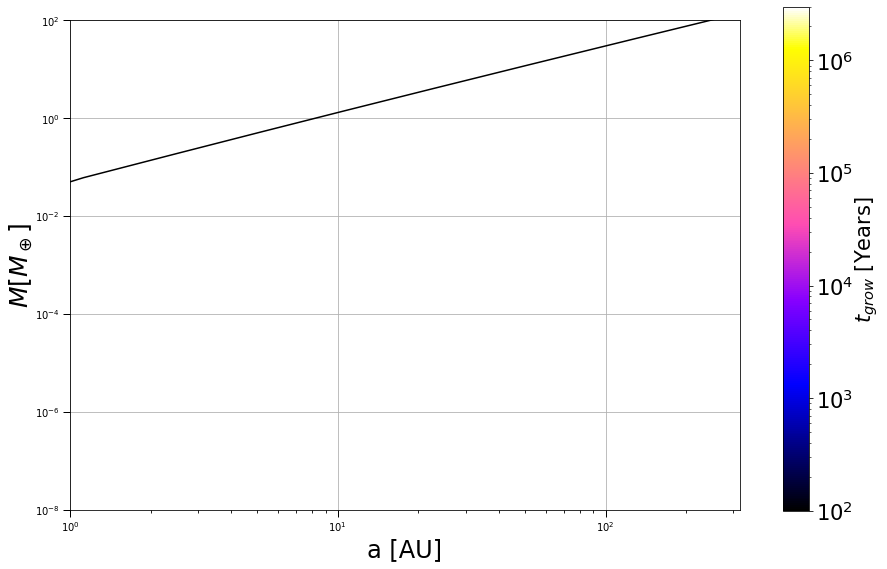

In [50]:
fig = plt.figure(1,figsize=(12,9))
cmap = 'gnuplot2'

X, Y = np.meshgrid(a_au_arr, m_core_arr)
im = plt.pcolormesh(X,Y,t_grow_arr_cb, cmap=cmap,norm=LogNorm(),vmin=1e2,vmax=3e6)
plt.grid()
plt.loglog(a_au_arr, m_flow_arr[:,0], 'k-')
    
im.set_edgecolor('face')
ax = plt.gca()
ax.tick_params(which='major', length=7,width=1.0)
ax.tick_params(which='minor', length=3.0,width=0.85)
#ax.grid()
        
ax.set_xlabel('a [AU]',fontsize=24)
ax.set_ylabel(r'$M \left[ M_\oplus \right]$',fontsize=25,labelpad=0.03)
        
ax.set_ylim(1e-8,1e2)
ax.set_xscale('log')
ax.set_yscale('log')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)
cb.ax.tick_params(labelsize=21)

In [48]:
j = 177 #j = 590 # Choosing a = 30 AU
print(a_au_arr[j])
a_au = a_au_arr[j]
sig_gas = sigma[1,j]
sig_p = sigma[2,j]

j = 120 #j = 400 # Choosing a = 10 AU
print(a_au_arr[j])
a_au2 = a_au_arr[j]
sig_gas2 = sigma[1,j]
sig_p2 = sigma[2,j]

30.194866260649214
10.077306820944612


In [ ]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(4,6.5,num=1e5)/fn.sec_to_years

temp = T_0*a_au**(-3./7.)
c_s = fn.sound_speed(temp)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
v_0 = fn.eta(c_s, v_k) * v_k
v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
st = (a_au*fn.au)/(2 * v_g * times)

temp2 = T_0*a_au2**(-3./7.)
c_s2 = fn.sound_speed(temp2)
v_k2 = fn.vkep(m_star*fn.m_sun, a_au2*fn.au)
v_02 = fn.eta(c_s2, v_k2) * v_k2
v_g2 = np.sqrt(v_02**2 + (np.sqrt(alpha) * c_s2)**2)
st2 = (a_au2*fn.au)/(2 * v_g2 * times)

m_arr = np.zeros((len(m0_arr),len(times)))
m_arr2 = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    p = [alpha,a_au,m_star,temp,sig_gas,sig_p,st,1,0]
    wsol = odeint(rate_odeint,m0,times,args=(p,))
    m_arr[i] = wsol.flatten()
    
    q = [alpha,a_au2,m_star,temp2,sig_gas2,sig_p2,st2,1,0]
    wsol2 = odeint(rate_odeint,m0,times,args=(q,))
    m_arr2[i] = wsol2.flatten()

In [ ]:
m0_arr = np.multiply([1e-1,1e-2,1e-3,1e-4,1e-5,1e-6,1e-7],fn.m_earth)
times = np.logspace(4,6.5,num=1e5)/fn.sec_to_years

temp = T_0*a_au**(-3./7.)
c_s = fn.sound_speed(temp)
v_k = fn.vkep(m_star*fn.m_sun, a_au*fn.au)
v_0 = fn.eta(c_s, v_k) * v_k
v_g = np.sqrt(v_0**2 + (np.sqrt(alpha) * c_s)**2)
st = (a_au*fn.au)/(2 * v_g * times)

temp2 = T_0*a_au2**(-3./7.)
c_s2 = fn.sound_speed(temp2)
v_k2 = fn.vkep(m_star*fn.m_sun, a_au2*fn.au)
v_02 = fn.eta(c_s2, v_k2) * v_k2
v_g2 = np.sqrt(v_02**2 + (np.sqrt(alpha) * c_s2)**2)
st2 = (a_au2*fn.au)/(2 * v_g2 * times)

m_arr = np.zeros((len(m0_arr),len(times)))
m_arr2 = np.zeros((len(m0_arr),len(times)))
#st = st_arr_cb[250,30]

for i,m0 in enumerate(m0_arr):
    for j, t in enumerate(times):
        p = [alpha,a_au,m_star,temp,sig_gas,sig_p,st[j],1,0]
        #print(rate, t)
        if j == 0: m_arr[i,j] = m0 #m_arr[i] = wsol.flatten()
        else:
            rate = rate_odeint(m_arr[i,j-1], t, p)
            m_arr[i,j] = m_arr[i,j-1] + rate * (t - times[j-1])
        
        q = [alpha,a_au2,m_star,temp2,sig_gas2,sig_p2,st2[j],1,0]
        if j == 0: m_arr2[i,j] = m0 #m_arr2[i] = wsol2.flatten()
        else:
            rate = rate_odeint(m_arr2[i,j-1], t, q)
            m_arr[i,j] = m_arr2[i,j-1] + rate * (t - times[j-1])

In [ ]:
from matplotlib import gridspec

fig = plt.figure(figsize=(14,10))
gs = gridspec.GridSpec(2, 2)

ax0 = plt.subplot(gs[:,0])
plt.title(r'$a = 10$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)
ax1 = plt.subplot(gs[:,1])
plt.title(r'$a = 30$ AU, $\alpha = 1 \times 10^{-6}, \, St = \frac{a}{2 v_{g} t_\mathrm{disk}}$',y=1.01)

#fig = plt.figure(figsize=(14,10))

# labels = [r'$M_0 = 10^{-7} M_\oplus$',r'$M_0 = 10^{-6} M_\oplus$',r'$M_0 = 10^{-5} M_\oplus$']

for i in range(len(m0_arr)):
    ax1.loglog(times*fn.sec_to_years,m_arr[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    ax0.loglog(times*fn.sec_to_years,m_arr2[i]/fn.m_earth, label='M_core = {core_mass}'.format(core_mass=m0_arr[i]/fn.m_earth))
    
ax0.set_xlabel('Time [Years]',fontsize=20)
ax0.set_ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)
ax1.set_xlabel('Time [Years]',fontsize=20)

ax0.axhline(y=1e1,linestyle='dashed',color='r')
ax1.axhline(y=1e1,linestyle='dashed',color='r')

lgd = plt.gca().legend(bbox_to_anchor=[1.7,0.70],frameon=False)

ax0.set_ylim(3e-8,1e2)
ax1.set_ylim(3e-8,1e2)
plt.tight_layout()

## Debugging

In [55]:
print((1e-7 * fn.m_sun / 3)**(1/3), 'g')

404742168.5329239 g


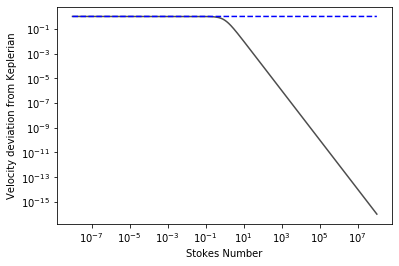

In [16]:
stokes_arr = np.logspace(-8,8,10000)
v_rel_arr = np.zeros(stokes_arr.shape)
om = np.sqrt((fn.G * m_star * fn.m_sun)/(a_au * fn.au)**3)
v_g_arr = eta*om*(a_au*fn.au)*np.ones(stokes_arr.shape)

for i, st in enumerate(stokes_arr):
    v_rel_arr[i] = eta*om*(a_au * fn.au) * 1/(1 + np.power(st,2))
    
plt.loglog(stokes_arr, v_rel_arr/(eta*om*(a_au*fn.au)))
plt.loglog(stokes_arr, v_g_arr/(eta*om*(a_au*fn.au)), 'b--')
plt.xlabel("Stokes Number")
plt.ylabel("Velocity deviation from Keplerian");

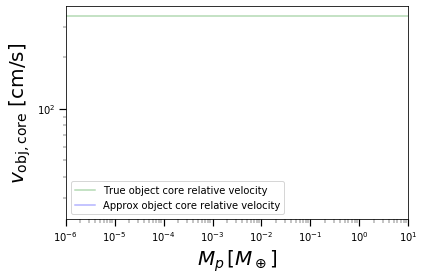

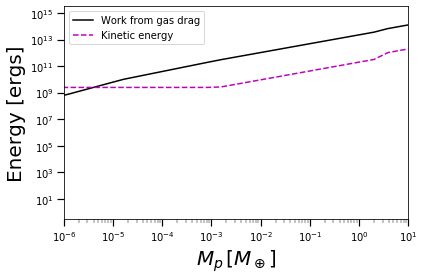

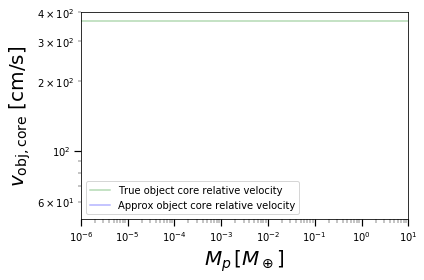

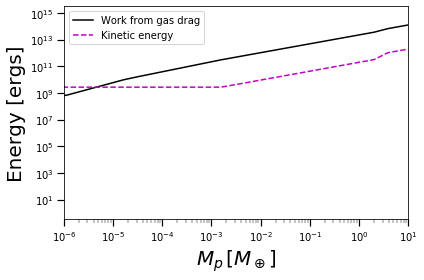

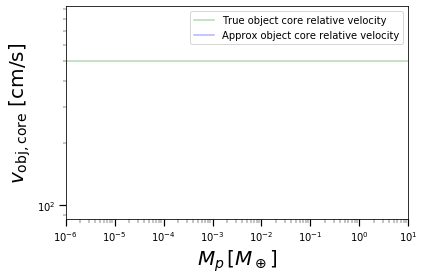

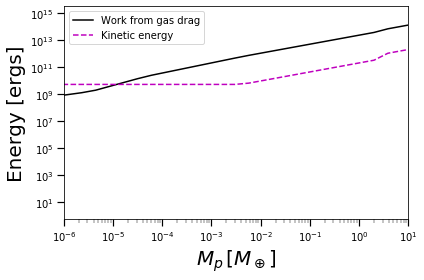

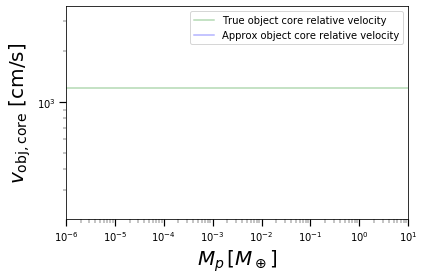

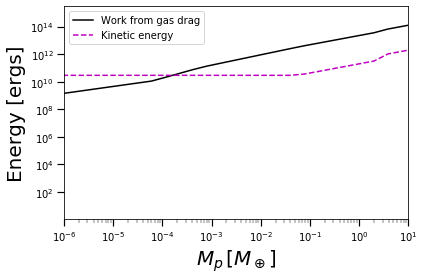

In [17]:
for i in range(len(alpha_arr)):
    # Check stopping time
    om = np.sqrt((fn.G * m_star * fn.m_sun)/(a_au * fn.au)**3)
    #plt.loglog(m_arr, t_stop_arr[i] * om, 'k-')
    st = t_stop_arr[i] * om
    #plt.loglog(m_arr, st)
    #print(eta*om*(a_au *fn.au) * (1/(1 + np.power(st,2))))
    #plt.loglog(m_arr, eta*om*(a_au * fn.au) * 1/(1 + np.power(st,2)), 'b-')
    #plt.loglog(m_arr, -v_core_phi_arr[i], 'r--')
    #plt.loglog(m_arr, v_c_g_arr[i], 'g--', label="Core gas velocity")
    #plt.loglog(m_arr, v_kep_arr[i], 'k-', label="Keplerian velocity")
    #plt.loglog(m_arr, v_phi_lam_arr[i], 'g--', label="Laminar object phi velocity")
    #plt.loglog(m_arr, v_phi_lam_core_arr[i], 'k--', label="Laminar core phi velocity")
    #plt.xlim(1e-6, 1e1)
    #plt.xlabel(r"$M_p \, [M_\oplus]$",fontsize=20)
    #plt.ylabel("Stokes number",fontsize=20) #r"$v_{\rm{core}}$ [s]",fontsize=20)
    #plt.tick_params(which='major', length=7,width=1.2)
    #plt.tick_params(which='minor', length=3.5,width=0.45)
    #plt.tight_layout()
    #plt.legend()
    #plt.show()
    
    # Compare approach velocities
    #plt.loglog(m_arr, -v_obj_phi_arr[i], 'k--', label="Particle phi velocity")
    #plt.loglog(m_arr, -v_core_phi_arr[i], 'b--', alpha=0.3, label="Core phi velocity")
    plt.loglog(m_arr, v_obj_core_arr[i], 'g', alpha=0.3, label='True object core relative velocity')
    plt.loglog(m_arr, v_obj_arr[i], 'b', alpha=0.3, label='Approx object core relative velocity')
    #plt.loglog(m_arr, v_inf_arr[i], 'r--', label='V_infinity')
    #plt.loglog(m_arr, v_cross_arr[i], 'm--', label='V_cross')
    
    plt.xlim(1e-6, 1e1)
    plt.xlabel(r"$M_p \, [M_\oplus]$",fontsize=20)
    plt.ylabel(r"$v_{\rm{obj, core}}$ [cm/s]",fontsize=20)
    plt.tick_params(which='major', length=7,width=1.2)
    plt.tick_params(which='minor', length=3.5,width=0.45)
    plt.tight_layout()
    plt.legend()
    plt.show()
    
    plt.loglog(m_arr, w_enc_arr[i], 'k-', label='Work from gas drag')
    plt.loglog(m_arr, 0.5*m_obj_arr[i,j]*np.power(v_inf_arr[i],2), 'm--', label='Kinetic energy')
    plt.xlim(1e-6, 1e1)
    plt.xlabel(r"$M_p \, [M_\oplus]$",fontsize=20)
    plt.ylabel("Energy [ergs]",fontsize=20)
    plt.tick_params(which='major', length=7,width=1.2)
    plt.tick_params(which='minor', length=3.5,width=0.45)
    plt.tight_layout()
    plt.legend()
    plt.show()

In [18]:
print((1e-10*fn.m_earth/(4 * np.pi))**(1/3))
print(10**-10, fn.m_earth)

362298.8105843964
1e-10 5.976e+27


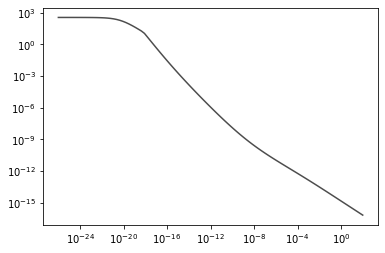

In [19]:
plt.loglog(m_arr, -v_core_phi_arr[-1])

## Mickey's old plots

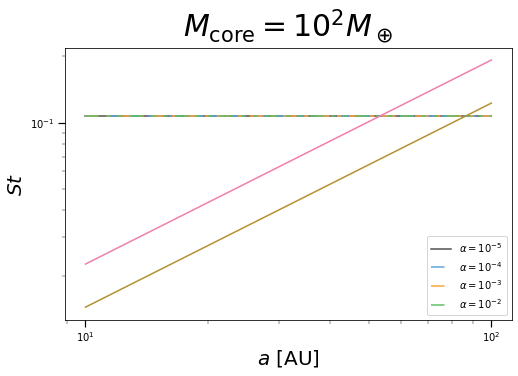

In [20]:
fig = plt.figure(1,figsize=(8,5))

style_arr = [None] * len(alpha_arr)
style_arr[0] = []

for i in range(len(alpha_arr)-1):
    style_add = [3,5] if i else [9,5]
    style_arr[i+1] = style_arr[i] + style_add

line_list = []

for i in range(len(alpha_arr)):
    line_list.append(plt.loglog(a_au_arr,st_arr[i],label=r'$\alpha = 10^{%.3g}$' %np.log10(alpha_arr[i])))
#     plt.loglog(r_arr,ke_arr[i],linestyle="dashed",color=line.get_color())

for i in range(len(alpha_arr)):
    line_list[i][0].set_dashes(style_arr[i])

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$a$ [AU]",fontsize=20)
plt.ylabel(r"$St$",fontsize=20)

plt.title(r"$M_{\rm{core}} = 10^{%.3g} M_\oplus$" %np.log10(m_earths),y=1.02,fontsize=30)


# plt.axis([3e-2,1e3,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)

T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
t_disk = 1e6/fn.sec_to_years

plt.loglog(a_au_arr,(np.pi/2.)*a_au_arr*fn.au/t_disk/v_0)
# plt.loglog(a_au_arr,(np.pi/2.)*a_au_arr*fn.au/t_disk/v_0)
plt.loglog(a_au_arr,a_au_arr*fn.au/t_disk/v_0)
# (np.pi/2.)*a_au_arr*fn.au/t_disk/v_0/st_arr[0]

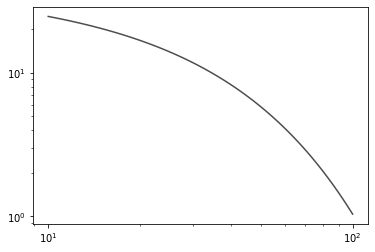

In [21]:
plt.loglog(s_arr[0],s_arr[1]*1e-1)

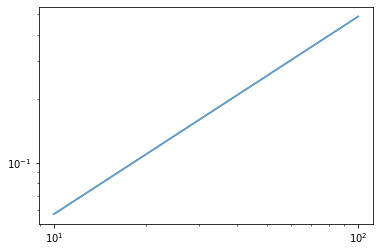

In [22]:
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
H = cs/om
sig_gas = disk_sigma(r=a_au_arr,sigma0=sig_0,rcrit=r_crit)
rho_g = sig_gas/2./H
rho_s = 2.
vth = np.sqrt(8./np.pi)*cs
plt.loglog(a_au_arr,s_arr[1,:]*1e-1/vth*rho_s/rho_g*om)
plt.loglog(a_au_arr,np.sqrt(np.pi/2)*s_arr[1,:]*1e-1/sig_gas*rho_s)
# plt.loglog(a_au_arr,s_arr[1,:])

In [23]:
H

array([7.02274640e+12, 7.23592404e+12, 7.45557275e+12, 7.68188896e+12,
       7.91507507e+12, 8.15533961e+12, 8.40289746e+12, 8.65797001e+12,
       8.92078536e+12, 9.19157855e+12, 9.47059175e+12, 9.75807449e+12,
       1.00542838e+13, 1.03594847e+13, 1.06739501e+13, 1.09979611e+13,
       1.13318076e+13, 1.16757882e+13, 1.20302103e+13, 1.23953911e+13,
       1.27716570e+13, 1.31593446e+13, 1.35588005e+13, 1.39703821e+13,
       1.43944574e+13, 1.48314056e+13, 1.52816175e+13, 1.57454957e+13,
       1.62234550e+13, 1.67159230e+13, 1.72233400e+13, 1.77461598e+13,
       1.82848500e+13, 1.88398923e+13, 1.94117830e+13, 2.00010337e+13,
       2.06081712e+13, 2.12337386e+13, 2.18782953e+13, 2.25424177e+13,
       2.32266997e+13, 2.39317534e+13, 2.46582091e+13, 2.54067167e+13,
       2.61779454e+13, 2.69725850e+13, 2.77913461e+13, 2.86349610e+13,
       2.95041841e+13, 3.03997927e+13, 3.13225878e+13, 3.22733946e+13,
       3.32530635e+13, 3.42624705e+13, 3.53025183e+13, 3.63741372e+13,
      

No handles with labels found to put in legend.


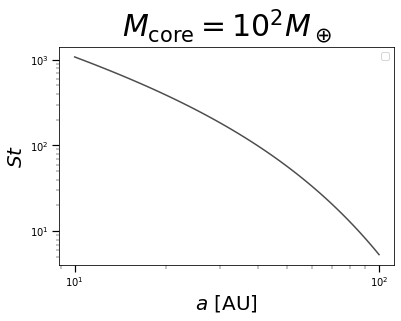

In [24]:
plt.loglog(a_au_arr,disk_sigma(a_au_arr,sigma0=sig_0,rcrit=r_crit))

# plt.loglog(r_arr,np.full(len(r_arr),1),linestyle='dashed')

plt.gca().legend(loc='best',fancybox=True)

# plt.title("$a = 1$ AU, $M_{core} = 10^{-1} M_\oplus$", y=1.02)
plt.xlabel(r"$a$ [AU]",fontsize=20)
plt.ylabel(r"$St$",fontsize=20)

plt.title(r"$M_{\rm{core}} = 10^{%.3g} M_\oplus$" %np.log10(m_earths),y=1.02,fontsize=30)


# plt.axis([3e-2,1e3,5e1,5e6])

plt.tick_params(which='major', length=7,width=1.2)
plt.tick_params(which='minor', length=3.5,width=0.45)


In [25]:
sig_gas

array([1074.79696586, 1041.88301309, 1009.79060403,  978.5018465 ,
        947.99926234,  918.26577719,  889.28471056,  861.03976609,
        833.51502193,  806.6949214 ,  780.56426377,  755.10819527,
        730.31220019,  706.16209224,  682.64400604,  659.74438873,
        637.44999181,  615.74786306,  594.6253387 ,  574.07003558,
        554.06984362,  534.61291836,  515.68767358,  497.28277418,
        479.38712907,  461.98988428,  445.08041616,  428.64832472,
        412.68342707,  397.17575103,  382.11552885,  367.49319098,
        353.29936012,  339.52484521,  326.16063569,  313.19789578,
        300.62795897,  288.44232254,  276.63264225,  265.1907272 ,
        254.10853472,  243.37816544,  232.9918585 ,  222.94198686,
        213.22105275,  203.82168325,  194.73662601,  185.95874512,
        177.48101709,  169.29652699,  161.39846475,  153.78012155,
        146.43488648,  139.35624317,  132.53776678,  125.97312098,
        119.6560552 ,  113.58040199,  107.74007458,  102.12906

## Make some heaptmaps

In [27]:
alpha = 1e-5
m_arr = np.logspace(-7,2,num=1000)
m_star = 0.1
T_0 = 14.9265380168

t_grow_arr = np.zeros((len(m_arr),len(a_au_arr)))

for i,M in enumerate(m_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[1,j]*1e-1
        t_grow_arr[i,j],tmp = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')
     

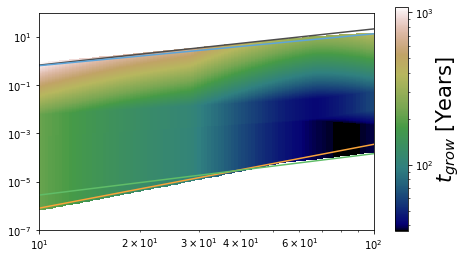

In [28]:
fig = plt.figure()
X, Y = np.meshgrid(a_au_arr,m_arr)
cmap = 'gist_earth'
im = plt.pcolormesh(X,Y,t_grow_arr, cmap=cmap,norm=LogNorm(),vmin=np.amin(t_grow_arr[np.where(t_grow_arr!=0)]),\
                                                                          vmax=np.amax(t_grow_arr))
plt.yscale('log')
plt.xscale('log')

msun_to_mearth = 3.003467e-6
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
v_gas = v_0
t_disk = 1e6/fn.sec_to_years
m_upper = np.sqrt(np.pi/2.)*(t_disk*om)**(-1.)*m_star/msun_to_mearth
m_upper_2 = 2*(2.*np.pi)**(1./4.)*(v_0/vk)*(t_disk*om)**(-1./2.)*m_star/msun_to_mearth*(0.39570262)**(-1./3.)
m_lower = (0.39570262)*0.25*np.sqrt(np.pi/2.)*(v_0**2./(t_disk*(a_au_arr*fn.au)**2.*om**3.))/msun_to_mearth #Assumes v_0 = v_gas
m_lower_2 = 1./16.*v_gas**3./vk**3.*m_star/msun_to_mearth

plt.semilogy(a_au_arr,m_upper)
plt.semilogy(a_au_arr,m_upper_2)
plt.semilogy(a_au_arr,m_lower)
plt.semilogy(a_au_arr,m_lower_2)
# plt.loglog(a_au_arr,np.full(len(a_au_arr),1e1))
# plt.semilogy(a_au_arr,m_lower,linestyle=' ',marker='o')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)

# Try Generating My Own $St$ Values

In [29]:
alpha = 1e-2
m_arr = np.logspace(-7,2,num=1000)
m_star = 0.1
T_0 = 14.9265380168
t_disk = 1e6/fn.sec_to_years
t_grow_arr = np.zeros((len(m_arr),len(a_au_arr)))
s_arr = np.zeros(len(a_au_arr))

for i,M in enumerate(m_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
#         s = s_arr[1,j]*1e-1
        cs = np.sqrt(fn.k*temp/fn.mu)
        vth = np.sqrt(8./np.pi)*cs
        om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au*fn.au)**3.)
        H_g = cs/om
        rho_g = sig_gas/2./H_g
        rho_s = 2.
        vk = a_au*fn.au*om
        v0 = cs**2./2./vk
        st = np.sqrt(np.pi/2.)*a_au*fn.au/t_disk/v0
        s = st*rho_g*vth/rho_s/om
        s_arr[j] = s
        t_grow_arr[i,j],tmp = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')
     

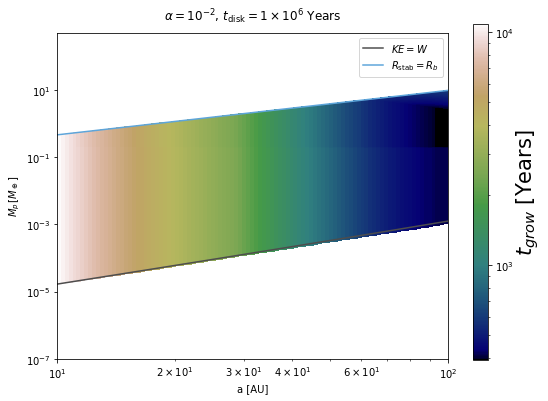

In [30]:
fig = plt.figure(figsize=(7,6))
X, Y = np.meshgrid(a_au_arr,m_arr)
cmap = 'gist_earth'
im = plt.pcolormesh(X,Y,t_grow_arr, cmap=cmap,norm=LogNorm(),vmin=np.amin(t_grow_arr[np.where(t_grow_arr!=0)]),\
                                                                          vmax=np.amax(t_grow_arr))
plt.yscale('log')
plt.xscale('log')

msun_to_mearth = 3.003467e-6
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
v_gas = np.sqrt(v_0**2.+alpha*cs**2.)
t_disk = 1e6/fn.sec_to_years
m_upper = np.sqrt(np.pi/2.)*(t_disk*om)**(-1.)*m_star/msun_to_mearth
m_upper_2 = 2*(2.*np.pi)**(1./4.)*(v_0/vk)*(t_disk*om)**(-1./2.)*m_star/msun_to_mearth
m_lower = 0.25*np.sqrt(np.pi/2.)*(v_gas**3./(v_0*t_disk*(a_au_arr*fn.au)**2.*om**3.))*m_star/msun_to_mearth
m_lower_2 = 1./16.*v_gas**3./vk**3.*m_star/msun_to_mearth

m_low = np.minimum(m_lower,m_lower_2)
m_up = np.minimum(m_upper,m_upper_2,cs**3./3**(0.5)/fn.G/om/fn.m_earth)


# plt.semilogy(a_au_arr,m_upper)
# plt.semilogy(a_au_arr,m_upper_2)
# plt.semilogy(a_au_arr,cs**3./3**(0.5)/fn.G/om/fn.m_earth)
plt.semilogy(a_au_arr,m_low,label=r'$KE = W$') 
plt.semilogy(a_au_arr,m_up,label=r'$R_{\rm{stab}}=R_b$')

# plt.semilogy(a_au_arr,m_lower) 
# plt.semilogy(a_au_arr,m_lower_2)
# plt.loglog(a_au_arr,np.full(len(a_au_arr),1e1))
# plt.semilogy(a_au_arr,m_lower,linestyle=' ',marker='o')

plt.ylabel(r'$M_p \, [M_\oplus]$')
plt.xlabel('a [AU]')

plt.title(r'$\alpha = 10^{-2}, \, t_{\rm{disk}} = 1 \times 10^{6}$ Years',y=1.02)

plt.ylim([1e-7,5e2])

plt.gca().legend(loc='best')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)

# plt.tight_layout()

# Try Higher $\alpha$ Values

In [31]:
alpha = 1e-2
m_arr = np.logspace(-7,2,num=500)
m_star = 0.1
T_0 = 14.9265380168
t_disk = 1e6/fn.sec_to_years
t_grow_arr = np.zeros((len(m_arr),len(a_au_arr)))
s_arr = np.zeros(len(a_au_arr))

for i,M in enumerate(m_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[-1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
#         s = s_arr[1,j]*1e-1
        cs = np.sqrt(fn.k*temp/fn.mu)
        vth = np.sqrt(8./np.pi)*cs
        om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au*fn.au)**3.)
        H_g = cs/om
        rho_g = sig_gas/2./H_g
        rho_s = 2.
        vk = a_au*fn.au*om
        v0 = cs**2./2./vk
        st = np.sqrt(np.pi/2.)*a_au*fn.au/t_disk/v0
        s = st*rho_g*vth/rho_s/om
        s_arr[j] = s
        t_grow_arr[i,j],tmp = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')
     

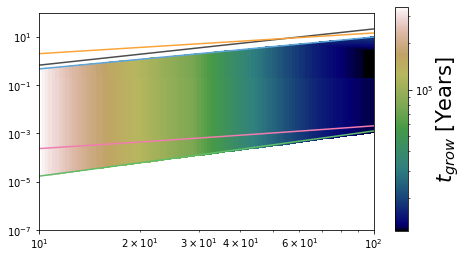

In [32]:
fig = plt.figure()
X, Y = np.meshgrid(a_au_arr,m_arr)
cmap = 'gist_earth'
im = plt.pcolormesh(X,Y,t_grow_arr, cmap=cmap,norm=LogNorm(),vmin=np.amin(t_grow_arr[np.where(t_grow_arr!=0)]),\
                                                                          vmax=np.amax(t_grow_arr))
plt.yscale('log')
plt.xscale('log')

msun_to_mearth = 3.003467e-6
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
v_gas = np.sqrt(v_0**2. + alpha*cs**2.)
t_disk = 1e6/fn.sec_to_years
m_upper = np.sqrt(np.pi/2.)*(t_disk*om)**(-1.)*m_star/msun_to_mearth
m_upper_2 = 2*(2.*np.pi)**(1./4.)*(v_0/vk)*(t_disk*om)**(-1./2.)*m_star/msun_to_mearth
m_lower = 0.25*np.sqrt(np.pi/2.)*(v_gas**3./(v_0*t_disk*(a_au_arr*fn.au)**2.*om**3.))*m_star/msun_to_mearth
m_lower_2 = 1./16.*v_gas**3./vk**3.*m_star/msun_to_mearth

plt.semilogy(a_au_arr,m_upper)
plt.semilogy(a_au_arr,m_upper_2)
plt.semilogy(a_au_arr,cs**3./3**(0.5)/fn.G/om/fn.m_earth)
plt.semilogy(a_au_arr,m_lower) 
plt.semilogy(a_au_arr,m_lower_2)
# plt.loglog(a_au_arr,np.full(len(a_au_arr),1e1))
# plt.semilogy(a_au_arr,m_lower,linestyle=' ',marker='o')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)

In [33]:
s_arr

array([7.76213487, 7.68870538, 7.61456498, 7.53971501, 7.46415741,
       7.38789473, 7.31093015, 7.23326752, 7.15491138, 7.07586698,
       6.99614031, 6.91573813, 6.83466797, 6.7529382 , 6.67055801,
       6.58753747, 6.50388753, 6.41962006, 6.33474786, 6.24928469,
       6.16324531, 6.07664546, 5.98950194, 5.90183256, 5.81365623,
       5.72499292, 5.63586371, 5.5462908 , 5.45629753, 5.36590835,
       5.27514889, 5.18404593, 5.09262742, 5.00092248, 4.90896139,
       4.81677563, 4.7243978 , 4.6318617 , 4.53920225, 4.44645553,
       4.3536587 , 4.26085005, 4.16806893, 4.07535573, 3.98275186,
       3.89029969, 3.79804255, 3.70602462, 3.61429096, 3.52288739,
       3.43186046, 3.34125738, 3.25112596, 3.16151451, 3.07247182,
       2.98404699, 2.89628943, 2.8092487 , 2.72297446, 2.63751635,
       2.55292386, 2.46924627, 2.3865325 , 2.304831  , 2.22418965,
       2.1446556 , 2.06627518, 1.98909374, 1.91315556, 1.83850369,
       1.76517981, 1.69322414, 1.62267527, 1.55357005, 1.48594

In [34]:
a = 12.
ind_a = np.where(a_au_arr<a)[0][-1]
print(ind_a)
ind_b = np.where(t_grow_arr[:,ind_a]>0)[0][0]
print(ind_b)
print(m_arr[ind_b])

7
130
2.2115123997254888e-05


In [35]:
i = 300
j = 10
a_au = a_au_arr[j]
M = m_arr[i]
print(a_au)
print(M)
print(t_grow_arr[i,j])
print(TvsR_sng)
sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
sig_p = gas_to_dust[1,j]*sig_gas
temp = T_0*a_au**(-3./7.)
s = s_arr[j]*1e-1 #s_arr[1,j]*1e-1
TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')

12.618568830660204
0.02575263326771204
234965.09220988798
<function TvsR_sng at 0xb231581e0>


(110333.8476154546, 0.002246672558773844)

In [36]:
alpha = 1e-5
m_star = 0.1
M = 1e-4
ind = np.where(a_au_arr<80)[0][-1]
a_tst = a_au_arr[ind]
s_tst = s_arr[ind]*1e-1
print(a_tst)
print(s_tst)
sig_gas_tst = disk_sigma(r=a_tst,sigma0=sig_0,rcrit=r_crit)
sig_p_tst = gas_to_dust[1,ind]*sig_gas_tst
temp = T_0*a_tst**(-3./7.)
print('sig_gas = %.5f' %sig_gas_tst)
print('T = %.5f' %temp)
print('sig_p = %.5f' %sig_p_tst)
print(TvsR_sng(alph=alpha,a_au=a_tst,m_suns=m_star,r=s_tst,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas_tst,sig_p_in=sig_p_tst,out='st'))

79.24828983539177
0.06657266587904163
sig_gas = 13.48543
T = 2.29143
sig_p = 11.34035
(1287.5544198132536, 0.012374310856295478)


In [37]:
alpha = 1e-5
m_arr = np.logspace(-5,1,num=100)
m_star = 0.1
T_0 = 14.9265380168

en_arr = np.zeros((len(m_arr),len(a_au_arr)))

for i,M in enumerate(m_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[1,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
        s = s_arr[j]*1e-1
        work_enc,ke = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='en')
        en_arr[i,j] = ke/work_enc

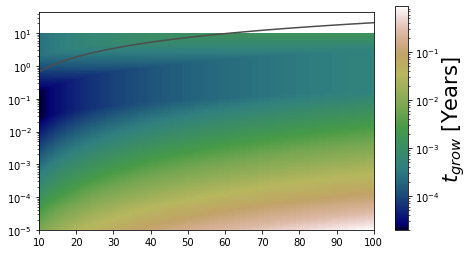

In [38]:
fig = plt.figure()
X, Y = np.meshgrid(a_au_arr,m_arr)
cmap = 'gist_earth'
im = plt.pcolormesh(X,Y,en_arr, cmap=cmap,norm=LogNorm(),vmin=np.amin(en_arr[np.where(en_arr!=0)]),\
                                                                          vmax=np.amax(en_arr))
plt.yscale('log')

msun_to_mearth = 3.003467e-6
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
t_disk = 1e6/fn.sec_to_years
m_lim = np.sqrt(np.pi/2.)*(t_disk*om)**(-1.)*m_star/msun_to_mearth

plt.semilogy(a_au_arr,m_lim)

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)



# Plot Dust to Gas Ratio over time

In [39]:
#Disk surface density parameters
m_star = 0.1
sig_0 = 500.
r_crit = 30.

def disk_sigma(r=1., sigma0=500., rcrit=100.):
    r_c = rcrit
    gamma = 1.
    sigma = sigma0*((r/r_c)**(-gamma))*np.exp(-(r/r_c)**(2-gamma))
    return sigma

In [40]:
#Read in parameters from Diana

gas_to_dust = np.loadtxt("star1_age1_sigma1_rcrit1_fd_parsed.txt").T
s_arr = np.loadtxt("star1_age1_sigma1_rcrit1_sizes.txt").T
a_au_arr = gas_to_dust[0]
alpha_arr = [1e-5,1e-4,1e-3,1e-2]
t_grow_arr = np.zeros((len(alpha_arr),len(a_au_arr)))
st_arr = np.zeros((len(alpha_arr),len(a_au_arr)))

(10.0, 100.0)

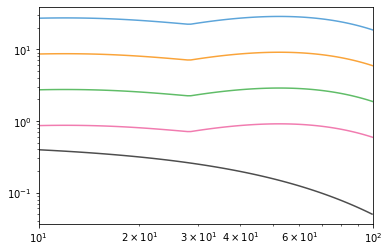

In [41]:
m_earths = 1e-2
T_0 = 14.9265380168

plt.loglog(500*a_au_arr**(-1.)*1e-2)

for i,alpha in enumerate(alpha_arr):
    sig_gas = disk_sigma(r=a_au_arr,sigma0=sig_0,rcrit=r_crit)
    sig_p = gas_to_dust[i+1]*sig_gas*(10.)**(1./3.)
    plt.loglog(a_au_arr,sig_p)
    
plt.xlim(1e1,1e2)

## Earlier Times

In [42]:
alpha = 1e-4
m_arr = np.logspace(-7,2,num=1000)
m_star = 0.1
T_0 = 14.9265380168
t_disk = 1e5/fn.sec_to_years
t_grow_arr = np.zeros((len(m_arr),len(a_au_arr)))
s_arr = np.zeros(len(a_au_arr))

for i,M in enumerate(m_arr):
    for j,a_au in enumerate(a_au_arr):
        sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
        sig_p = gas_to_dust[-2,j]*sig_gas
        temp = T_0*a_au**(-3./7.)
#         s = s_arr[1,j]*1e-1
        cs = np.sqrt(fn.k*temp/fn.mu)
        vth = np.sqrt(8./np.pi)*cs
        om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au*fn.au)**3.)
        H_g = cs/om
        rho_g = sig_gas/2./H_g
        rho_s = 2.
        vk = a_au*fn.au*om
        v0 = cs**2./2./vk
        st = 0.5*a_au*fn.au/t_disk/v0
        s = st*rho_g*vth/rho_s/om
        s_arr[j] = s
        t_grow_arr[i,j],tmp = TvsR_sng(alph=alpha,a_au=a_au,m_suns=m_star,r=s,m_earths=M,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='st')
     

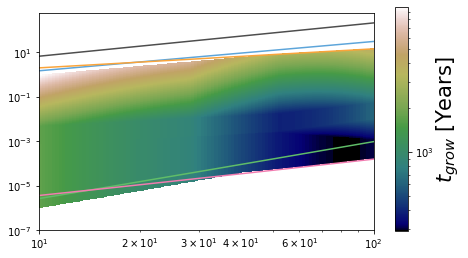

In [43]:
fig = plt.figure()
X, Y = np.meshgrid(a_au_arr,m_arr)
cmap = 'gist_earth'
im = plt.pcolormesh(X,Y,t_grow_arr, cmap=cmap,norm=LogNorm(),vmin=np.amin(t_grow_arr[np.where(t_grow_arr!=0)]),\
                                                                          vmax=np.amax(t_grow_arr))
plt.yscale('log')
plt.xscale('log')

msun_to_mearth = 3.003467e-6
T_arr = T_0*a_au_arr**(-3./7.)
cs = np.sqrt(fn.k*T_arr/fn.mu)
om = np.sqrt(fn.G*m_star*fn.m_sun/(a_au_arr*fn.au)**3.)
vk = a_au_arr*fn.au*om
v_0 = cs**2./2./vk
v_gas = np.sqrt(v_0**2. + alpha*cs**2.)
t_disk = 1e5/fn.sec_to_years
m_upper = np.sqrt(np.pi/2.)*(t_disk*om)**(-1.)*m_star/msun_to_mearth
m_upper_2 = 2*(2.*np.pi)**(1./4.)*(v_0/vk)*(t_disk*om)**(-1./2.)*m_star/msun_to_mearth
m_lower = 0.25*np.sqrt(np.pi/2.)*(v_gas**3./(v_0*t_disk*(a_au_arr*fn.au)**2.*om**3.))*m_star/msun_to_mearth
m_lower_2 = 1./16.*v_gas**3./vk**3.*m_star/msun_to_mearth

plt.semilogy(a_au_arr,m_upper)
plt.semilogy(a_au_arr,m_upper_2)
plt.semilogy(a_au_arr,cs**3./3**(0.5)/fn.G/om/fn.m_earth)
plt.semilogy(a_au_arr,m_lower) 
plt.semilogy(a_au_arr,m_lower_2)
# plt.loglog(a_au_arr,np.full(len(a_au_arr),1e1))
# plt.semilogy(a_au_arr,m_lower,linestyle=' ',marker='o')

cax = fig.add_axes([0.95, 0.123, 0.03, 0.778])
cb = fig.colorbar(im, cax=cax,cmap=cmap,norm=LogNorm())
cb.set_label(label=r'$t_{grow}$ [Years]',fontsize=21,labelpad=0.1)

In [44]:
def rate_odeint(m,t,p):

    alph,a_au,m_suns,temp,sig_gas,sig_p,verbose = p
    
    cs = np.sqrt(fn.k*temp/fn.mu)
    vth = np.sqrt(8./np.pi)*cs
    om = np.sqrt(fn.G*m_suns*fn.m_sun/(a_au*fn.au)**3.)
    H_g = cs/om
    rho_g = sig_gas/2./H_g
    rho_s = 2.
    vk = a_au*fn.au*om
    v0 = cs**2./2./vk
    st = 0.5*a_au*fn.au/t/v0
    s = st*rho_g*vth/rho_s/om
    
    rp = (3*m/4./np.pi/rho_s)**(1./3.)
    v_esc = np.sqrt(2*fn.G*m/rp)

    H_p = np.sqrt(alph/st)*H_g # Changed st_tst to st (Ask Mickey about this)
    rho_solid = sig_p/2./H_p
    v_inf = np.sqrt(alph)*cs
    bGF = rp*(v_esc/v_inf)
    sig_acc = 4*bGF**2.
    rate_GF = rho_solid*sig_acc*v_inf
    
    m_earths = m/fn.m_earth
    rate_peb = TvsR_sng(alph=alph,a_au=a_au,m_suns=m_suns,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='rate')*fn.sec_to_years
    
    tmp,r_ws,h_r,b_r,b_shear = TvsR_sng(alph=alph,a_au=a_au,m_suns=m_suns,r=s,m_earths=m_earths,temp_in=temp,\
                                   sig_g_in=sig_gas,sig_p_in=sig_p,out='len')
    
    r_tmp = min(r_ws,b_shear)
    r_stab = min(r_tmp,h_r)
    
    if r_stab < b_r:
        return 0
    
    rate = rate_peb + rate_GF
    if verbose:
#         print alph,a_au,m_suns,s,m_earths,temp,sig_gas,sig_p
        print(rate_peb, rate_GF)
    if m > 100*5.976e27: #100 earth masses
        return 0
    else:
        return rate

In [45]:
a_guess = 20.
index = np.where(a_au_arr<a_guess)[0][-1]

a_au = a_au_arr[index]
alpha = 1e-5
m_suns = 0.1
verbose = 0

sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
sig_p = gas_to_dust[1,index]*sig_gas
T_0 = 14.9265380168
temp = T_0*a_au**(-3./7.)

p = [alpha,a_au,m_suns,temp,sig_gas,sig_p,verbose]
# time = 1e5/fn.sec_to_years
times = np.linspace(1e5,5e6,num=1e4)/fn.sec_to_years

m0_arr = np.array([1.01e-7,1.01e-6,1.00e-5])*fn.m_earth
m_arr = np.zeros((len(m0_arr),len(times)))

for i,m0 in enumerate(m0_arr):
    wsol = odeint(rate_odeint,m0,times,args=(p,))
    m_arr[i] = wsol.flatten()

/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  app.launch_new_instance()
/miniconda3/lib/python3.7/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  
/miniconda3/lib/python3.7/site-packages/numpy/ma/core.py:6666: RuntimeWarning: overflow encountered in power
  result = np.where(m, fa, umath.power(fa, fb)).view(basetype)


Text(0.5, 1.0, '$a = 20 \\, \\rm{AU}, \\, \\alpha = 10^{-5}$')

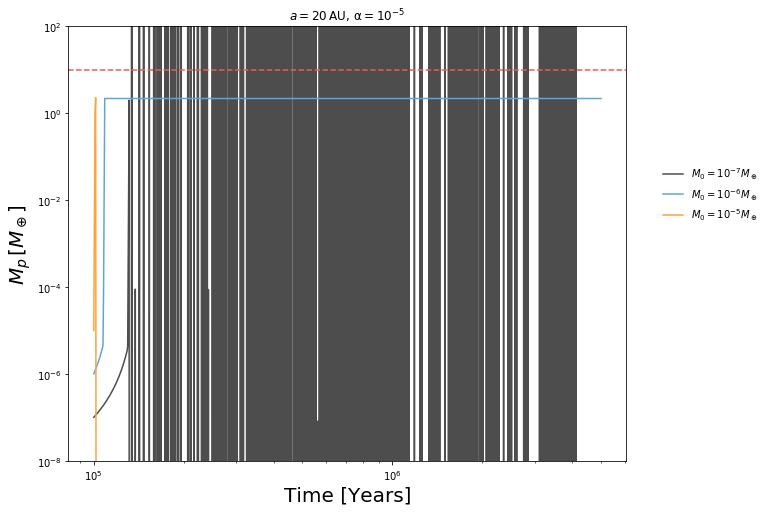

In [46]:
fig = plt.figure(figsize=(10,8))

labels = [r'$M_0 = 10^{-7} M_\oplus$',r'$M_0 = 10^{-6} M_\oplus$',r'$M_0 = 10^{-5} M_\oplus$']

for i in range(len(m0_arr)):
    plt.loglog(times*fn.sec_to_years,m_arr[i]/fn.m_earth,label=labels[i])
    
plt.ylim([1e-8,1e2])
plt.xlabel('Time [Years]',fontsize=20)
plt.ylabel(r'$M_p \, [M_\oplus]$',fontsize=20)

plt.axhline(y=1e1,linestyle='dashed',color= colors[-1])

lgd = plt.gca().legend(bbox_to_anchor=[1.25,0.70],frameon=False)

plt.title(r'$a = 20 \, \rm{AU}, \, \alpha = 10^{-5}$')
# plt.tight_layout()

In [349]:
fig.savefig('final_talk/MvsT_a20_alph5.pdf', bbox_extra_artists=(lgd,), bbox_inches='tight')

## GF of Pebbles

In [190]:
a_au = 50.
alph = 1e-2
st_tst = 1e-2
m = 1e-2*fn.m_earth
T_0 = 14.9265380168
m_suns = 0.1

sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
sig_p = gas_to_dust[-2,index]*sig_gas
temp = T_0*a_au**(-3./7.)

cs = np.sqrt(fn.k*temp/fn.mu)
vth = np.sqrt(8./np.pi)*cs
om = np.sqrt(fn.G*m_suns*fn.m_sun/(a_au*fn.au)**3.)
H_g = cs/om
rho_g = sig_gas/2./H_g
rho_s = 2.
vk = a_au*fn.au*om
v0 = cs**2./2./vk

rp = (3*m/4./np.pi/rho_s)**(1./3.)
v_esc = np.sqrt(2*fn.G*m/rp)

H_p = np.sqrt(alph/st_tst)*H_g
rho_solid = sig_p/2./H_p
v_inf = np.sqrt(alph)*cs
bGF = rp*(v_esc/v_inf)
sig_acc = 4*bGF**2.
MdotGF = rho_solid*sig_acc*v_inf

t_GF = m/MdotGF*fn.sec_to_years

In [191]:
print '%.5g' %t_GF

2.5749e+07


In [187]:
a_guess = 50.
index = np.where(a_au_arr<a_guess)[0][-1]

a_au = a_au_arr[index]
alpha = 1e-2
m_suns = 0.1
verbose = 1

sig_gas = disk_sigma(r=a_au,sigma0=sig_0,rcrit=r_crit)
sig_p = gas_to_dust[-2,index]*sig_gas
T_0 = 14.9265380168
temp = T_0*a_au**(-3./7.)

p = [alpha,a_au,m_suns,temp,sig_gas,sig_p,verbose]
time = 1e5/fn.sec_to_years
# times = np.linspace(1e5,5e6,num=1e4)/fn.sec_to_years
m0 = 2e-5*fn.m_earth
rate_odeint(m0,time,p)

# wsol = odeint(rate_odeint,m0,times,args=(p,))

0.0 18853566.558993317


18853566.558993317

# Working with the disk gap v. mass relation from Lodato et al. 2019

In [85]:
# Extracted using automeris, from Fig 1
gap_mass_blue = np.loadtxt('gap_mass_blue.csv', delimiter=', ')
gap_mass_green = np.loadtxt('gap_mass_green.csv', delimiter=', ')

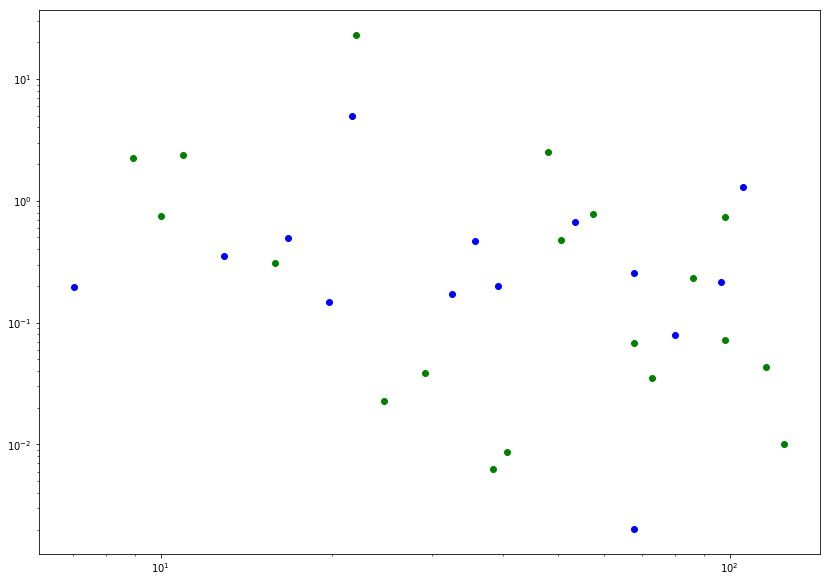

In [87]:
plt.loglog(gap_mass_blue[:,0], gap_mass_blue[:,1], 'bo')
plt.loglog(gap_mass_green[:,0], gap_mass_green[:,1], 'go')

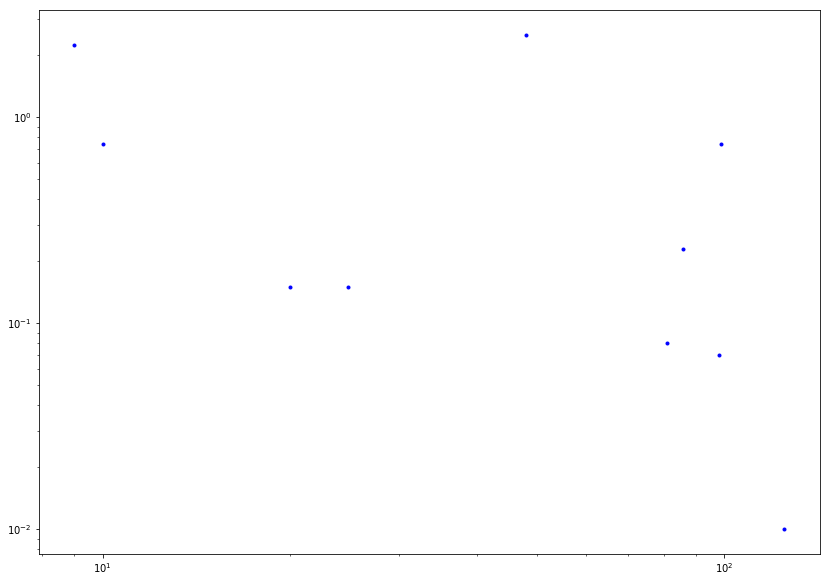

In [94]:
gap_data = np.zeros([10,2])
# TW Hydra
gap_data[0] = np.array([20, 0.15])
gap_data[1] = np.array([81, 0.08])
# AS 209
gap_data[2] = np.array([9, 2.25])
gap_data[3] = np.array([99, 0.74])
# HD 163296
gap_data[4] = np.array([10, 0.74])
gap_data[5] = np.array([48, 2.5])
gap_data[6] = np.array([86, 0.23])
# DoAr 25
gap_data[7] = np.array([98, 0.07])
gap_data[8] = np.array([125, 0.01])
# FT Tau
gap_data[9] = np.array([24.78, 0.15])

plt.loglog(gap_data[:,0], gap_data[:,1], 'b.')

In [388]:
# Also have lambda_obs, r_outer, T_0 = 82 K, R_crit = 30 AU, t_disk = 5 Myr (3 - 10 Myr)
#print(gap_mass_blue[7], gap_mass_blue[12]) # These two for TW Hydra: r(AU), M_p(M_J); 
#print(gap_mass_green[3], gap_mass_green[8], gap_mass_green[9]) # These three for HD 163296
#print(gap_mass_green[1], gap_mass_green[5]) # AS 209


tw_hydra = np.zeros([2,2])
tw_hydra[0] = gap_mass[7]
tw_hydra[1] = gap_mass[12]

t_disk = 5e6 * 3e7 # seconds
T_0 = 82 # K
R_crit = 30 # AU
def c_s(r, T_0=T_0):
    T = T_0* r**(-3./7)
    return fn.sound_speed(T)
def St(r, t_d=t_disk, T_0=T_0, r_crit=R_crit, m_star_sol=0.8):
    r_units = r*fn.au # Convert a from AU to cm
    v_k = np.sqrt(fn.G * m_star_sol*fn.m_sun/r_units) # Keplerian velocity in units of cm/s
    v_0 = c_s(r, T_0)**2/(2 * v_k)
    St = r_units / (2 * v_0 * t_d)
    #fn.mu/(t_disk * fn.k * T_0) * np.sqrt(fn.G * m_star_sol*fn.m_sun) * r_units**(13/14) * r_crit_units**(-3/7)
    return St
def v_g(r, t_d=t_disk, T_0=T_0, r_crit=R_crit, m_star_sol=0.8):
    r_units = r*fn.au
    m_star = m_star_sol*fn.m_sun
    alpha = 1e-3
    return np.sqrt(alpha)*c_s(r, T_0=T_0) #c_s(r, T_0=T_0)**2/np.sqrt(fn.G * m_star/r_units) * (1 + St(r,t_d=t_d,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol)**2)/St(r,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol)
def M_max(r, t_d=t_disk, T_0=T_0, r_crit=R_crit, m_star_sol=0.8):
    r_units = r*fn.au # Convert a from AU to cm
    #min1 = c_s(r,T_0=T_0)/(3 * v_g(r,t_d=t_d,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol)) * St(r,t_d=t_d,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol)
    min1 = 2/3 * np.sqrt(fn.G * m_star_sol*fn.m_sun/(r_units))/c_s(r, T_0=T_0) * St(r,t_d=t_d,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol)
    min2 = np.sqrt(St(r,t_d=t_d,T_0=T_0,r_crit=r_crit,m_star_sol=m_star_sol))/3
    #print(r, min1, min2)
    pre_factor = np.minimum(min1, min2)
    omega = np.sqrt(fn.G * m_star_sol*fn.m_sun / r_units**3.)
    M_th = 22.5/318 * (r/5)**(3/4)
    #return pre_factor*M_th
    return [pre_factor, (1./np.sqrt(3) * c_s(r, T_0=T_0)**(3)/(fn.G * omega))/(1.898e30)] # Convert from cgs to M_J
    #return 4.4 * (3.14e-3) * (T_0/200)**(3./2.) * r**(6/7) * (m_star_sol)**(-1/2)
    
print(gap_data[:2]) # TW Hydra: a (AU), m_gap(M_J)
print(M_max(gap_data[0,0]))
print(M_max(gap_data[1,0]))
print(gap_data[2:4,1]) # AS 209: a (AU), m_gap(M_J)
print(M_max(gap_data[2,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9))
print(M_max(gap_data[3,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9))
print(gap_data[4:7,1]) # HD 163296
print(M_max(gap_data[4,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3))
print(M_max(gap_data[5,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3))
print(M_max(gap_data[6,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3))
print(gap_data[7:9,1]) # DoAr 25
print(M_max(gap_data[7,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1))
print(M_max(gap_data[8,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1))

"""
m_array = np.linspace(0, 2.5, 1000)
#plt.loglog(tw_hydra[:,0], tw_hydra[:,1], 'b.')
plt.plot(gap_data[0,1], M_max(gap_data[0,0]), 'bo', label='TW Hydra')
plt.plot(gap_data[1,1], M_max(gap_data[1,0]), 'bo')
plt.plot(gap_data[2,1], M_max(gap_data[2,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9), 'ro', label='AS 209')
plt.plot(gap_data[3,1], M_max(gap_data[3,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9), 'ro')
plt.plot(gap_data[4,1], M_max(gap_data[4,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo', label='HD 163296')
plt.plot(gap_data[5,1], M_max(gap_data[5,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo')
plt.plot(gap_data[6,1], M_max(gap_data[6,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo')
plt.plot(gap_data[7,1], M_max(gap_data[7,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1), 'go', label='DoAr 25')
plt.plot(gap_data[8,1], M_max(gap_data[8,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1), 'go')
#plt.plot(m_array, m_array, )
plt.tick_params(axis='both', which='major', labelsize=14, length=6)
plt.tick_params(axis='both', which='minor', labelsize=12, length=4)
plt.xlabel('Gap Derived Mass (in Jupiter masses)', fontsize=18)
plt.ylabel('Isolation Mass (in Jupiter masses)', fontsize=18)
plt.legend(loc=4)
plt.savefig('Lodato_plot.pdf', dpi=800)"""


print(St(gap_data[:2,0]))
print(St(gap_data[2,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9))
#print(M_max(tw_hydra[0,0]), M_max(tw_hydra[1,0]))

[[2.0e+01 1.5e-01]
 [8.1e+01 8.0e-02]]
[0.012862248048419234, 0.05161873531677854]
[0.024623487876186127, 0.17119185350997662]
[2.25 0.74]
[0.012787711354274657, 0.04956451339935376]
[0.03893109072588152, 0.3870732405797451]
[0.74 2.5  0.23]
[0.005979630054458457, 0.10832269497151874]
[0.013512967960863993, 0.41556648694841003]
[0.01771472657771567, 0.6850434667582637]
[0.07 0.01]
[0.036721206243565854, 0.3311966093577981]
[0.041113502950662545, 0.40801122750129515]
[0.00148894 0.00545685]
0.0014717300551222048


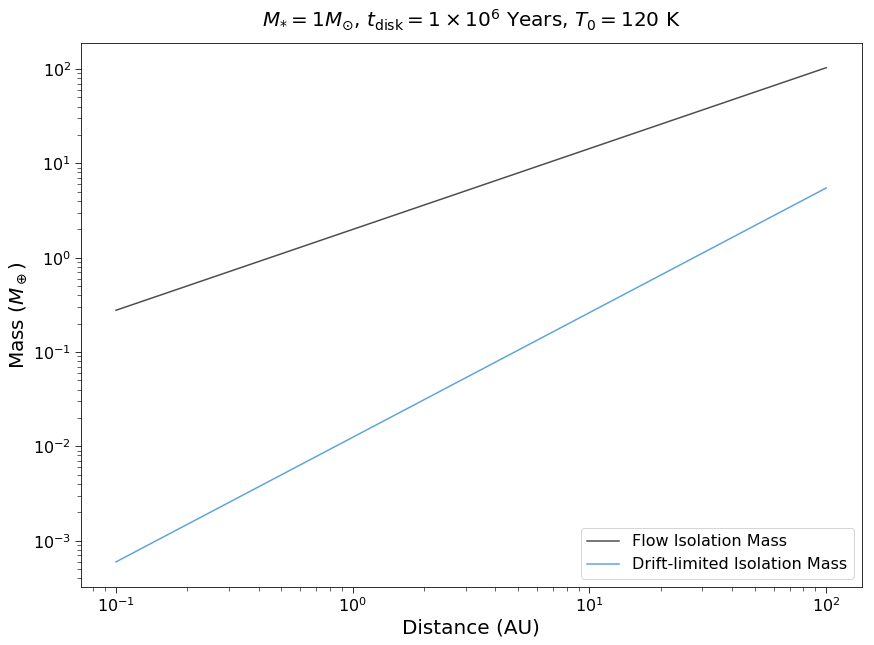

In [435]:
r_arr = np.logspace(-1,2,100)
M_max_arr = np.zeros([r_arr.size])
pre_fac_arr = np.zeros([r_arr.size])
for i in range(100):
    pre_fac_arr[i] = M_max(r_arr[i], t_d=1e6*3e7, T_0=120, m_star_sol=1)[0]
    M_max_arr[i] = 318 * M_max(r_arr[i], t_d=1e6*3e7, T_0=120, m_star_sol=1)[1]
    #M_max_arr[i] = 318* M_max(r_arr[i], T_0=200, m_star_sol=1)
plt.loglog(r_arr, M_max_arr, label='Flow Isolation Mass')
plt.loglog(r_arr, pre_fac_arr*M_max_arr, label='Drift-limited Isolation Mass')

plt.tick_params(axis='both', which='major', labelsize=16, length=6)
plt.tick_params(axis='both', which='minor', labelsize=14, length=4)
plt.xlabel('Distance (AU)', fontsize=20)
plt.ylabel('Mass ($M_\oplus$)', fontsize=20)
plt.title(r'$M_{*} = 1 M_{\odot}$, $t_{\rm{disk}} = 1 \times 10^{6}$ Years, $T_{0} = 120$ K',y=1.02, fontsize=20)
plt.legend(loc=4, prop={'size': 16})
plt.savefig('Flow_Iso_plot.pdf', dpi=800)

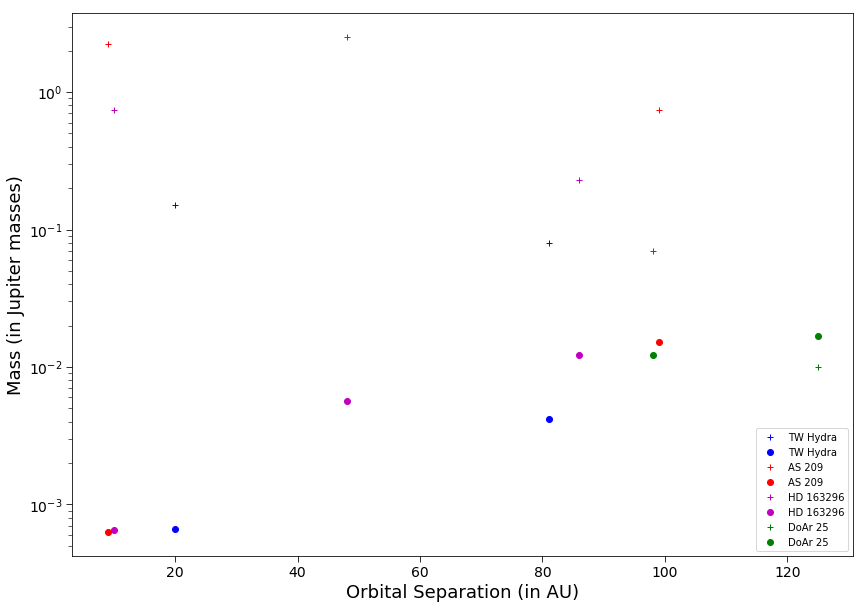

In [364]:
m_array = np.linspace(0, 2.5, 1000)
#plt.loglog(tw_hydra[:,0], tw_hydra[:,1], 'b.')
plt.semilogy(gap_data[0,0], gap_data[0,1], 'b+', label='TW Hydra')
plt.semilogy(gap_data[1,0], gap_data[1,1], 'b+')
plt.semilogy(gap_data[0,0], M_max(gap_data[0,0]), 'bo', label='TW Hydra')
plt.semilogy(gap_data[1,0], M_max(gap_data[1,0]), 'bo')
plt.semilogy(gap_data[2,0], gap_data[2,1], 'r+', label='AS 209')
plt.semilogy(gap_data[3,0], gap_data[3,1], 'r+')
plt.semilogy(gap_data[2,0], M_max(gap_data[2,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9), 'ro', label='AS 209')
plt.semilogy(gap_data[3,0], M_max(gap_data[3,0], t_d=1.6e6*3e7, T_0=131, r_crit=98, m_star_sol=0.9), 'ro')
plt.semilogy(gap_data[4,0], gap_data[4,1], 'm+', label='HD 163296')
plt.semilogy(gap_data[5,0], gap_data[5,1], 'm+')
plt.semilogy(gap_data[6,0], gap_data[6,1], 'm+')
plt.semilogy(gap_data[4,0], M_max(gap_data[4,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo', label='HD 163296')
plt.semilogy(gap_data[5,0], M_max(gap_data[5,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo')
plt.semilogy(gap_data[6,0], M_max(gap_data[6,0], t_d=5e6*3e7, T_0=284, r_crit=119, m_star_sol=2.3), 'mo')
plt.semilogy(gap_data[7,0], gap_data[7,1], 'g+', label='DoAr 25')
plt.semilogy(gap_data[8,0], gap_data[8,1], 'g+')
plt.semilogy(gap_data[7,0], M_max(gap_data[7,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1), 'go', label='DoAr 25')
plt.semilogy(gap_data[8,0], M_max(gap_data[8,0], t_d=2e6*3e7, T_0=123, r_crit=105, m_star_sol=1), 'go')
#plt.plot(m_array, m_array, 'k-')
plt.tick_params(axis='both', which='major', labelsize=14, length=6)
plt.tick_params(axis='both', which='minor', labelsize=12, length=4)
#plt.xlim(0,0.3)
#plt.ylim(0,0.3)
plt.xlabel('Orbital Separation (in AU)', fontsize=18)
plt.ylabel('Mass (in Jupiter masses)', fontsize=18)
plt.legend(loc=4)
plt.savefig('Lodato_plot.pdf', dpi=800)

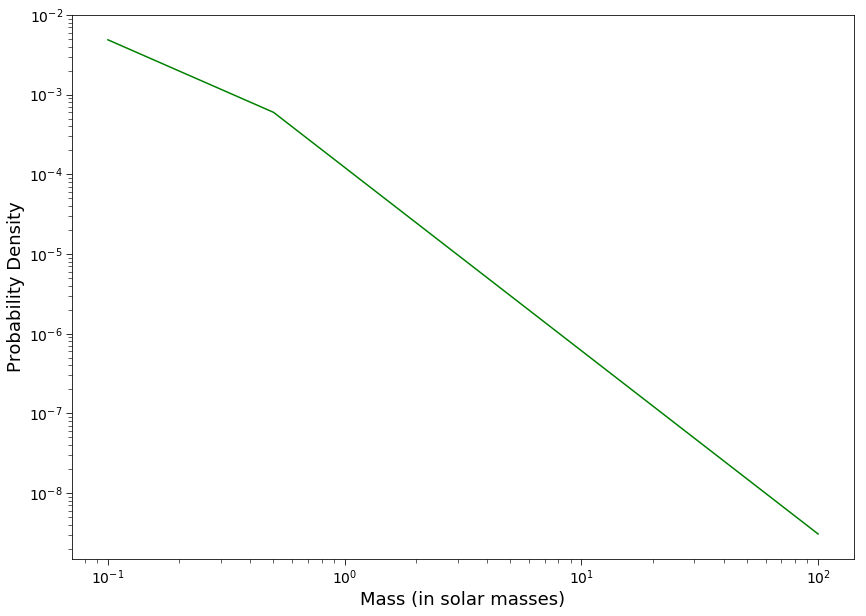

In [365]:
# Sampling Kroupa IMF
import scipy.integrate as integrate
def kroupa(m):
    norm = 0.32705769605379353 # integrated kroupa from .075 to 100
    if m < .08:
        alpha = .3
        return m**(-alpha)/norm
    elif m < .5:
        alpha = 1.3
        return .08 * m**(-alpha)/norm
    else:
        alpha = 2.3
        return .5 * .08 * m**(-alpha)/norm
def invertedKroupa(u):
    if u > kroupa(.08):
        return - np.log(u)/.3
    elif u > kroupa(.5):
        return - np.log(u)/(1.3 * .08)
    else:
        return - np.log(u)/(2.3 * .04)
    
m_array = np.logspace(-1,2,1000)
prob = np.zeros(1000)
for i in range(m_array.size):
    prob[i] = kroupa(m_array[i])
plt.rcParams["figure.figsize"] = [14,10]
plt.loglog(m_array, prob/1000,'g')
plt.tick_params(axis='both', which='major', labelsize=14, length=6)
plt.tick_params(axis='both', which='minor', labelsize=12, length=4)
plt.xlabel('Mass (in solar masses)', fontsize=18)
plt.ylabel('Probability Density', fontsize=18)
plt.savefig('IMF Plot.pdf', dpi=800)

In [366]:
# Just the gaps which infer a planet below 0.1 M_J
# T_0 = L**(2/7) * (1/(4 * sigma * pi))^(2/7) * (2/7)^(1/4) * (k/(mu * G * M))^(1/7)
small_planet_data = np.zeros([20,6]) # a, M_p, age (Myr), L_* (L_sun), M_*, M_flow
small_planet_data[0] = np.array([25, 0.02, 0.795, 2.23, 0.48, 0]) # Elias 20
small_planet_data[1] = np.array([69, 0.07, 0.8, 2.1, 0.55, 0]) # Elias 27
small_planet_data[2] = np.array([74, 0.035, 0.795, 0.3311, 0.46, 0]) # GW Lup
small_planet_data[3] = np.array([117, 0.04, 0.5, 2.33, 0.95, 0]) # IM Lup
small_planet_data[4] = np.array([29, 0.038, 10**(-0.3), 10**(0.16), 0.63, 0]) # RU Lup
small_planet_data[5] = np.array([39, 0.006, 10**(-0.3), 10**(-0.69), 0.17, 0]) # Sz 114
small_planet_data[6] = np.array([41, 0.008, 10**(0.6), 10**(-0.36), 0.83, 0]) # Sz 129
small_planet_data[7] = np.array([69, 0.002, 0.5, 0.11, 0.25, 0]) # GY 91
small_planet_data[8] = np.array([43.41, 0.077, 4.5, 6.3, 2.04, 0]) # RY Tau
small_planet_data[9] = np.array([69.05, 0.023, 3, 1.60, 1.016 + 0.294, 0]) # UZ Tau E
# DON'T TRUST THESE AGES
small_planet_data[10] = np.array([49.29, 0.009, .1, 10**(-0.14), 0.55, 0]) # DN Tau
small_planet_data[11] = np.array([58.91, 0.057, .1, 10**(-0.41), 0.42, 0]) # GO Tau
small_planet_data[12] = np.array([86.99, 0.07, .1, 10**(-0.41), 0.42, 0]) # GO Tau
small_planet_data[13] = np.array([41.15, 0.065, .1, 10**(-0.26), 10**(-0.36), 0]) # IQ Tau
small_planet_data[14] = np.array([39.29, 0.11, .1, 10**(0.11), 0.92, 0]) # DL Tau
small_planet_data[15] = np.array([66.95, 0.08, .1, 10**(0.11), 0.92, 0]) # DL Tau

for i in range(15):
    L = small_planet_data[i,3] * 3.848e33
    M = small_planet_data[i,4] * fn.m_sun
    T_0 = (L/(4 * 5.67e-5 * np.pi))**(2./7) * (2/7)**(1/4) * (fn.k/(fn.mu * fn.G * M))**(1/7) * (1.496e13)**(-3/7)
    print(T_0)
    small_planet_data[i,3] = T_0

small_planet_data[16] = np.array([98, 0.07, 2, 123, 1, 0]) # DoAr 25 (T_0 instead of L_sun)
small_planet_data[17] = np.array([125, 0.01, 2, 123, 1, 0]) # DoAr 25
small_planet_data[18] = np.array([20, 0.15, 5, 82, 0.8, 0]) # TW Hya
small_planet_data[19] = np.array([20, 0.15, 5, 82, 0.8, 0]) # TW Hya

159.8605427530037
154.11408845478454
93.2634710224634
146.8350781043288
135.8527904615618
93.6443658768323
92.76662820494558
74.26931320229893
174.9197205951519
125.96665434041425
113.70503239185325
98.93895401768013
98.93895401768013
108.60041854802995
124.53470055942087


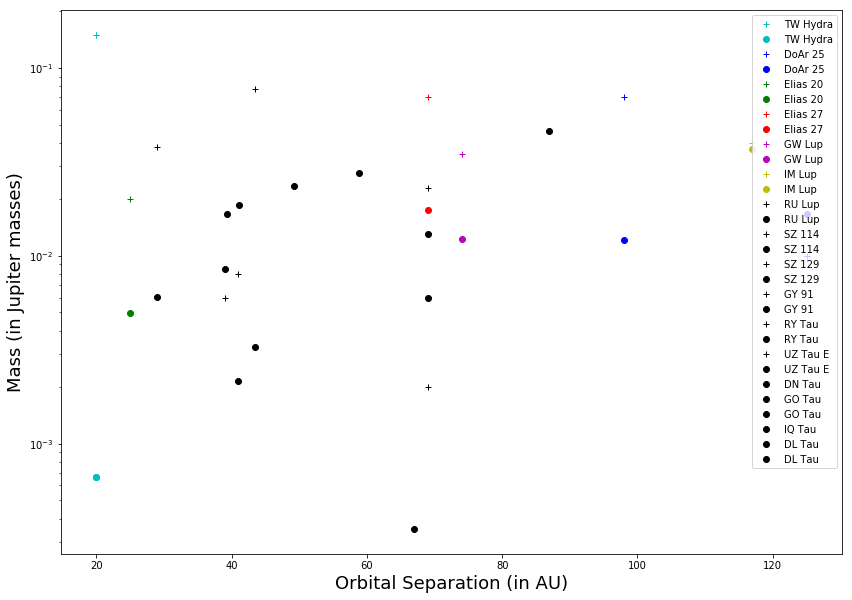

In [367]:
m_array = np.linspace(0, 2.5, 1000)
#plt.loglog(tw_hydra[:,0], tw_hydra[:,1], 'b.')
plt.semilogy(small_planet_data[18,0], small_planet_data[18,1], 'c+', label='TW Hydra')
plt.semilogy(small_planet_data[19,0], small_planet_data[19,1], 'c+')
small_planet_data[18,5] = M_max(small_planet_data[18,0])
small_planet_data[19,5] = M_max(small_planet_data[19,0])
plt.semilogy(small_planet_data[18,0], small_planet_data[18,5], 'co', label='TW Hydra')
plt.semilogy(small_planet_data[19,0], small_planet_data[19,5], 'co')
plt.semilogy(small_planet_data[16,0], small_planet_data[16,1], 'b+', label='DoAr 25')
plt.semilogy(small_planet_data[17,0], small_planet_data[17,1], 'b+')
small_planet_data[16,5] = M_max(small_planet_data[16,0], t_d=small_planet_data[16,2]*1e6*3e7, T_0=small_planet_data[16,3], r_crit=105, m_star_sol=1)
small_planet_data[17,5] = M_max(small_planet_data[17,0], t_d=small_planet_data[17,2]*1e6*3e7, T_0=small_planet_data[17,3], r_crit=105, m_star_sol=1)
plt.semilogy(small_planet_data[16,0], small_planet_data[16,5], 'bo', label='DoAr 25')
plt.semilogy(small_planet_data[17,0], small_planet_data[17,5], 'bo')

plt.semilogy(small_planet_data[0,0], small_planet_data[0,1], 'g+', label='Elias 20')
small_planet_data[0,5] = M_max(small_planet_data[0,0],t_d=small_planet_data[0,2]*1e6*3e7,T_0=small_planet_data[0,3],r_crit=57,m_star_sol=small_planet_data[0,4])
plt.semilogy(small_planet_data[0,0], small_planet_data[0,5], 'go', label='Elias 20')
plt.semilogy(small_planet_data[1,0], small_planet_data[1,1], 'r+', label='Elias 27')
small_planet_data[1,5] = M_max(small_planet_data[1,0], t_d=small_planet_data[1,2]*1e6*3e7, T_0=small_planet_data[1,3], r_crit=40, m_star_sol=small_planet_data[1,4])
plt.semilogy(small_planet_data[1,0], small_planet_data[1,5], 'ro', label='Elias 27')
plt.semilogy(small_planet_data[2,0], small_planet_data[2,1], 'm+', label='GW Lup')
small_planet_data[2,5] = M_max(small_planet_data[2,0], t_d=small_planet_data[2,2]*1e6*3e7, T_0=small_planet_data[2,3], r_crit=40, m_star_sol=small_planet_data[2,4])
plt.semilogy(small_planet_data[2,0], small_planet_data[2,5], 'mo', label='GW Lup')
plt.semilogy(small_planet_data[3,0], small_planet_data[3,1], 'y+', label='IM Lup')
small_planet_data[3,5] = M_max(small_planet_data[3,0], t_d=small_planet_data[3,2]*1e6*3e7, T_0=small_planet_data[3,3], r_crit=40, m_star_sol=small_planet_data[3,4])
plt.semilogy(small_planet_data[3,0], small_planet_data[3,5], 'yo', label='IM Lup')
plt.semilogy(small_planet_data[4,0], small_planet_data[4,1], 'k+', label='RU Lup')
small_planet_data[4,5] = M_max(small_planet_data[4,0], t_d=small_planet_data[4,2]*1e6*3e7, T_0=small_planet_data[4,3], r_crit=40, m_star_sol=small_planet_data[4,4])
plt.semilogy(small_planet_data[4,0], small_planet_data[4,5], 'ko', label='RU Lup')
plt.semilogy(small_planet_data[5,0], small_planet_data[5,1], 'k+', label='SZ 114')
small_planet_data[5,5] = M_max(small_planet_data[5,0], t_d=small_planet_data[5,2]*1e6*3e7, T_0=small_planet_data[5,3], r_crit=40, m_star_sol=small_planet_data[5,4])
plt.semilogy(small_planet_data[5,0], small_planet_data[5,5], 'ko', label='SZ 114')
plt.semilogy(small_planet_data[6,0], small_planet_data[6,1], 'k+', label='SZ 129')
small_planet_data[6,5] = M_max(small_planet_data[6,0], t_d=small_planet_data[6,2]*1e6*3e7, T_0=small_planet_data[6,3], r_crit=40, m_star_sol=small_planet_data[6,4])
plt.semilogy(small_planet_data[6,0], small_planet_data[6,5], 'ko', label='SZ 129')
plt.semilogy(small_planet_data[7,0], small_planet_data[7,1], 'k+', label='GY 91')
small_planet_data[7,5] = M_max(small_planet_data[7,0], t_d=small_planet_data[7,2]*1e6*3e7, T_0=small_planet_data[7,3], r_crit=40, m_star_sol=small_planet_data[7,4])
plt.semilogy(small_planet_data[7,0], small_planet_data[7,5], 'ko', label='GY 91')
plt.semilogy(small_planet_data[8,0], small_planet_data[8,1], 'k+', label='RY Tau')
small_planet_data[8,5] = M_max(small_planet_data[8,0], t_d=small_planet_data[8,2]*1e6*3e7, T_0=small_planet_data[8,3], r_crit=40, m_star_sol=small_planet_data[8,4])
plt.semilogy(small_planet_data[8,0], small_planet_data[8,5], 'ko', label='RY Tau')
plt.semilogy(small_planet_data[9,0], small_planet_data[9,1], 'k+', label='UZ Tau E')
small_planet_data[9,5] = M_max(small_planet_data[9,0], t_d=small_planet_data[9,2]*1e6*3e7, T_0=small_planet_data[9,3], r_crit=40, m_star_sol=small_planet_data[9,4])
plt.semilogy(small_planet_data[9,0], small_planet_data[9,5], 'ko', label='UZ Tau E')

# Now, the disks where we're guessing t_disk = 1 Myr
small_planet_data[10,5] = M_max(small_planet_data[10,0], t_d=small_planet_data[10,2]*1e6*3e7, T_0=small_planet_data[10,3], r_crit=40, m_star_sol=small_planet_data[10,4])
small_planet_data[11,5] = M_max(small_planet_data[11,0], t_d=small_planet_data[11,2]*1e6*3e7, T_0=small_planet_data[11,3], r_crit=40, m_star_sol=small_planet_data[11,4])
small_planet_data[12,5] = M_max(small_planet_data[12,0], t_d=small_planet_data[12,2]*1e6*3e7, T_0=small_planet_data[12,3], r_crit=40, m_star_sol=small_planet_data[12,4])
small_planet_data[13,5] = M_max(small_planet_data[13,0], t_d=small_planet_data[13,2]*1e6*3e7, T_0=small_planet_data[13,3], r_crit=40, m_star_sol=small_planet_data[13,4])
small_planet_data[14,5] = M_max(small_planet_data[14,0], t_d=small_planet_data[14,2]*1e6*3e7, T_0=small_planet_data[14,3], r_crit=40, m_star_sol=small_planet_data[14,4])
small_planet_data[15,5] = M_max(small_planet_data[15,0], t_d=small_planet_data[15,2]*1e6*3e7, T_0=small_planet_data[15,3], r_crit=40, m_star_sol=small_planet_data[15,4])
plt.semilogy(small_planet_data[10,0], small_planet_data[10,5], 'ko', label='DN Tau')
plt.semilogy(small_planet_data[11,0], small_planet_data[11,5], 'ko', label='GO Tau')
plt.semilogy(small_planet_data[12,0], small_planet_data[12,5], 'ko', label='GO Tau')
plt.semilogy(small_planet_data[13,0], small_planet_data[13,5], 'ko', label='IQ Tau')
plt.semilogy(small_planet_data[14,0], small_planet_data[14,5], 'ko', label='DL Tau')
plt.semilogy(small_planet_data[15,0], small_planet_data[15,5], 'ko', label='DL Tau')

plt.xlabel('Orbital Separation (in AU)', fontsize=18)
plt.ylabel('Mass (in Jupiter masses)', fontsize=18)
plt.legend()
plt.show()

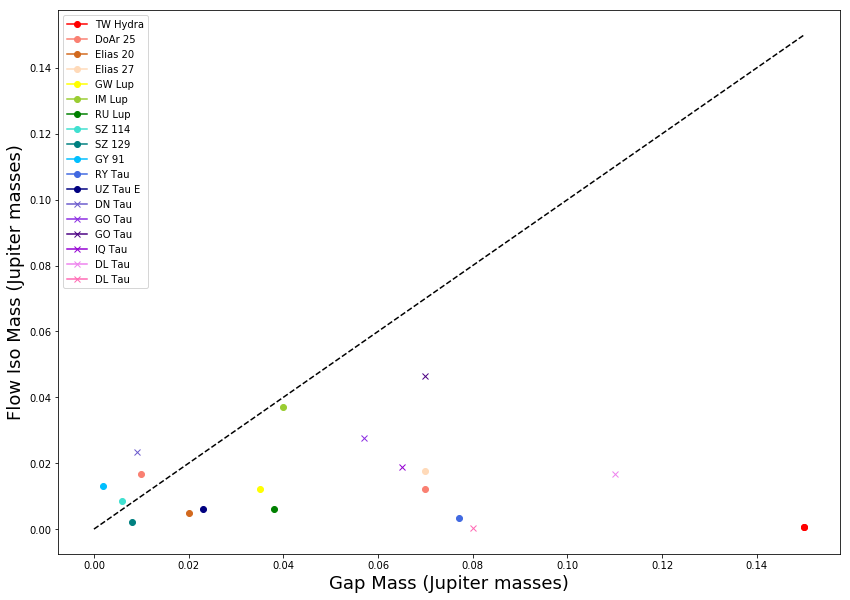

In [368]:
m_array = np.linspace(0, 0.15, 1000)
plt.plot(m_array, m_array, 'k--')
#plt.loglog(tw_hydra[:,0], tw_hydra[:,1], 'b.')
plt.plot(small_planet_data[18,1], small_planet_data[18,5], 'red', marker='o', label='TW Hydra')
plt.plot(small_planet_data[19,1], small_planet_data[19,5], 'red', marker='o')
plt.plot(small_planet_data[16,1], small_planet_data[16,5], 'salmon', marker='o', label='DoAr 25')
plt.plot(small_planet_data[17,1], small_planet_data[17,5], 'salmon', marker='o')

plt.plot(small_planet_data[0,1], small_planet_data[0,5], 'chocolate', marker='o', label='Elias 20')
plt.plot(small_planet_data[1,1], small_planet_data[1,5], 'peachpuff', marker='o', label='Elias 27')
plt.plot(small_planet_data[2,1], small_planet_data[2,5], 'yellow', marker='o', label='GW Lup')
plt.plot(small_planet_data[3,1], small_planet_data[3,5], 'yellowgreen', marker='o', label='IM Lup')
plt.plot(small_planet_data[4,1], small_planet_data[4,5], 'green', marker='o', label='RU Lup')
plt.plot(small_planet_data[5,1], small_planet_data[5,5], 'turquoise', marker='o', label='SZ 114')
plt.plot(small_planet_data[6,1], small_planet_data[6,5], 'teal', marker='o', label='SZ 129')
plt.plot(small_planet_data[7,1], small_planet_data[7,5], 'deepskyblue', marker='o', label='GY 91')
plt.plot(small_planet_data[8,1], small_planet_data[8,5], 'royalblue', marker='o', label='RY Tau')
plt.plot(small_planet_data[9,1], small_planet_data[9,5], 'navy', marker='o', label='UZ Tau E')

plt.plot(small_planet_data[10,1], small_planet_data[10,5], 'slateblue', marker='x', label='DN Tau')
plt.plot(small_planet_data[11,1], small_planet_data[11,5], 'blueviolet', marker='x', label='GO Tau')
plt.plot(small_planet_data[12,1], small_planet_data[12,5], 'indigo', marker='x', label='GO Tau')
plt.plot(small_planet_data[13,1], small_planet_data[13,5], 'darkviolet', marker='x', label='IQ Tau')
plt.plot(small_planet_data[14,1], small_planet_data[14,5], 'violet', marker='x', label='DL Tau')
plt.plot(small_planet_data[15,1], small_planet_data[15,5], 'hotpink', marker='x', label='DL Tau')

plt.ylabel('Flow Iso Mass (Jupiter masses)', fontsize=18)
plt.xlabel('Gap Mass (Jupiter masses)', fontsize=18)
plt.legend()
plt.show()